# NO_CHANGE with GRIDSEARCH_CV on ADM0, MONTHLY

In [1]:
import pandas as pd
# pd.set_option('display.max_rows', 500)
# pd.set_option('display.max_columns', 500)

import warnings
warnings.simplefilter('ignore')

import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)
    
import time
import datetime

import os

## Model Specifications

In [2]:
TARGET_VARIABLE = "SUM(FATALITIES)"
SEASONAL_PERIODICITY = 12 # for data frequency & seasonality

SEASONALITY = False
NEIGHBORS = False
SOCIO_ECO_VARS = False # X
N_LAGS_X = 1 # todo: remove or change behavior from max lags to lag
DIM_REDUCTION_METHOD = "PCA"

CV_FOLDS = 1 

In [3]:
MODEL_NAME = "NO_CHANGE"

if SEASONAL_PERIODICITY == 12:
    MODEL_NAME += "_MONTHLY"
elif SEASONAL_PERIODICITY == 4:
    MODEL_NAME += "_QUARTERLY"

MODEL_NAME

'NO_CHANGE_MONTHLY'

### Hyperparameter Grid

## Model Training

In [4]:
from common_functions import *
from forecasters import *

#### Training Method

In [5]:
def varimax(target_variable="SUM(FATALITIES)", 
            target_country="MLI", 
            predictor_countries=["BFA"], 
            n_lags_X = N_LAGS_X, 
            seasonal_periodicity = SEASONAL_PERIODICITY):
    
    ### GET DATA
    y, X = getData(target_variable = target_variable, 
                   target_country = target_country, 
                   predictor_countries = predictor_countries,
                   socio_eco_vars = SOCIO_ECO_VARS,
                   n_lags_X = N_LAGS_X, 
                   seasonal_periodicity = SEASONAL_PERIODICITY)
    
    ### SPLIT DATA
    X_train, X_test, y_train, y_test = train_test_split(y=y,
                                                        X=X, 
                                                        forecast_horizon=SEASONAL_PERIODICITY)
    
    ### TRAINING WITH NO CHANGE
    model = NoChange().fit(X_train, y_train)
                    
    ### PREDICTION
    prediction_results = model.evaluate_model(X_test, y_test, fh = SEASONAL_PERIODICITY)
    
    ### ADJUST RESULT DF
    prediction_results["GID_0"] = target_country
    prediction_results["MONTH"] = pd.to_datetime(prediction_results["MONTH"].astype(str)) 
    print(prediction_results)

    return prediction_results

#### Automated Training for all 234 Countries 

In [6]:
acled_monthly_adm0 = pd.read_csv("../../data/TB003_EVENT_OUTCOMES_MONTHLY_START_DATE.csv")
gid0_neighbors = pd.read_csv("../../data/GID_0_Neighbours.csv")
# gid_list = acled_monthly_adm0["GID_0"].unique()[::-1] #reverse
gid_list = acled_monthly_adm0["GID_0"].unique()
len(gid_list)

234

######## ABW (1/234) #########
0
Neighbor countries: []
Getting Data for ABW
IMF, WB, ACLED loaded
adjusting y for lags
adjusting X for lags
GET DATA finished.
X: (38, 0)
y: (38, 1)
------------------------------------------------
           0
MONTH       
2021-03  0.0
2021-04  0.0
2021-05  0.0
2021-06  0.0
2021-07  0.0
2021-08  0.0
2021-09  0.0
2021-10  0.0
2021-11  0.0
2021-12  0.0
2022-01  0.0
2022-02  0.0
         SUM(FATALITIES)_ABW
MONTH                       
2021-03                  0.0
2021-04                  0.0
2021-05                  0.0
2021-06                  0.0
2021-07                  0.0
2021-08                  0.0
2021-09                  0.0
2021-10                  0.0
2021-11                  0.0
2021-12                  0.0
2022-01                  0.0
2022-02                  0.0


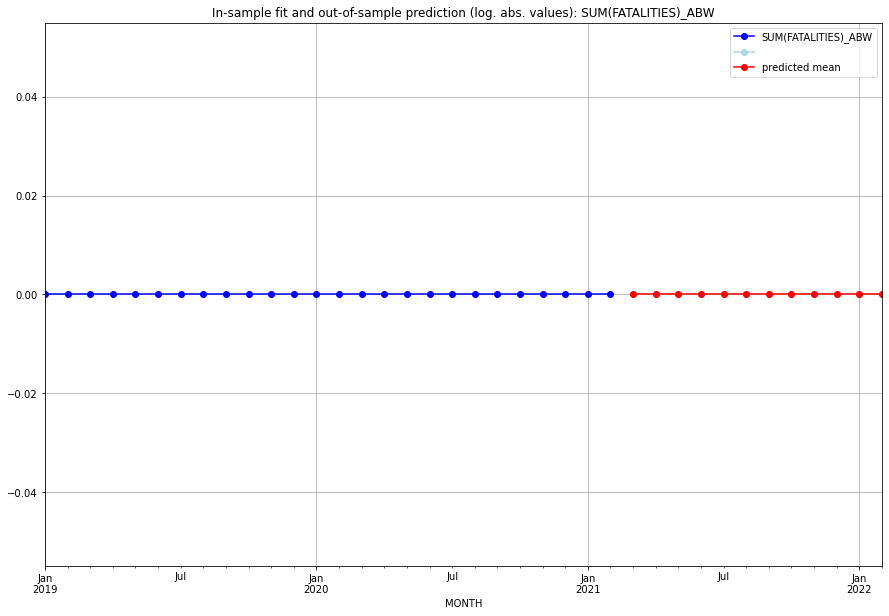

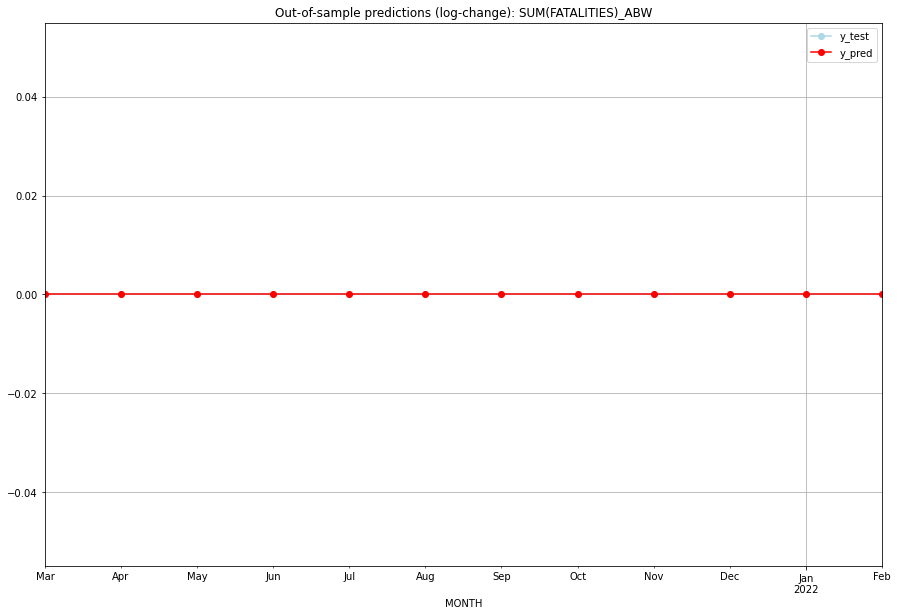

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

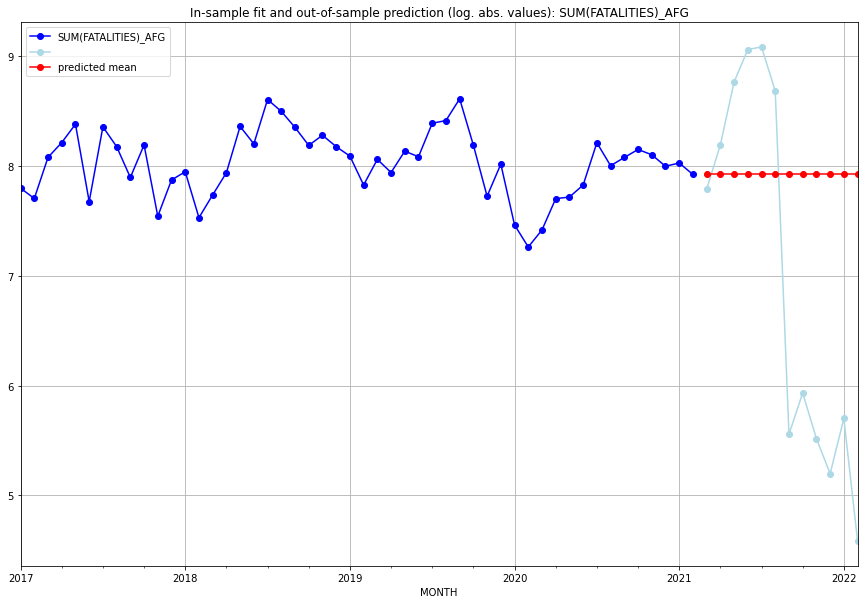

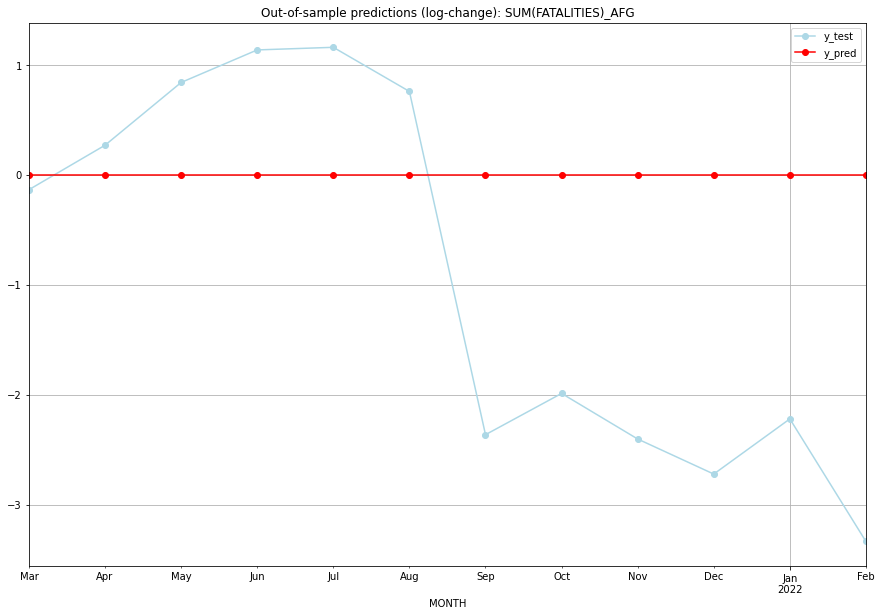

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  7.921173    7.786136           0.0       -0.135036
1   2021-04  7.921173    8.190632           0.0        0.269459
2   2021-05  7.921173    8.761707           0.0        0.840534
3   2021-06  7.921173    9.057772           0.0        1.136599
4   2021-07  7.921173    9.081597           0.0        1.160425
5   2021-08  7.921173    8.680162           0.0        0.758989
6   2021-09  7.921173    5.556828           0.0       -2.364345
7   2021-10  7.921173    5.932245           0.0       -1.988928
8   2021-11  7.921173    5.517453           0.0       -2.403720
9   2021-12  7.921173    5.198497           0.0       -2.722676
10  2022-01  7.921173    5.700444           0.0       -2.220729
11  2022-02  7.921173    4.584967           0.0       -3.336205
TADDA: 1.6114703762442668
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  7.921173    7.786136           0.0

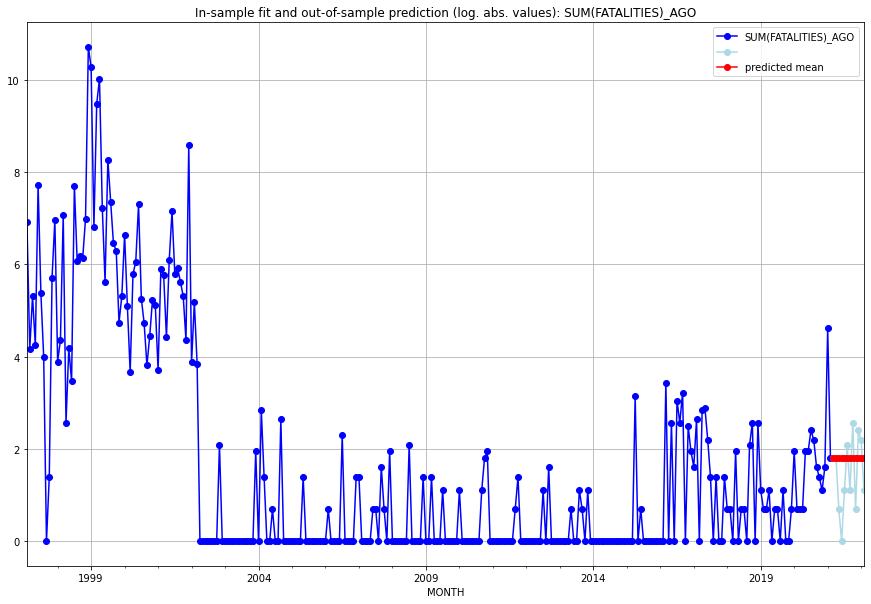

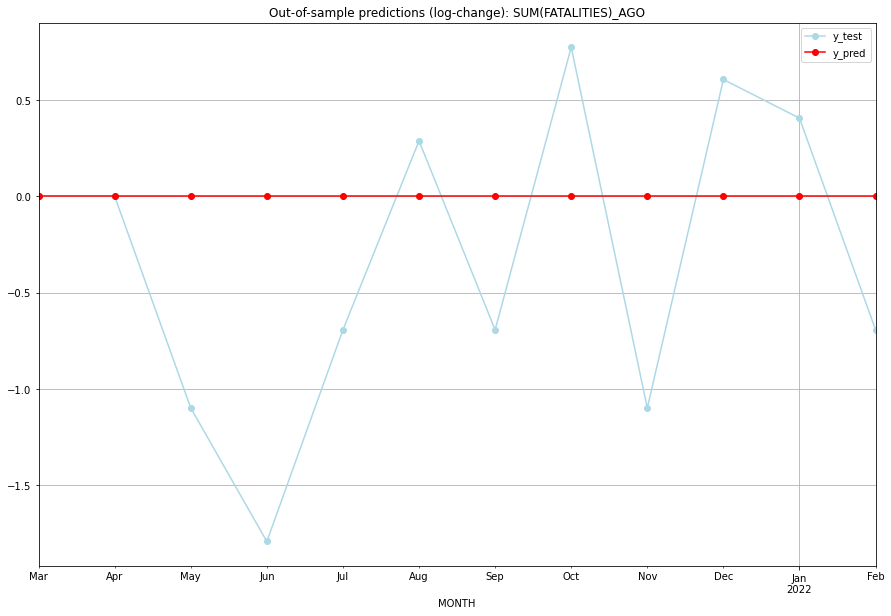

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.791759    1.791759           0.0        0.000000
1   2021-04  1.791759    1.791759           0.0        0.000000
2   2021-05  1.791759    0.693147           0.0       -1.098612
3   2021-06  1.791759    0.000000           0.0       -1.791759
4   2021-07  1.791759    1.098612           0.0       -0.693147
5   2021-08  1.791759    2.079442           0.0        0.287682
6   2021-09  1.791759    1.098612           0.0       -0.693147
7   2021-10  1.791759    2.564949           0.0        0.773190
8   2021-11  1.791759    0.693147           0.0       -1.098612
9   2021-12  1.791759    2.397895           0.0        0.606136
10  2022-01  1.791759    2.197225           0.0        0.405465
11  2022-02  1.791759    1.098612           0.0       -0.693147
TADDA: 0.6784082050506545
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.791759    1.791759           0.0

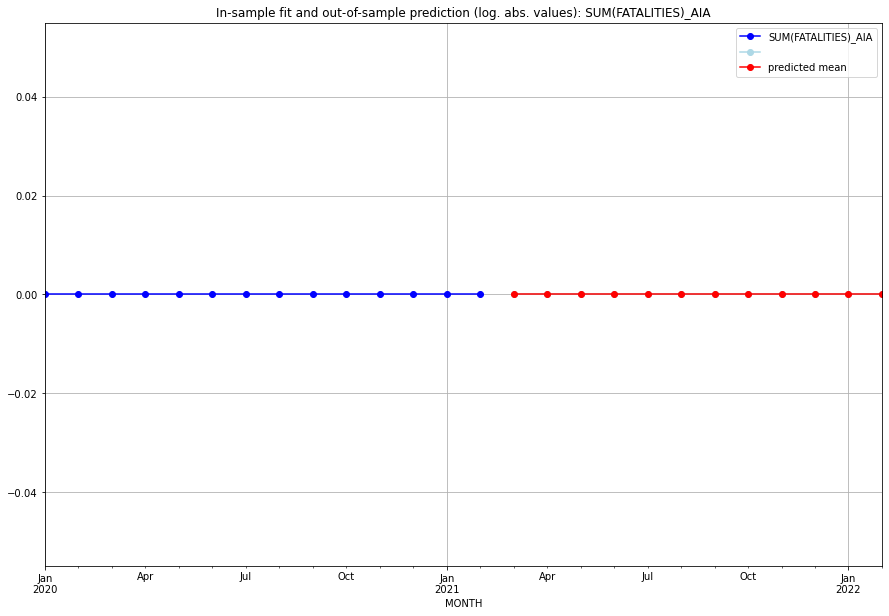

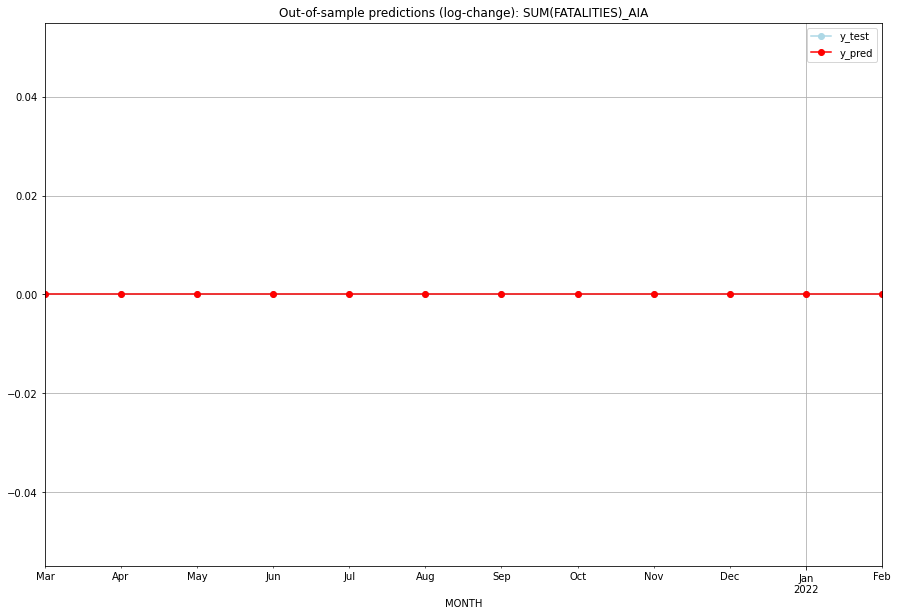

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

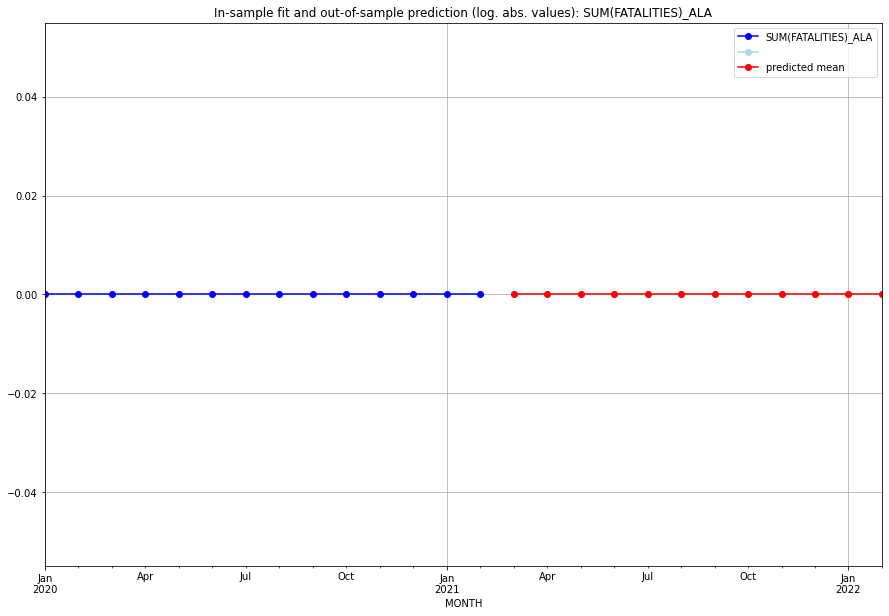

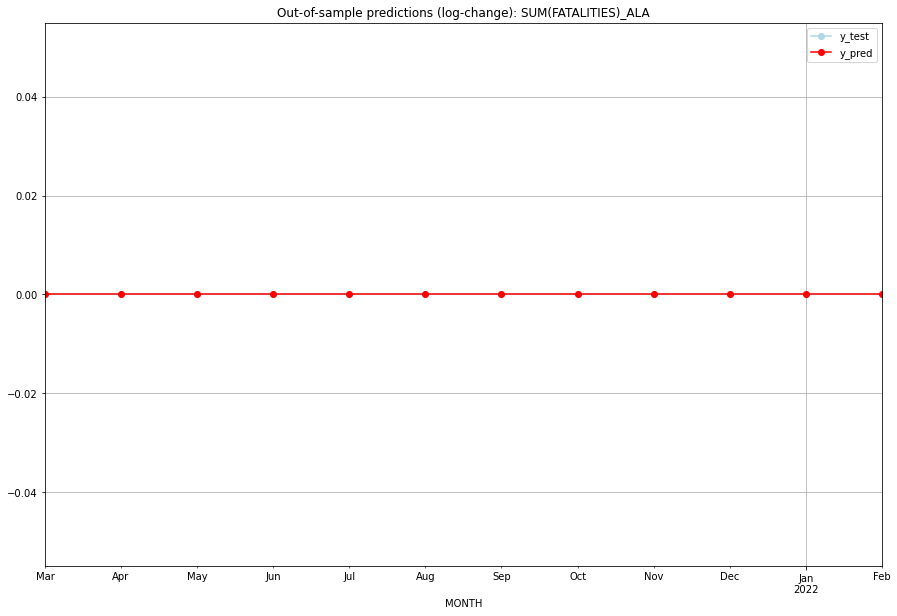

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

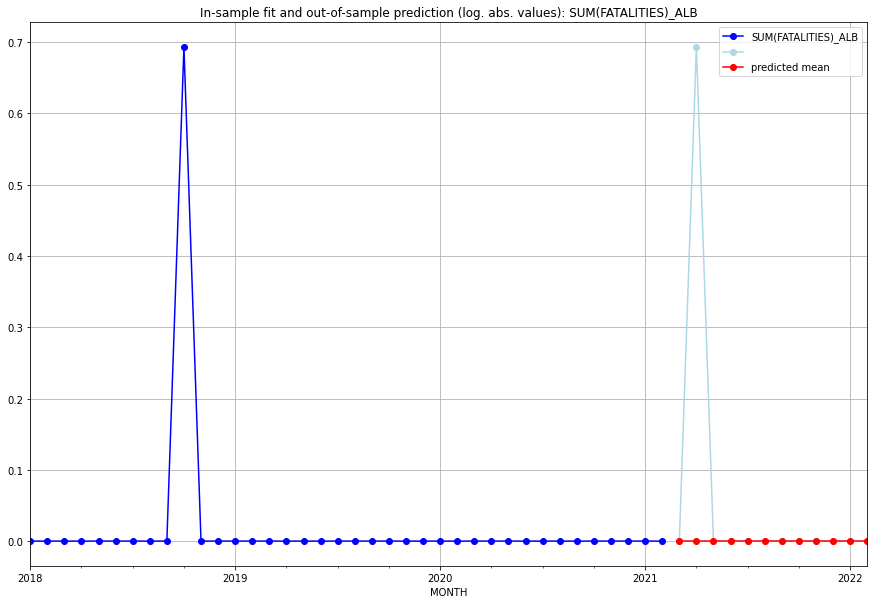

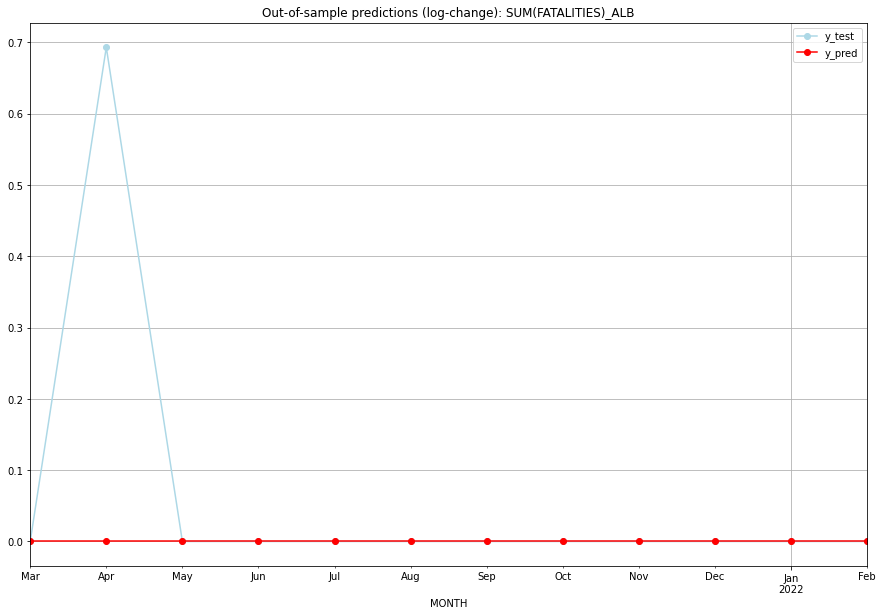

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.693147           0.0        0.693147
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

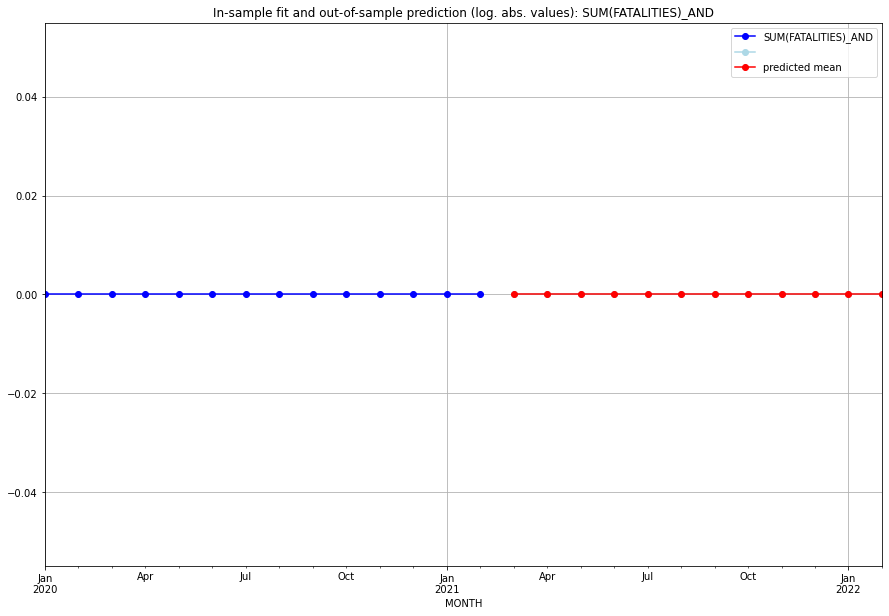

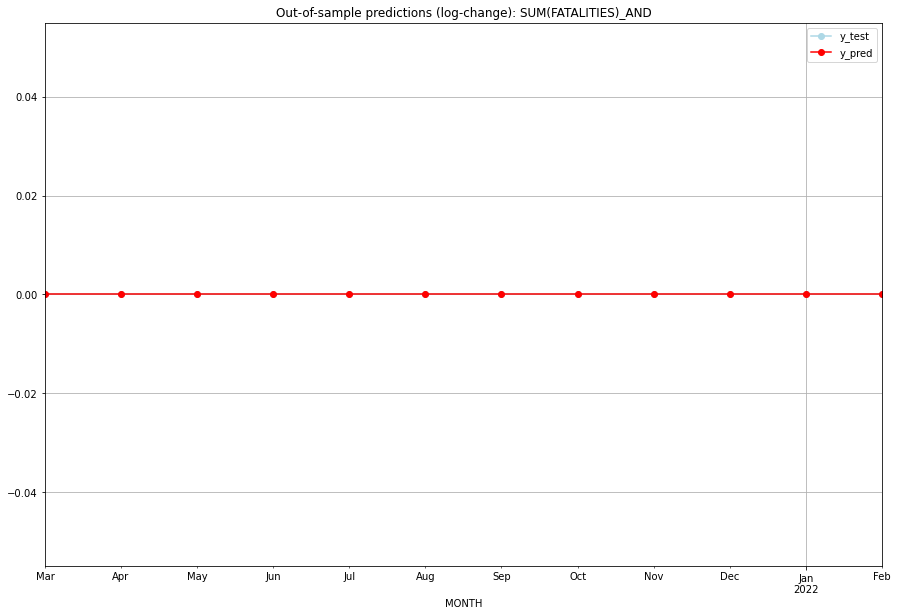

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

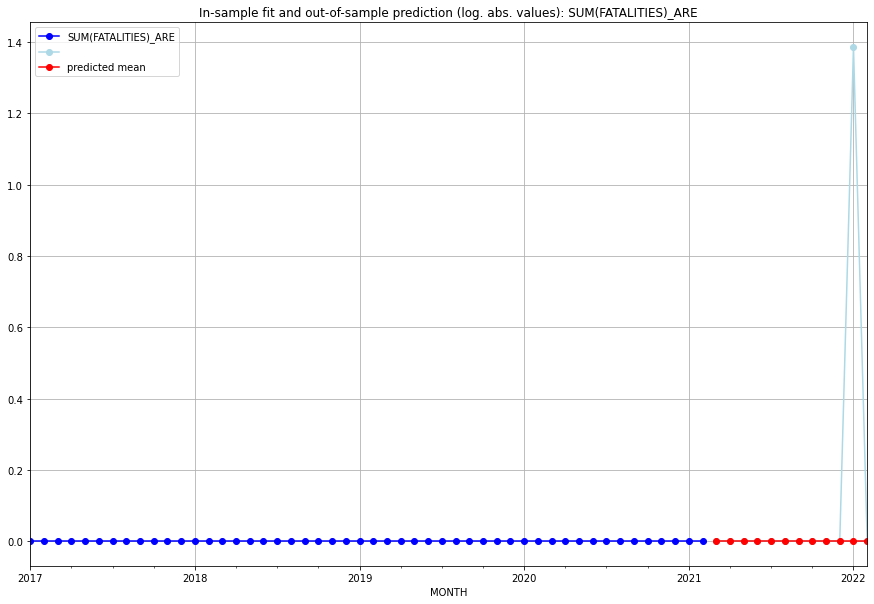

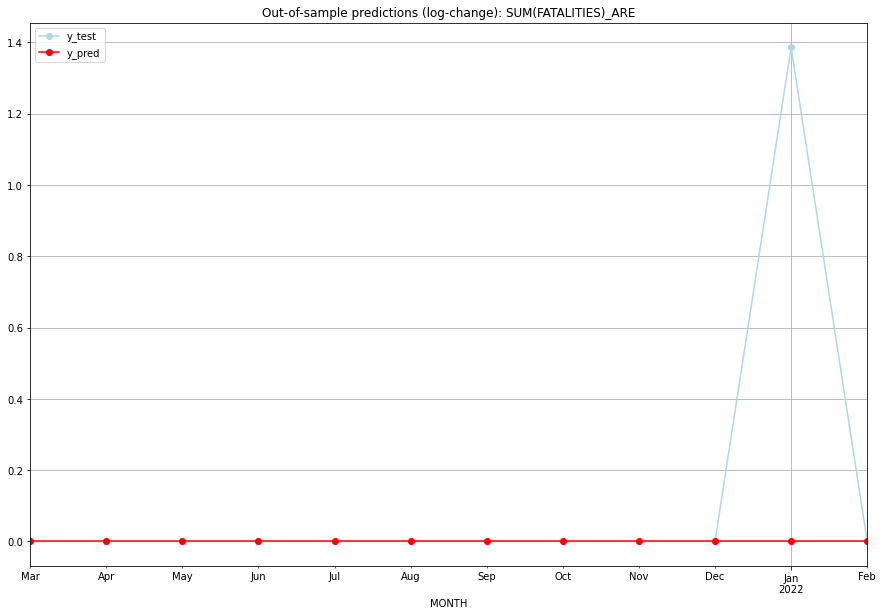

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    1.386294           0.0        1.386294
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.11552453009332421
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

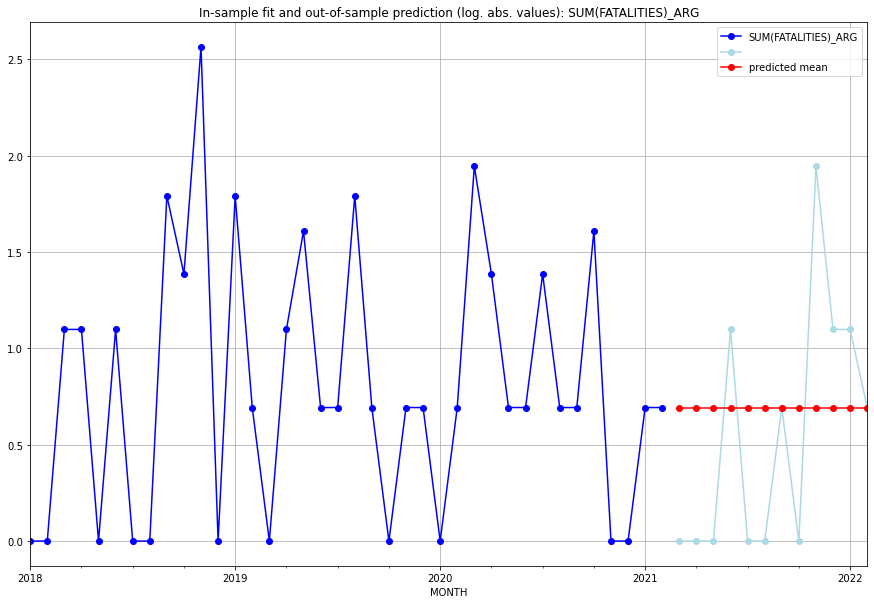

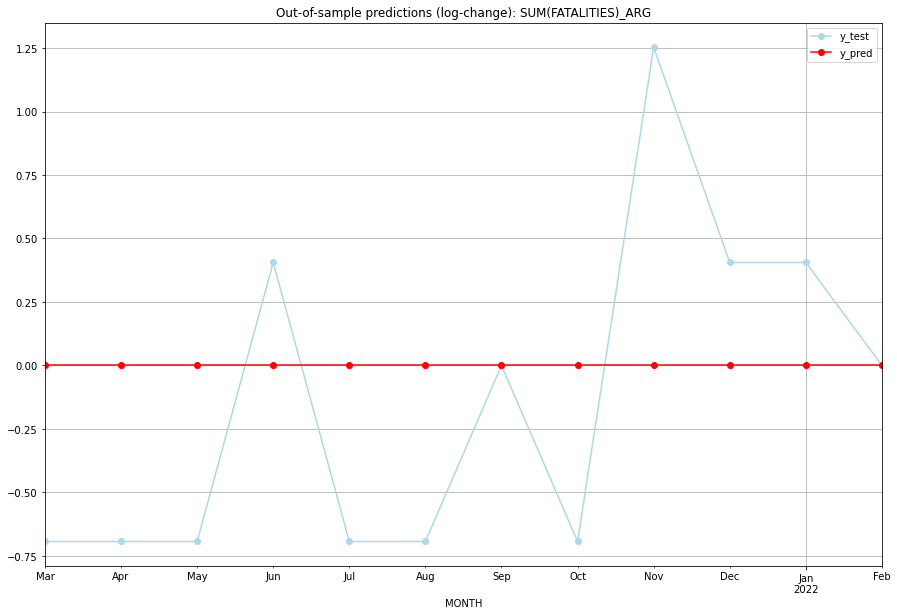

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  0.693147    0.000000           0.0       -0.693147
1   2021-04  0.693147    0.000000           0.0       -0.693147
2   2021-05  0.693147    0.000000           0.0       -0.693147
3   2021-06  0.693147    1.098612           0.0        0.405465
4   2021-07  0.693147    0.000000           0.0       -0.693147
5   2021-08  0.693147    0.000000           0.0       -0.693147
6   2021-09  0.693147    0.693147           0.0        0.000000
7   2021-10  0.693147    0.000000           0.0       -0.693147
8   2021-11  0.693147    1.945910           0.0        1.252763
9   2021-12  0.693147    1.098612           0.0        0.405465
10  2022-01  0.693147    1.098612           0.0        0.405465
11  2022-02  0.693147    0.693147           0.0        0.000000
TADDA: 0.5523367813482944
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  0.693147    0.000000           0.0

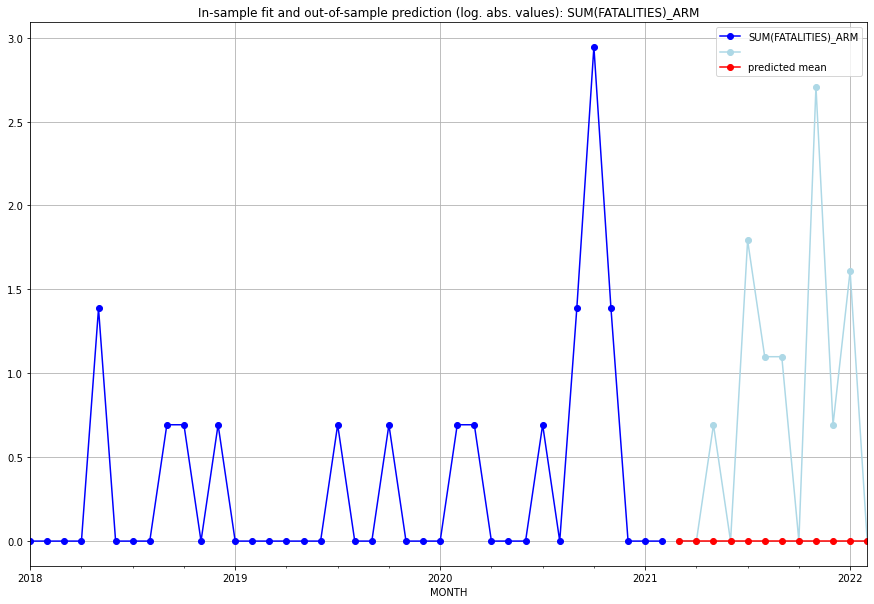

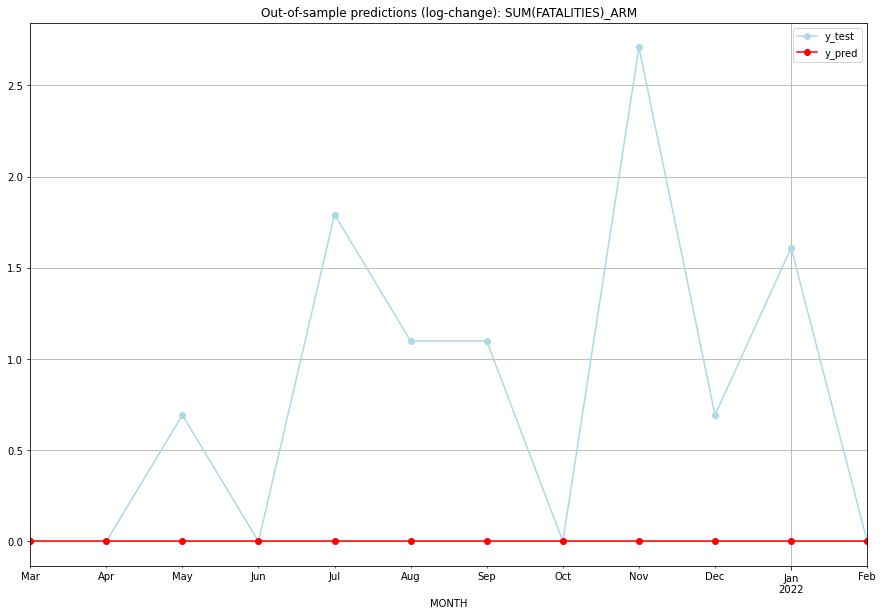

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.693147           0.0        0.693147
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    1.791759           0.0        1.791759
5   2021-08       0.0    1.098612           0.0        1.098612
6   2021-09       0.0    1.098612           0.0        1.098612
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    2.708050           0.0        2.708050
9   2021-12       0.0    0.693147           0.0        0.693147
10  2022-01       0.0    1.609438           0.0        1.609438
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.8077305434350398
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0

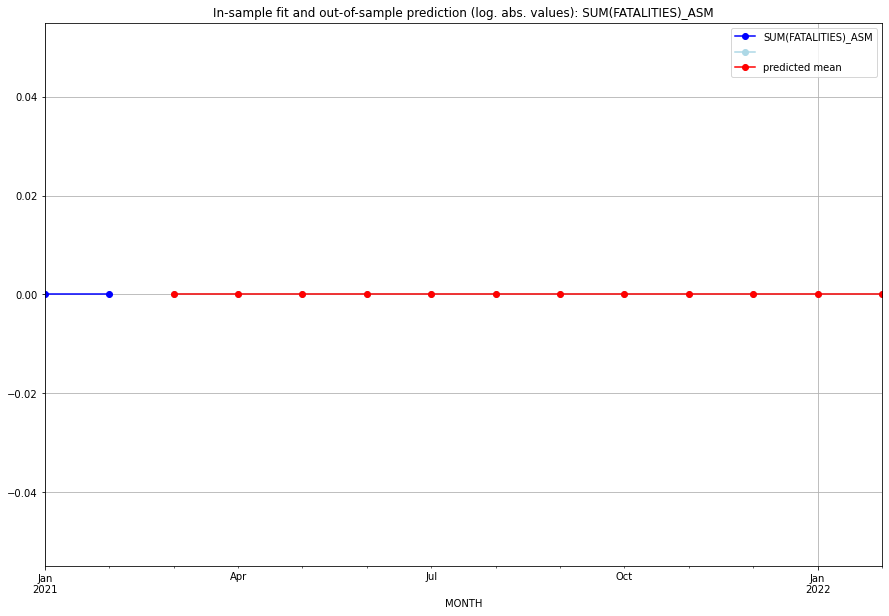

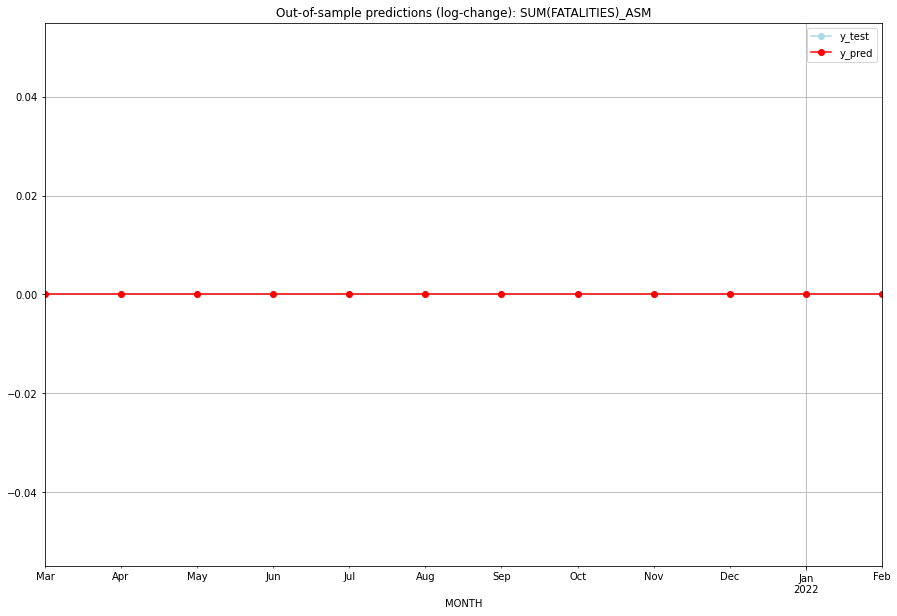

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

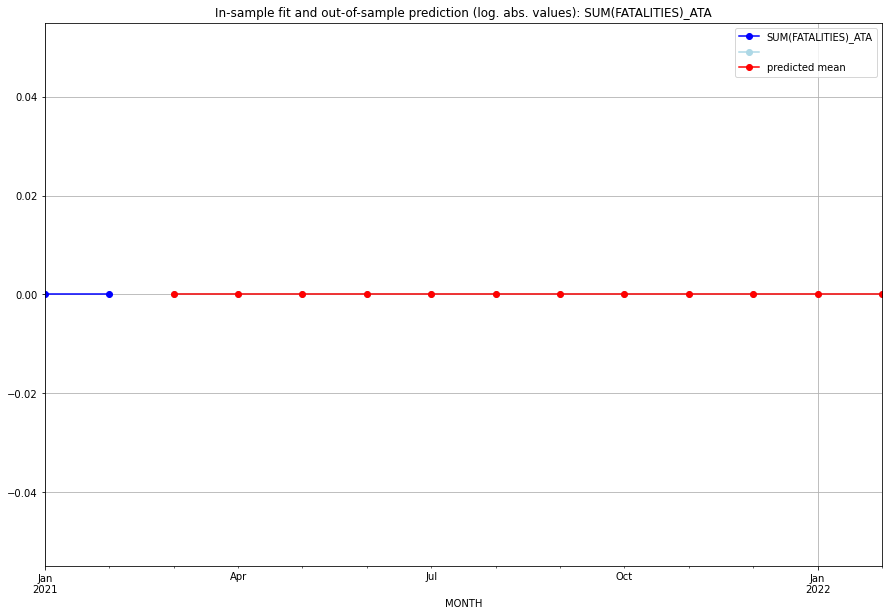

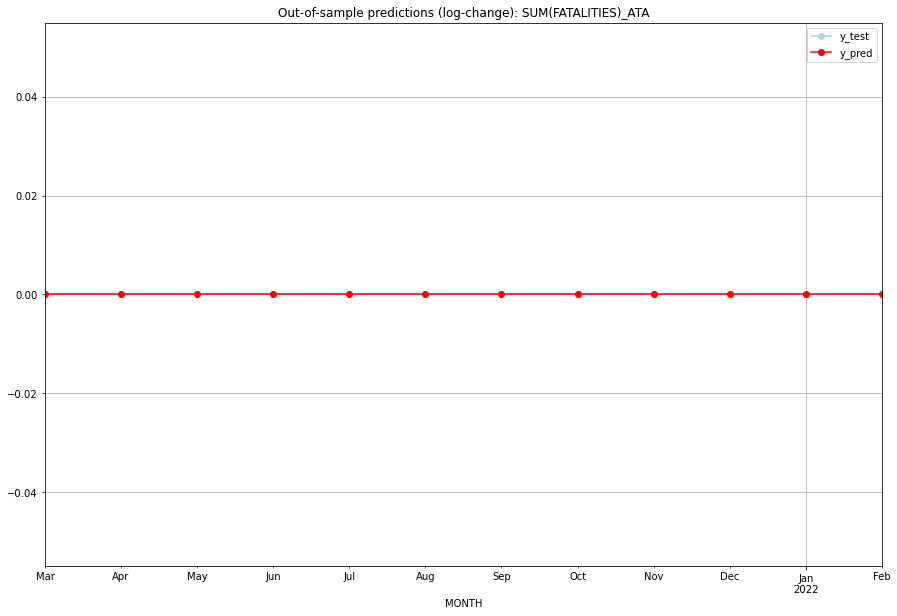

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

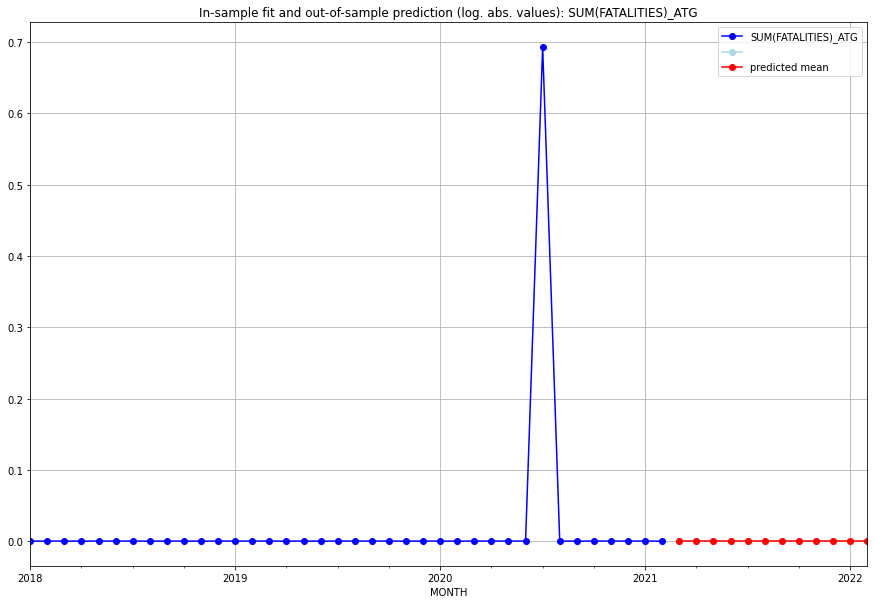

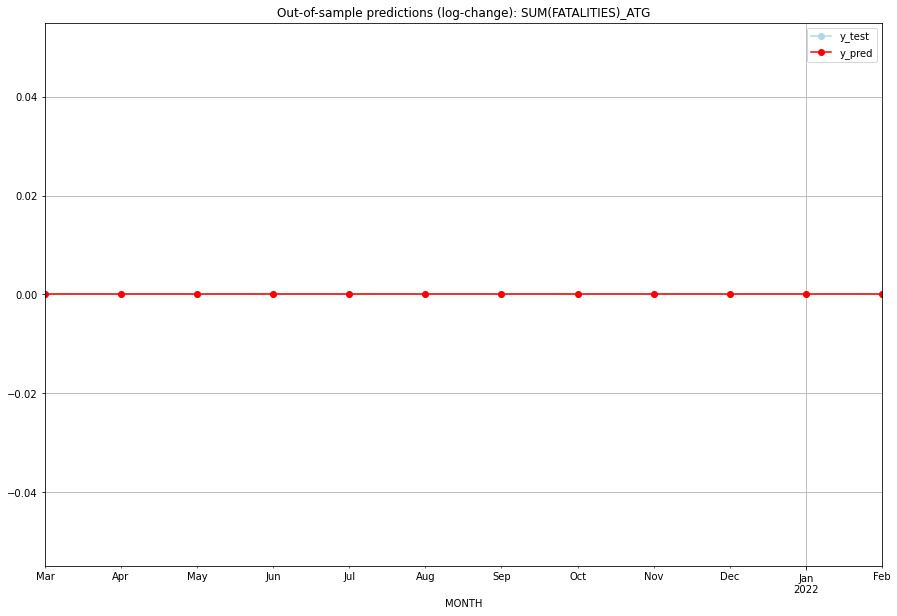

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

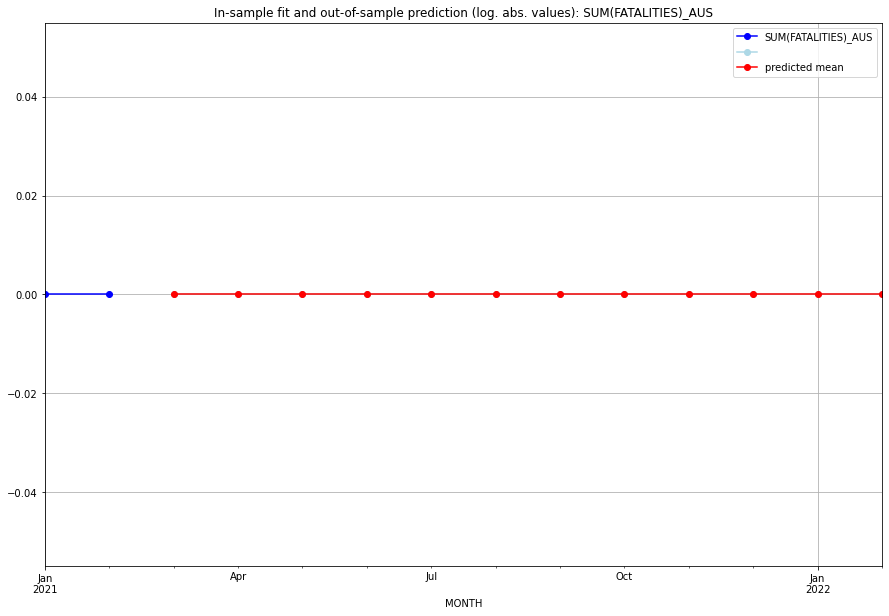

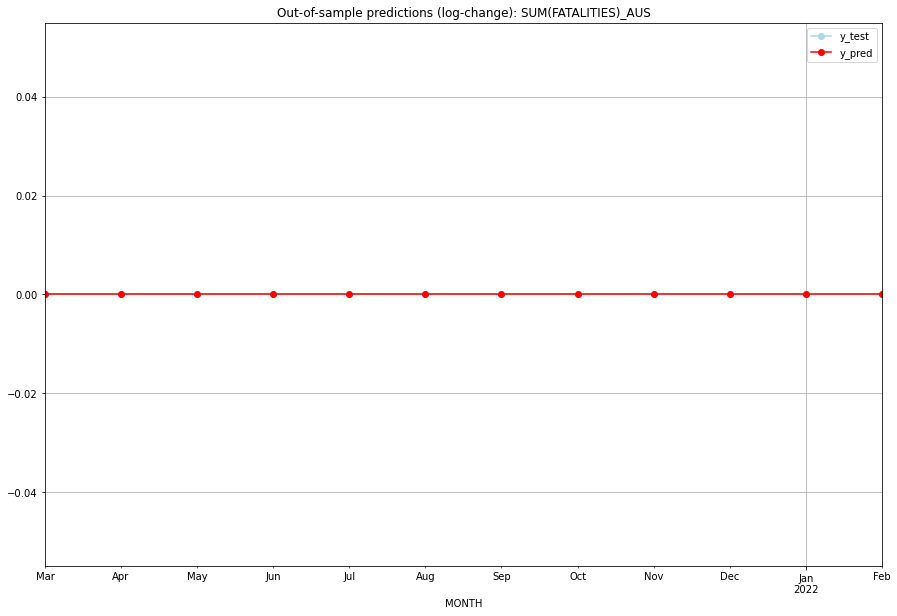

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

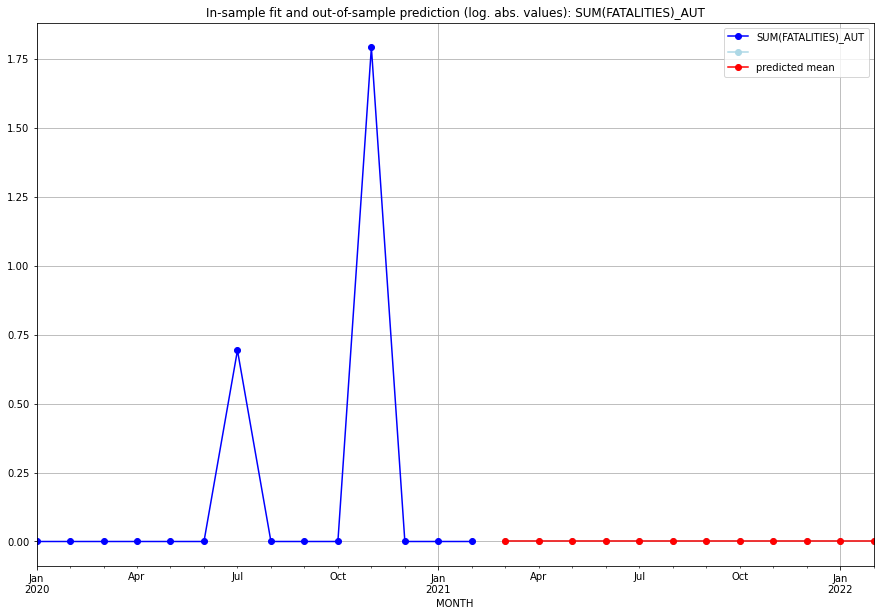

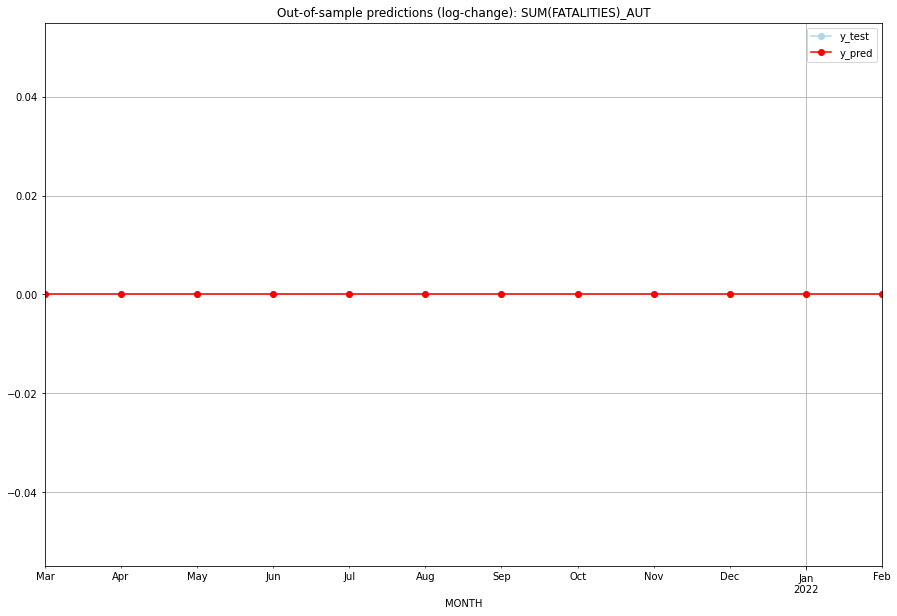

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

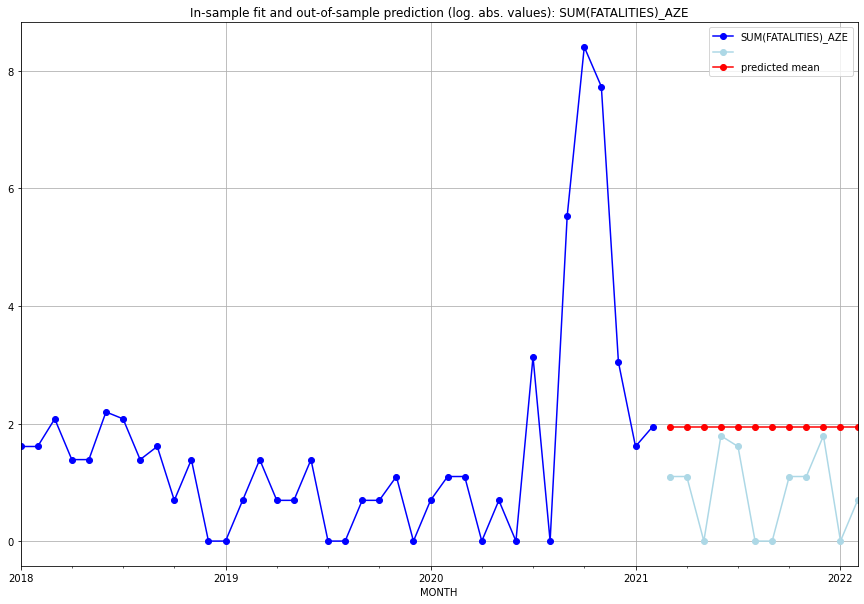

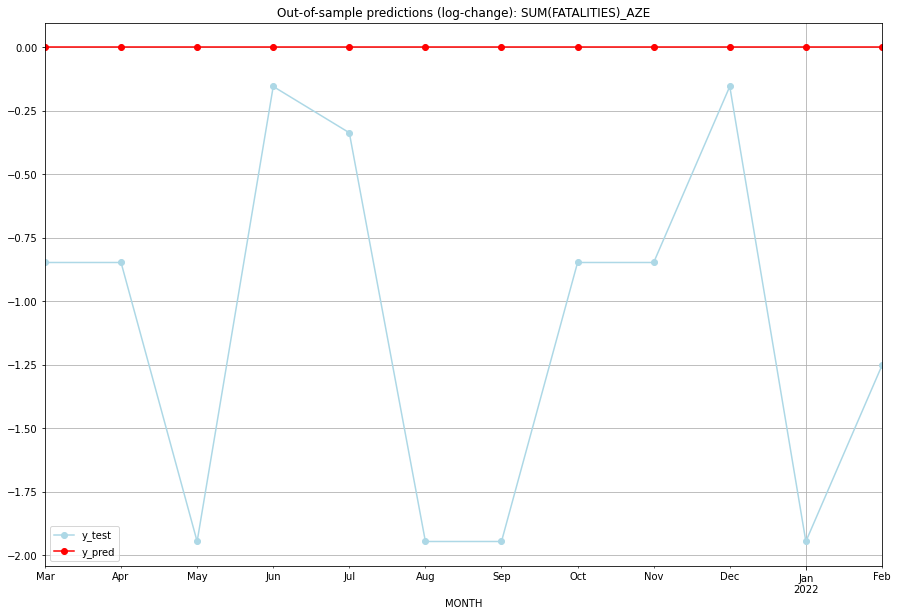

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03   1.94591    1.098612           0.0       -0.847298
1   2021-04   1.94591    1.098612           0.0       -0.847298
2   2021-05   1.94591    0.000000           0.0       -1.945910
3   2021-06   1.94591    1.791759           0.0       -0.154151
4   2021-07   1.94591    1.609438           0.0       -0.336472
5   2021-08   1.94591    0.000000           0.0       -1.945910
6   2021-09   1.94591    0.000000           0.0       -1.945910
7   2021-10   1.94591    1.098612           0.0       -0.847298
8   2021-11   1.94591    1.098612           0.0       -0.847298
9   2021-12   1.94591    1.791759           0.0       -0.154151
10  2022-01   1.94591    0.000000           0.0       -1.945910
11  2022-02   1.94591    0.693147           0.0       -1.252763
TADDA: 1.0891973835450965
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01   1.94591    1.098612           0.0

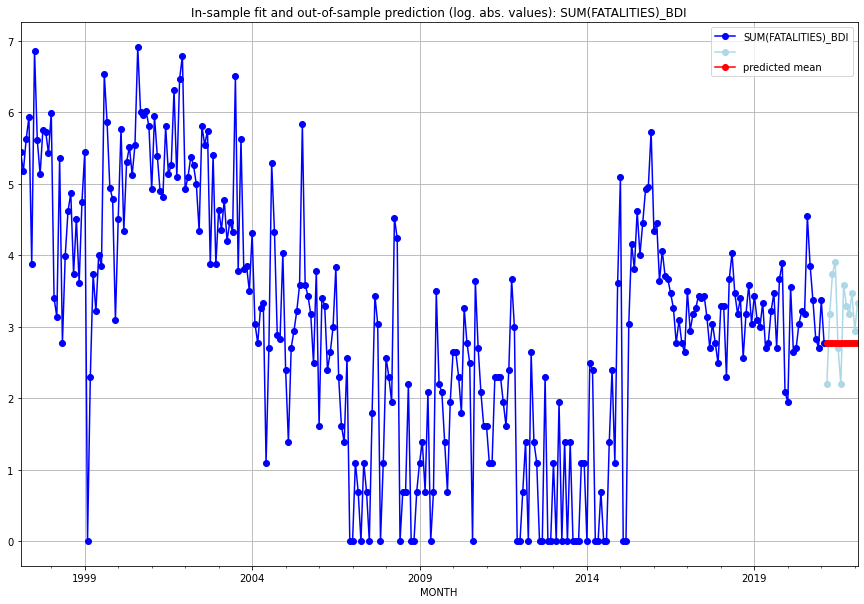

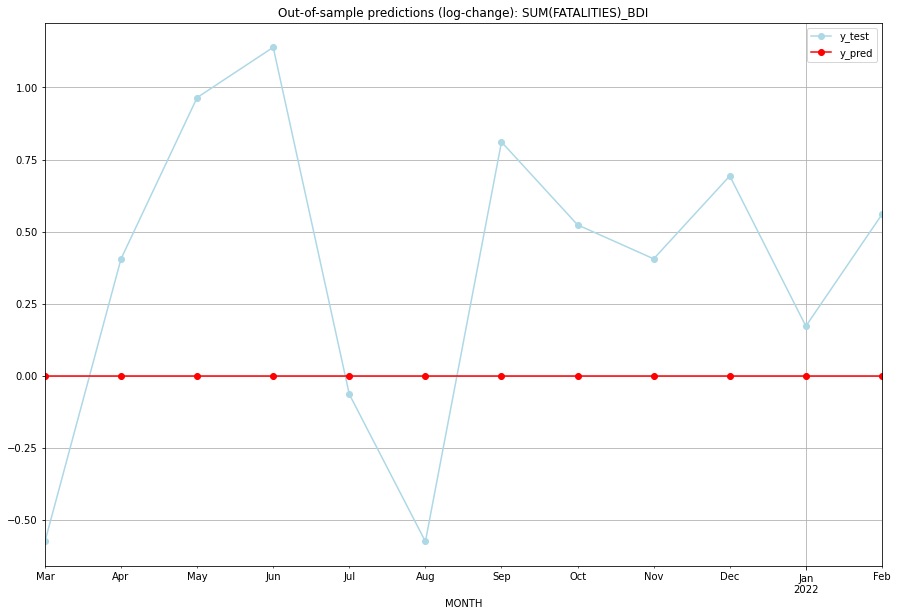

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  2.772589    2.197225           0.0       -0.575364
1   2021-04  2.772589    3.178054           0.0        0.405465
2   2021-05  2.772589    3.737670           0.0        0.965081
3   2021-06  2.772589    3.912023           0.0        1.139434
4   2021-07  2.772589    2.708050           0.0       -0.064539
5   2021-08  2.772589    2.197225           0.0       -0.575364
6   2021-09  2.772589    3.583519           0.0        0.810930
7   2021-10  2.772589    3.295837           0.0        0.523248
8   2021-11  2.772589    3.178054           0.0        0.405465
9   2021-12  2.772589    3.465736           0.0        0.693147
10  2022-01  2.772589    2.944439           0.0        0.171850
11  2022-02  2.772589    3.332205           0.0        0.559616
TADDA: 0.5741253159829899
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  2.772589    2.197225           0.0

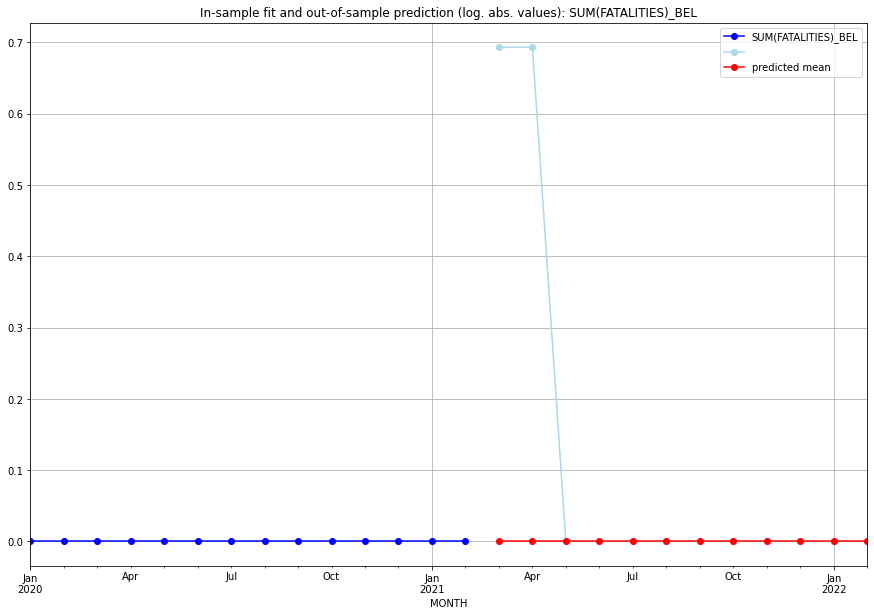

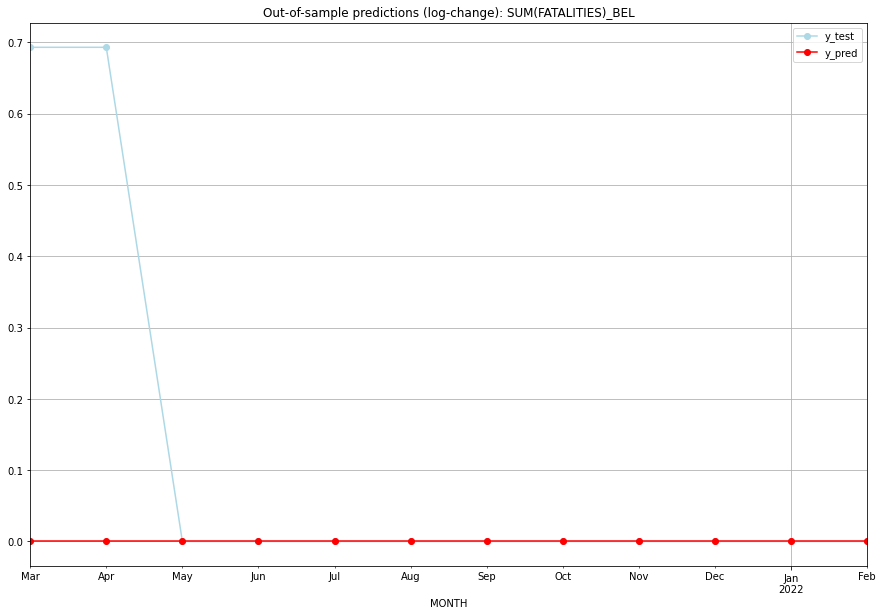

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.693147           0.0        0.693147
1   2021-04       0.0    0.693147           0.0        0.693147
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.11552453009332421
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.693147           0.

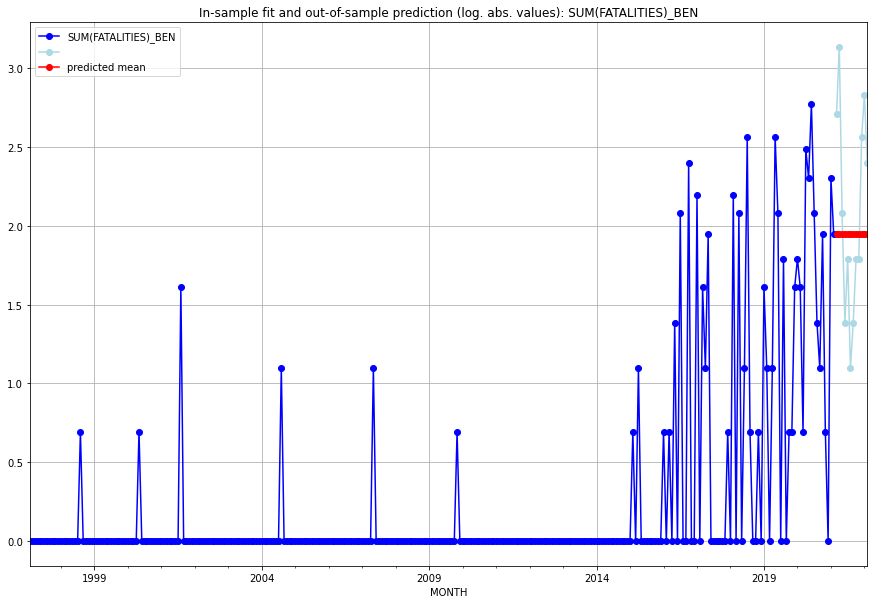

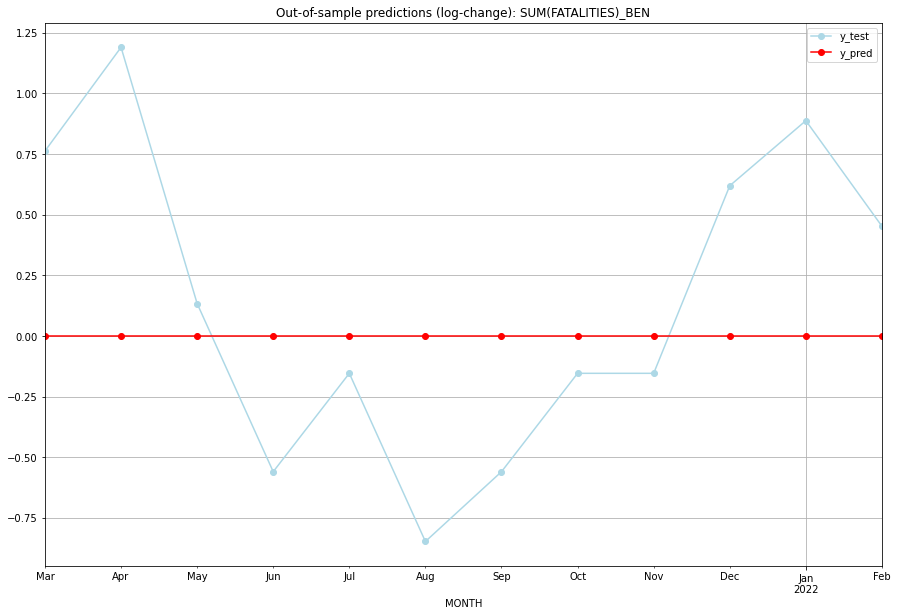

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03   1.94591    2.708050           0.0        0.762140
1   2021-04   1.94591    3.135494           0.0        1.189584
2   2021-05   1.94591    2.079442           0.0        0.133531
3   2021-06   1.94591    1.386294           0.0       -0.559616
4   2021-07   1.94591    1.791759           0.0       -0.154151
5   2021-08   1.94591    1.098612           0.0       -0.847298
6   2021-09   1.94591    1.386294           0.0       -0.559616
7   2021-10   1.94591    1.791759           0.0       -0.154151
8   2021-11   1.94591    1.791759           0.0       -0.154151
9   2021-12   1.94591    2.564949           0.0        0.619039
10  2022-01   1.94591    2.833213           0.0        0.887303
11  2022-02   1.94591    2.397895           0.0        0.451985
TADDA: 0.5393803762029387
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01   1.94591    2.708050           0.0

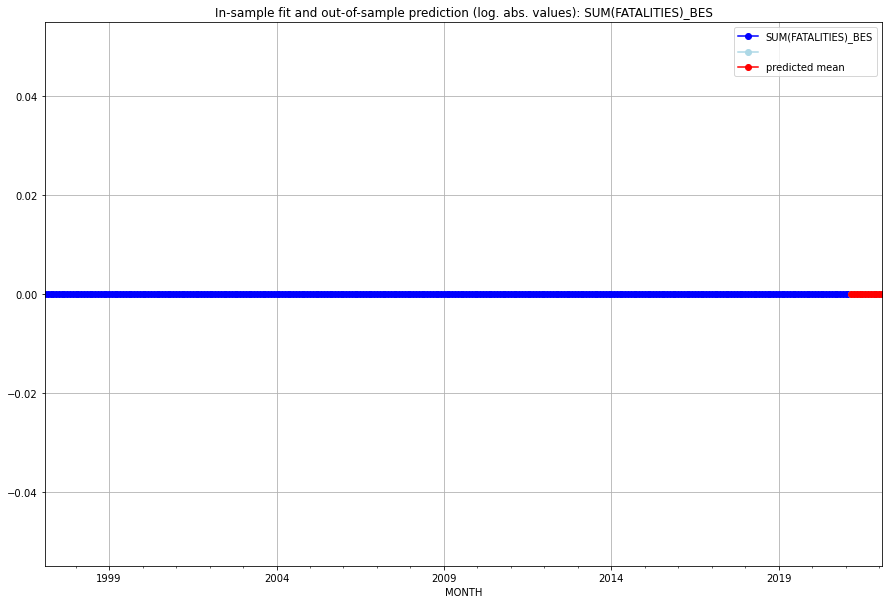

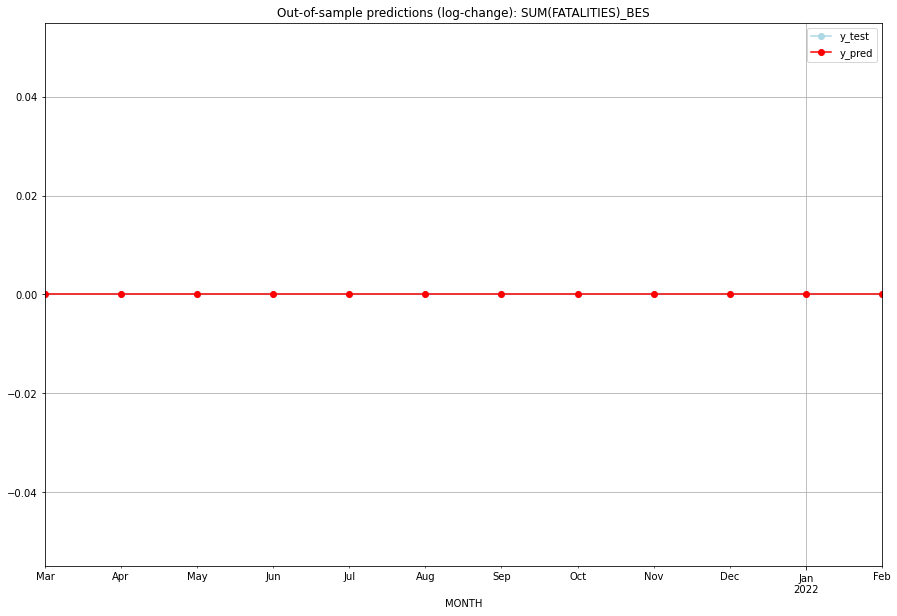

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

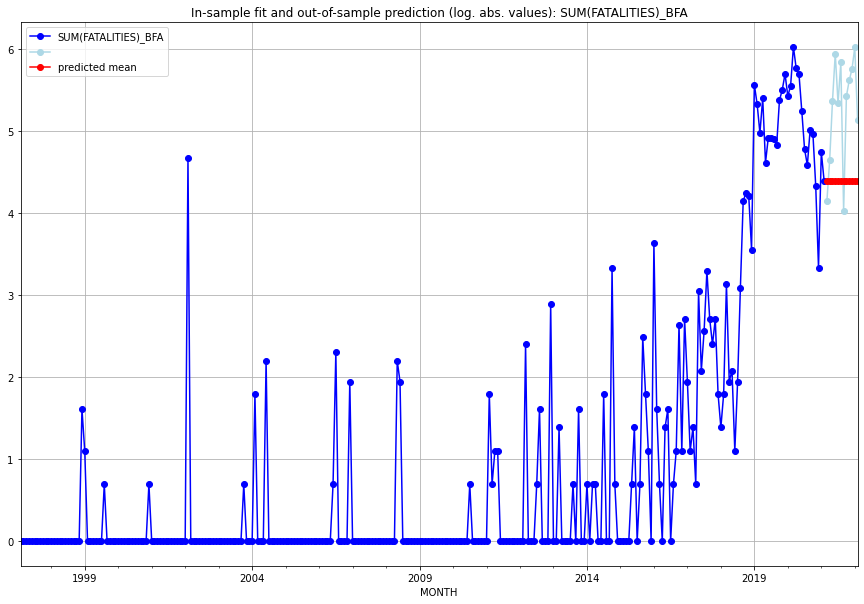

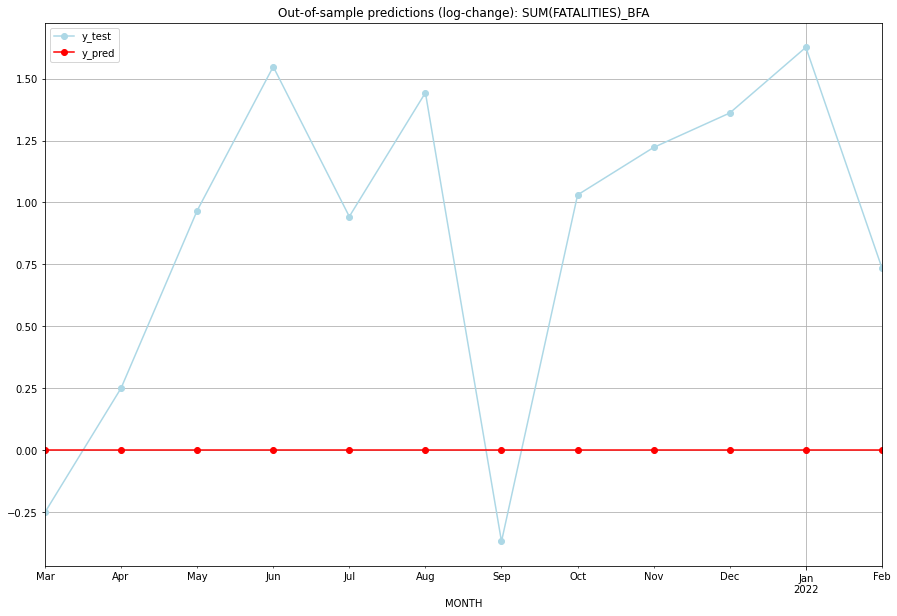

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  4.394449    4.143135           0.0       -0.251314
1   2021-04  4.394449    4.644391           0.0        0.249942
2   2021-05  4.394449    5.361292           0.0        0.966843
3   2021-06  4.394449    5.942799           0.0        1.548350
4   2021-07  4.394449    5.337538           0.0        0.943089
5   2021-08  4.394449    5.837730           0.0        1.443281
6   2021-09  4.394449    4.025352           0.0       -0.369097
7   2021-10  4.394449    5.424950           0.0        1.030501
8   2021-11  4.394449    5.616771           0.0        1.222322
9   2021-12  4.394449    5.755742           0.0        1.361293
10  2022-01  4.394449    6.021023           0.0        1.626574
11  2022-02  4.394449    5.129899           0.0        0.735450
TADDA: 0.9790047254455042
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  4.394449    4.143135           0.0

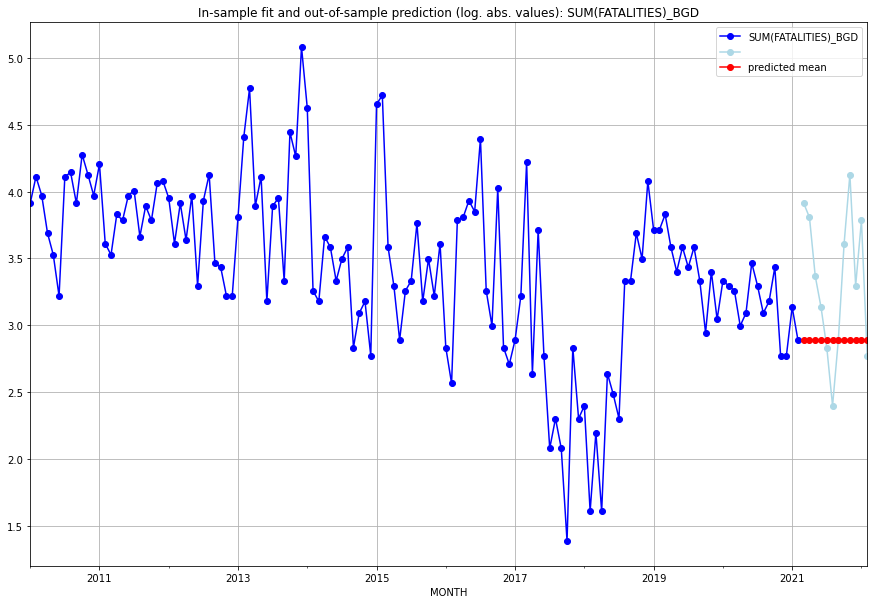

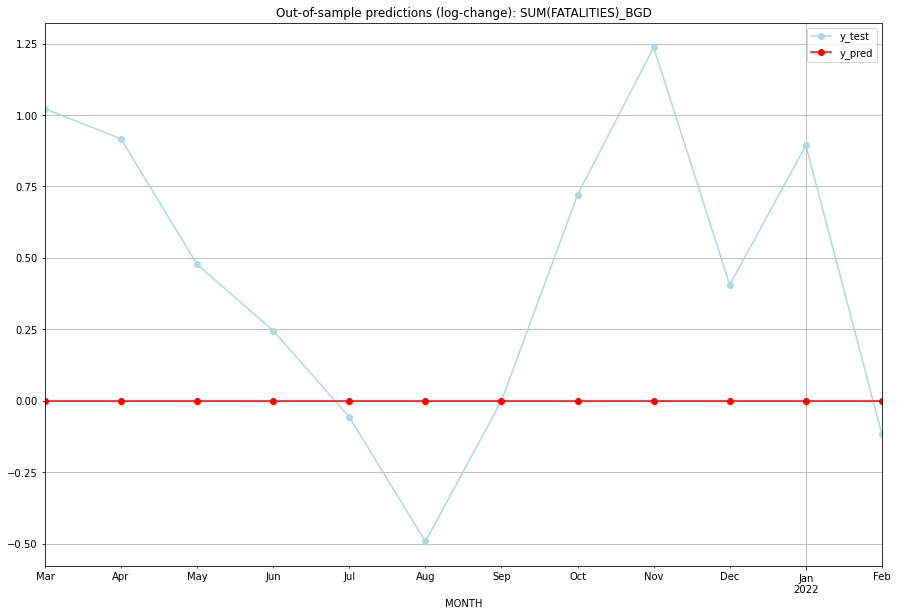

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  2.890372    3.912023           0.0        1.021651
1   2021-04  2.890372    3.806662           0.0        0.916291
2   2021-05  2.890372    3.367296           0.0        0.476924
3   2021-06  2.890372    3.135494           0.0        0.245122
4   2021-07  2.890372    2.833213           0.0       -0.057158
5   2021-08  2.890372    2.397895           0.0       -0.492476
6   2021-09  2.890372    2.890372           0.0        0.000000
7   2021-10  2.890372    3.610918           0.0        0.720546
8   2021-11  2.890372    4.127134           0.0        1.236763
9   2021-12  2.890372    3.295837           0.0        0.405465
10  2022-01  2.890372    3.784190           0.0        0.893818
11  2022-02  2.890372    2.772589           0.0       -0.117783
TADDA: 0.5486665175125672
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  2.890372    3.912023           0.0

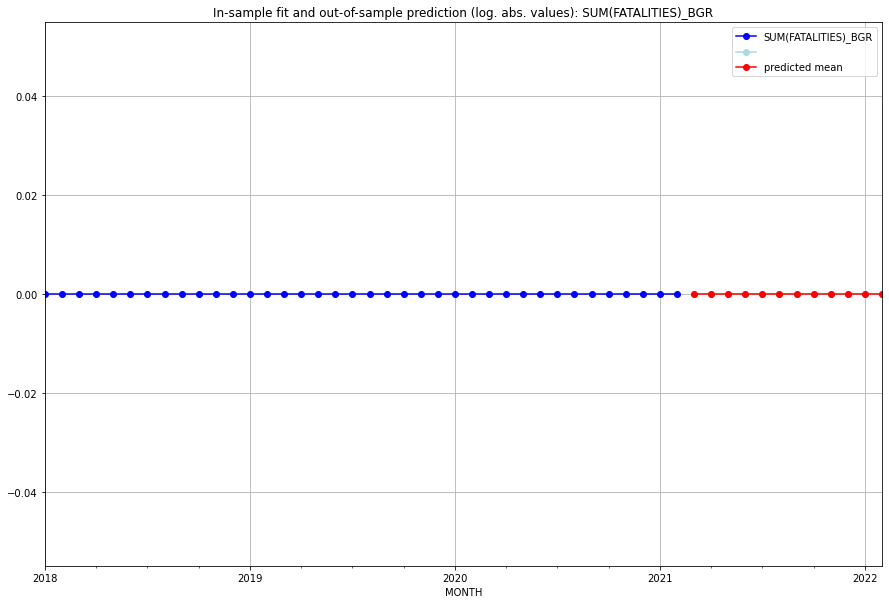

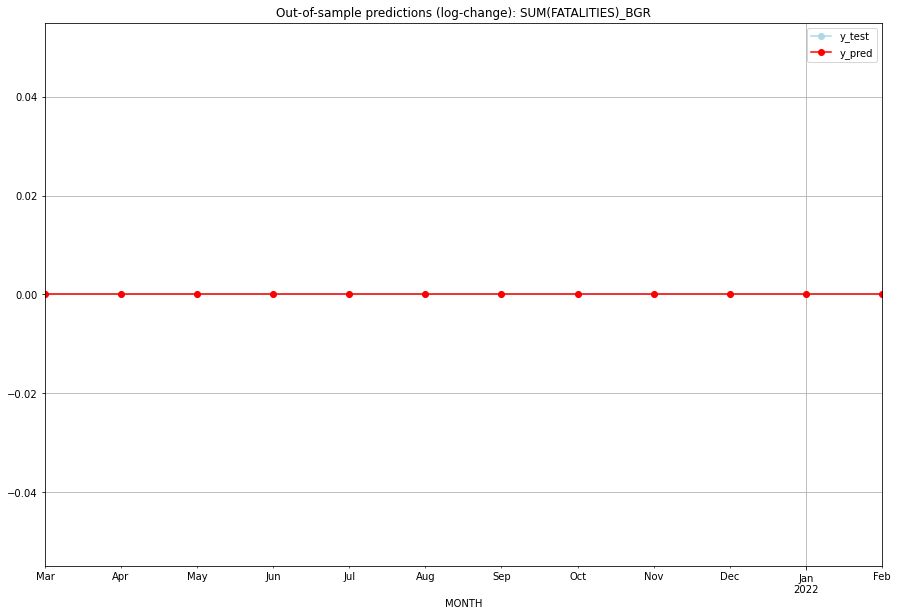

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

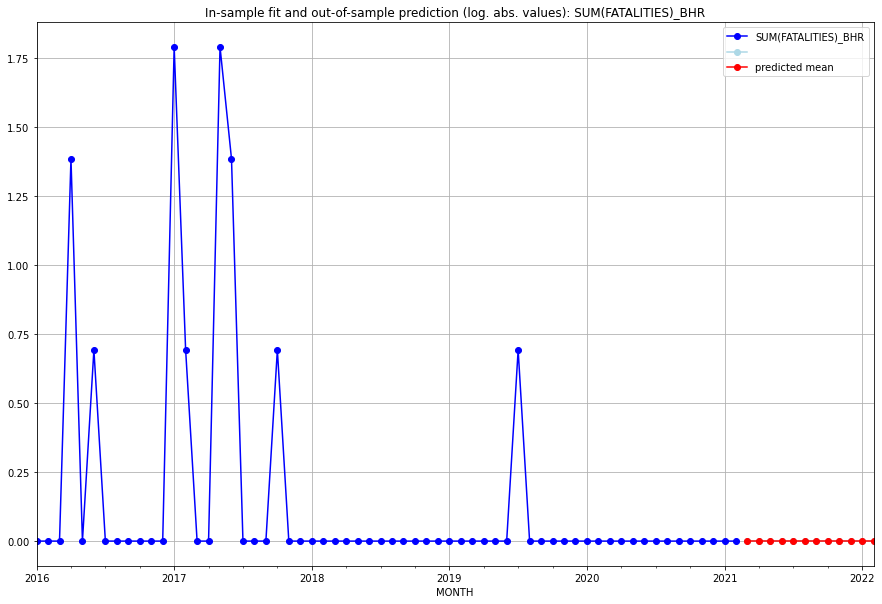

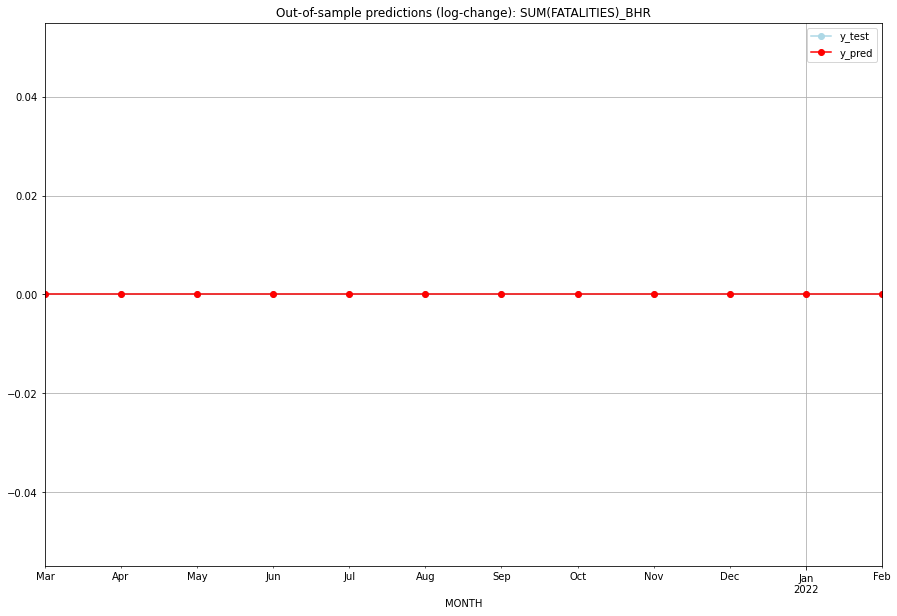

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

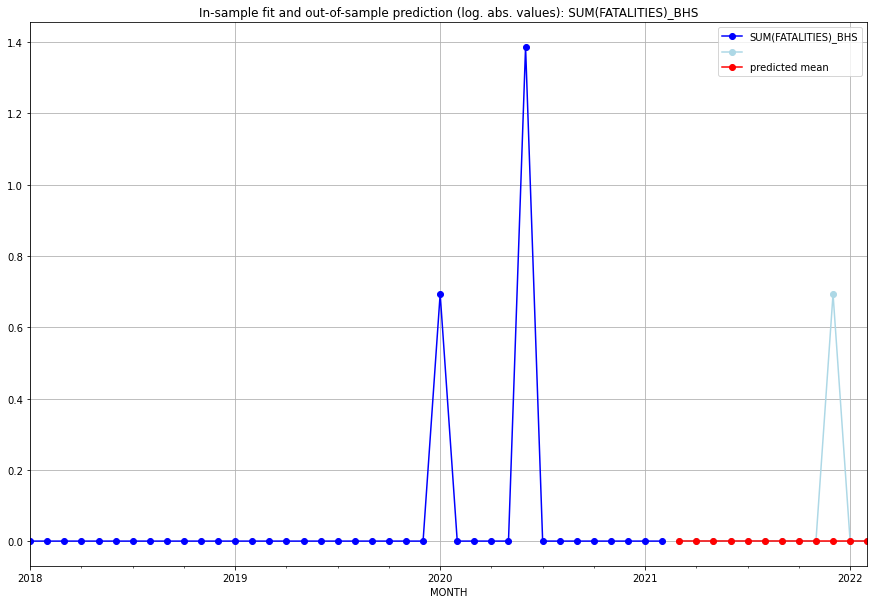

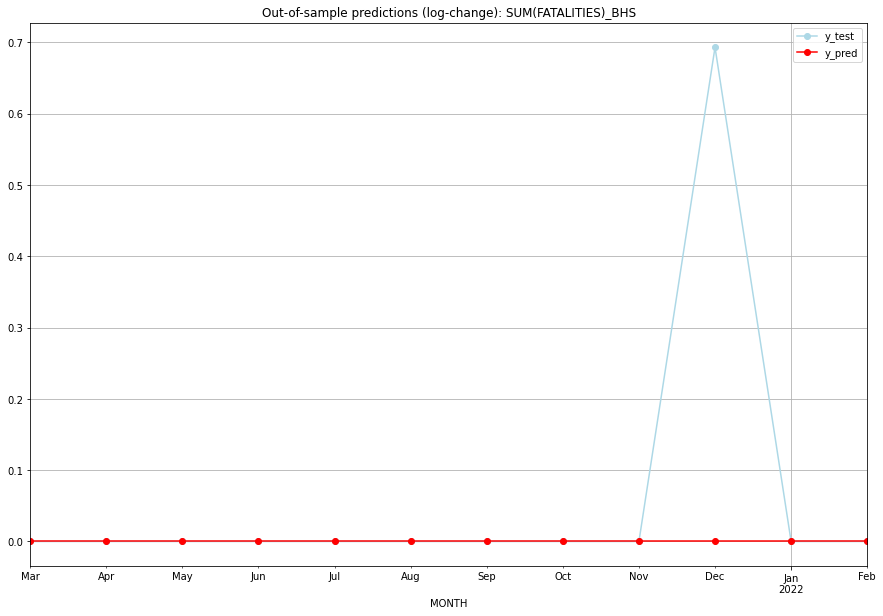

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.693147           0.0        0.693147
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

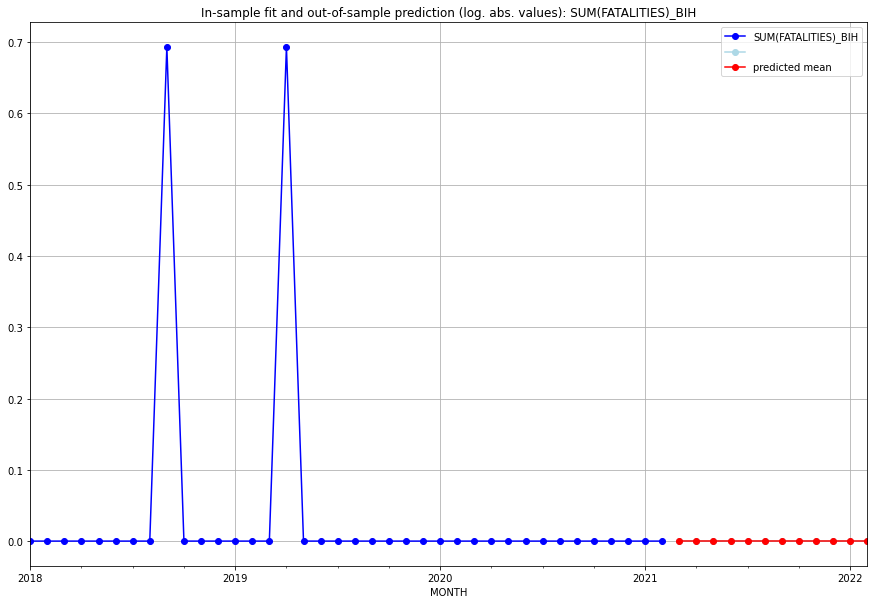

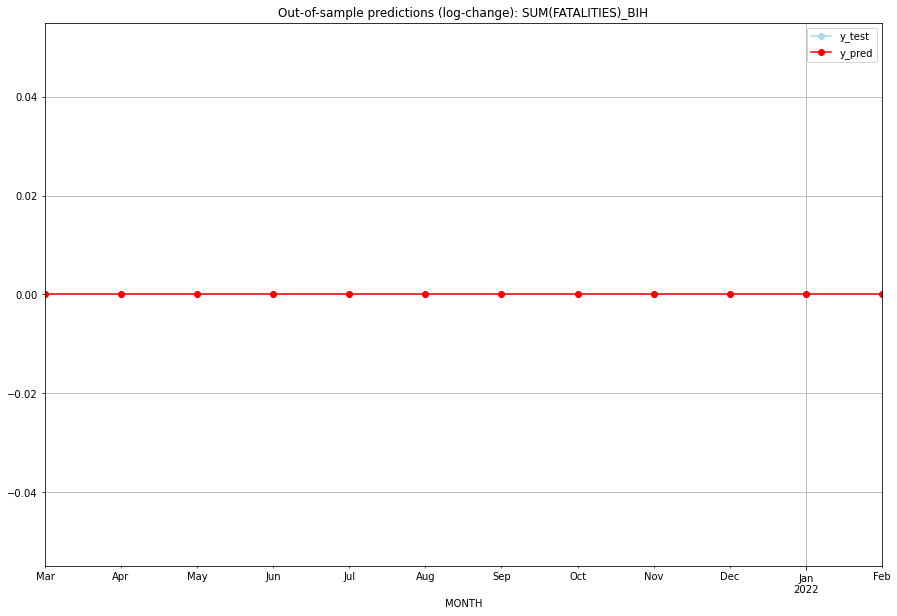

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

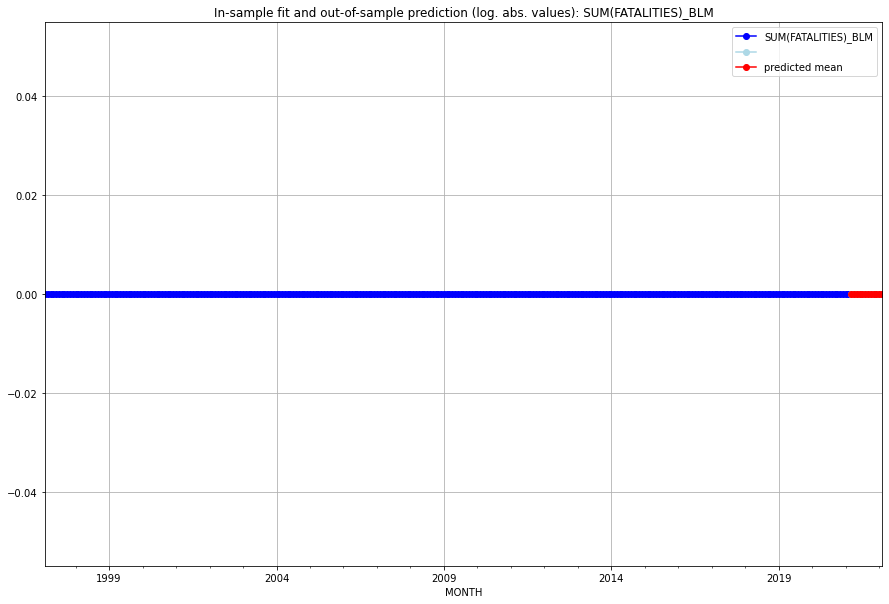

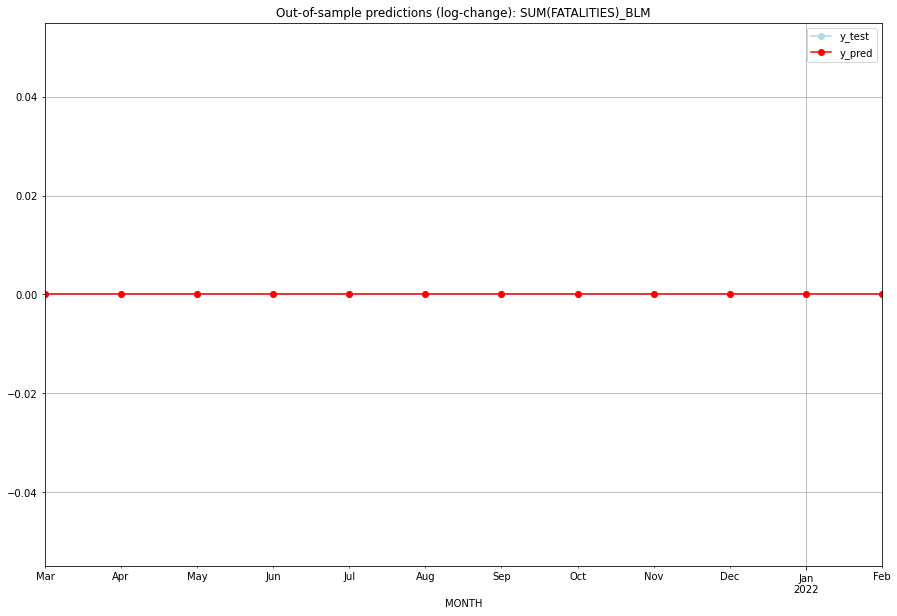

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

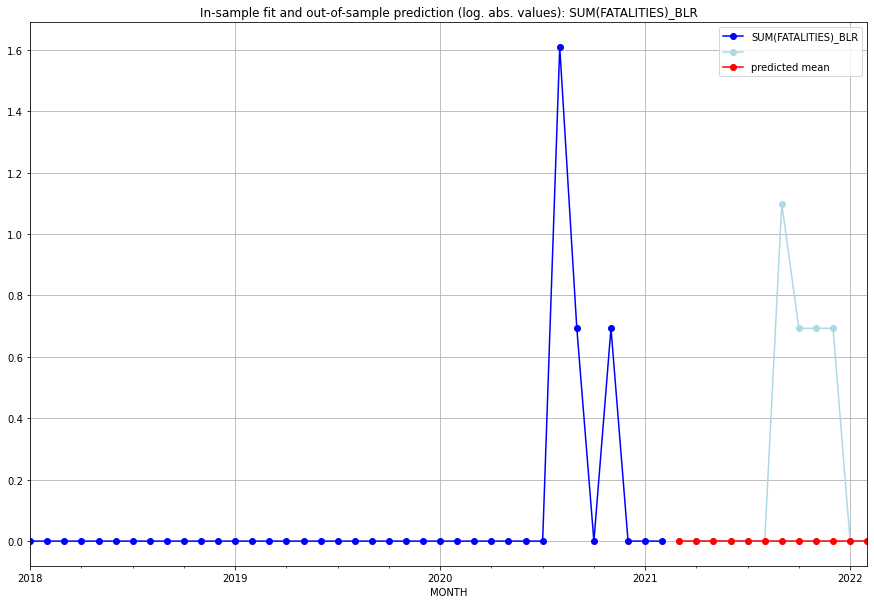

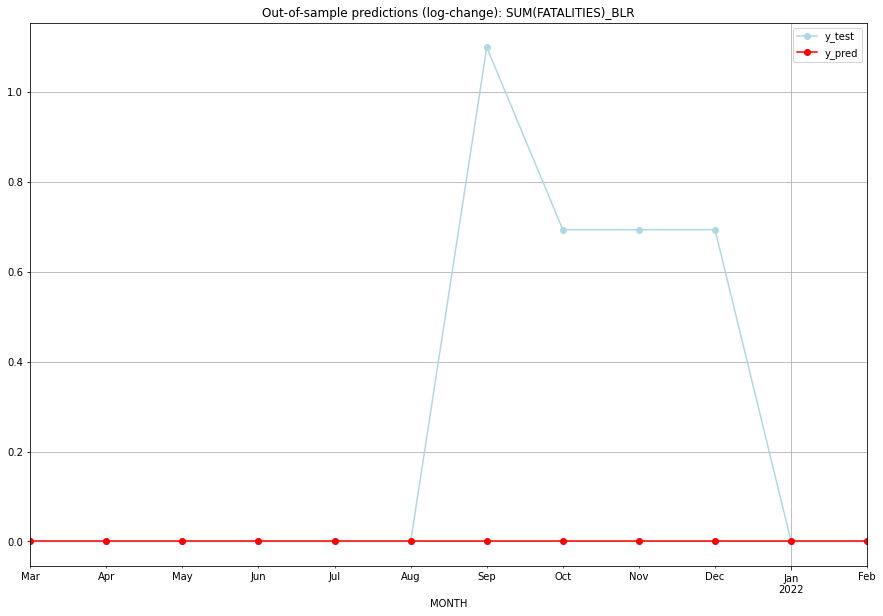

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    1.098612           0.0        1.098612
7   2021-10       0.0    0.693147           0.0        0.693147
8   2021-11       0.0    0.693147           0.0        0.693147
9   2021-12       0.0    0.693147           0.0        0.693147
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.2648378191956621
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0

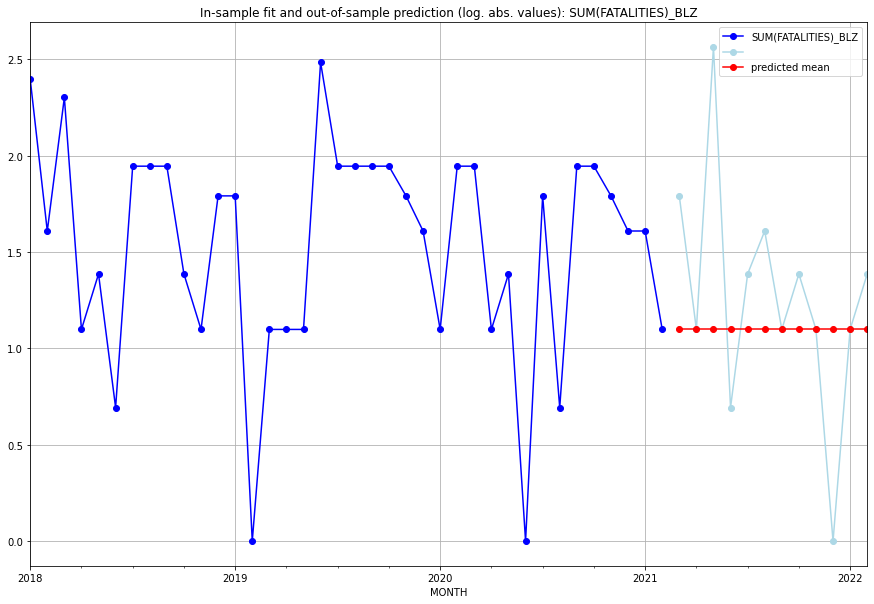

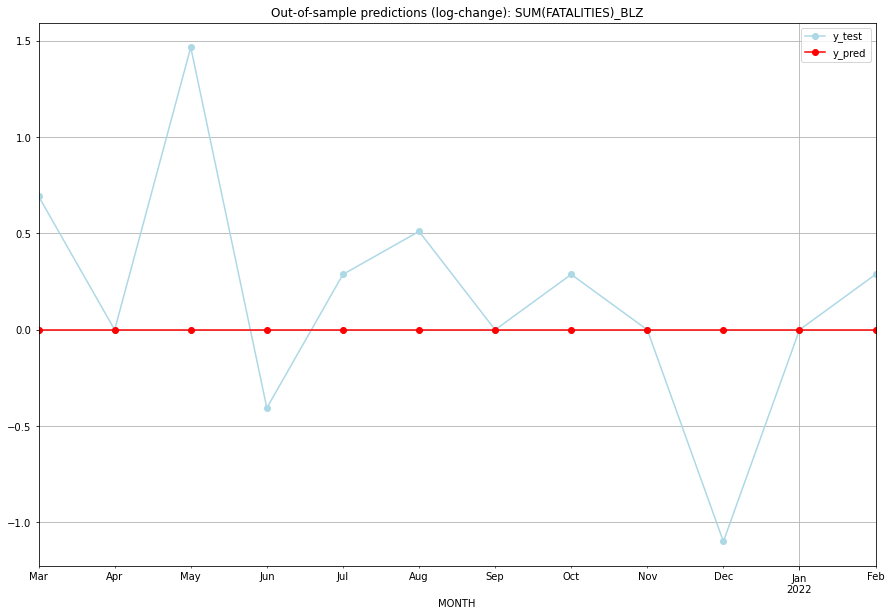

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.098612    1.791759           0.0        0.693147
1   2021-04  1.098612    1.098612           0.0        0.000000
2   2021-05  1.098612    2.564949           0.0        1.466337
3   2021-06  1.098612    0.693147           0.0       -0.405465
4   2021-07  1.098612    1.386294           0.0        0.287682
5   2021-08  1.098612    1.609438           0.0        0.510826
6   2021-09  1.098612    1.098612           0.0        0.000000
7   2021-10  1.098612    1.386294           0.0        0.287682
8   2021-11  1.098612    1.098612           0.0        0.000000
9   2021-12  1.098612    0.000000           0.0       -1.098612
10  2022-01  1.098612    1.098612           0.0        0.000000
11  2022-02  1.098612    1.386294           0.0        0.287682
TADDA: 0.4197861239375817
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.098612    1.791759           0.0

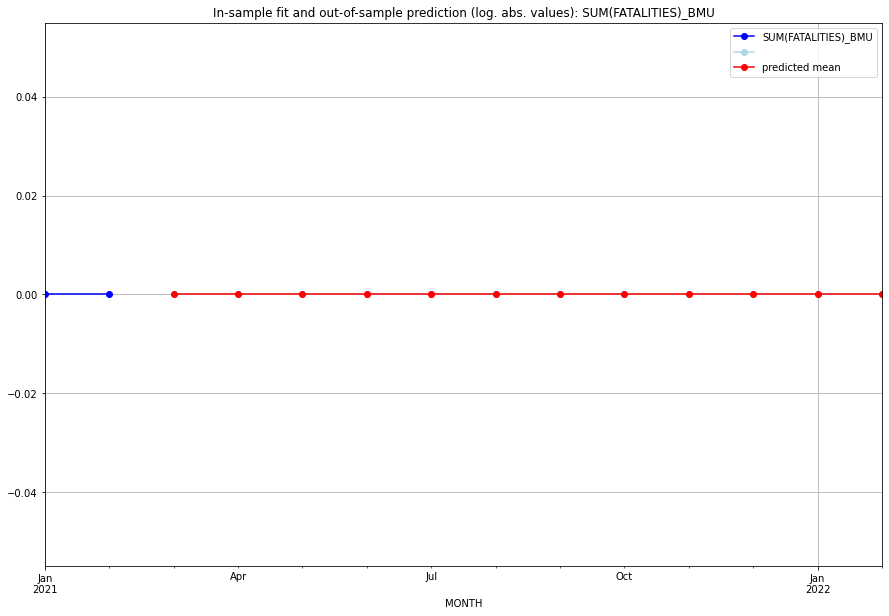

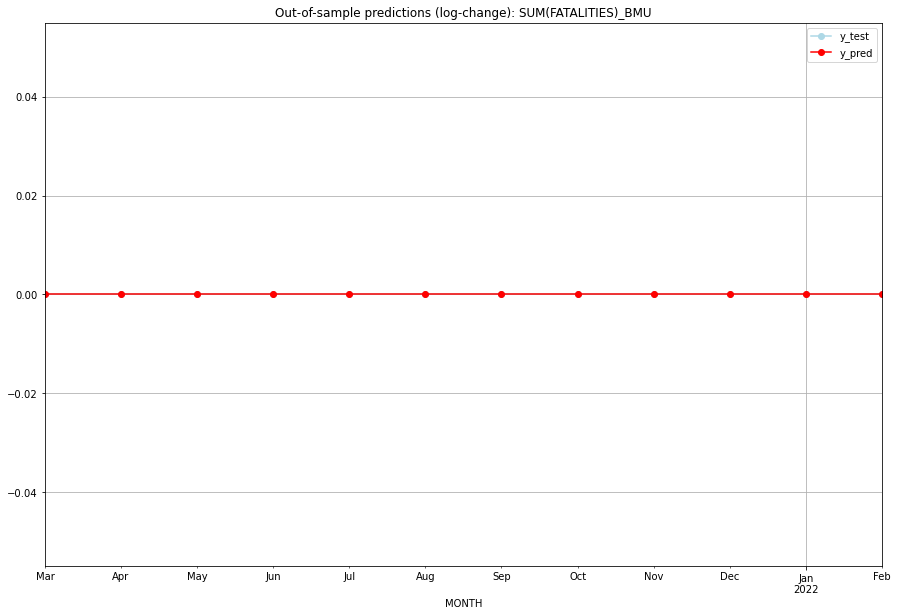

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

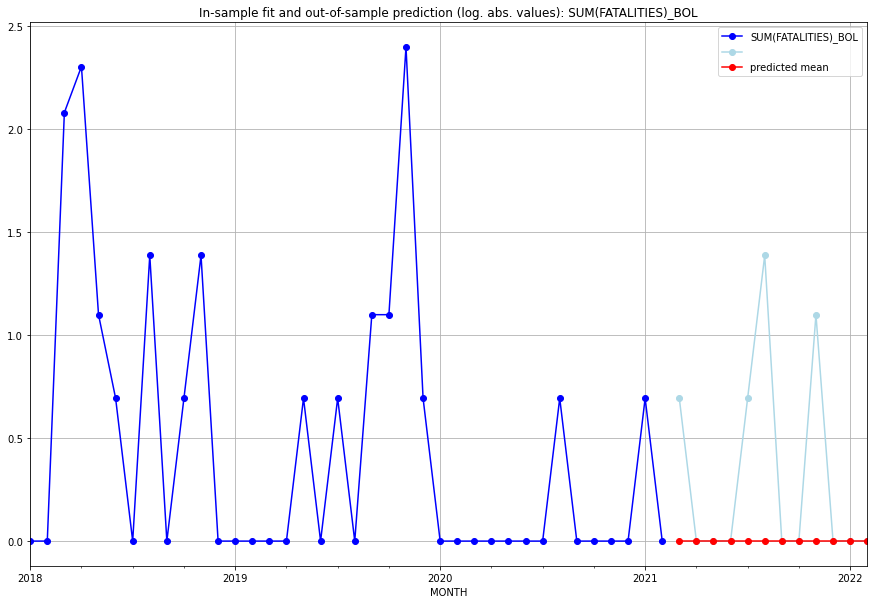

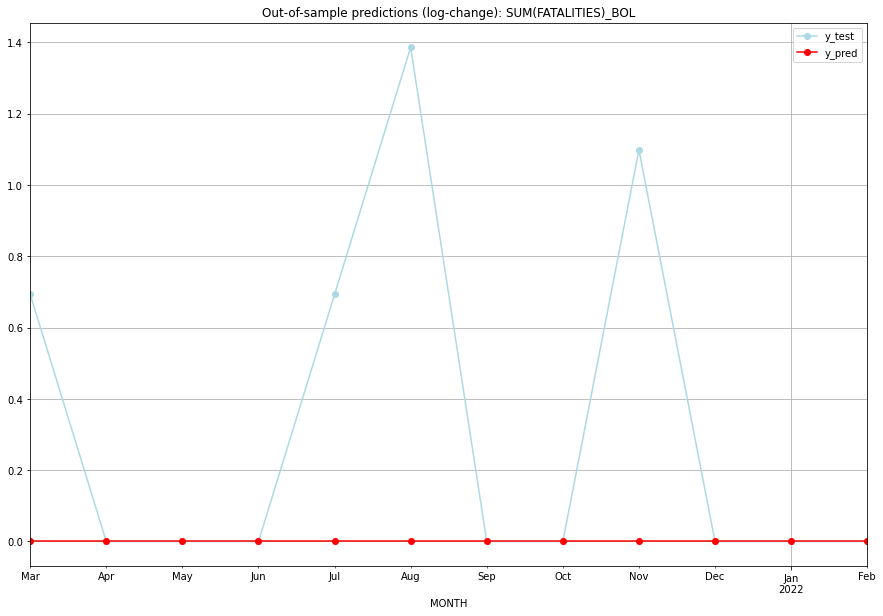

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.693147           0.0        0.693147
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.693147           0.0        0.693147
5   2021-08       0.0    1.386294           0.0        1.386294
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    1.098612           0.0        1.098612
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.3226000842423242
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.693147           0.0

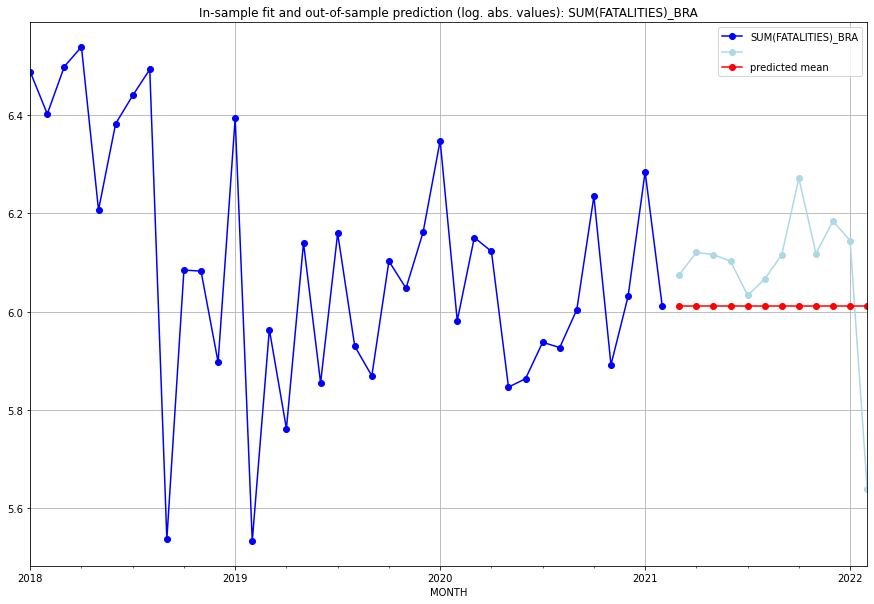

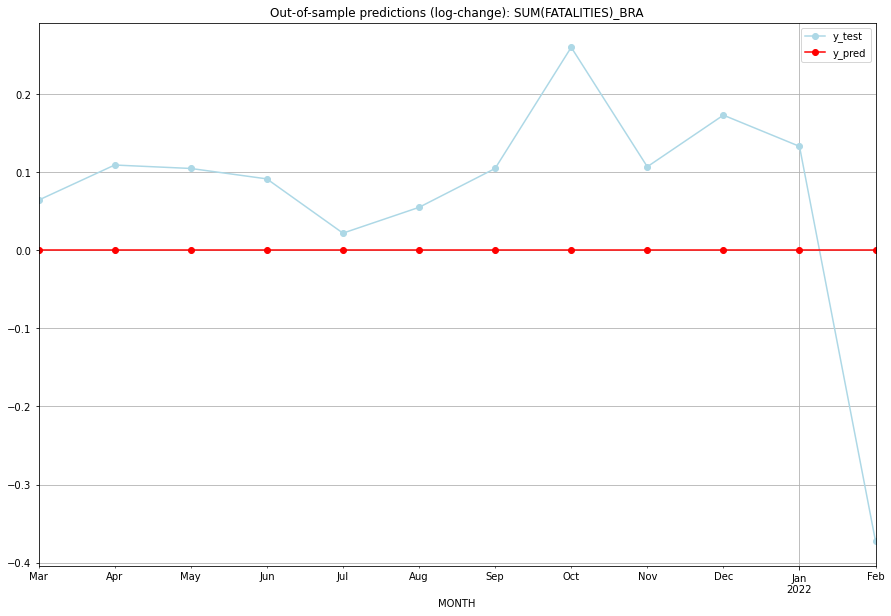

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  6.011267    6.075346           0.0        0.064079
1   2021-04  6.011267    6.120297           0.0        0.109030
2   2021-05  6.011267    6.115892           0.0        0.104625
3   2021-06  6.011267    6.102559           0.0        0.091291
4   2021-07  6.011267    6.033086           0.0        0.021819
5   2021-08  6.011267    6.066108           0.0        0.054841
6   2021-09  6.011267    6.115892           0.0        0.104625
7   2021-10  6.011267    6.270988           0.0        0.259721
8   2021-11  6.011267    6.118097           0.0        0.106830
9   2021-12  6.011267    6.184149           0.0        0.172882
10  2022-01  6.011267    6.144186           0.0        0.132918
11  2022-02  6.011267    5.638355           0.0       -0.372913
TADDA: 0.13296452909243647
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  6.011267    6.075346           0.

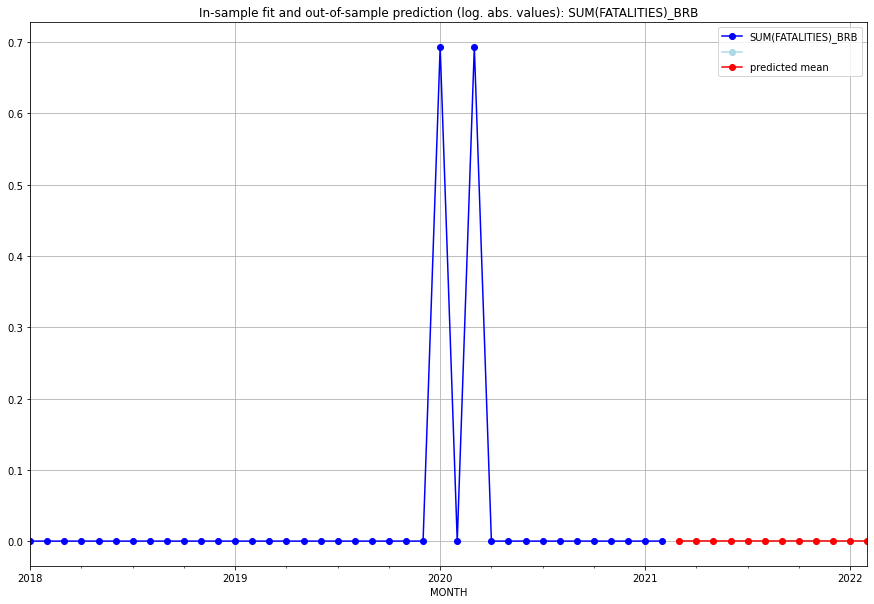

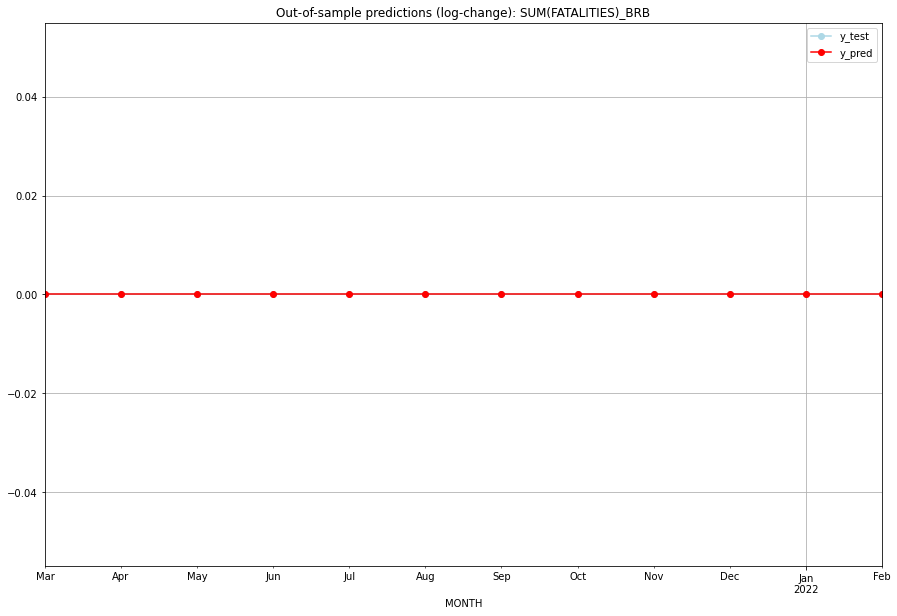

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

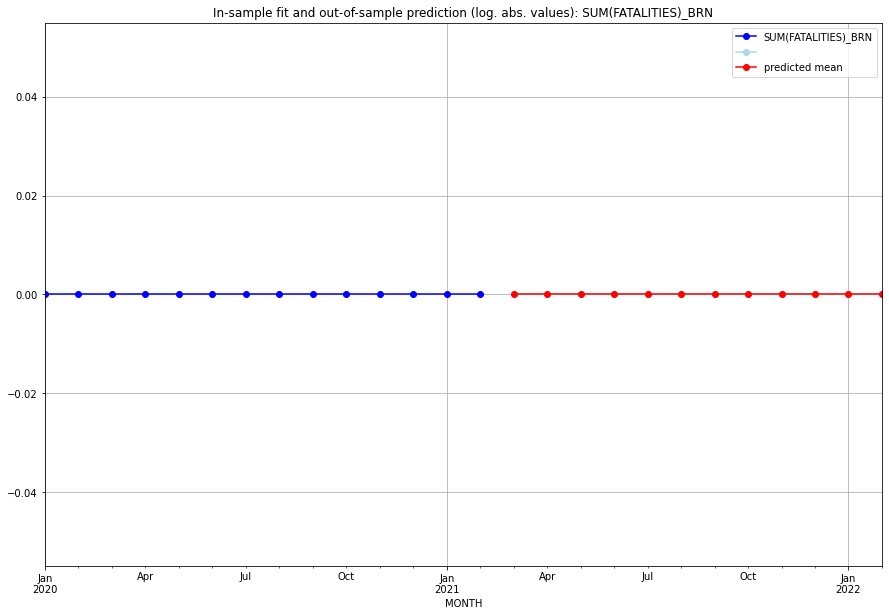

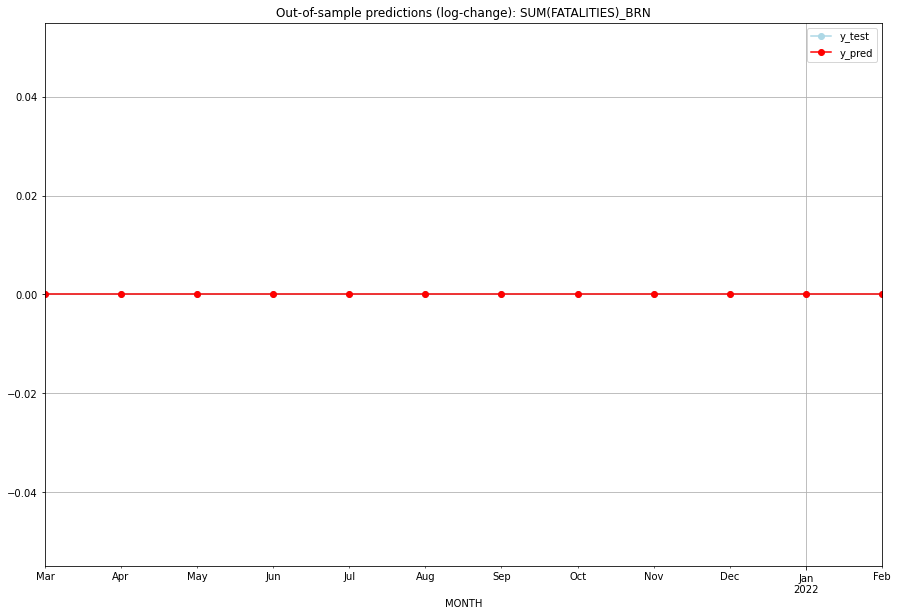

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

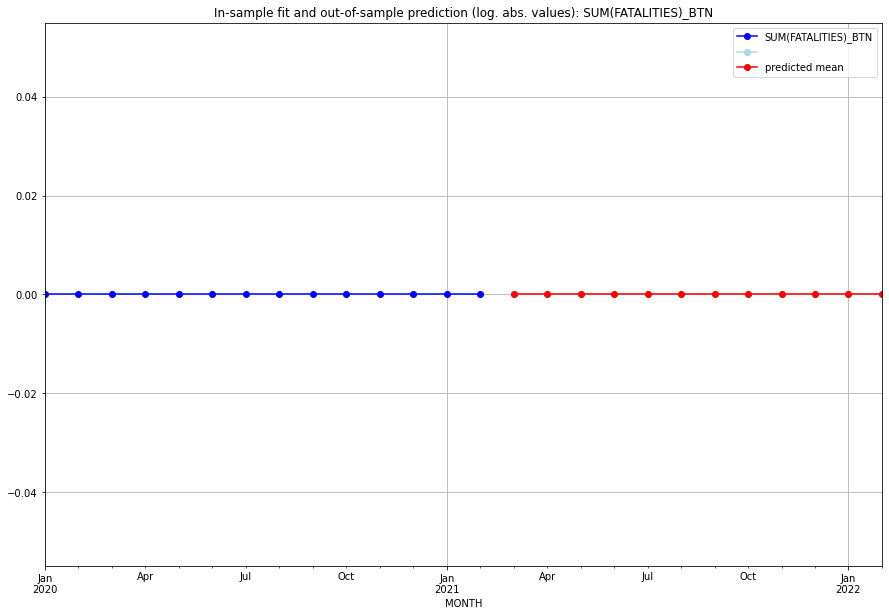

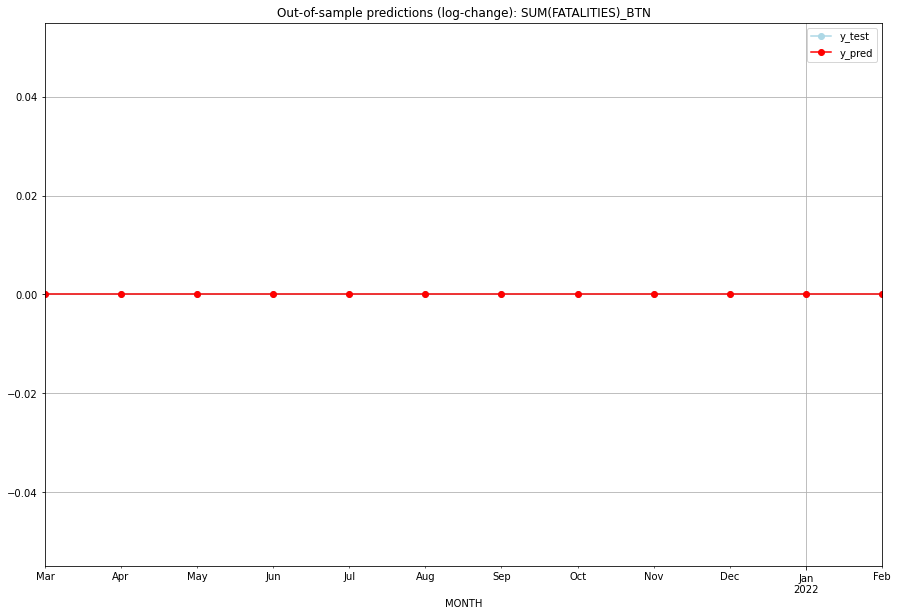

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

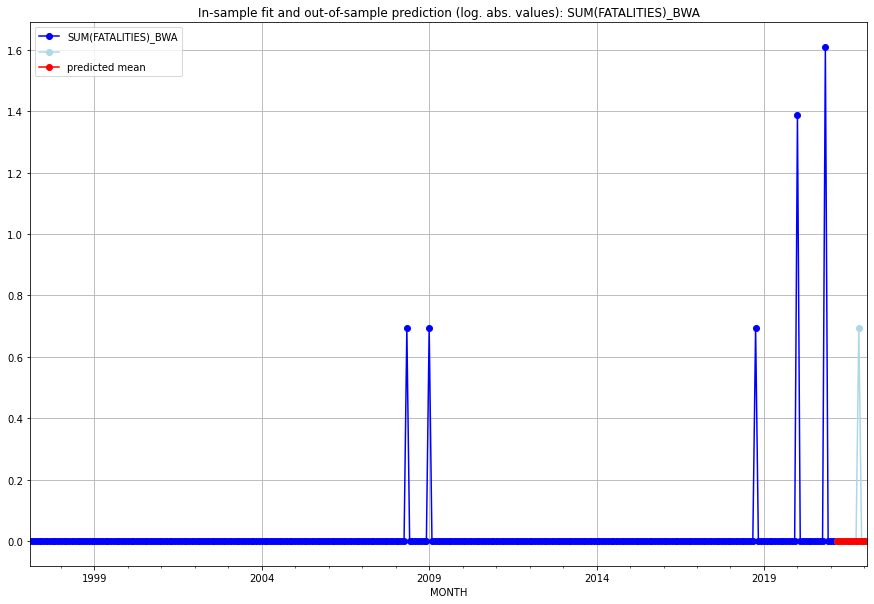

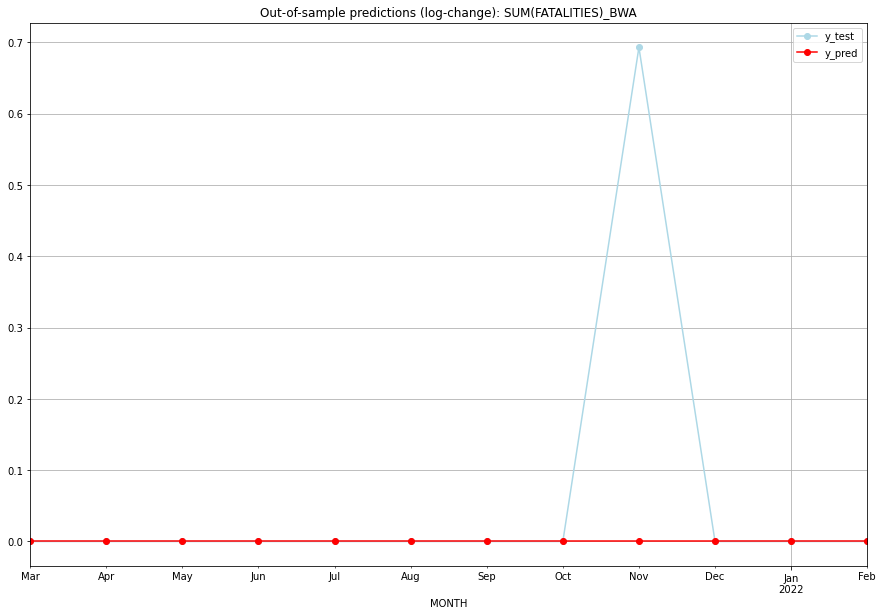

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.693147           0.0        0.693147
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

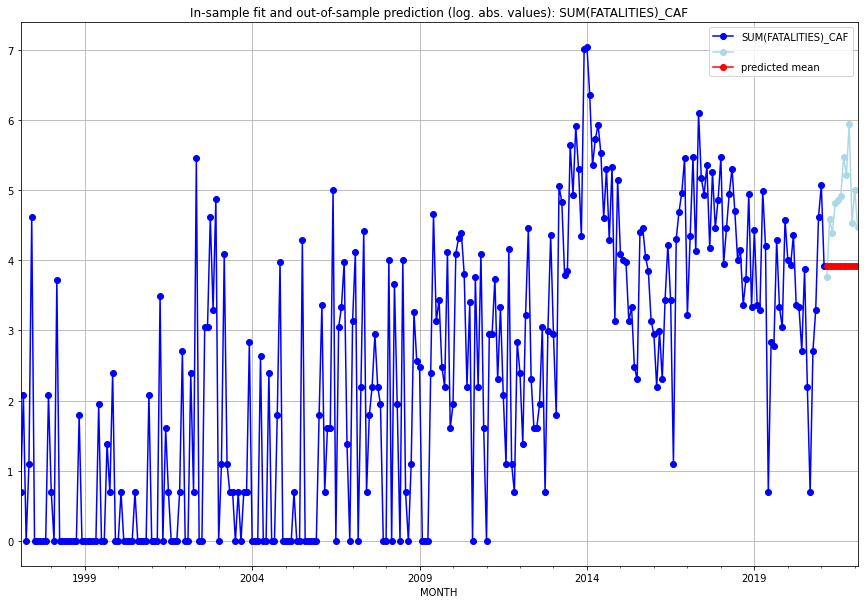

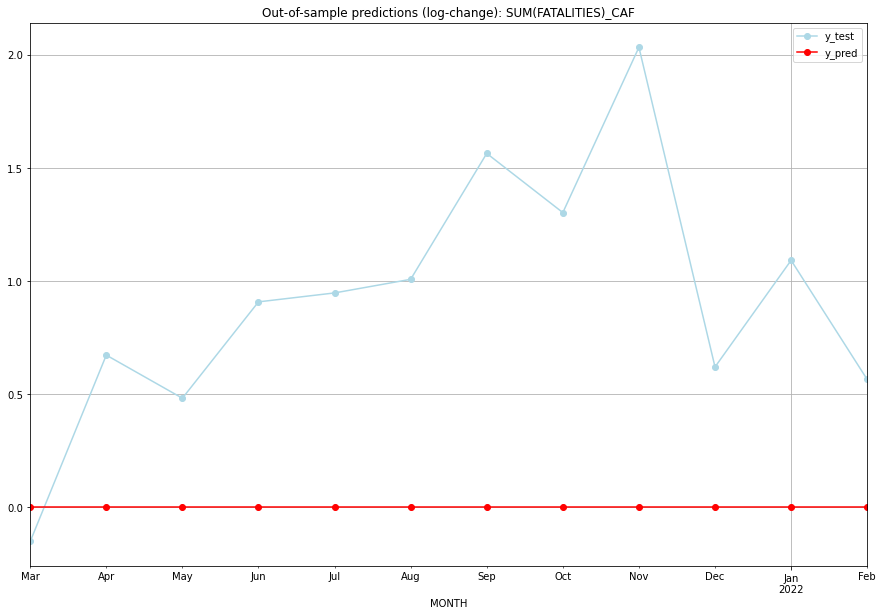

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  3.912023    3.761200           0.0       -0.150823
1   2021-04  3.912023    4.584967           0.0        0.672944
2   2021-05  3.912023    4.394449           0.0        0.482426
3   2021-06  3.912023    4.820282           0.0        0.908259
4   2021-07  3.912023    4.859812           0.0        0.947789
5   2021-08  3.912023    4.919981           0.0        1.007958
6   2021-09  3.912023    5.476464           0.0        1.564441
7   2021-10  3.912023    5.214936           0.0        1.302913
8   2021-11  3.912023    5.945421           0.0        2.033398
9   2021-12  3.912023    4.532599           0.0        0.620576
10  2022-01  3.912023    5.003946           0.0        1.091923
11  2022-02  3.912023    4.477337           0.0        0.565314
TADDA: 0.945730324240568
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  3.912023    3.761200           0.0 

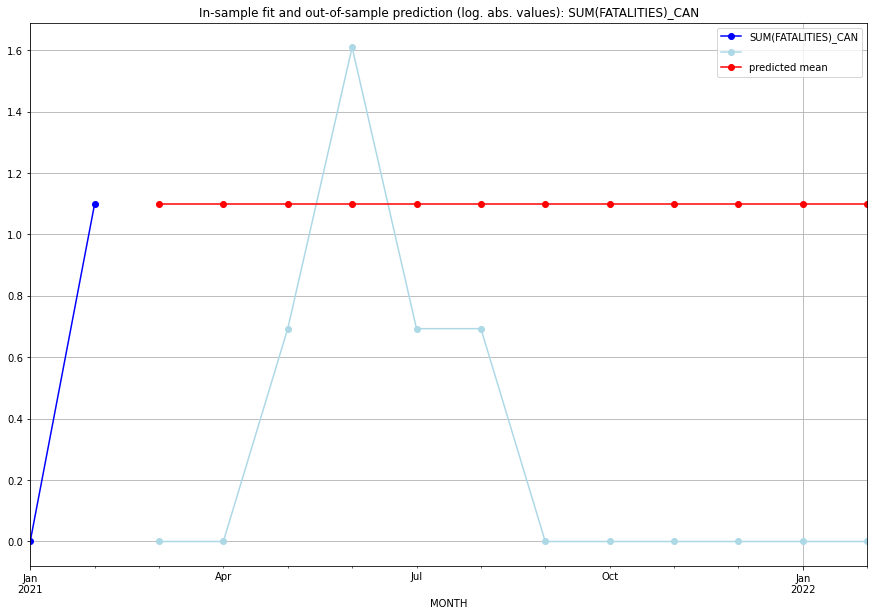

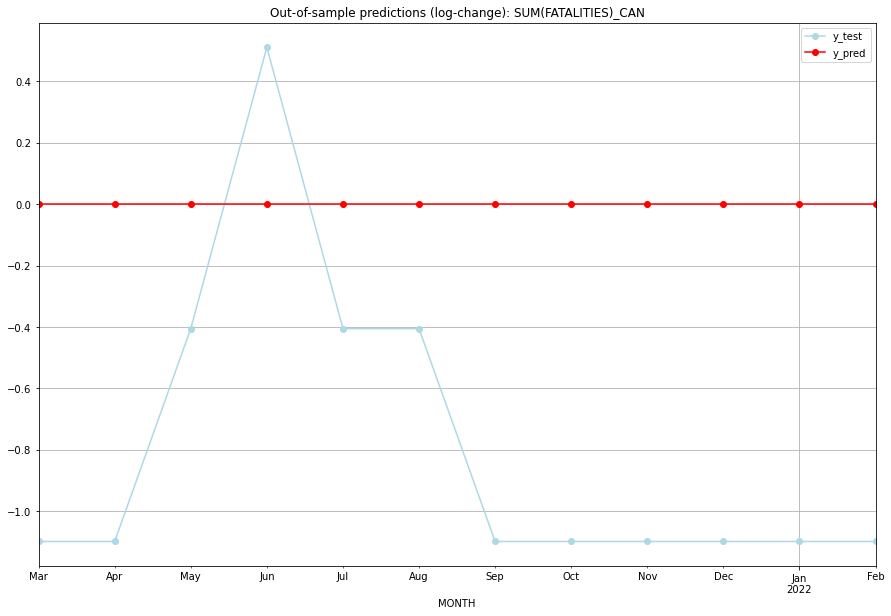

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.098612    0.000000           0.0       -1.098612
1   2021-04  1.098612    0.000000           0.0       -1.098612
2   2021-05  1.098612    0.693147           0.0       -0.405465
3   2021-06  1.098612    1.609438           0.0        0.510826
4   2021-07  1.098612    0.693147           0.0       -0.405465
5   2021-08  1.098612    0.693147           0.0       -0.405465
6   2021-09  1.098612    0.000000           0.0       -1.098612
7   2021-10  1.098612    0.000000           0.0       -1.098612
8   2021-11  1.098612    0.000000           0.0       -1.098612
9   2021-12  1.098612    0.000000           0.0       -1.098612
10  2022-01  1.098612    0.000000           0.0       -1.098612
11  2022-02  1.098612    0.000000           0.0       -1.098612
TADDA: 0.8763432714529468
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.098612    0.000000           0.0

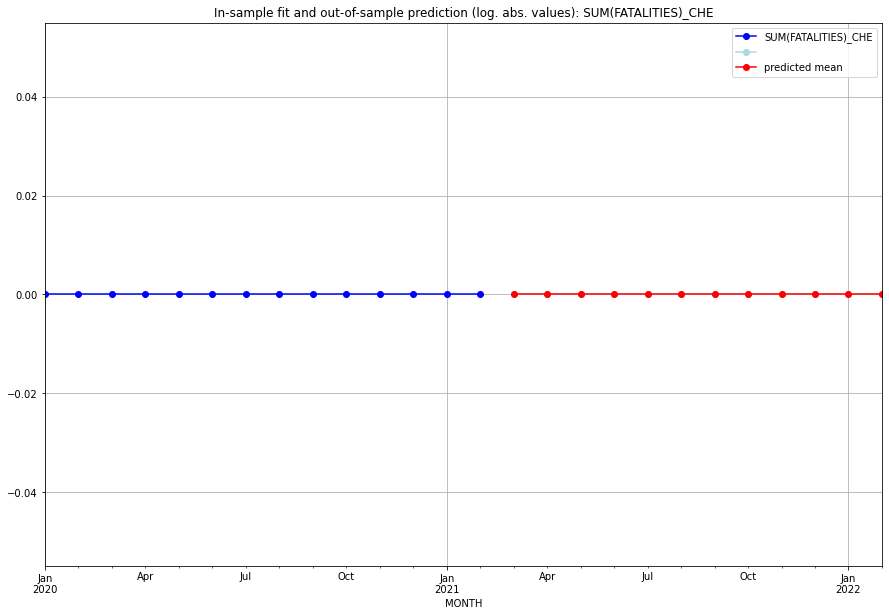

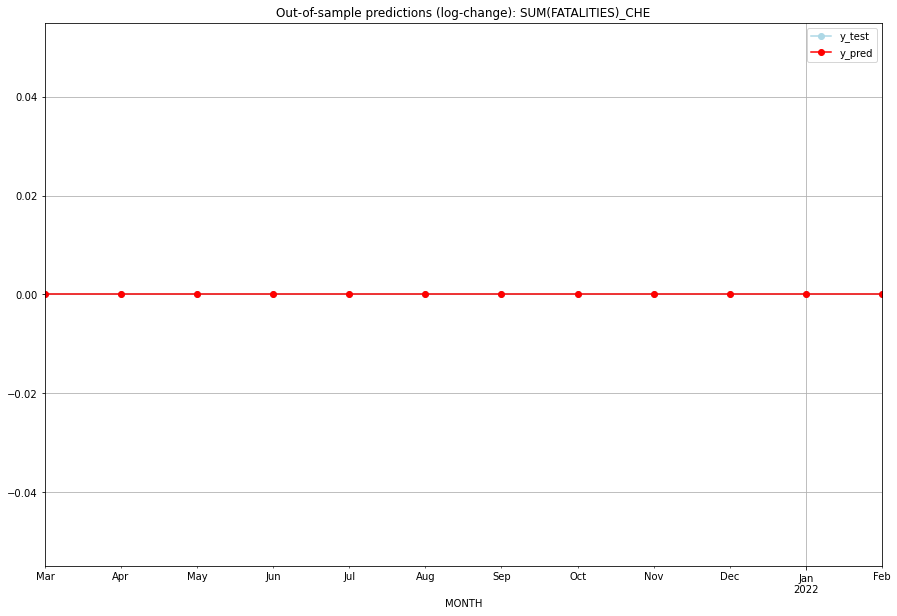

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

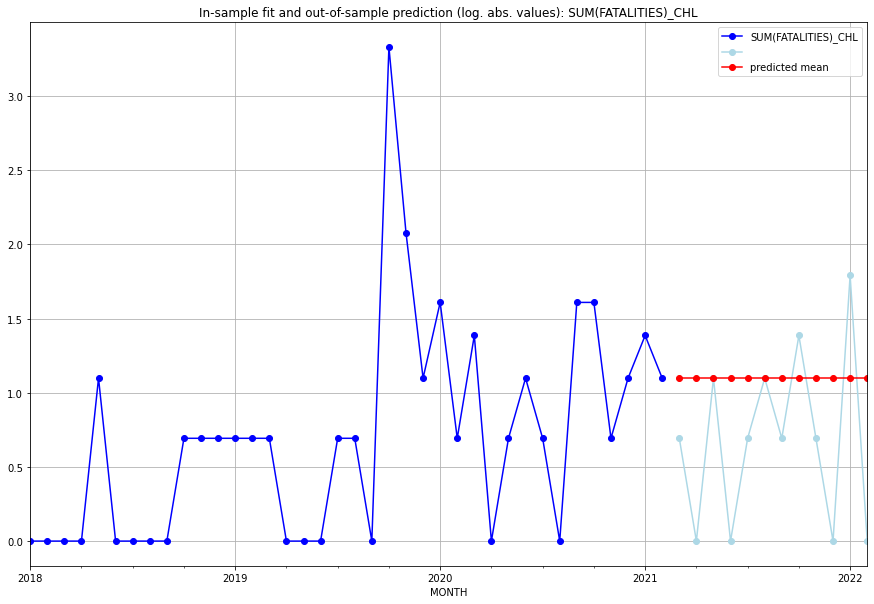

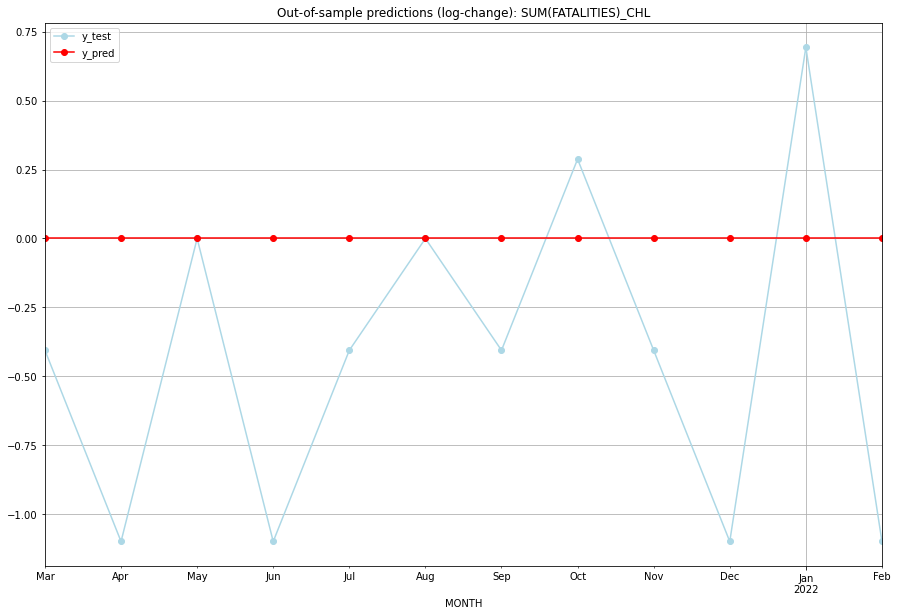

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.098612    0.693147           0.0       -0.405465
1   2021-04  1.098612    0.000000           0.0       -1.098612
2   2021-05  1.098612    1.098612           0.0        0.000000
3   2021-06  1.098612    0.000000           0.0       -1.098612
4   2021-07  1.098612    0.693147           0.0       -0.405465
5   2021-08  1.098612    1.098612           0.0        0.000000
6   2021-09  1.098612    0.693147           0.0       -0.405465
7   2021-10  1.098612    1.386294           0.0        0.287682
8   2021-11  1.098612    0.693147           0.0       -0.405465
9   2021-12  1.098612    0.000000           0.0       -1.098612
10  2022-01  1.098612    1.791759           0.0        0.693147
11  2022-02  1.098612    0.000000           0.0       -1.098612
TADDA: 0.5830949033430687
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.098612    0.693147           0.0

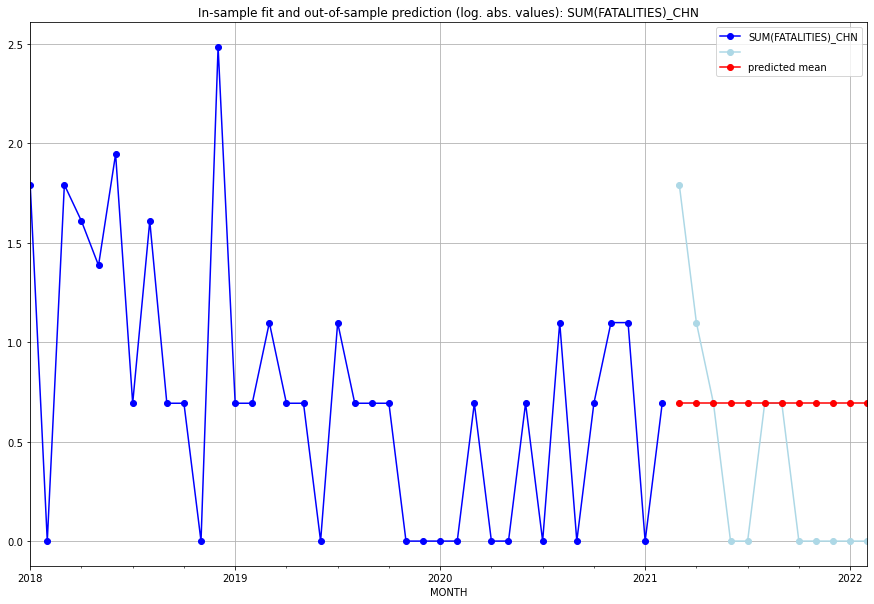

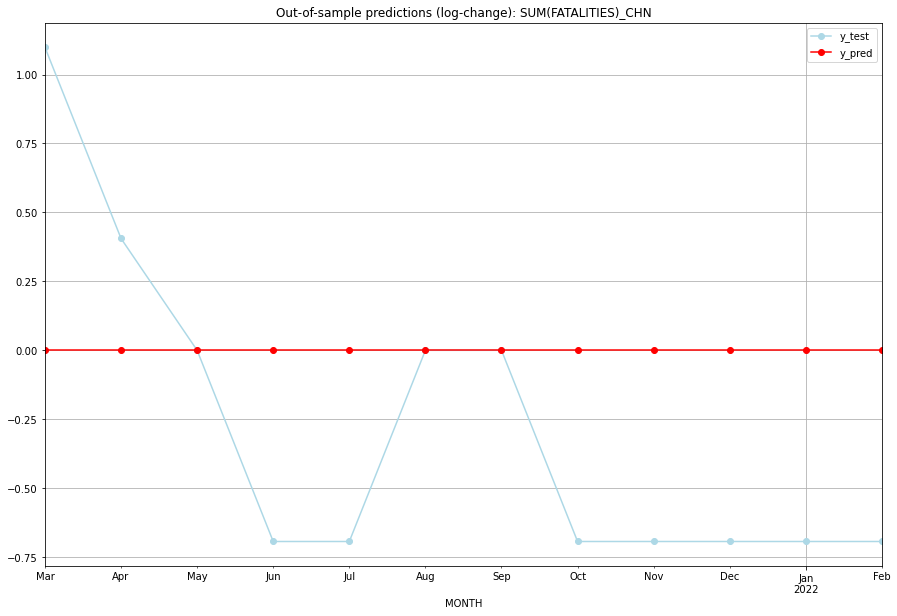

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  0.693147    1.791759           0.0        1.098612
1   2021-04  0.693147    1.098612           0.0        0.405465
2   2021-05  0.693147    0.693147           0.0        0.000000
3   2021-06  0.693147    0.000000           0.0       -0.693147
4   2021-07  0.693147    0.000000           0.0       -0.693147
5   2021-08  0.693147    0.693147           0.0        0.000000
6   2021-09  0.693147    0.693147           0.0        0.000000
7   2021-10  0.693147    0.000000           0.0       -0.693147
8   2021-11  0.693147    0.000000           0.0       -0.693147
9   2021-12  0.693147    0.000000           0.0       -0.693147
10  2022-01  0.693147    0.000000           0.0       -0.693147
11  2022-02  0.693147    0.000000           0.0       -0.693147
TADDA: 0.5296756383913243
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  0.693147    1.791759           0.0

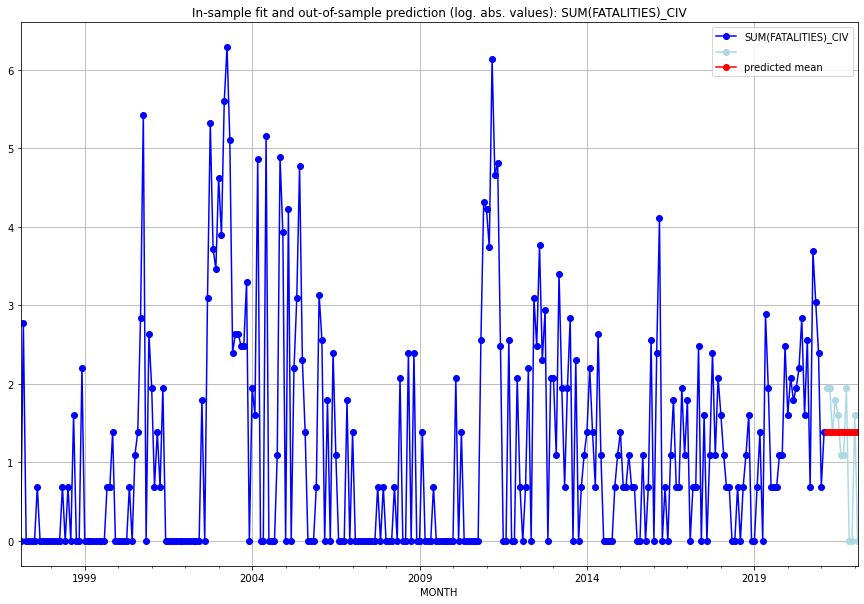

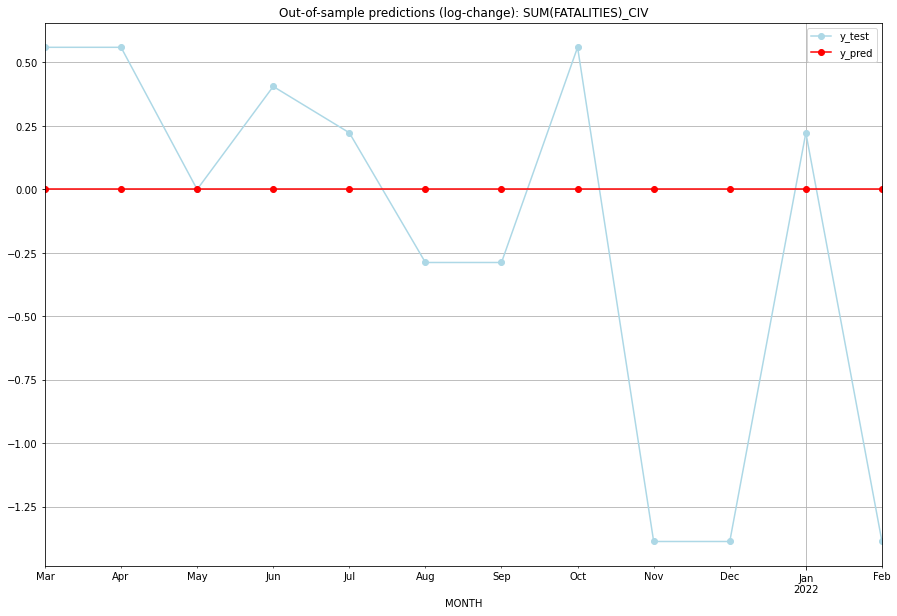

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.386294    1.945910           0.0        0.559616
1   2021-04  1.386294    1.945910           0.0        0.559616
2   2021-05  1.386294    1.386294           0.0        0.000000
3   2021-06  1.386294    1.791759           0.0        0.405465
4   2021-07  1.386294    1.609438           0.0        0.223144
5   2021-08  1.386294    1.098612           0.0       -0.287682
6   2021-09  1.386294    1.098612           0.0       -0.287682
7   2021-10  1.386294    1.945910           0.0        0.559616
8   2021-11  1.386294    0.000000           0.0       -1.386294
9   2021-12  1.386294    0.000000           0.0       -1.386294
10  2022-01  1.386294    1.609438           0.0        0.223144
11  2022-02  1.386294    0.000000           0.0       -1.386294
TADDA: 0.6054039002338404
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.386294    1.945910           0.0

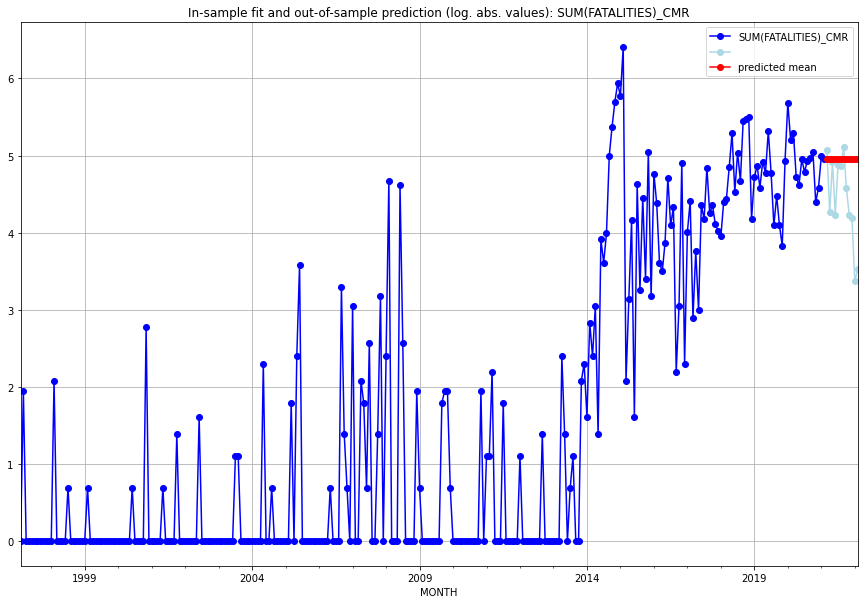

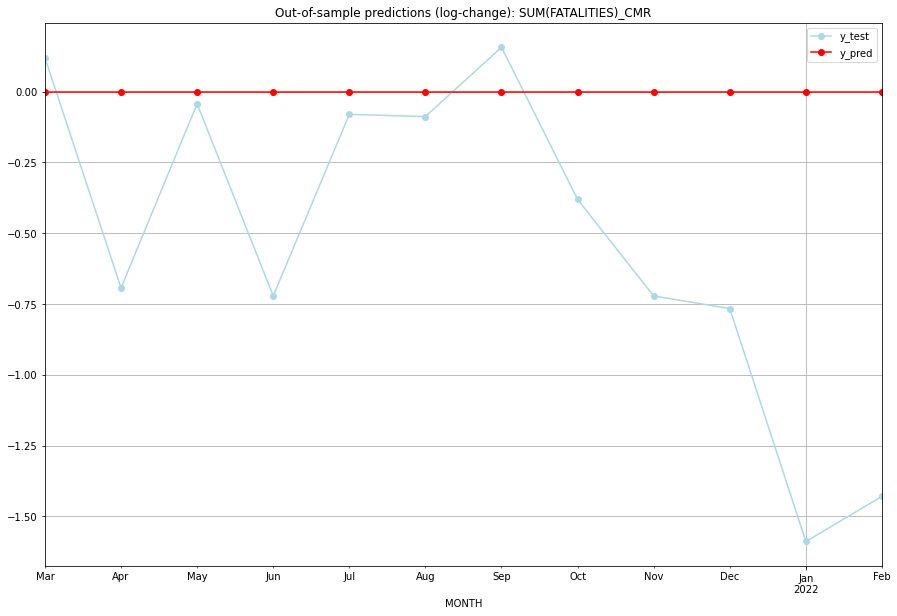

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  4.955827    5.075174           0.0        0.119347
1   2021-04  4.955827    4.262680           0.0       -0.693147
2   2021-05  4.955827    4.912655           0.0       -0.043172
3   2021-06  4.955827    4.234107           0.0       -0.721721
4   2021-07  4.955827    4.875197           0.0       -0.080630
5   2021-08  4.955827    4.867534           0.0       -0.088293
6   2021-09  4.955827    5.111988           0.0        0.156161
7   2021-10  4.955827    4.574711           0.0       -0.381116
8   2021-11  4.955827    4.234107           0.0       -0.721721
9   2021-12  4.955827    4.189655           0.0       -0.766172
10  2022-01  4.955827    3.367296           0.0       -1.588531
11  2022-02  4.955827    3.526361           0.0       -1.429467
TADDA: 0.5657897036366161
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  4.955827    5.075174           0.0

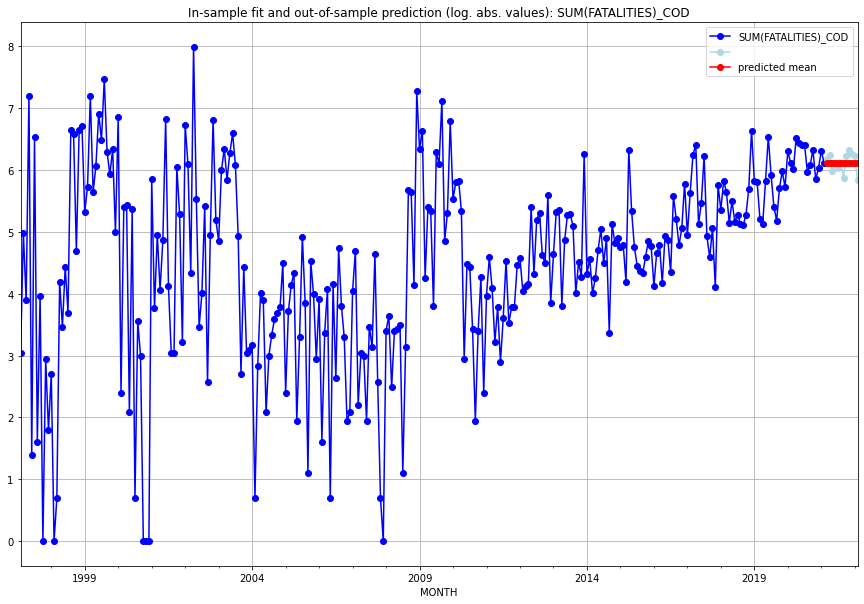

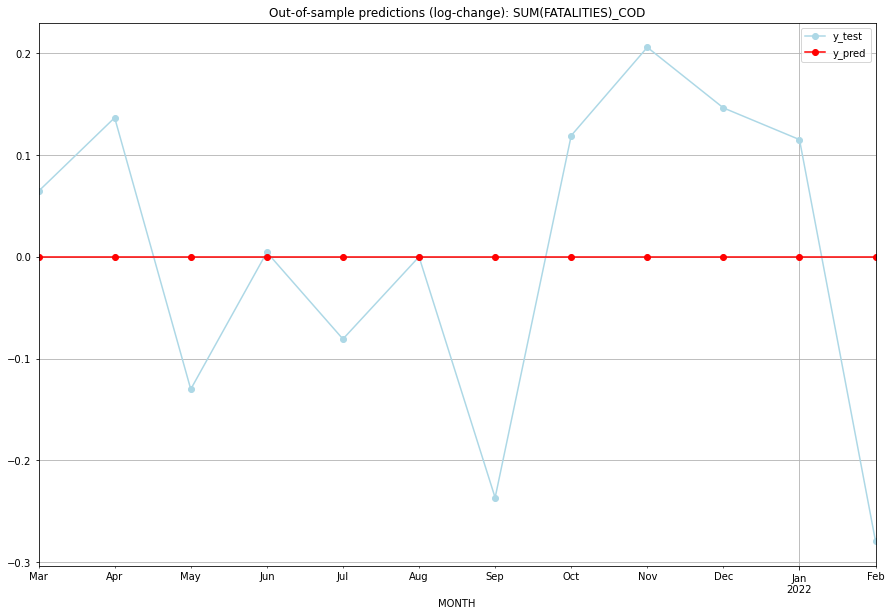

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  6.111467    6.175867           0.0        0.064400
1   2021-04  6.111467    6.248043           0.0        0.136576
2   2021-05  6.111467    5.981414           0.0       -0.130053
3   2021-06  6.111467    6.115892           0.0        0.004425
4   2021-07  6.111467    6.030685           0.0       -0.080782
5   2021-08  6.111467    6.111467           0.0        0.000000
6   2021-09  6.111467    5.874931           0.0       -0.236537
7   2021-10  6.111467    6.230481           0.0        0.119014
8   2021-11  6.111467    6.317165           0.0        0.205697
9   2021-12  6.111467    6.257668           0.0        0.146200
10  2022-01  6.111467    6.226537           0.0        0.115069
11  2022-02  6.111467    5.831882           0.0       -0.279585
TADDA: 0.1265281636194807
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  6.111467    6.175867           0.0

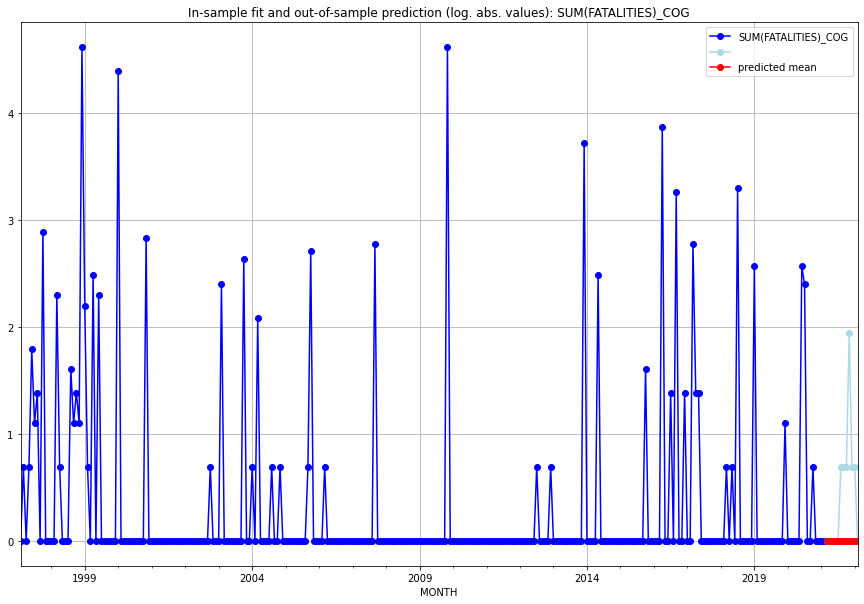

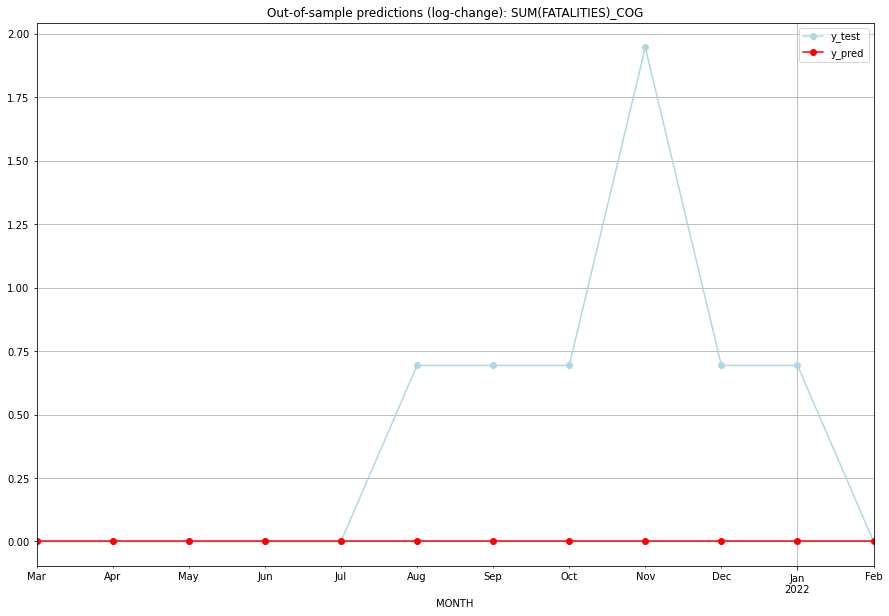

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.693147           0.0        0.693147
6   2021-09       0.0    0.693147           0.0        0.693147
7   2021-10       0.0    0.693147           0.0        0.693147
8   2021-11       0.0    1.945910           0.0        1.945910
9   2021-12       0.0    0.693147           0.0        0.693147
10  2022-01       0.0    0.693147           0.0        0.693147
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.4509705043212533
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0

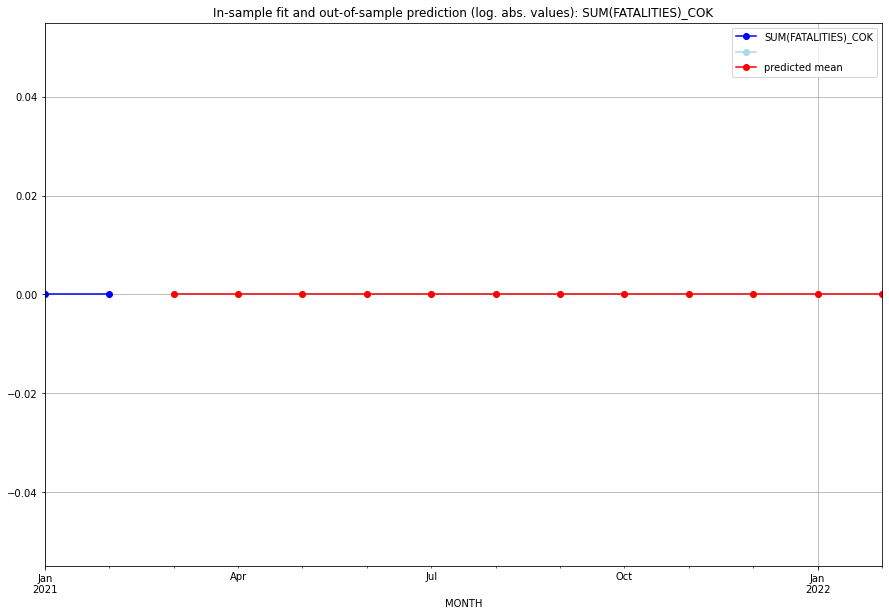

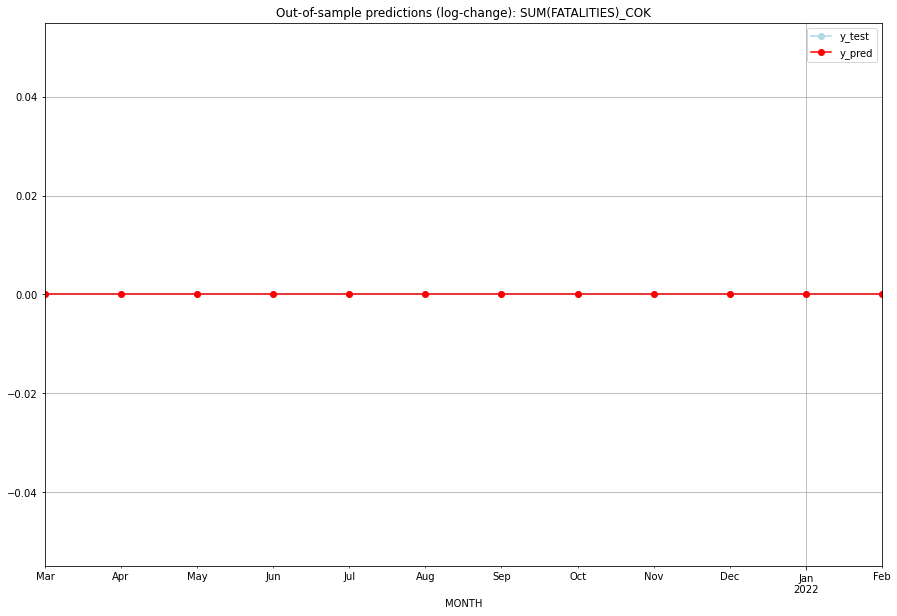

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

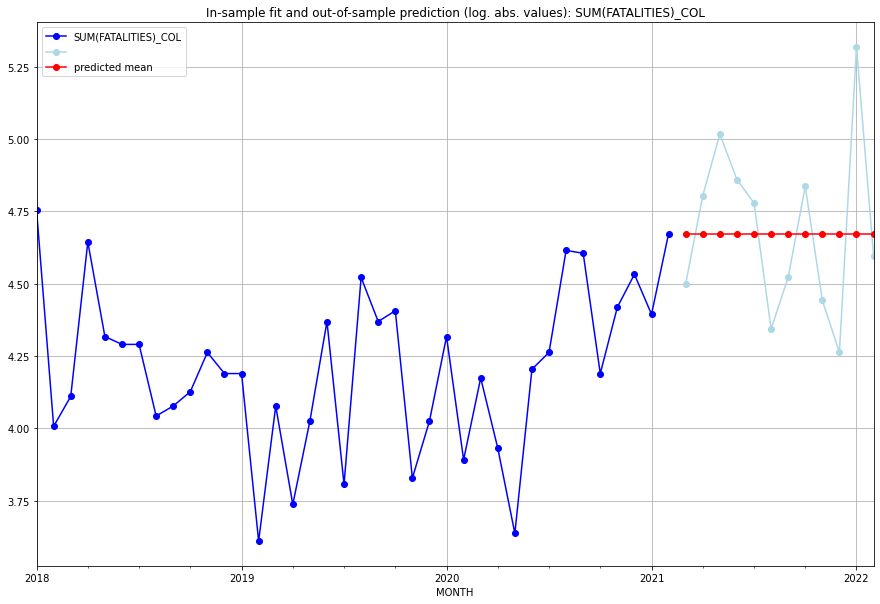

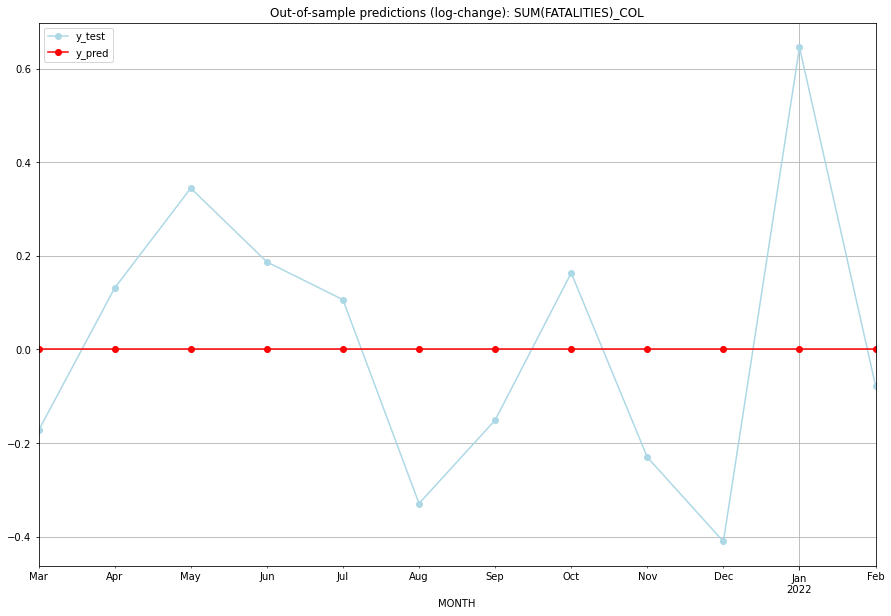

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  4.672829    4.499810           0.0       -0.173019
1   2021-04  4.672829    4.804021           0.0        0.131192
2   2021-05  4.672829    5.017280           0.0        0.344451
3   2021-06  4.672829    4.859812           0.0        0.186984
4   2021-07  4.672829    4.779123           0.0        0.106295
5   2021-08  4.672829    4.343805           0.0       -0.329023
6   2021-09  4.672829    4.521789           0.0       -0.151040
7   2021-10  4.672829    4.836282           0.0        0.163453
8   2021-11  4.672829    4.442651           0.0       -0.230178
9   2021-12  4.672829    4.262680           0.0       -0.410149
10  2022-01  4.672829    5.318120           0.0        0.645291
11  2022-02  4.672829    4.595120           0.0       -0.077709
TADDA: 0.24573200224315536
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  4.672829    4.499810           0.

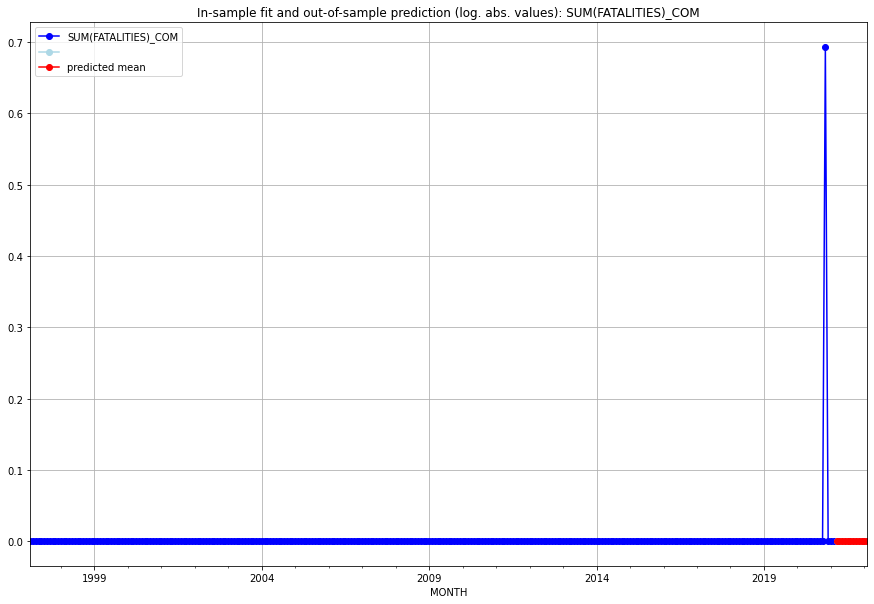

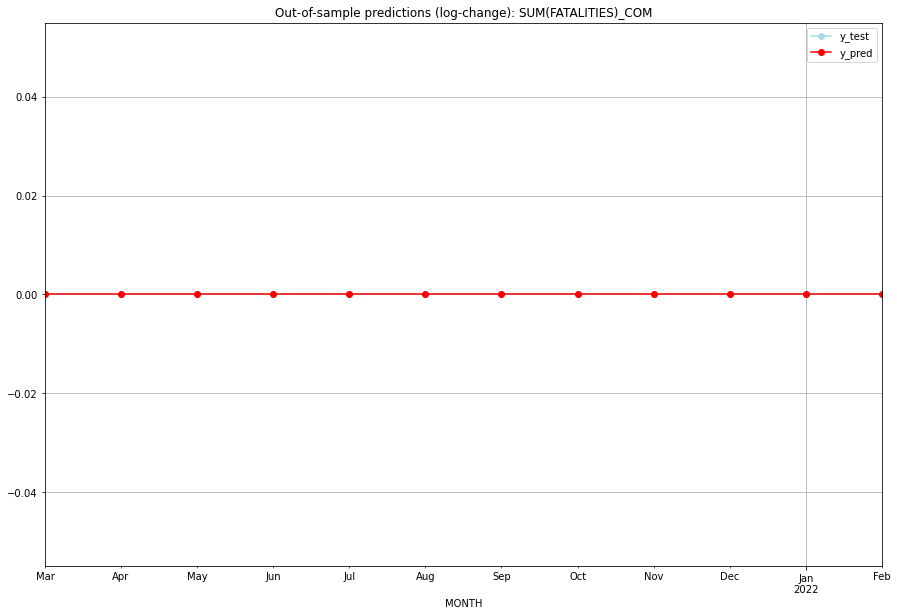

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

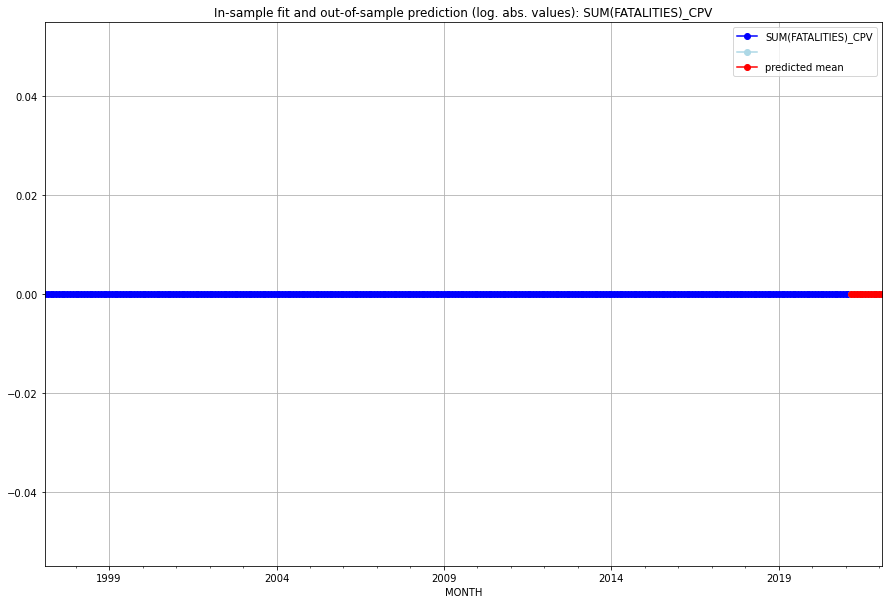

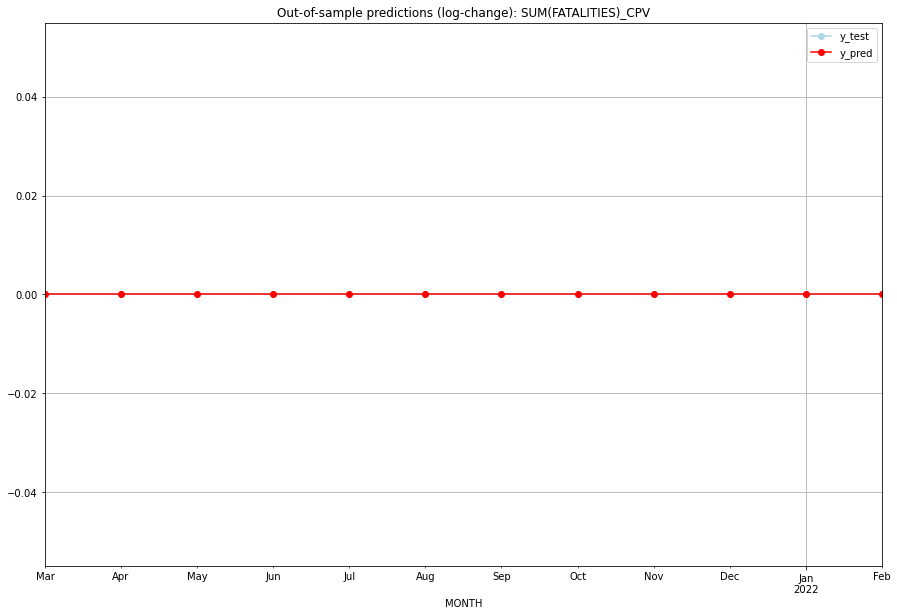

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

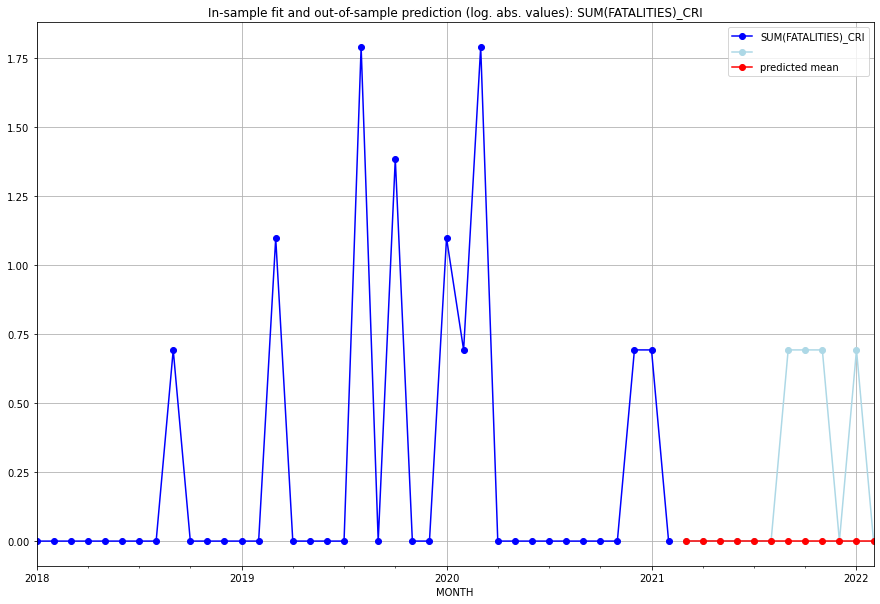

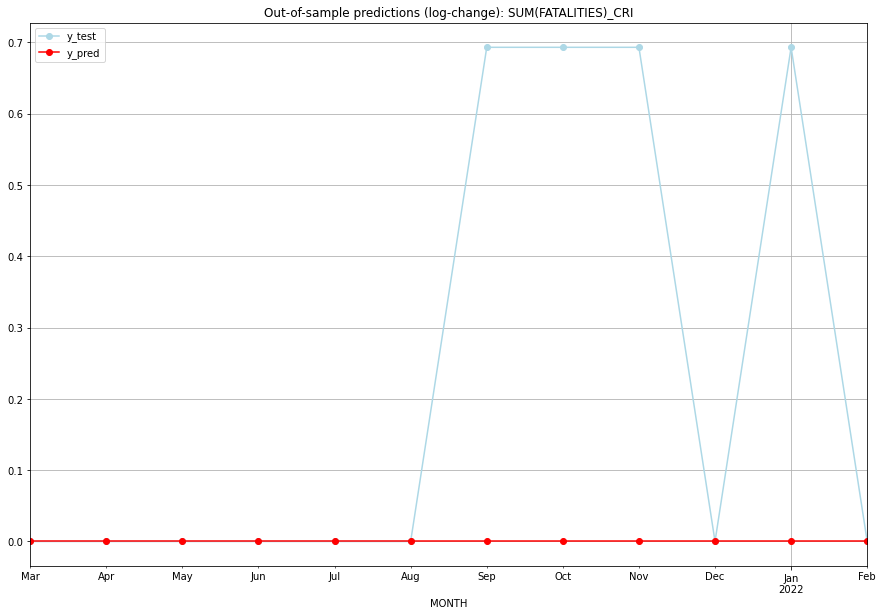

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.693147           0.0        0.693147
7   2021-10       0.0    0.693147           0.0        0.693147
8   2021-11       0.0    0.693147           0.0        0.693147
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.693147           0.0        0.693147
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.23104906018664842
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

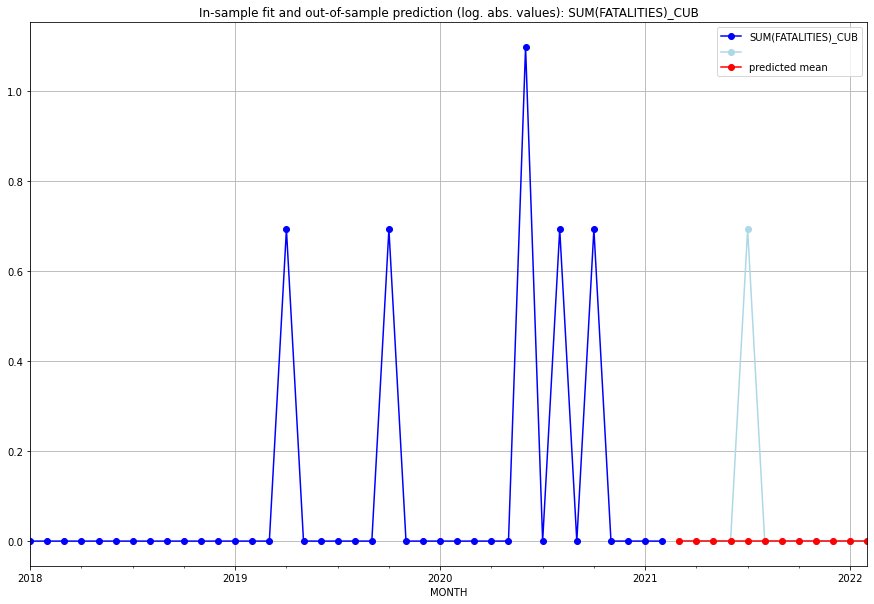

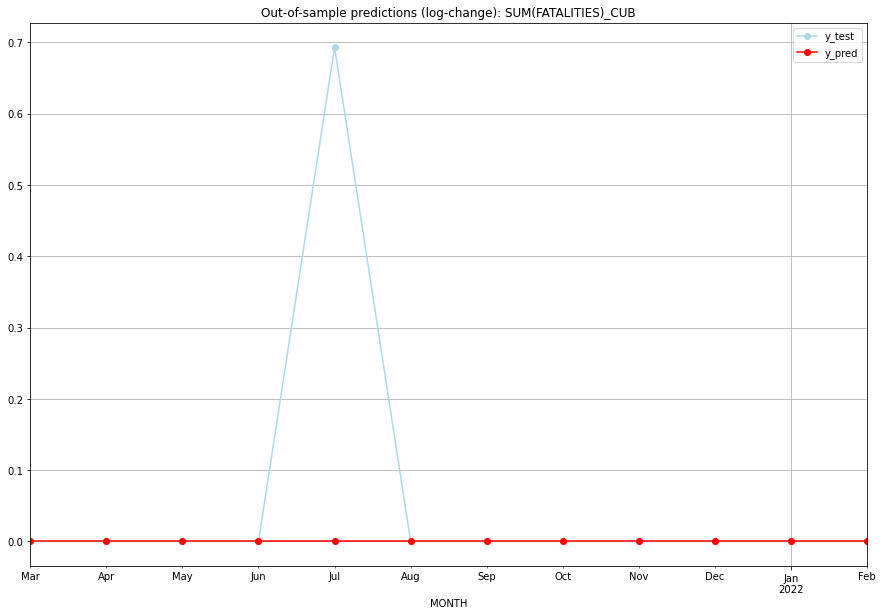

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.693147           0.0        0.693147
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

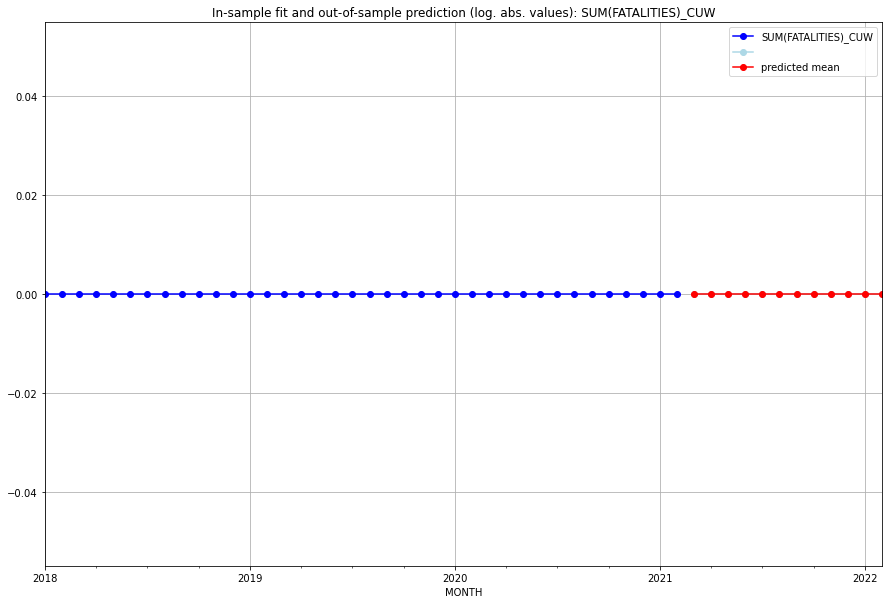

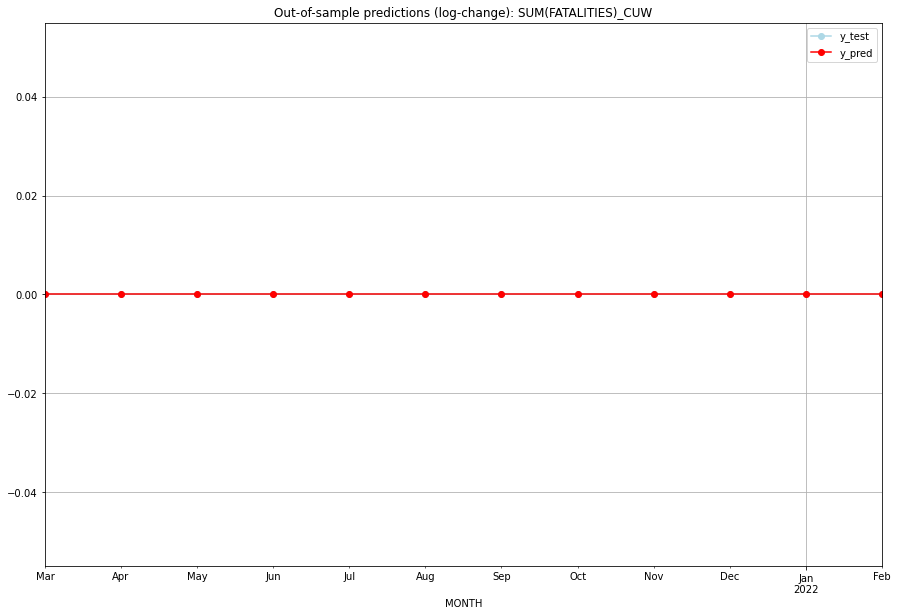

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

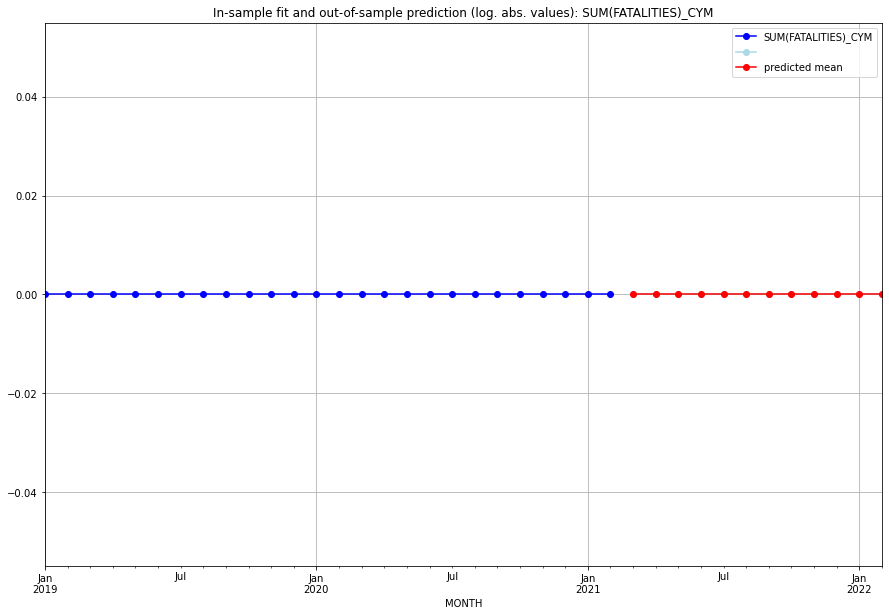

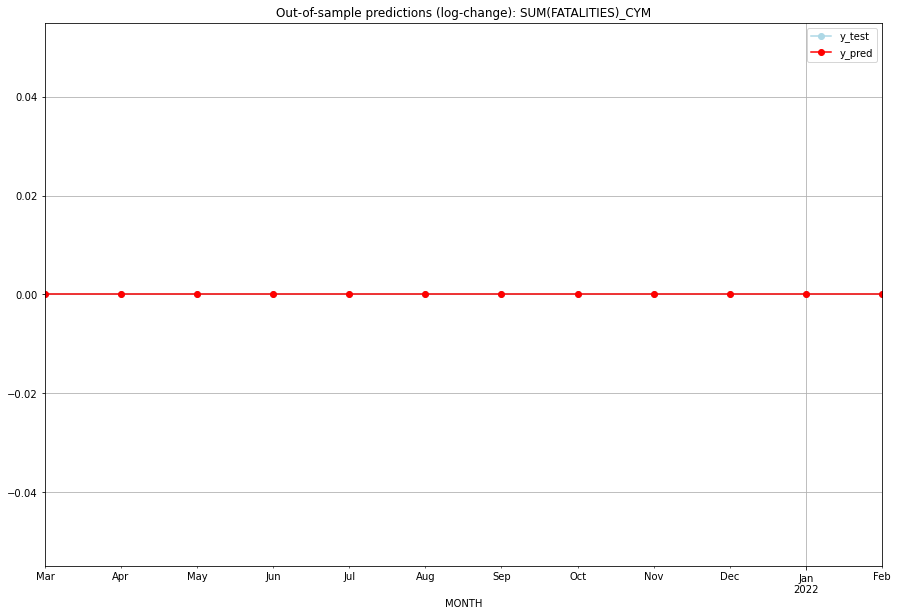

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

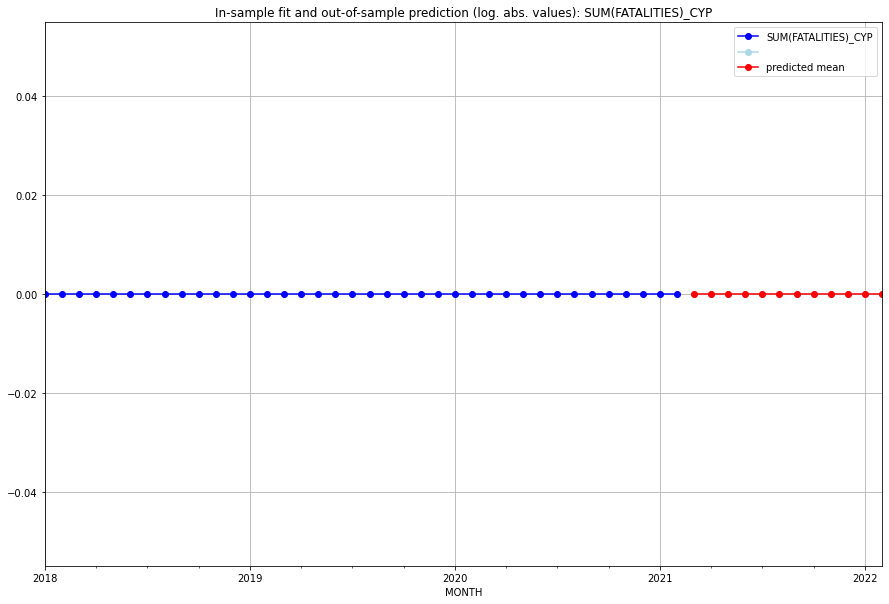

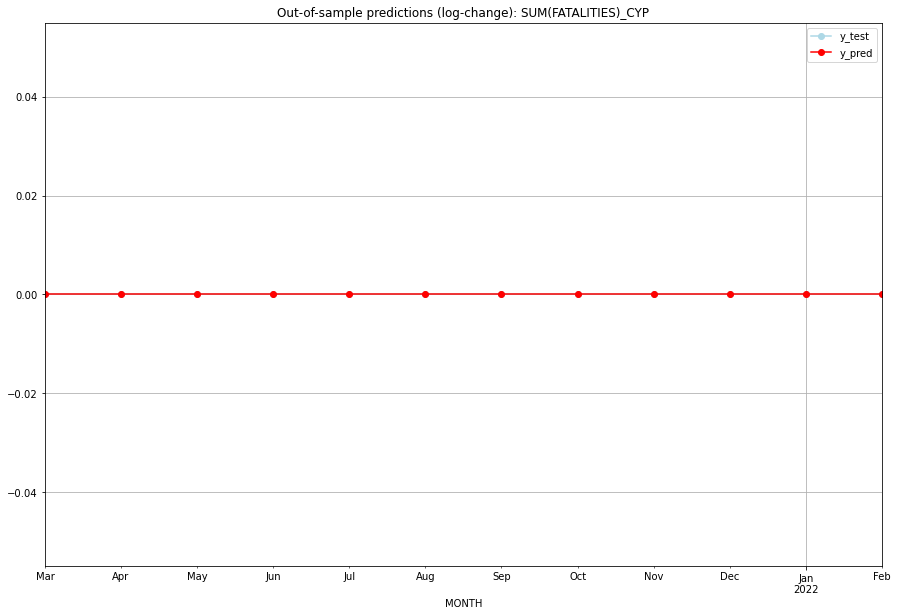

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

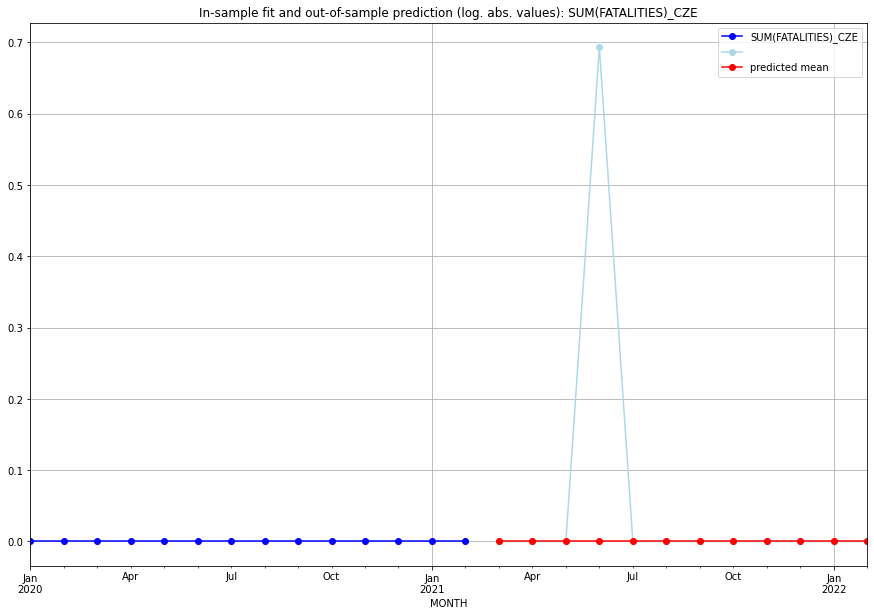

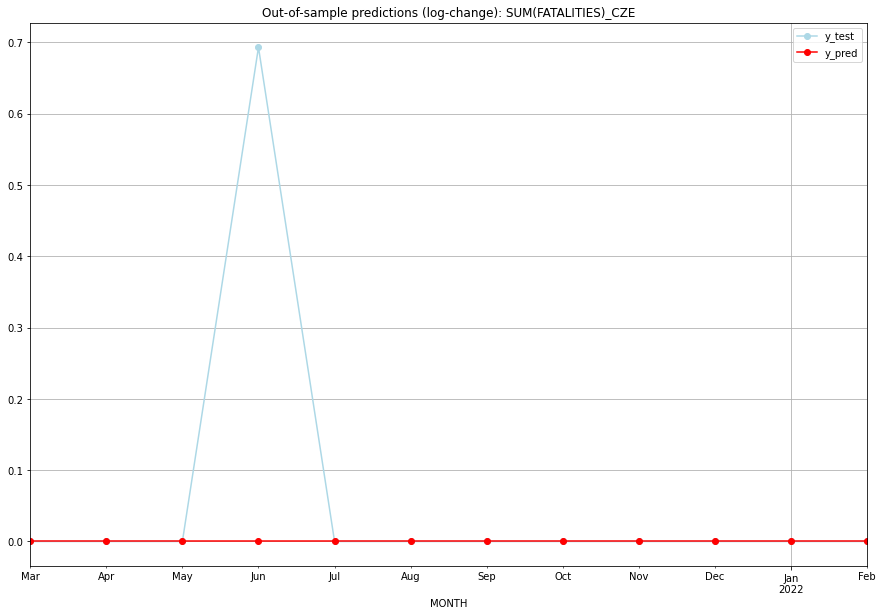

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.693147           0.0        0.693147
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

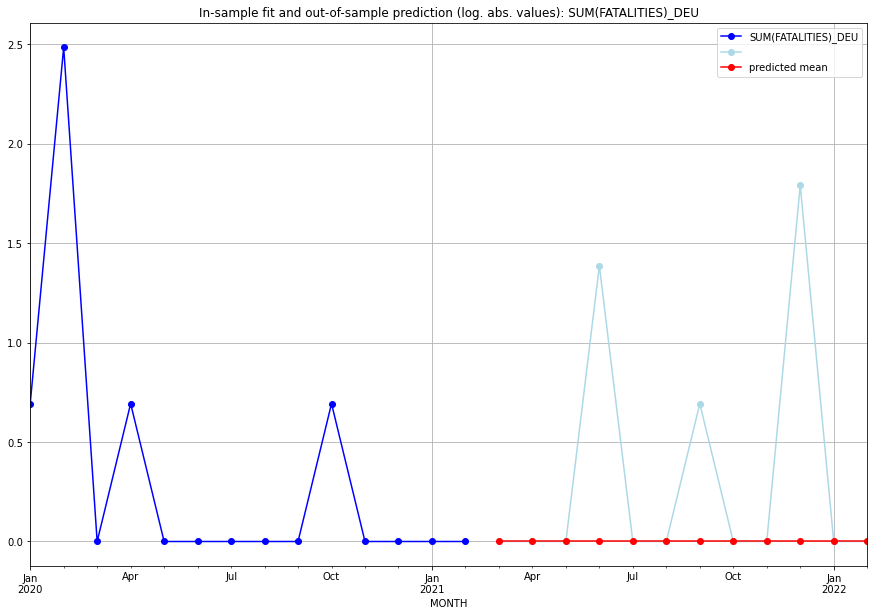

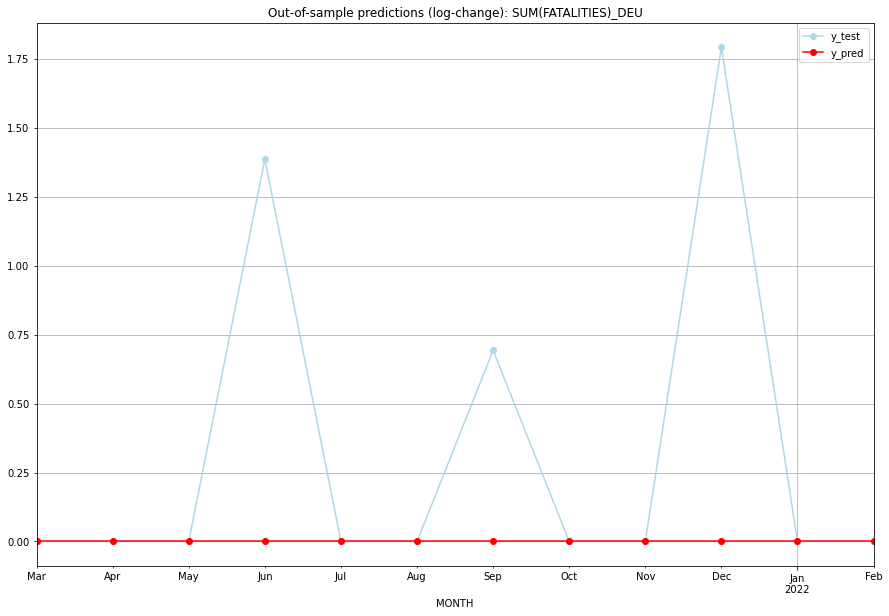

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    1.386294           0.0        1.386294
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.693147           0.0        0.693147
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    1.791759           0.0        1.791759
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.3226000842423242
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0

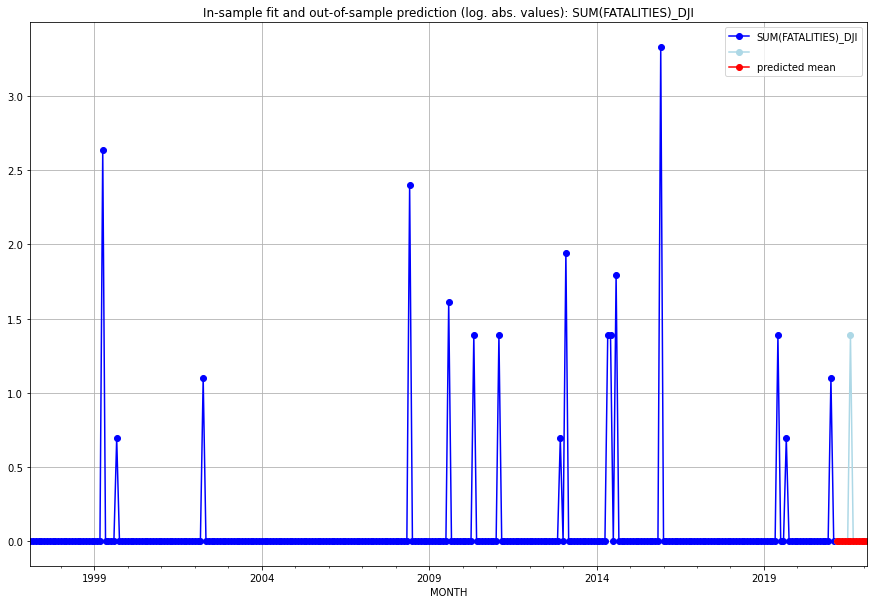

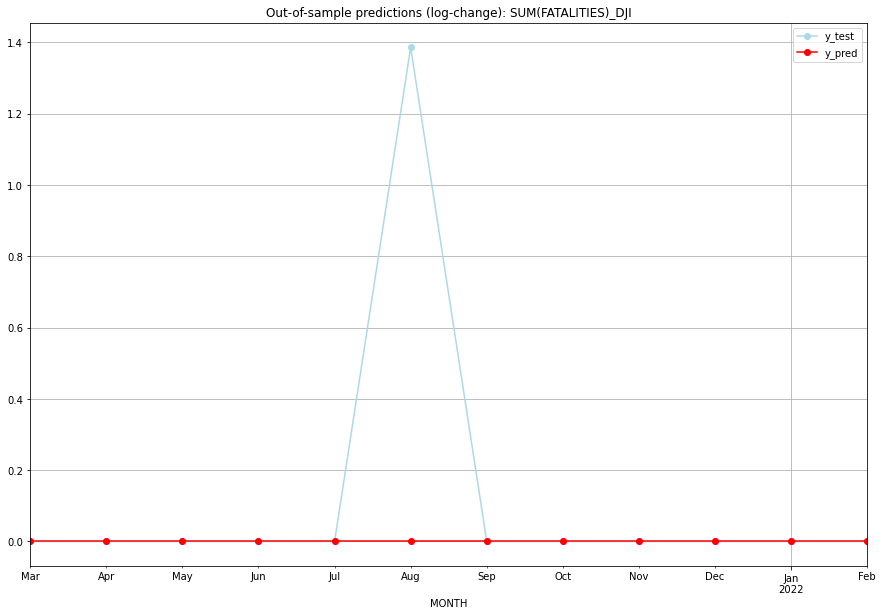

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    1.386294           0.0        1.386294
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.11552453009332421
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

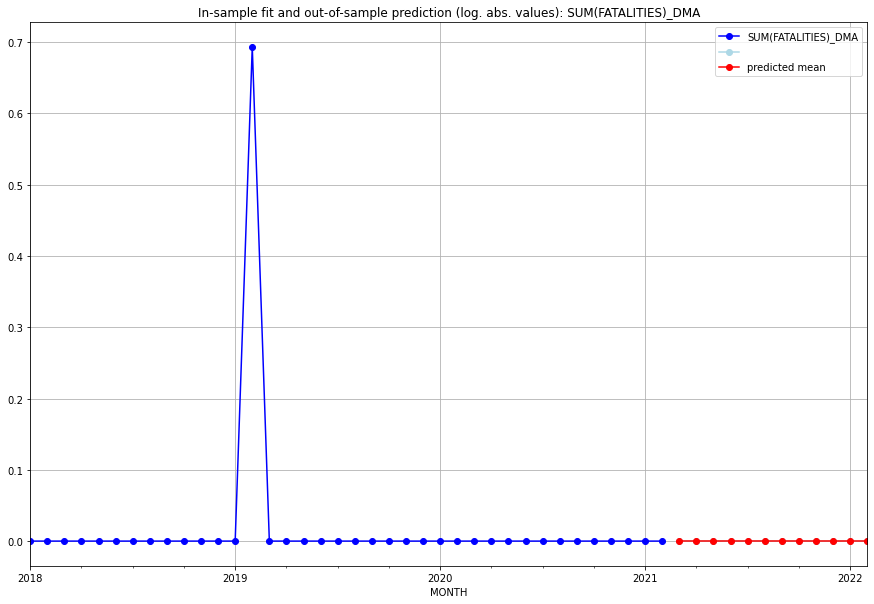

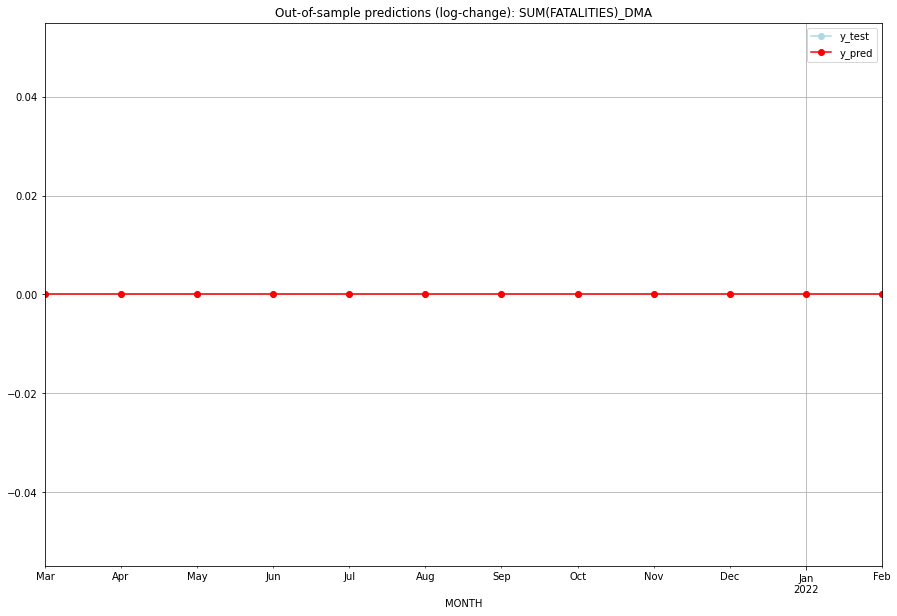

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

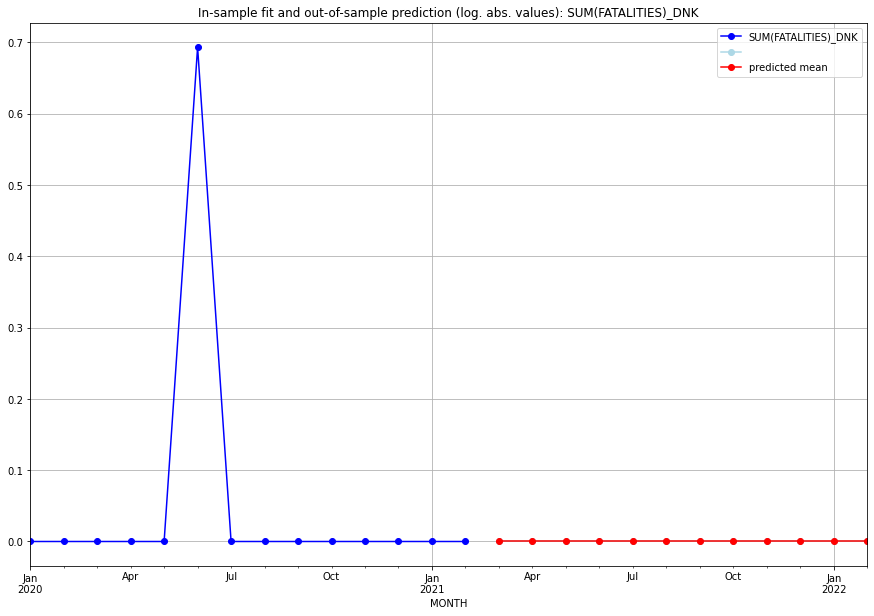

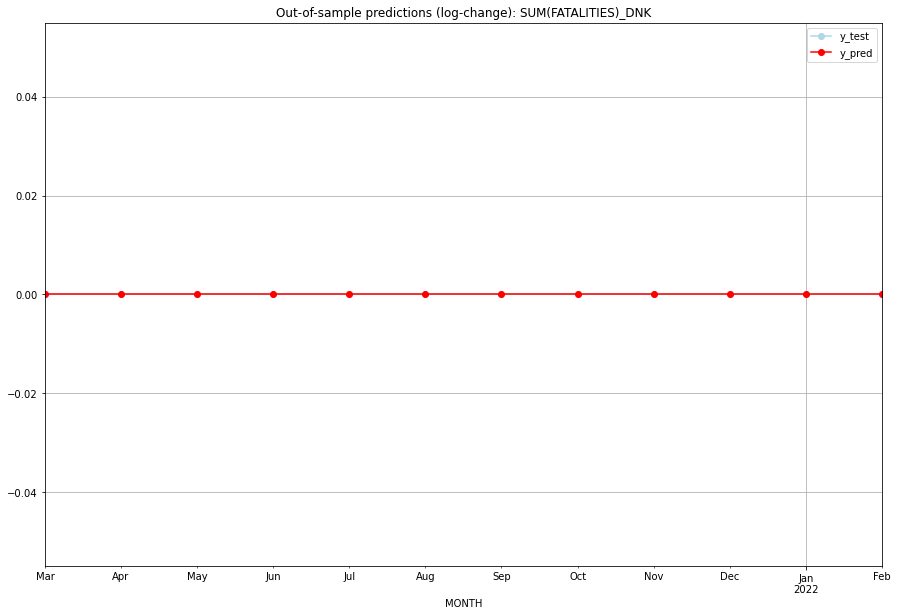

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

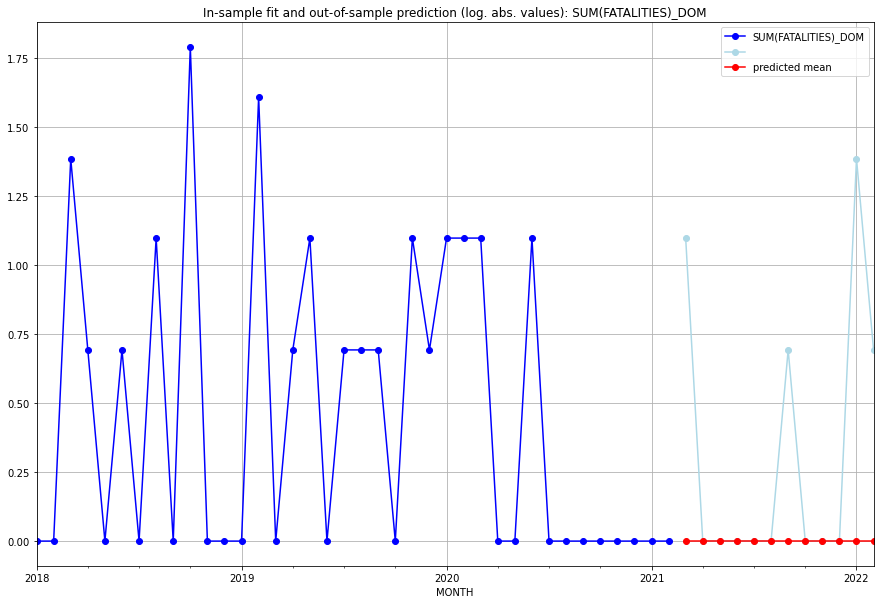

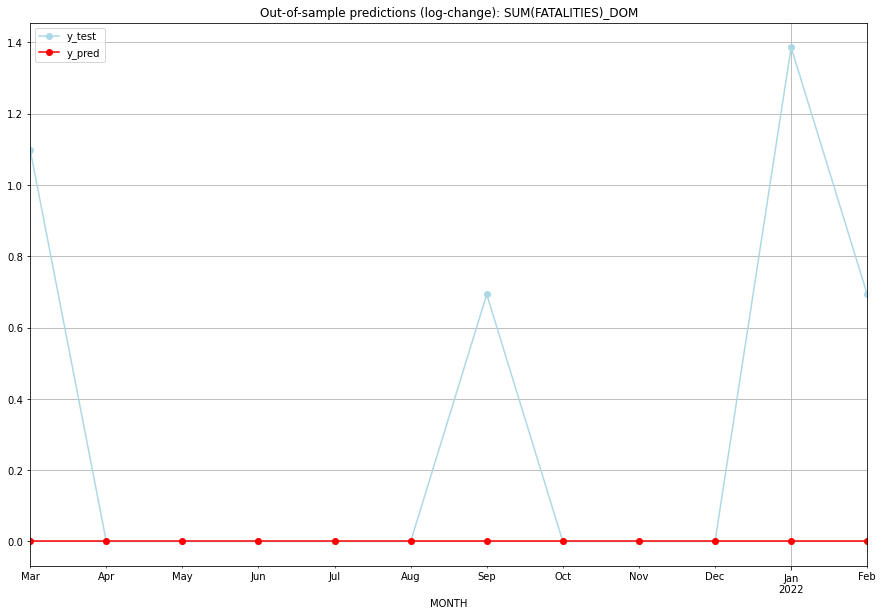

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    1.098612           0.0        1.098612
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.693147           0.0        0.693147
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    1.386294           0.0        1.386294
11  2022-02       0.0    0.693147           0.0        0.693147
TADDA: 0.3226000842423242
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    1.098612           0.0

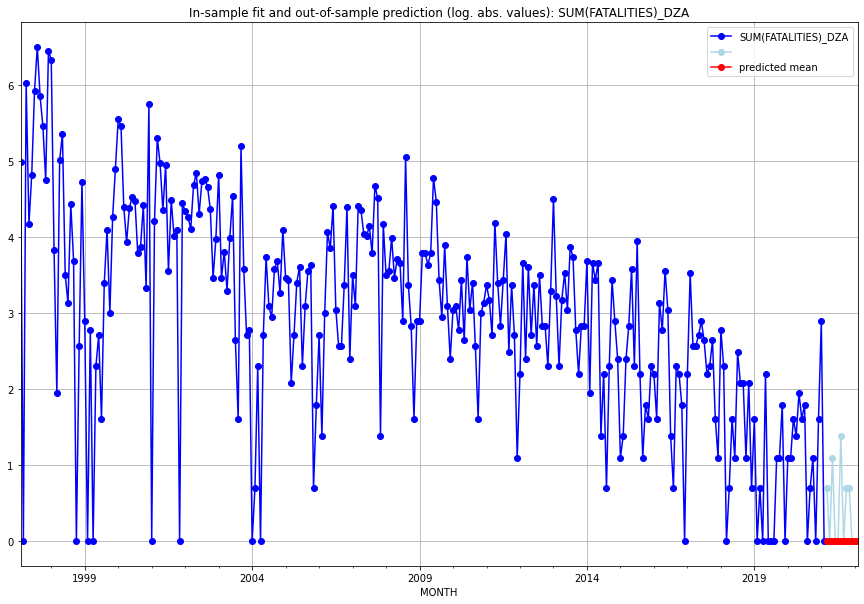

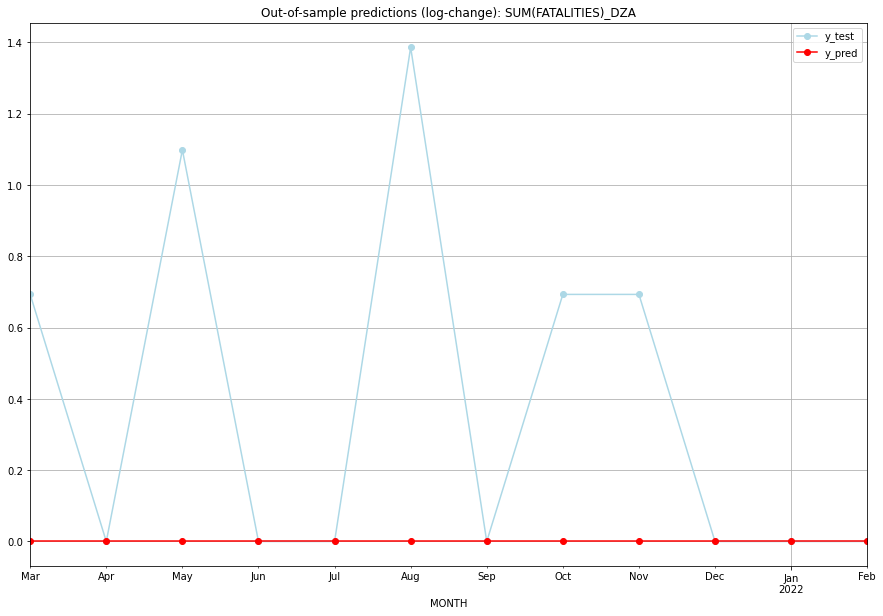

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.693147           0.0        0.693147
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    1.098612           0.0        1.098612
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    1.386294           0.0        1.386294
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.693147           0.0        0.693147
8   2021-11       0.0    0.693147           0.0        0.693147
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.3803623492889863
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.693147           0.0

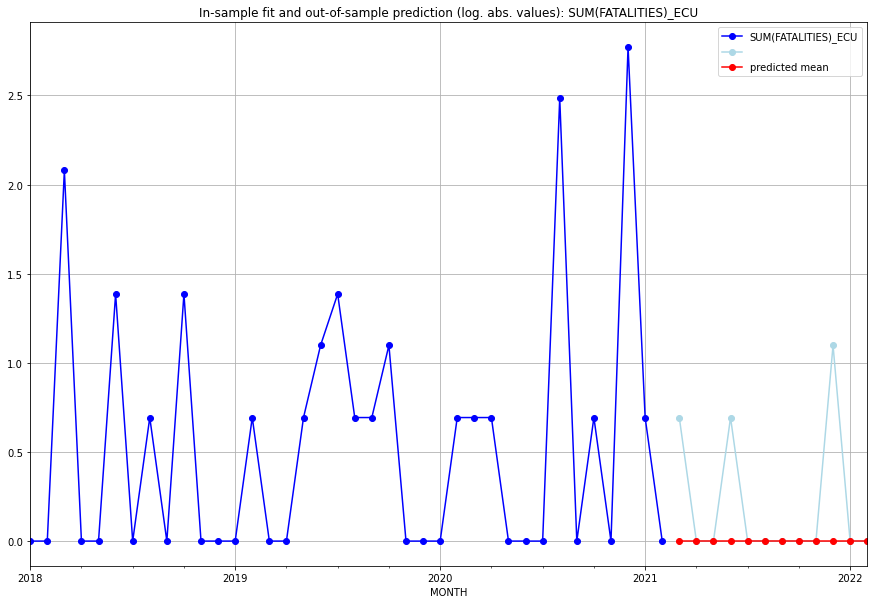

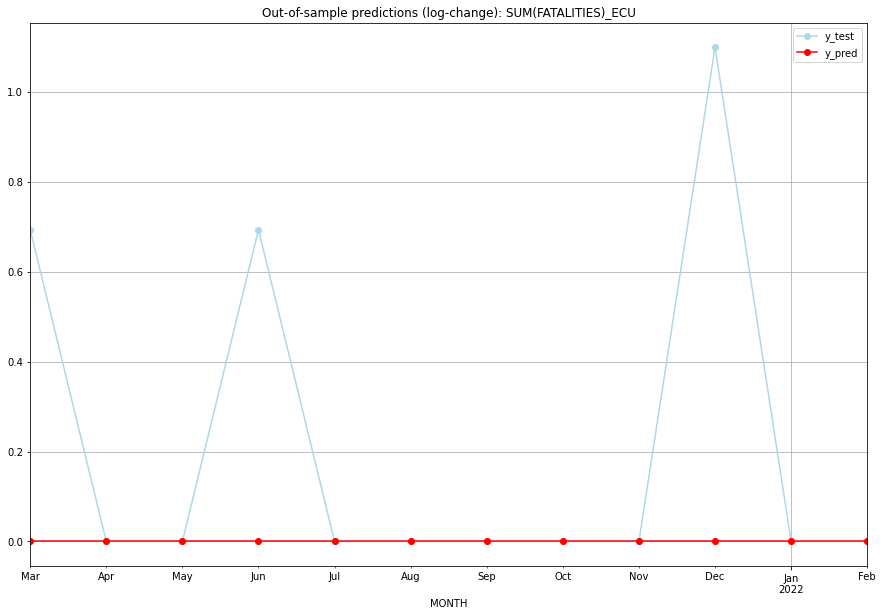

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.693147           0.0        0.693147
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.693147           0.0        0.693147
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    1.098612           0.0        1.098612
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.20707555414900003
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.693147           0.

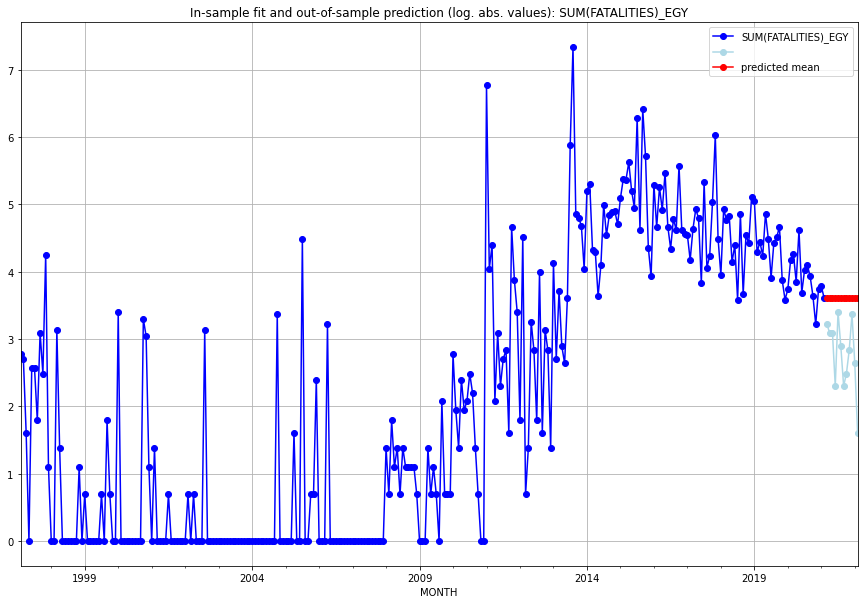

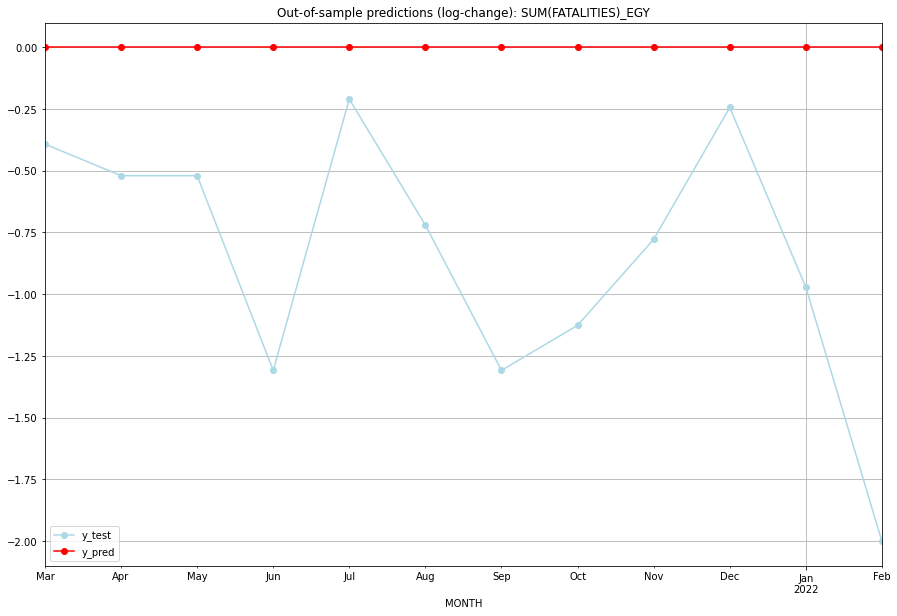

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  3.610918    3.218876           0.0       -0.392042
1   2021-04  3.610918    3.091042           0.0       -0.519875
2   2021-05  3.610918    3.091042           0.0       -0.519875
3   2021-06  3.610918    2.302585           0.0       -1.308333
4   2021-07  3.610918    3.401197           0.0       -0.209721
5   2021-08  3.610918    2.890372           0.0       -0.720546
6   2021-09  3.610918    2.302585           0.0       -1.308333
7   2021-10  3.610918    2.484907           0.0       -1.126011
8   2021-11  3.610918    2.833213           0.0       -0.777705
9   2021-12  3.610918    3.367296           0.0       -0.243622
10  2022-01  3.610918    2.639057           0.0       -0.971861
11  2022-02  3.610918    1.609438           0.0       -2.001480
TADDA: 0.841616985726616
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  3.610918    3.218876           0.0 

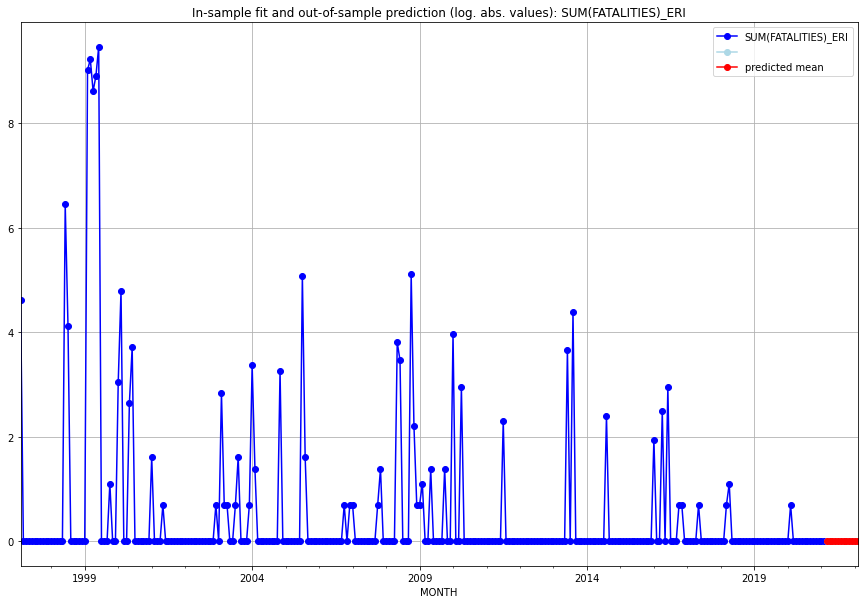

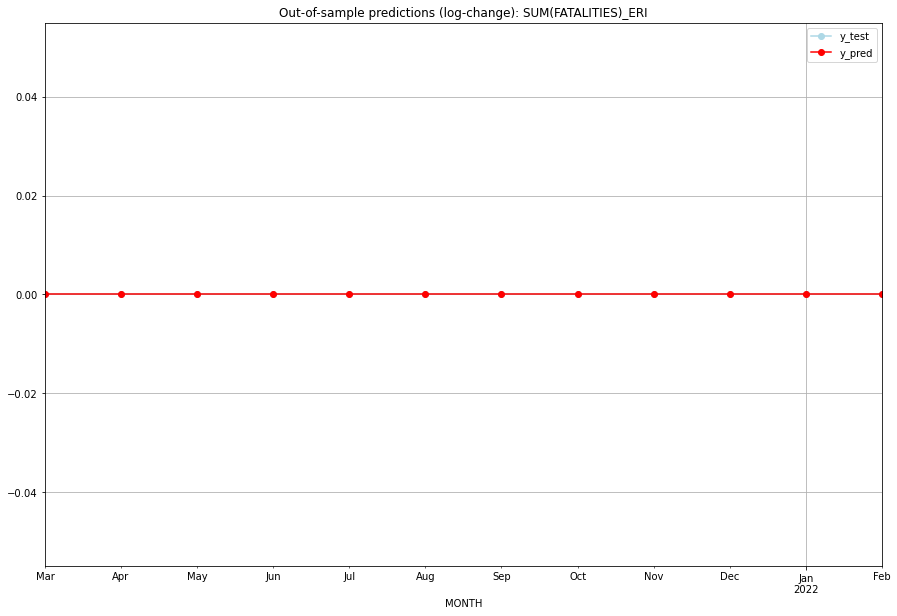

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

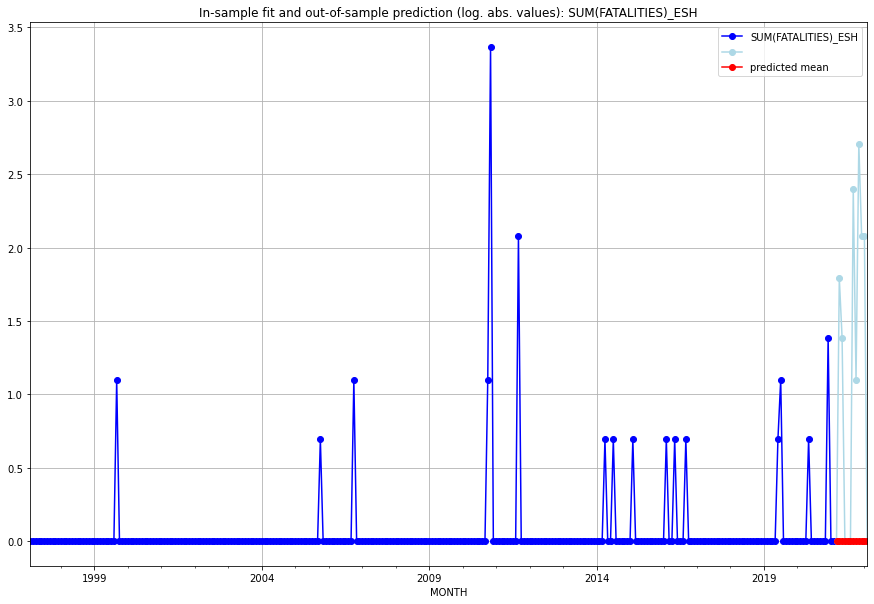

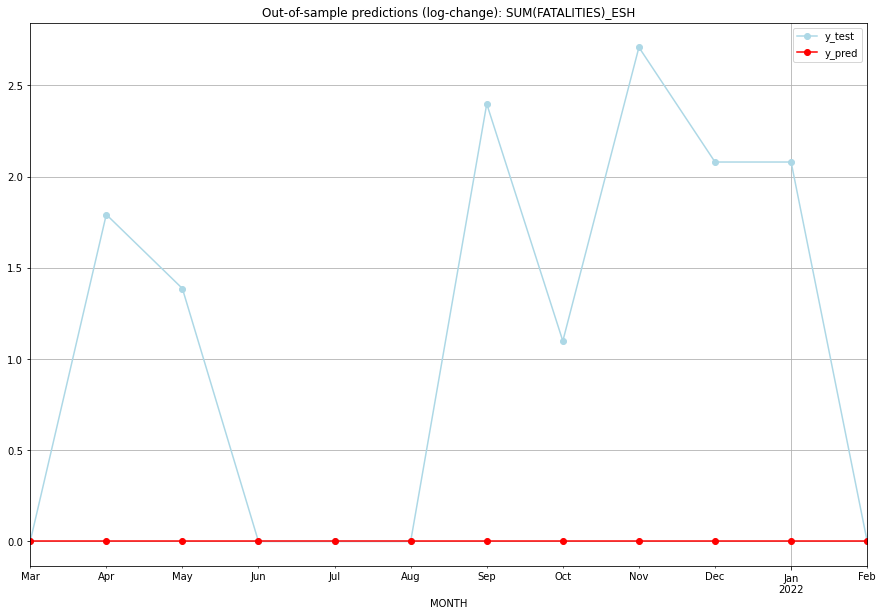

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    1.791759           0.0        1.791759
2   2021-05       0.0    1.386294           0.0        1.386294
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    2.397895           0.0        2.397895
7   2021-10       0.0    1.098612           0.0        1.098612
8   2021-11       0.0    2.708050           0.0        2.708050
9   2021-12       0.0    2.079442           0.0        2.079442
10  2022-01       0.0    2.079442           0.0        2.079442
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 1.1284578896896924
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0

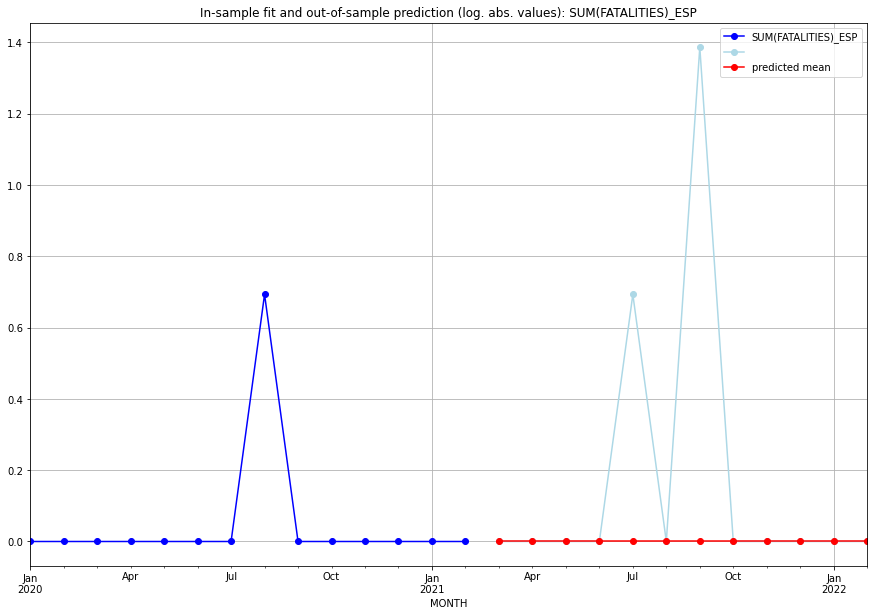

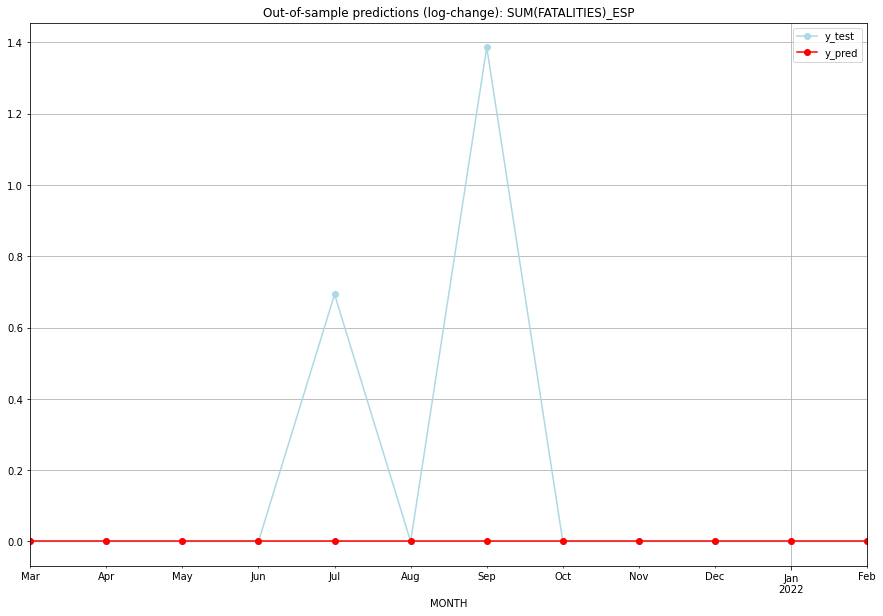

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.693147           0.0        0.693147
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    1.386294           0.0        1.386294
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

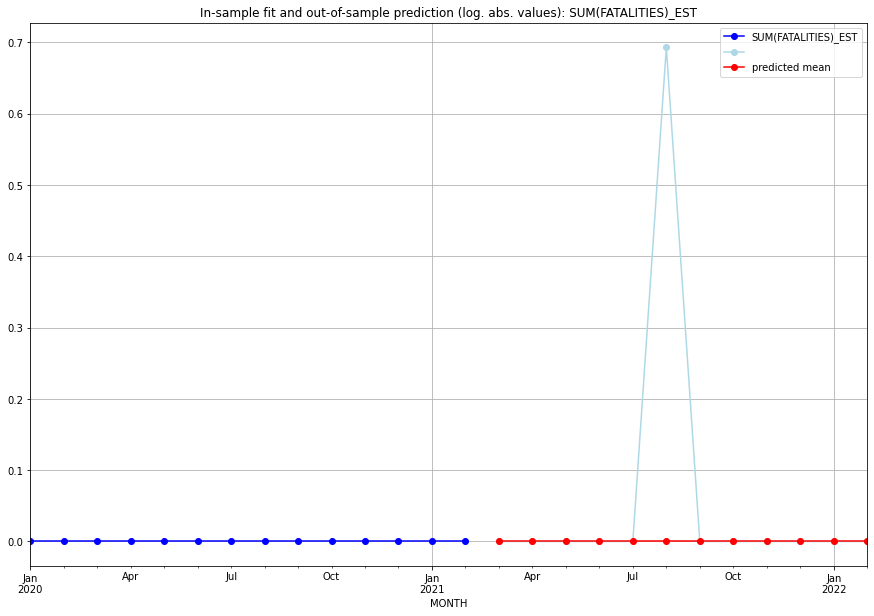

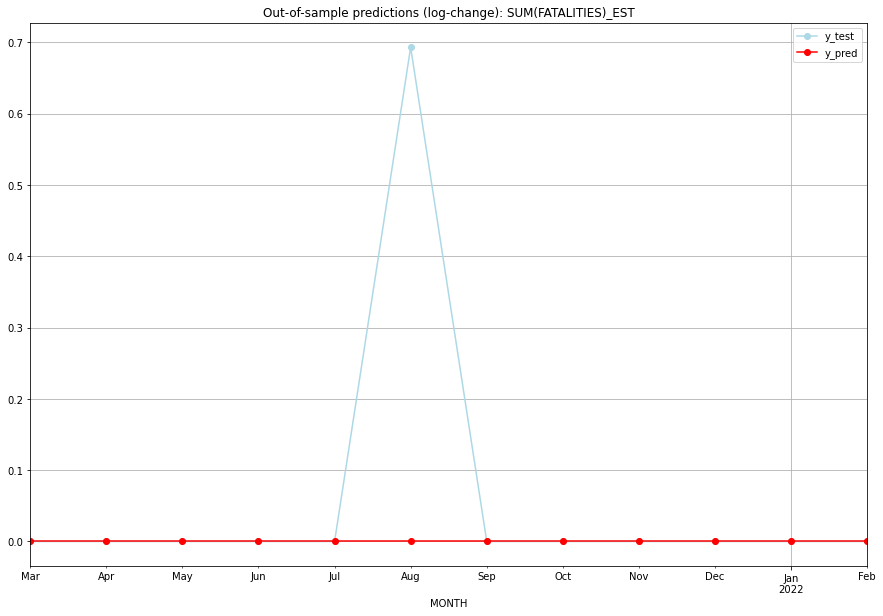

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.693147           0.0        0.693147
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

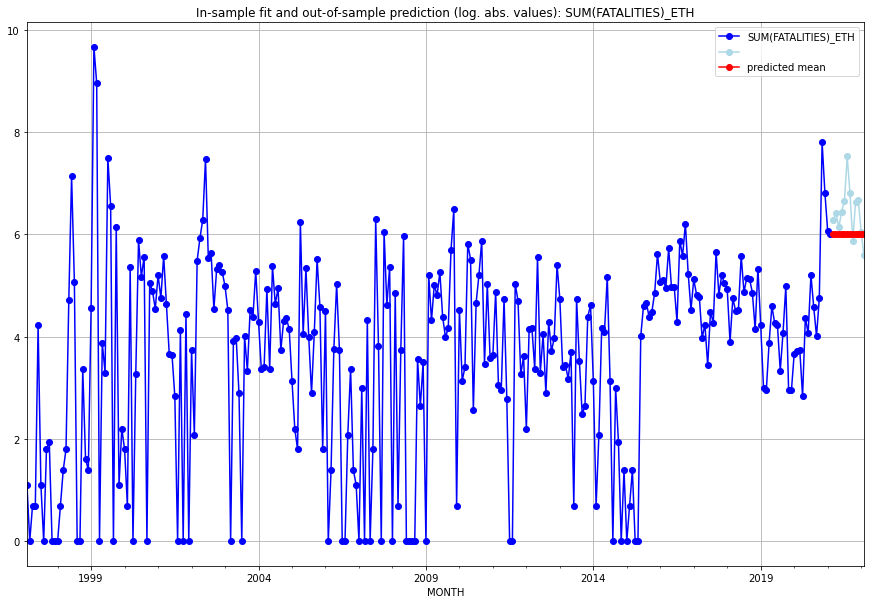

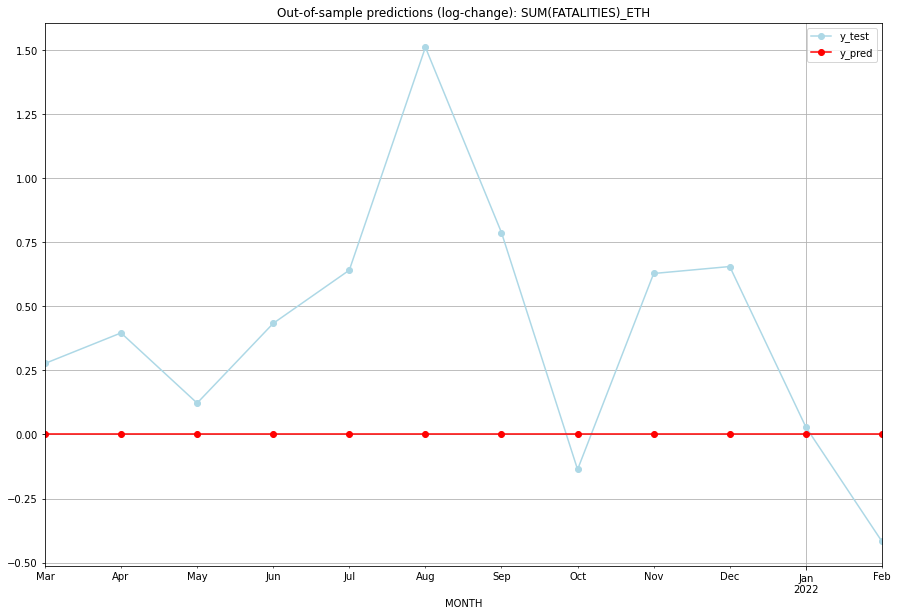

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  6.008813    6.285998           0.0        0.277185
1   2021-04  6.008813    6.405228           0.0        0.396415
2   2021-05  6.008813    6.131226           0.0        0.122413
3   2021-06  6.008813    6.442540           0.0        0.433727
4   2021-07  6.008813    6.650279           0.0        0.641466
5   2021-08  6.008813    7.520235           0.0        1.511421
6   2021-09  6.008813    6.796824           0.0        0.788011
7   2021-10  6.008813    5.872118           0.0       -0.136695
8   2021-11  6.008813    6.637258           0.0        0.628445
9   2021-12  6.008813    6.664409           0.0        0.655596
10  2022-01  6.008813    6.037871           0.0        0.029058
11  2022-02  6.008813    5.590987           0.0       -0.417826
TADDA: 0.5031881874881604
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  6.008813    6.285998           0.0

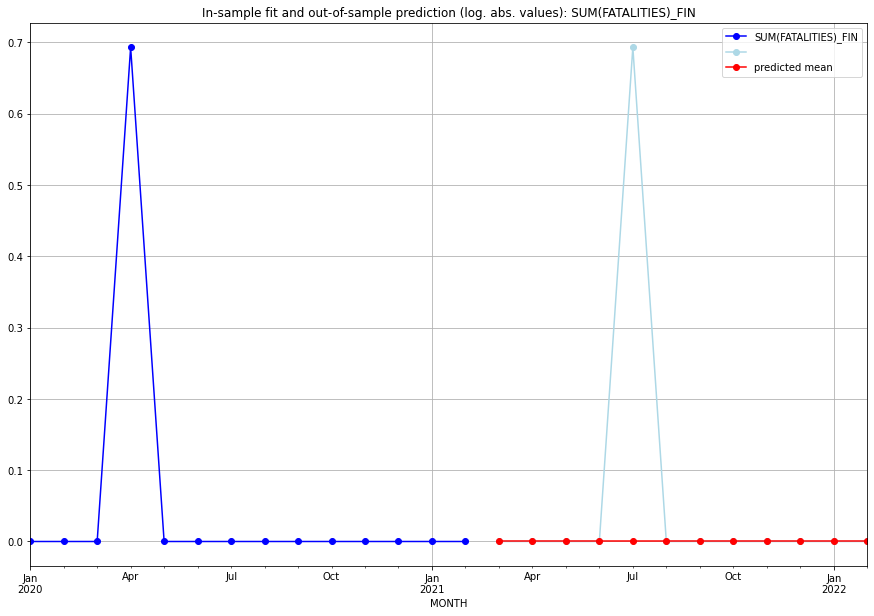

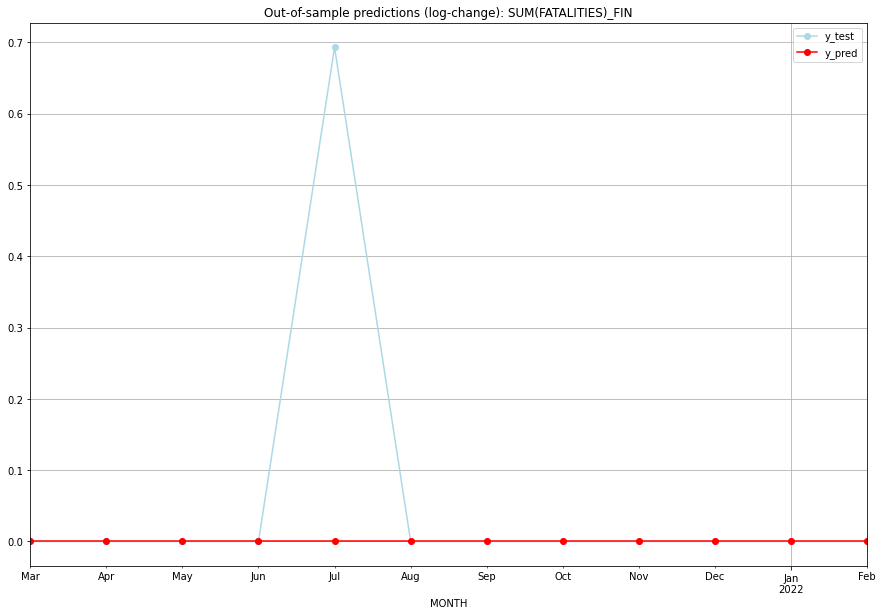

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.693147           0.0        0.693147
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

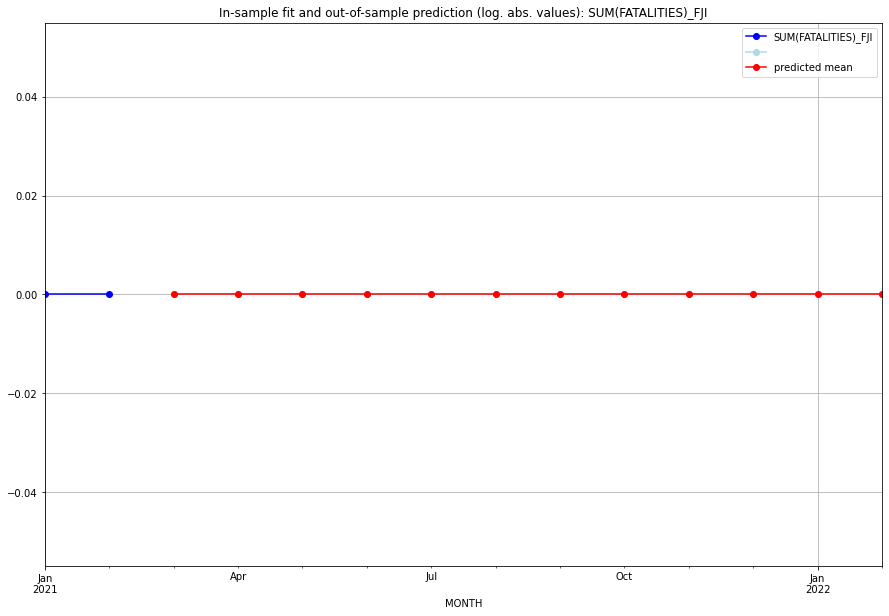

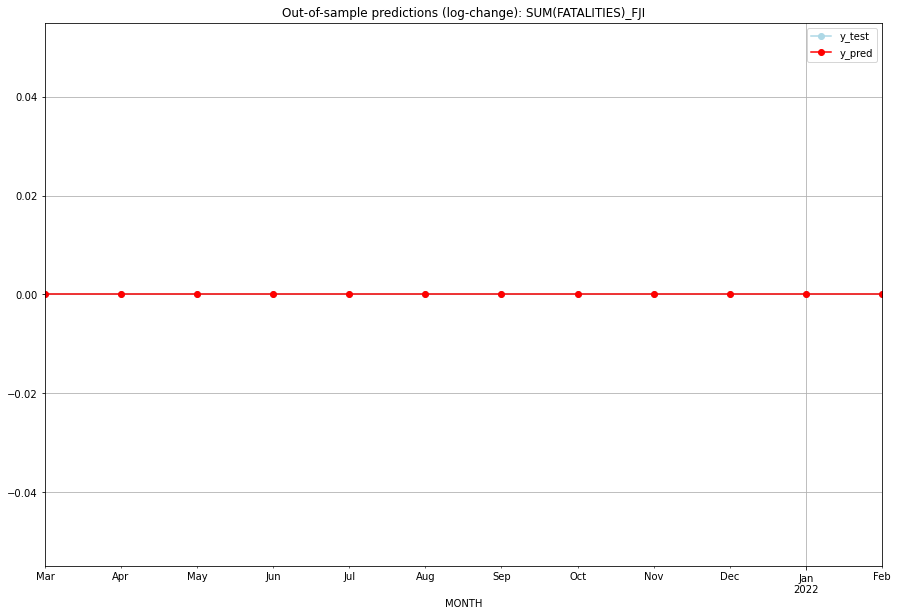

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

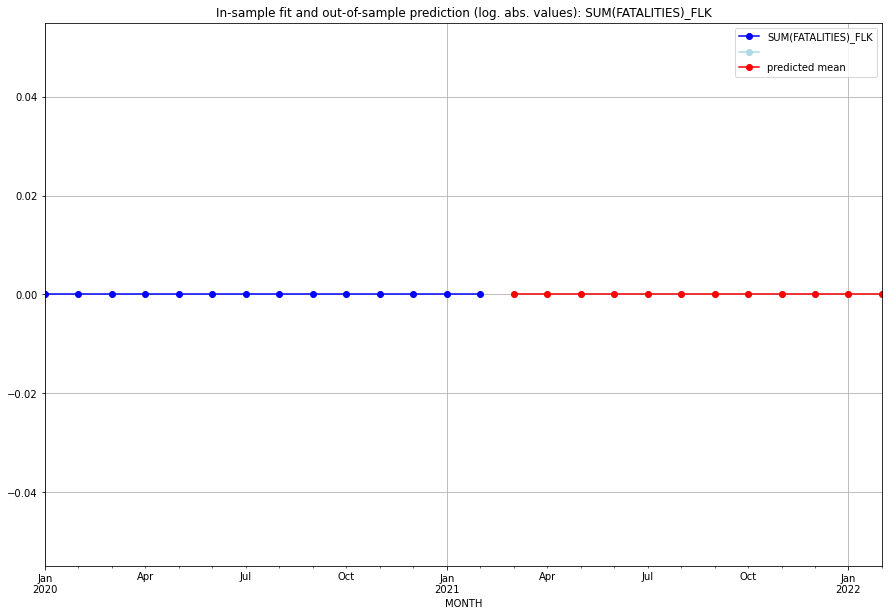

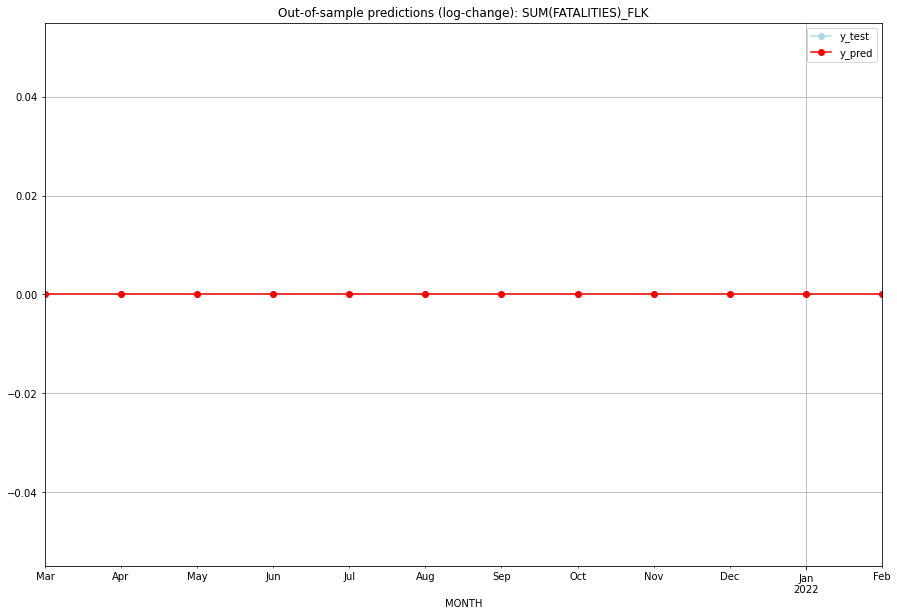

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

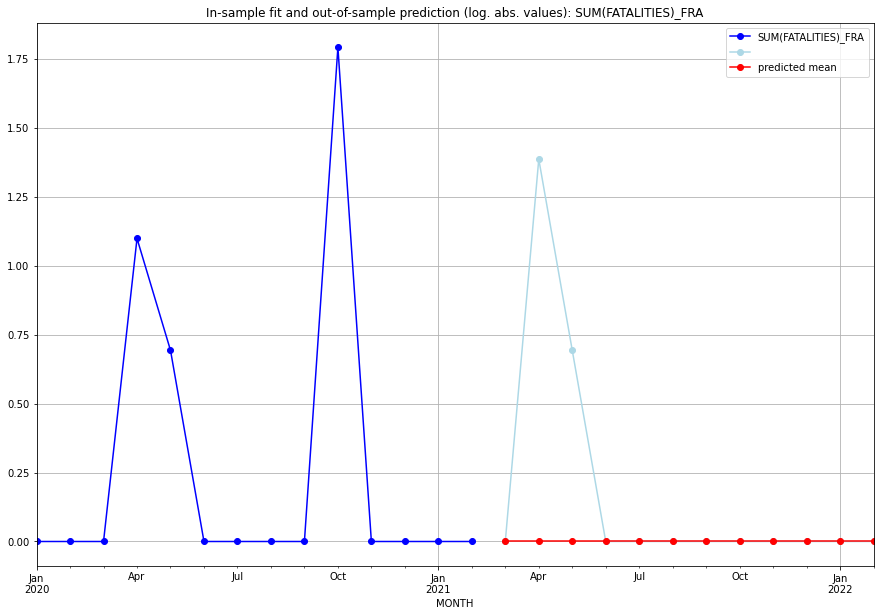

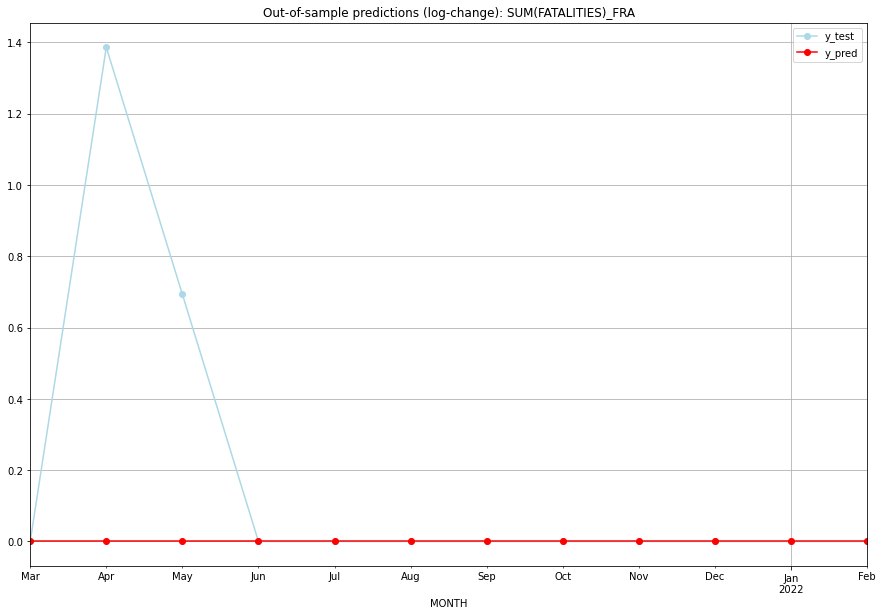

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    1.386294           0.0        1.386294
2   2021-05       0.0    0.693147           0.0        0.693147
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

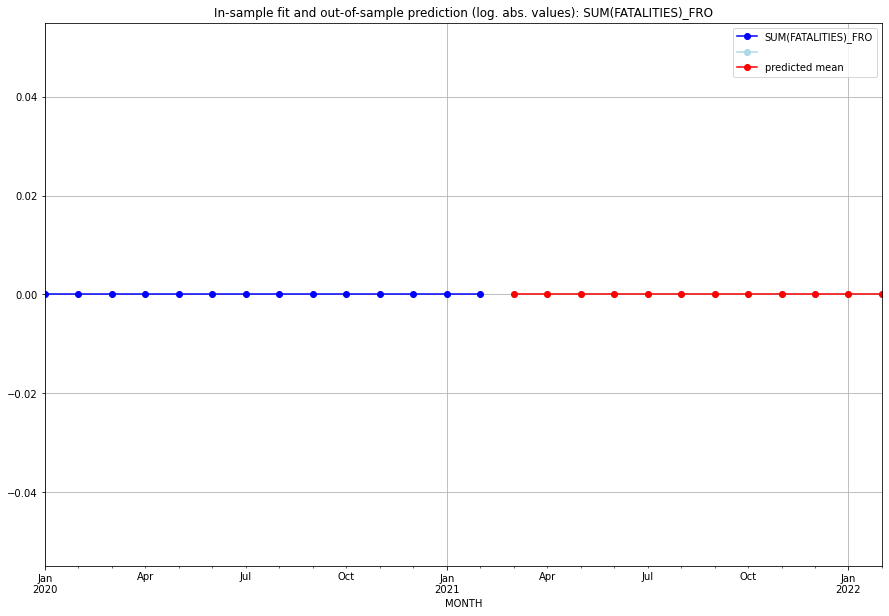

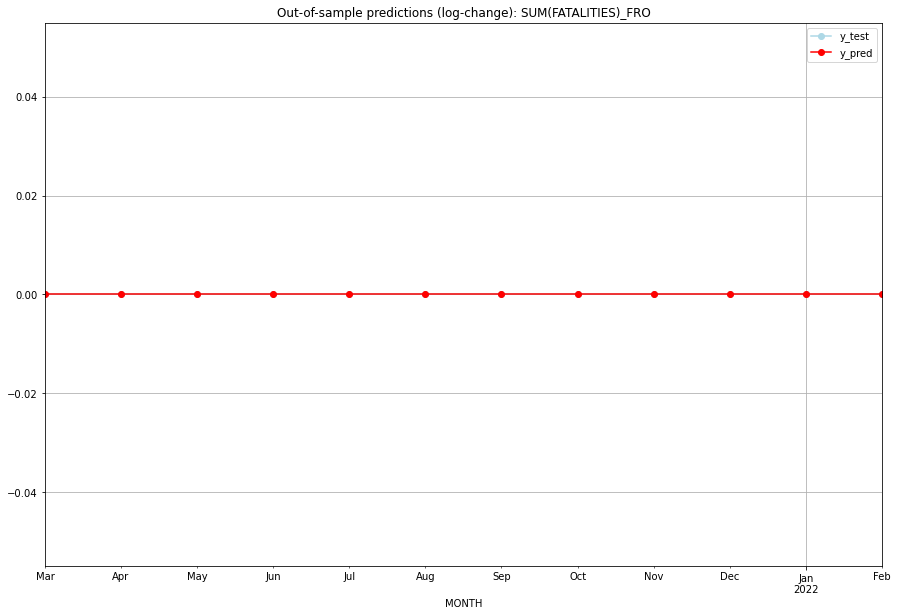

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

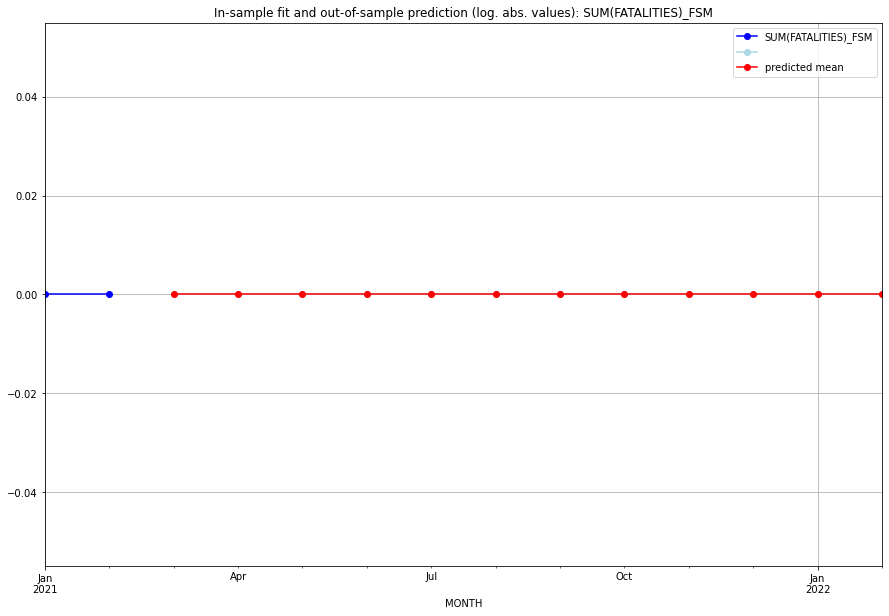

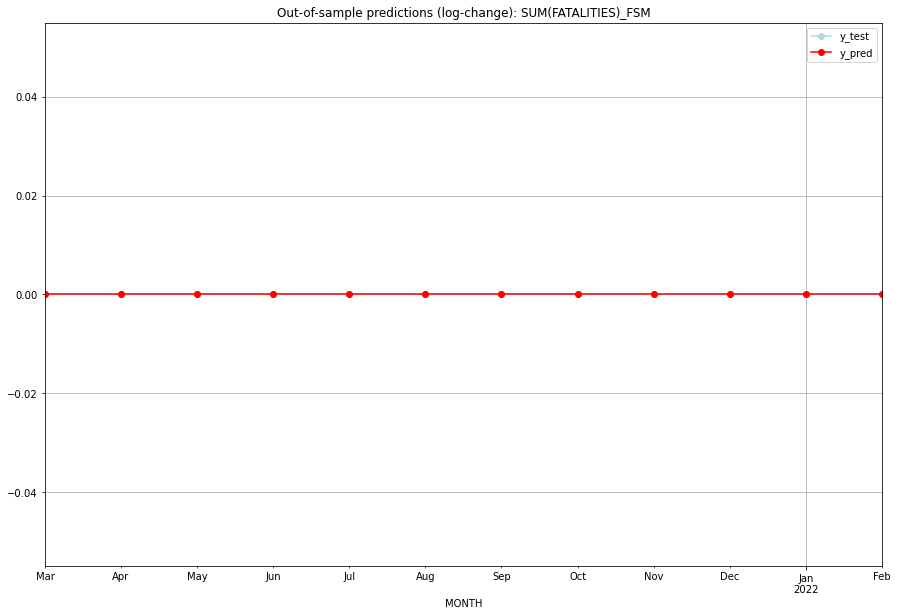

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

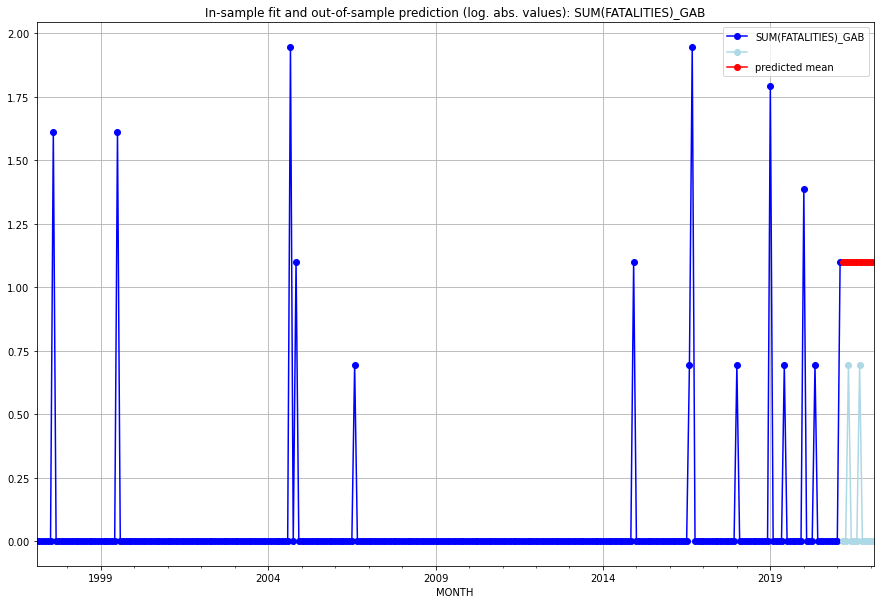

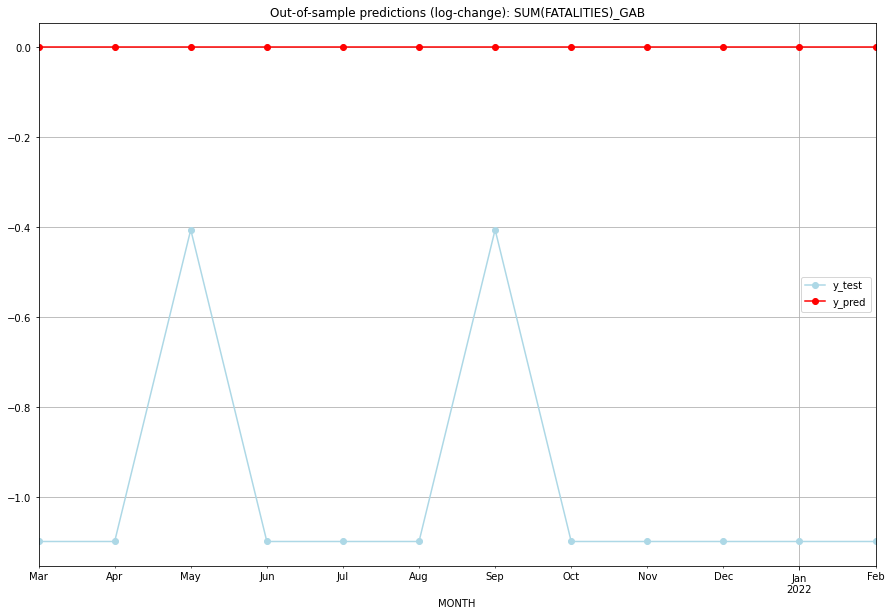

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.098612    0.000000           0.0       -1.098612
1   2021-04  1.098612    0.000000           0.0       -1.098612
2   2021-05  1.098612    0.693147           0.0       -0.405465
3   2021-06  1.098612    0.000000           0.0       -1.098612
4   2021-07  1.098612    0.000000           0.0       -1.098612
5   2021-08  1.098612    0.000000           0.0       -1.098612
6   2021-09  1.098612    0.693147           0.0       -0.405465
7   2021-10  1.098612    0.000000           0.0       -1.098612
8   2021-11  1.098612    0.000000           0.0       -1.098612
9   2021-12  1.098612    0.000000           0.0       -1.098612
10  2022-01  1.098612    0.000000           0.0       -1.098612
11  2022-02  1.098612    0.000000           0.0       -1.098612
TADDA: 0.9830877585747855
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.098612    0.000000           0.0

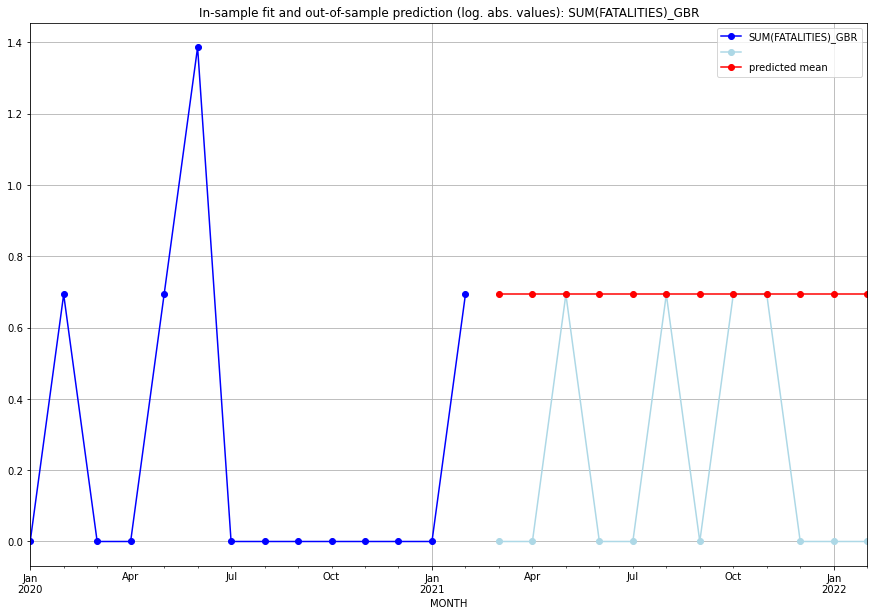

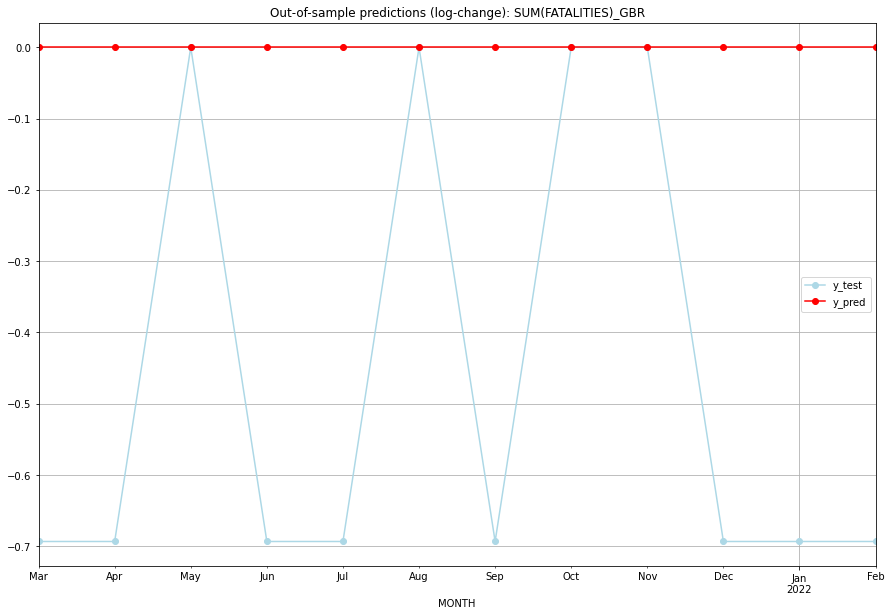

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  0.693147    0.000000           0.0       -0.693147
1   2021-04  0.693147    0.000000           0.0       -0.693147
2   2021-05  0.693147    0.693147           0.0        0.000000
3   2021-06  0.693147    0.000000           0.0       -0.693147
4   2021-07  0.693147    0.000000           0.0       -0.693147
5   2021-08  0.693147    0.693147           0.0        0.000000
6   2021-09  0.693147    0.000000           0.0       -0.693147
7   2021-10  0.693147    0.693147           0.0        0.000000
8   2021-11  0.693147    0.693147           0.0        0.000000
9   2021-12  0.693147    0.000000           0.0       -0.693147
10  2022-01  0.693147    0.000000           0.0       -0.693147
11  2022-02  0.693147    0.000000           0.0       -0.693147
TADDA: 0.46209812037329684
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  0.693147    0.000000           0.

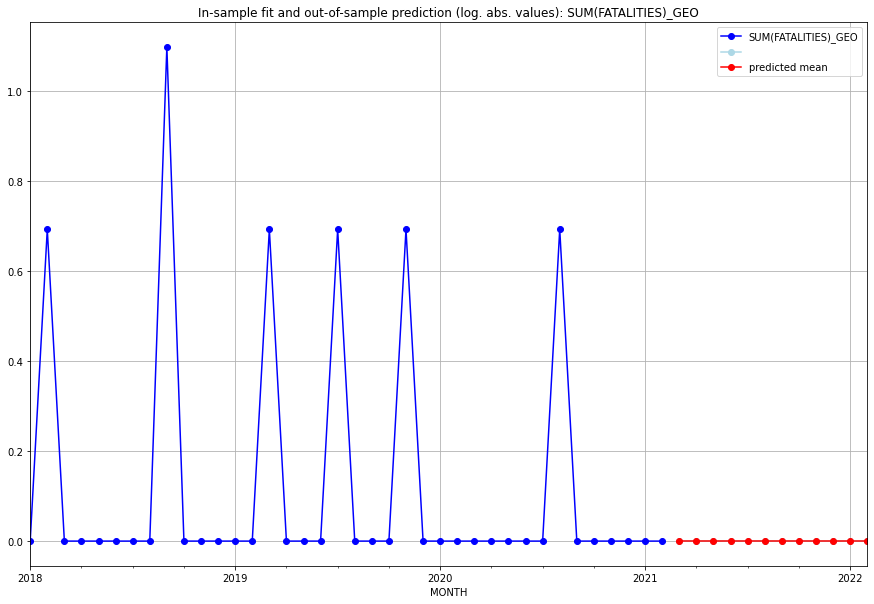

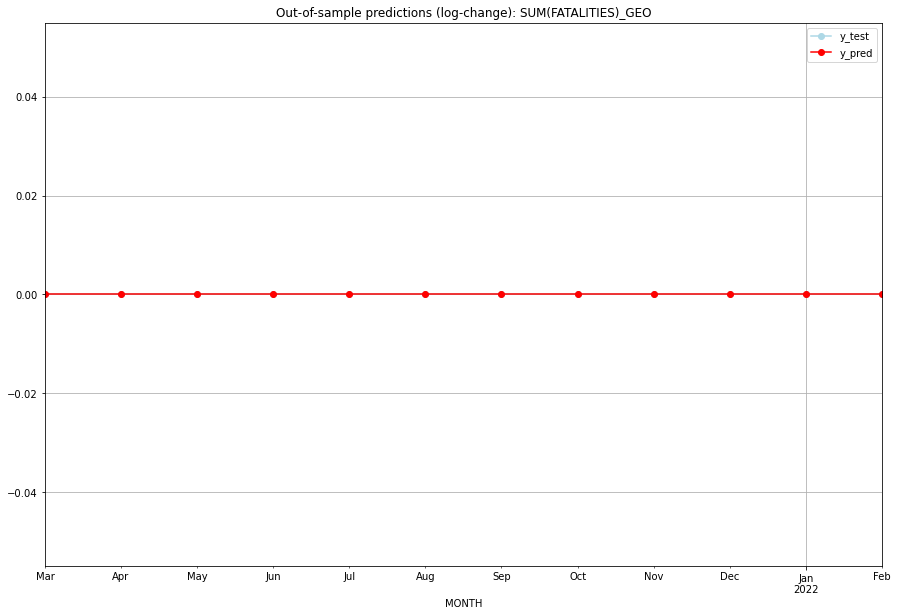

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

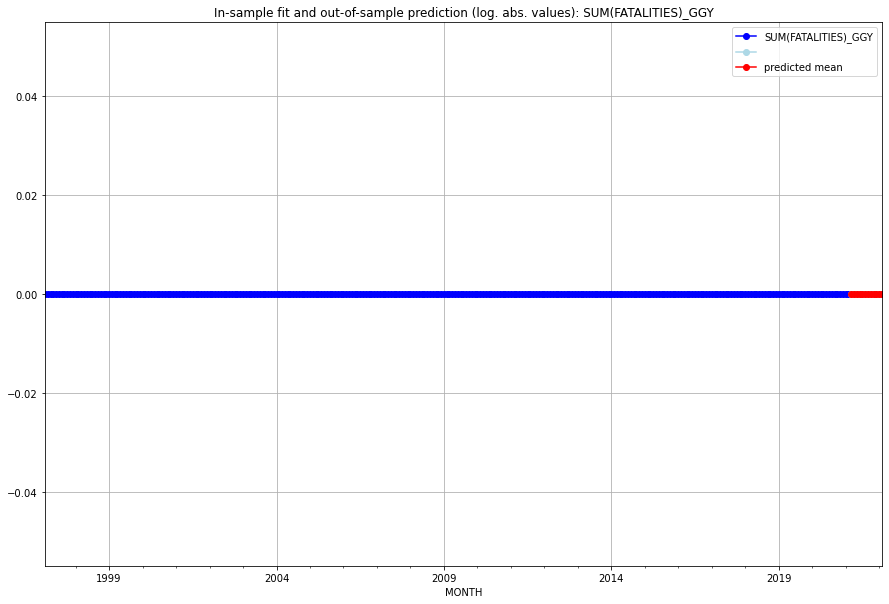

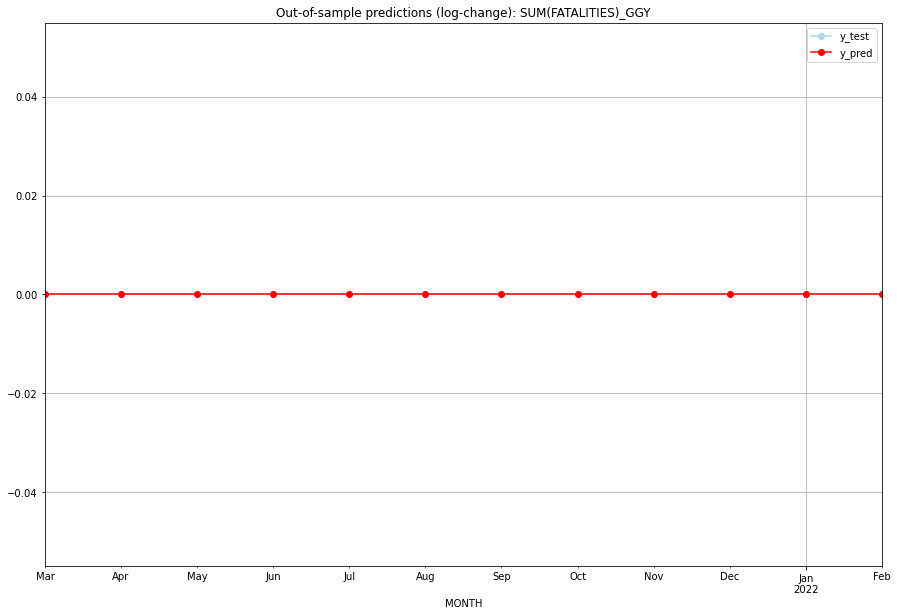

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

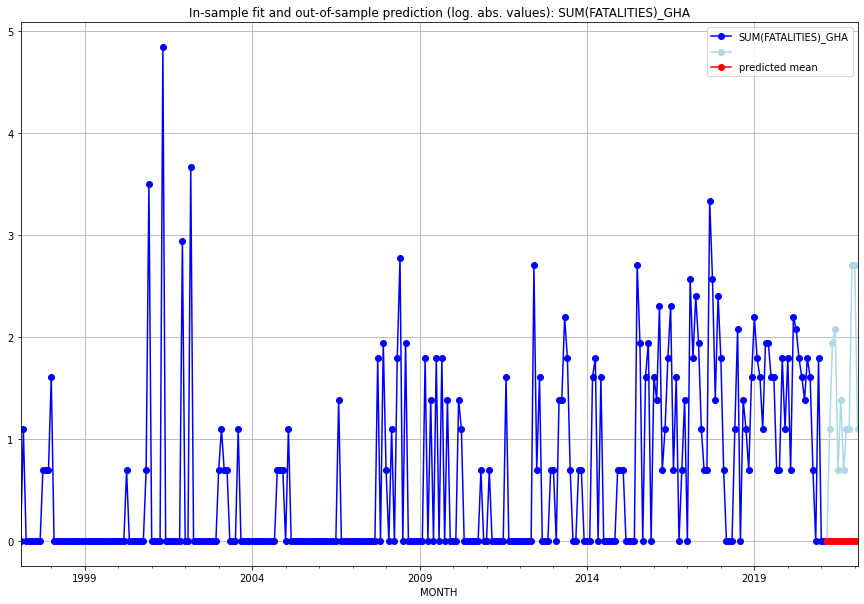

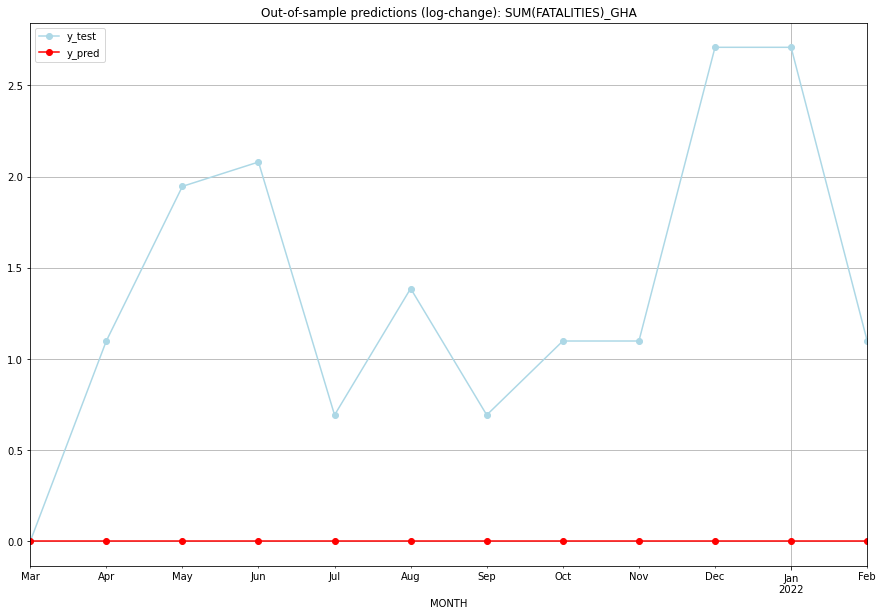

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    1.098612           0.0        1.098612
2   2021-05       0.0    1.945910           0.0        1.945910
3   2021-06       0.0    2.079442           0.0        2.079442
4   2021-07       0.0    0.693147           0.0        0.693147
5   2021-08       0.0    1.386294           0.0        1.386294
6   2021-09       0.0    0.693147           0.0        0.693147
7   2021-10       0.0    1.098612           0.0        1.098612
8   2021-11       0.0    1.098612           0.0        1.098612
9   2021-12       0.0    2.708050           0.0        2.708050
10  2022-01       0.0    2.708050           0.0        2.708050
11  2022-02       0.0    1.098612           0.0        1.098612
TADDA: 1.3840408308209824
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0

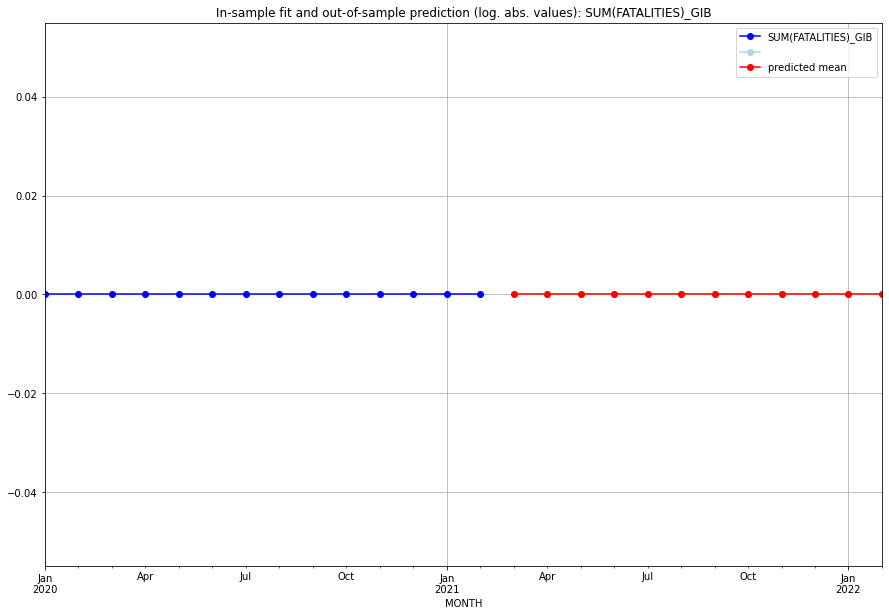

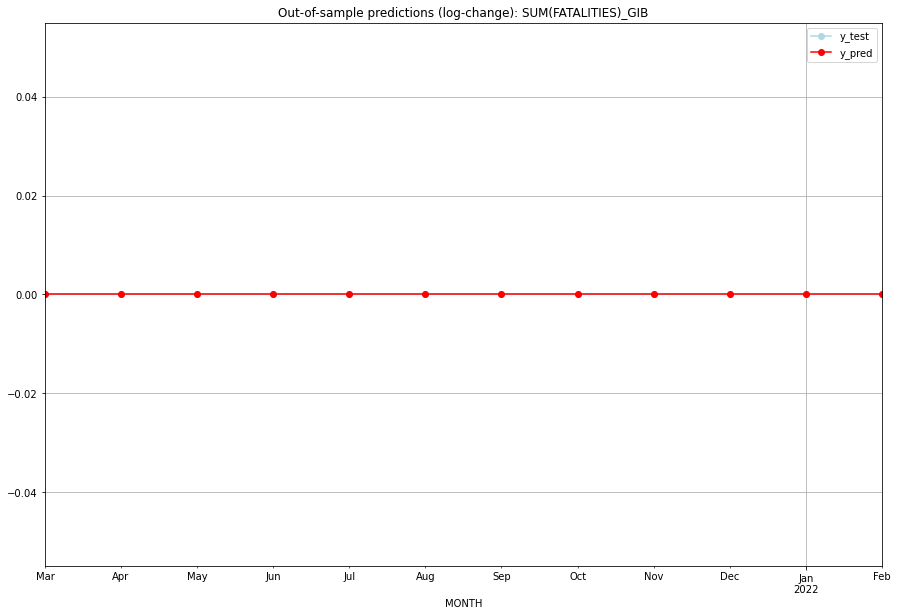

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

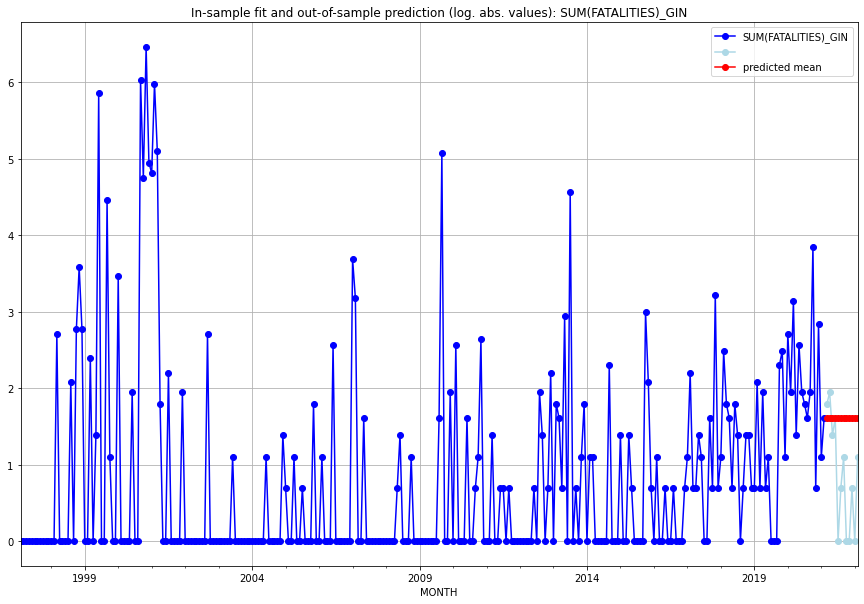

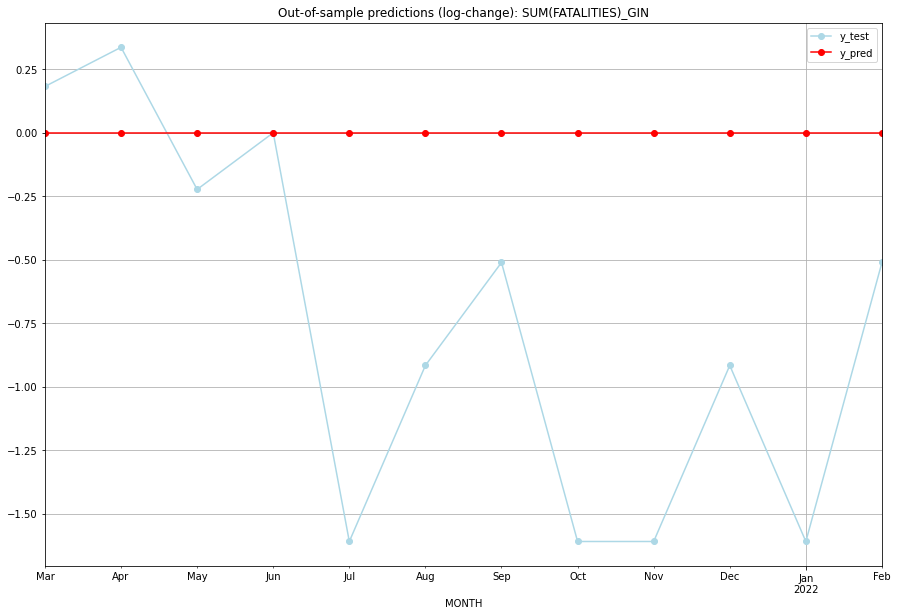

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.609438    1.791759           0.0        0.182322
1   2021-04  1.609438    1.945910           0.0        0.336472
2   2021-05  1.609438    1.386294           0.0       -0.223144
3   2021-06  1.609438    1.609438           0.0        0.000000
4   2021-07  1.609438    0.000000           0.0       -1.609438
5   2021-08  1.609438    0.693147           0.0       -0.916291
6   2021-09  1.609438    1.098612           0.0       -0.510826
7   2021-10  1.609438    0.000000           0.0       -1.609438
8   2021-11  1.609438    0.000000           0.0       -1.609438
9   2021-12  1.609438    0.693147           0.0       -0.916291
10  2022-01  1.609438    0.000000           0.0       -1.609438
11  2022-02  1.609438    1.098612           0.0       -0.510826
TADDA: 0.8361601421455057
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.609438    1.791759           0.0

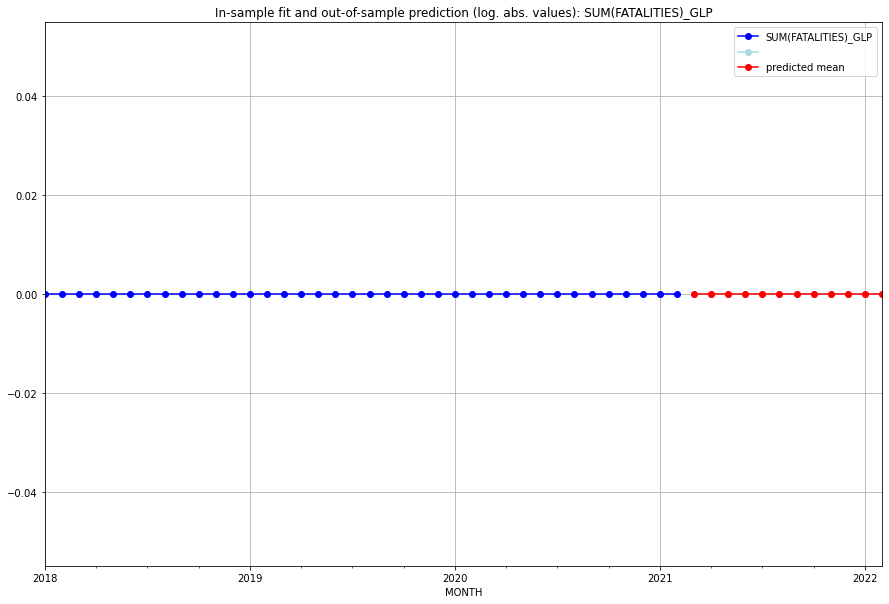

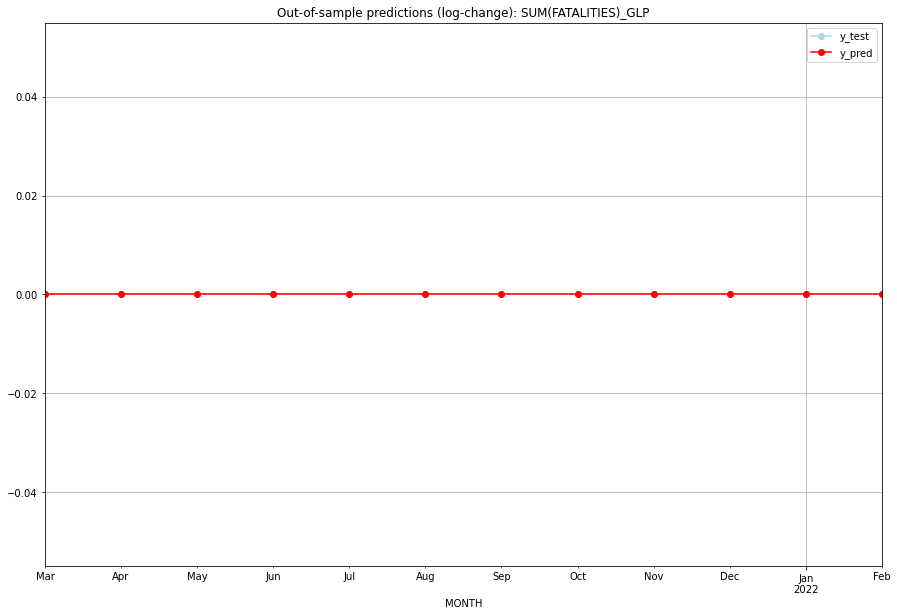

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

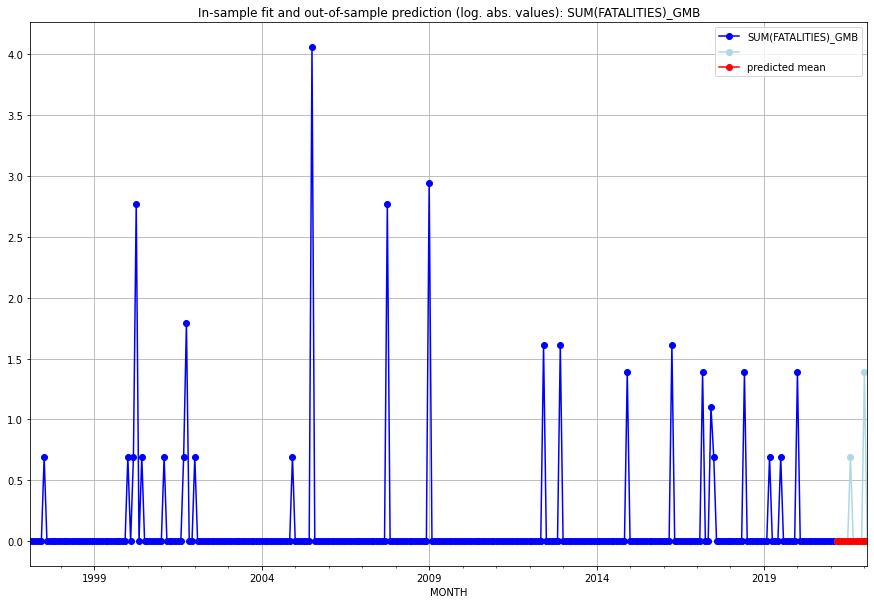

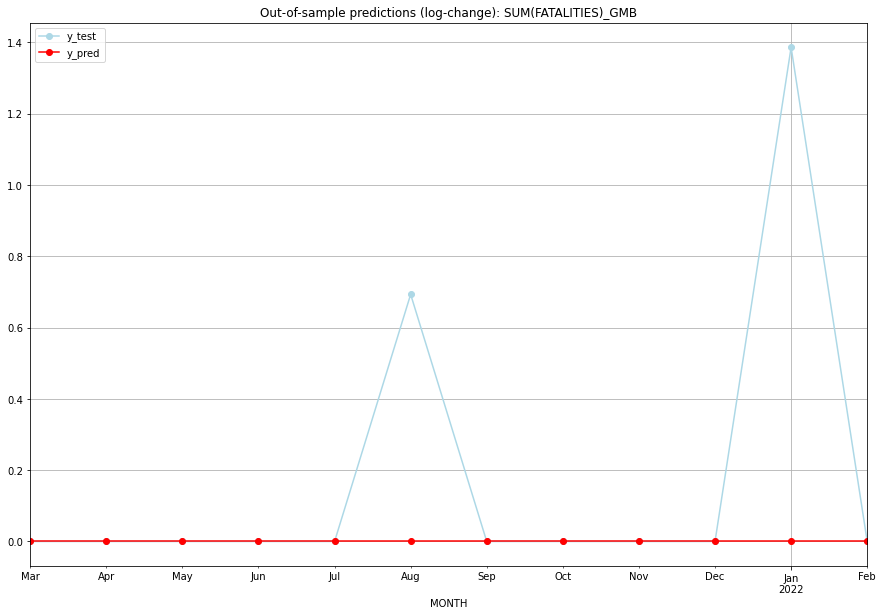

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.693147           0.0        0.693147
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    1.386294           0.0        1.386294
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

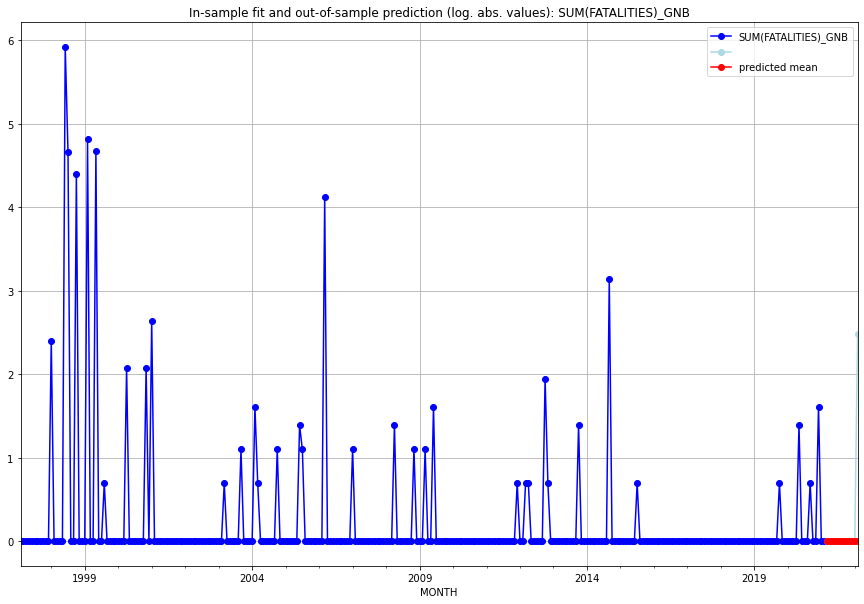

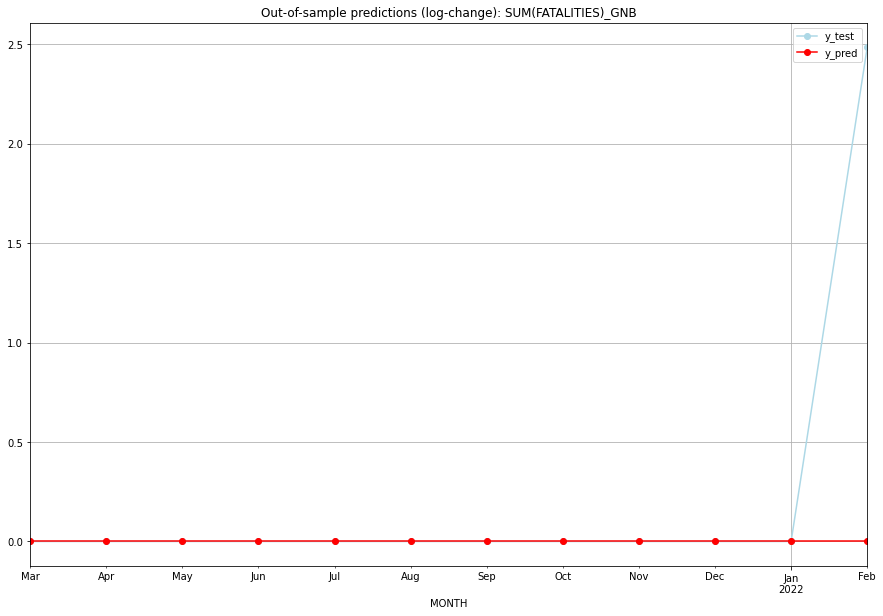

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    2.484907           0.0        2.484907
TADDA: 0.20707555414900003
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

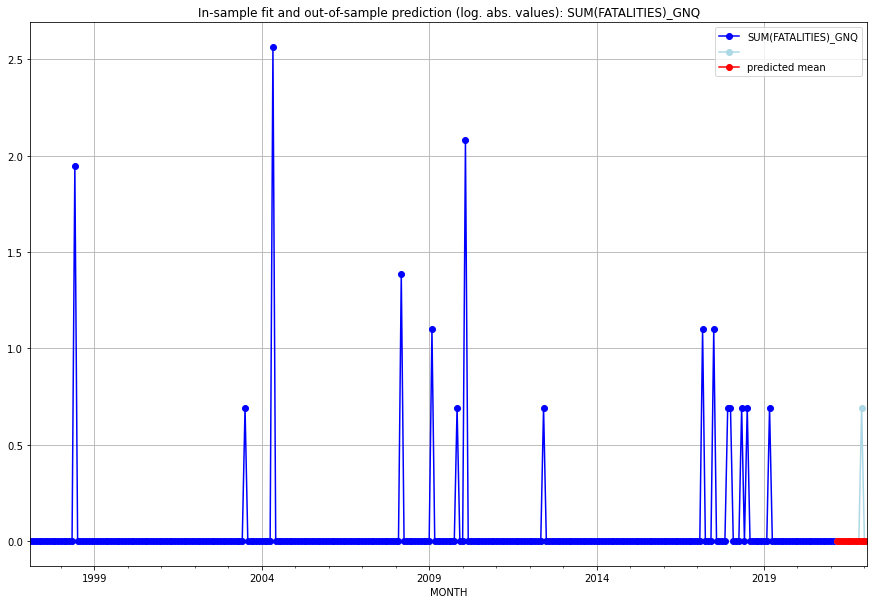

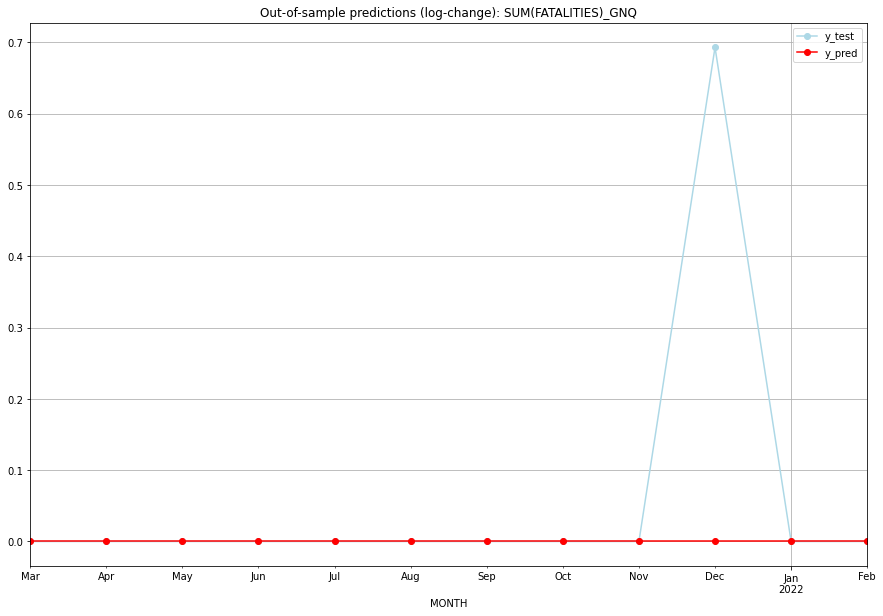

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.693147           0.0        0.693147
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

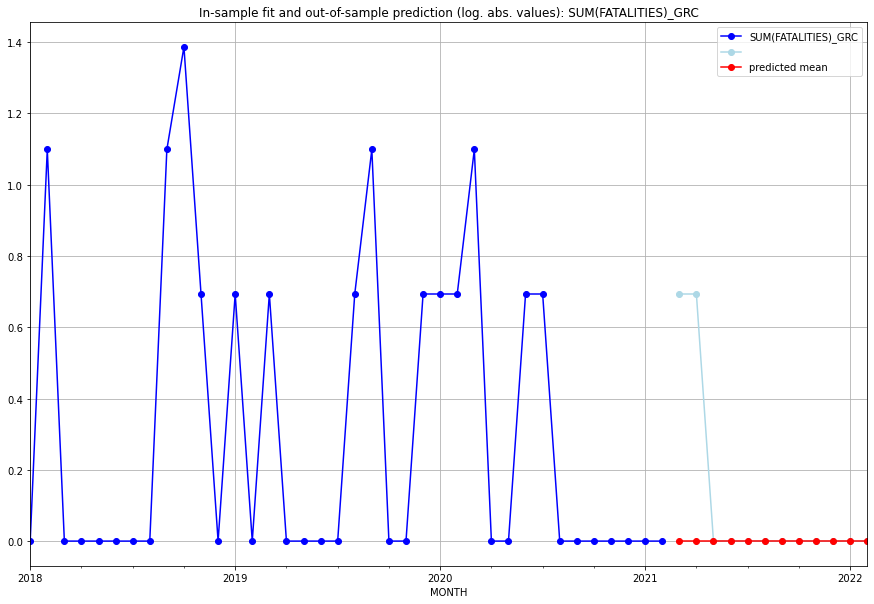

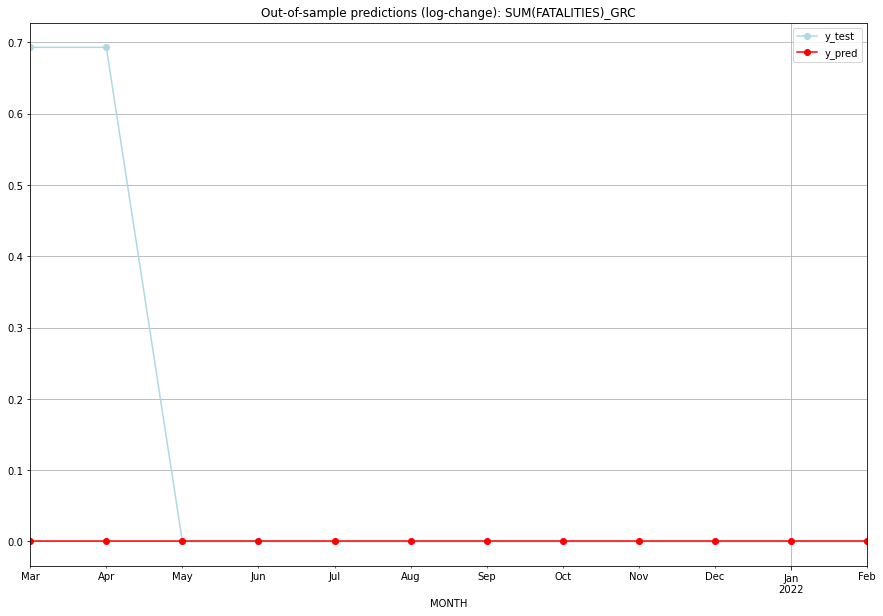

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.693147           0.0        0.693147
1   2021-04       0.0    0.693147           0.0        0.693147
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.11552453009332421
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.693147           0.

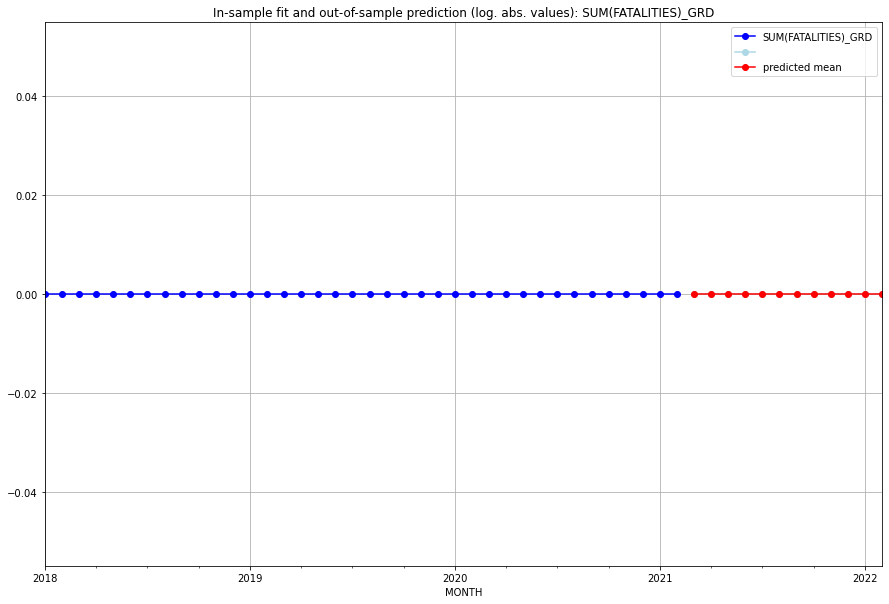

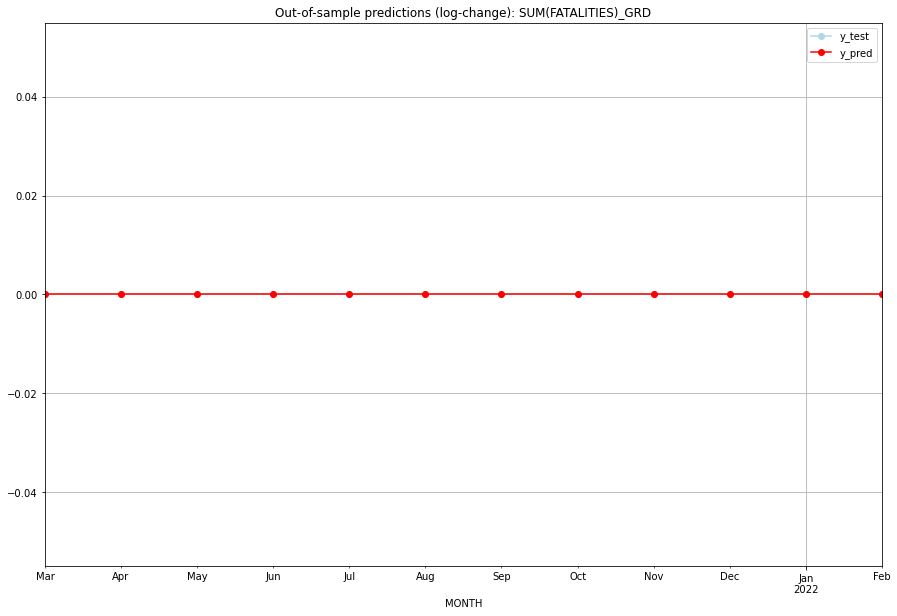

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

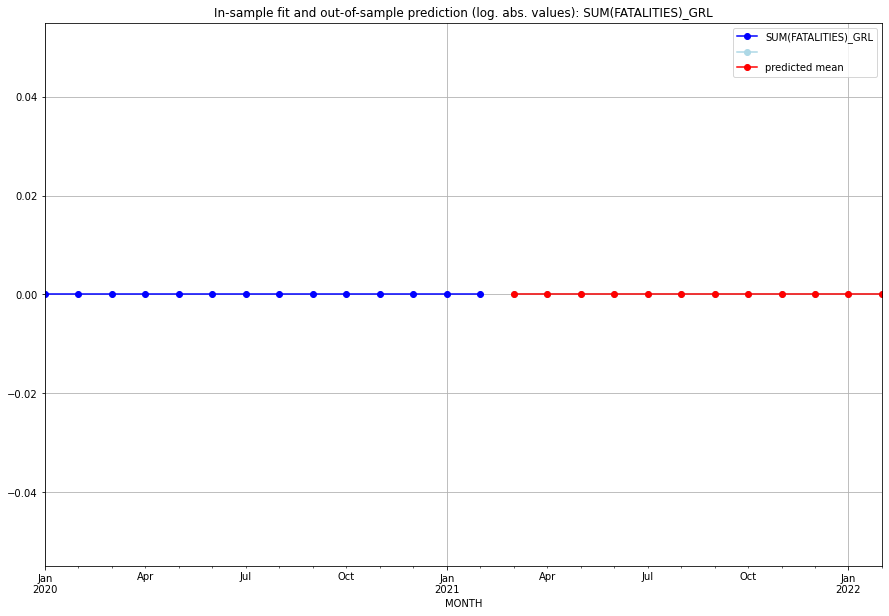

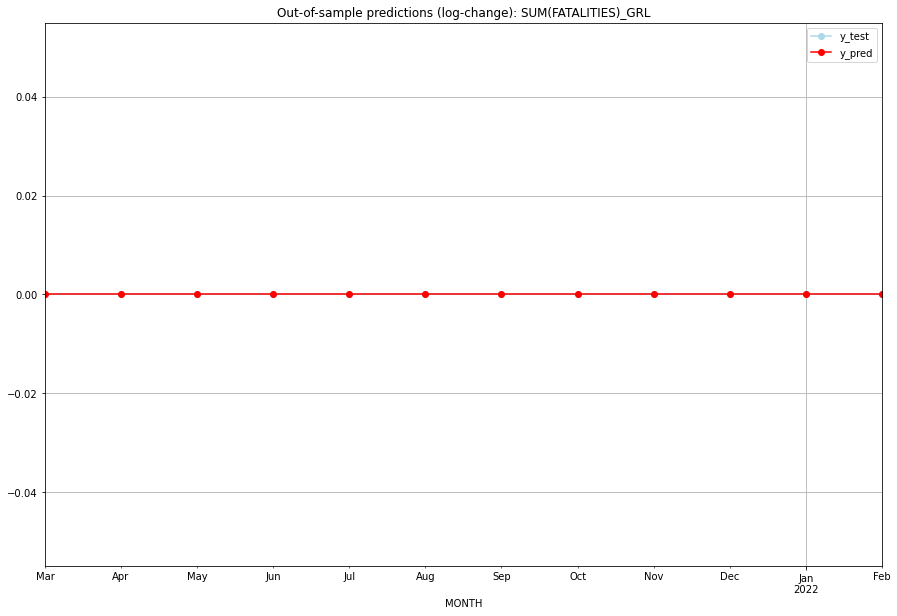

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

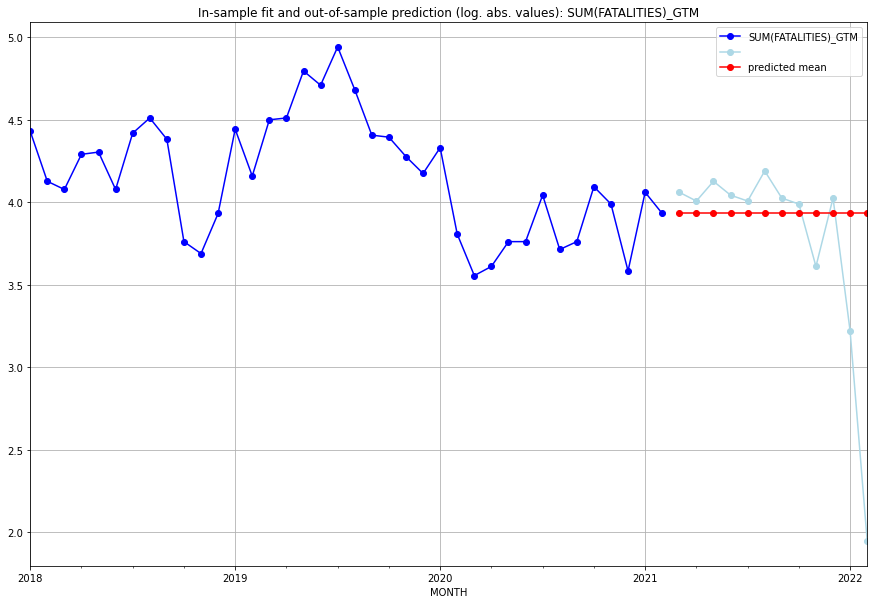

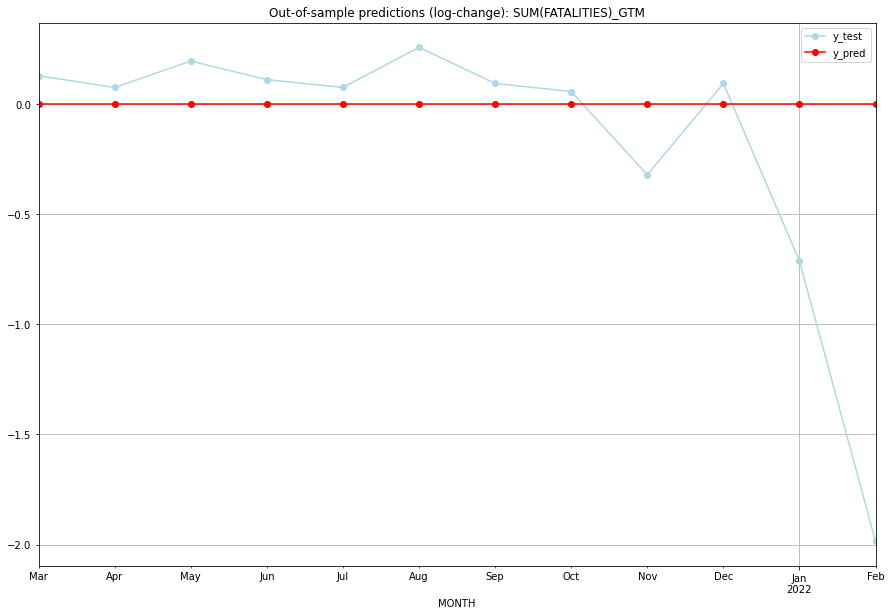

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  3.931826    4.060443           0.0        0.128617
1   2021-04  3.931826    4.007333           0.0        0.075508
2   2021-05  3.931826    4.127134           0.0        0.195309
3   2021-06  3.931826    4.043051           0.0        0.111226
4   2021-07  3.931826    4.007333           0.0        0.075508
5   2021-08  3.931826    4.189655           0.0        0.257829
6   2021-09  3.931826    4.025352           0.0        0.093526
7   2021-10  3.931826    3.988984           0.0        0.057158
8   2021-11  3.931826    3.610918           0.0       -0.320908
9   2021-12  3.931826    4.025352           0.0        0.093526
10  2022-01  3.931826    3.218876           0.0       -0.712950
11  2022-02  3.931826    1.945910           0.0       -1.985915
TADDA: 0.34233162675319256
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  3.931826    4.060443           0.

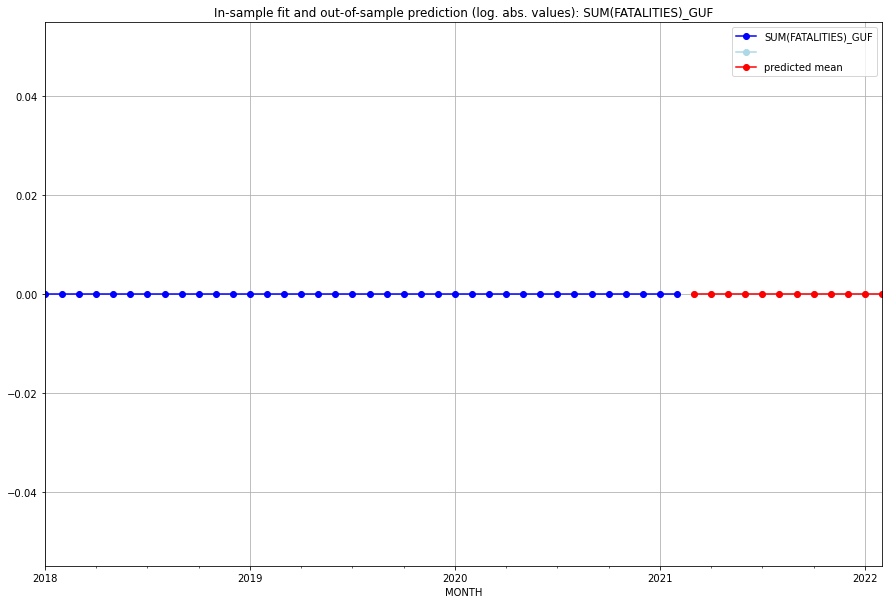

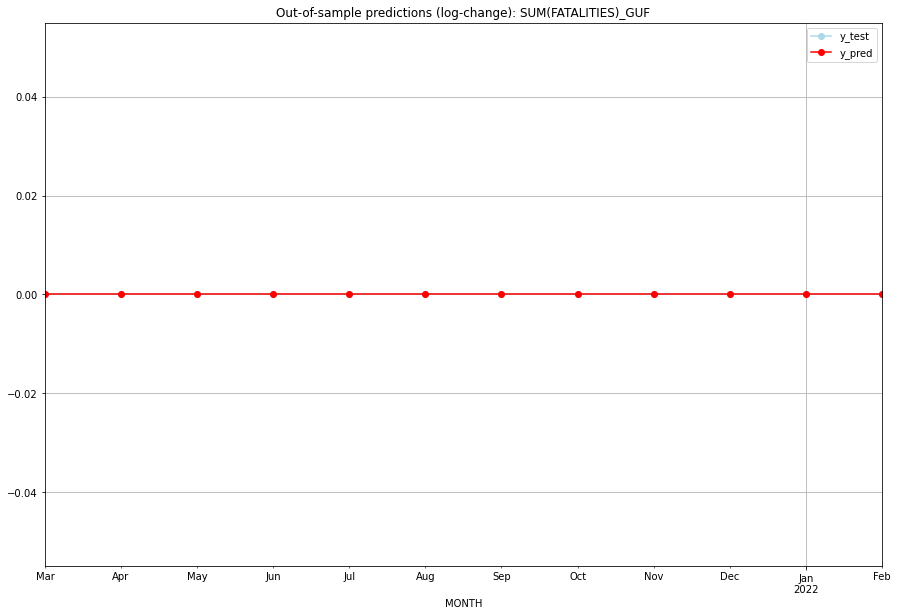

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

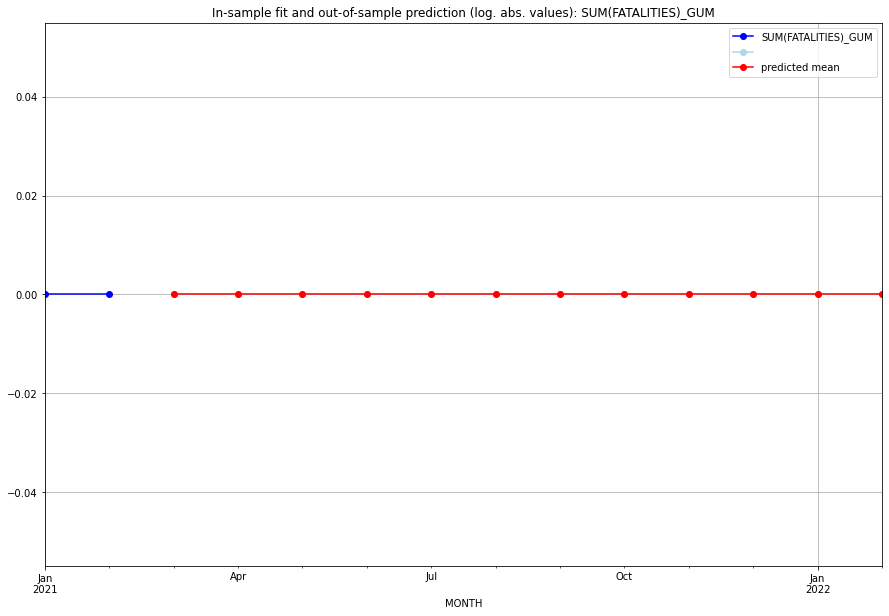

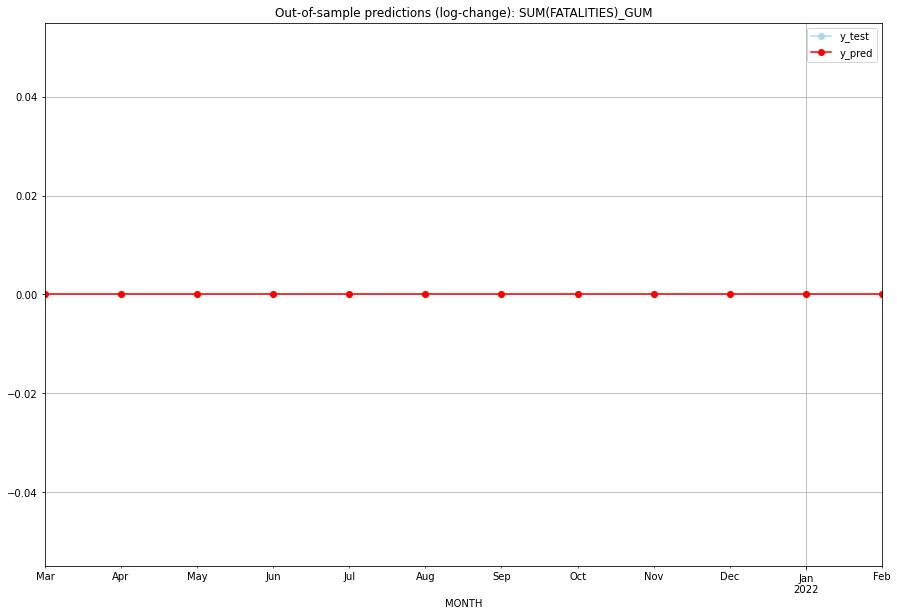

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

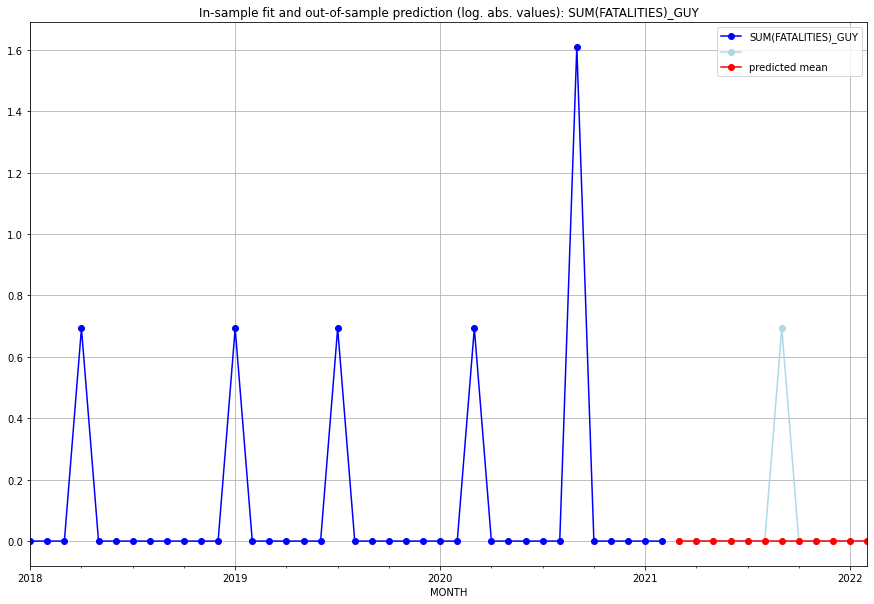

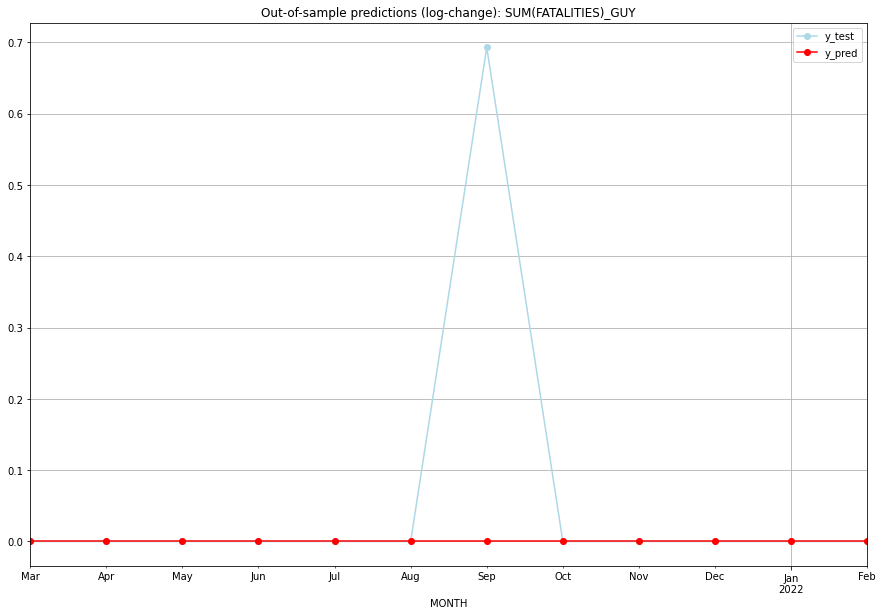

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.693147           0.0        0.693147
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

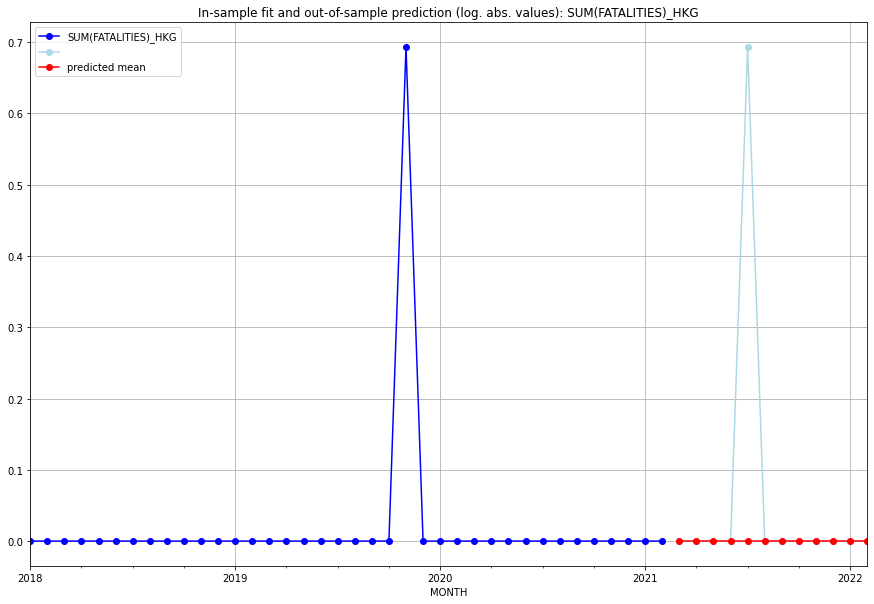

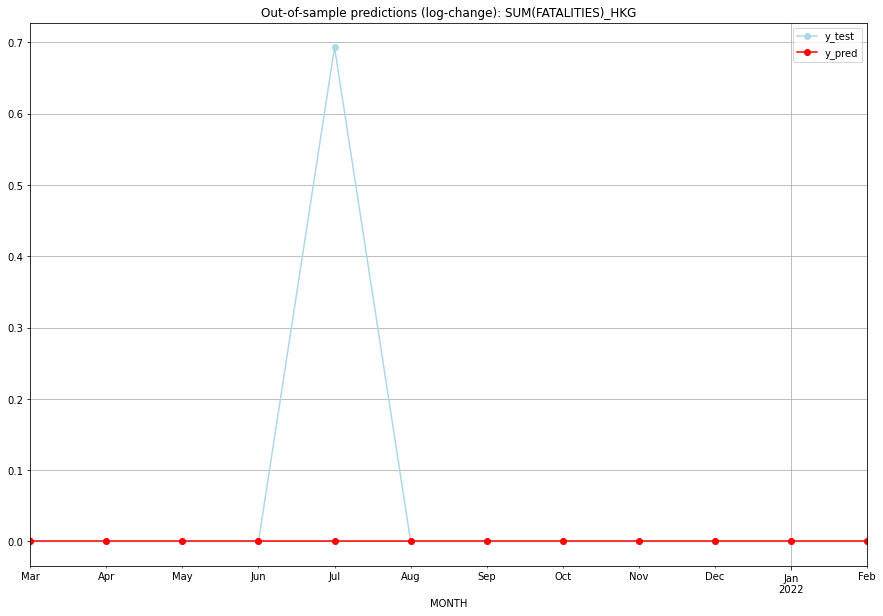

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.693147           0.0        0.693147
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

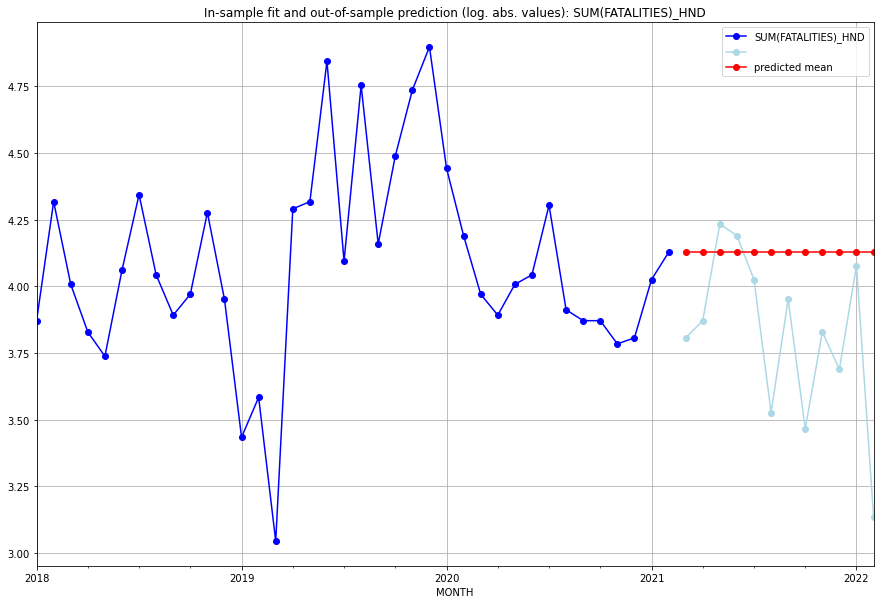

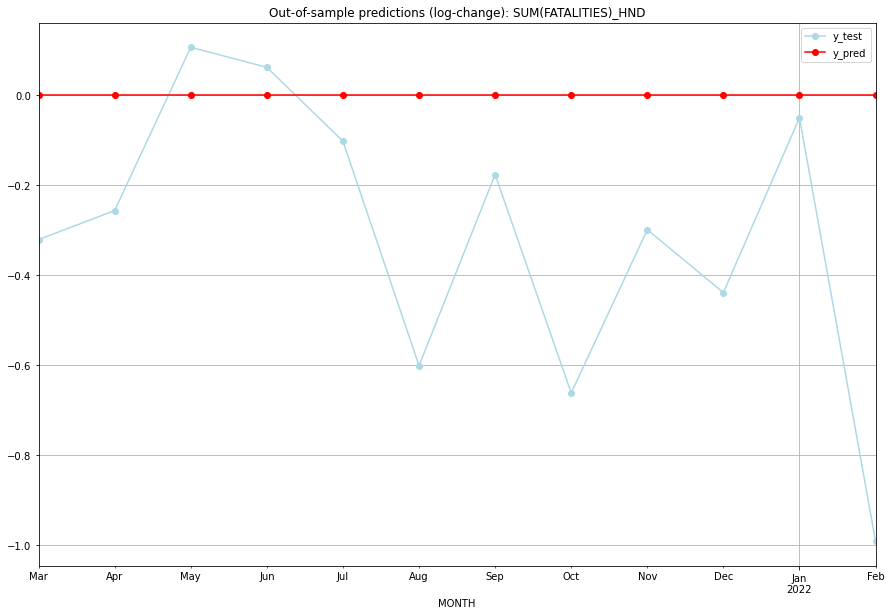

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  4.127134    3.806662           0.0       -0.320472
1   2021-04  4.127134    3.871201           0.0       -0.255933
2   2021-05  4.127134    4.234107           0.0        0.106972
3   2021-06  4.127134    4.189655           0.0        0.062520
4   2021-07  4.127134    4.025352           0.0       -0.101783
5   2021-08  4.127134    3.526361           0.0       -0.600774
6   2021-09  4.127134    3.951244           0.0       -0.175891
7   2021-10  4.127134    3.465736           0.0       -0.661398
8   2021-11  4.127134    3.828641           0.0       -0.298493
9   2021-12  4.127134    3.688879           0.0       -0.438255
10  2022-01  4.127134    4.077537           0.0       -0.049597
11  2022-02  4.127134    3.135494           0.0       -0.991640
TADDA: 0.3386440399279868
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  4.127134    3.806662           0.0

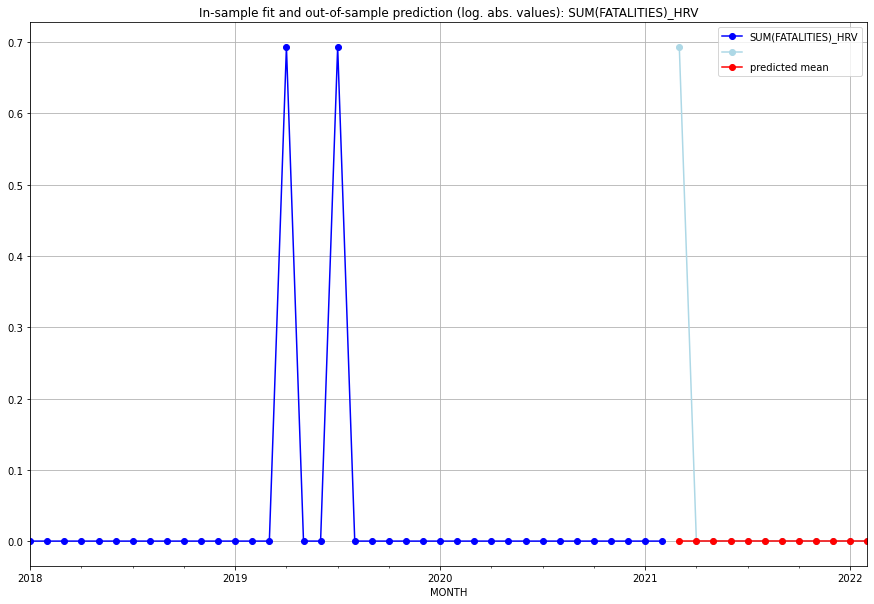

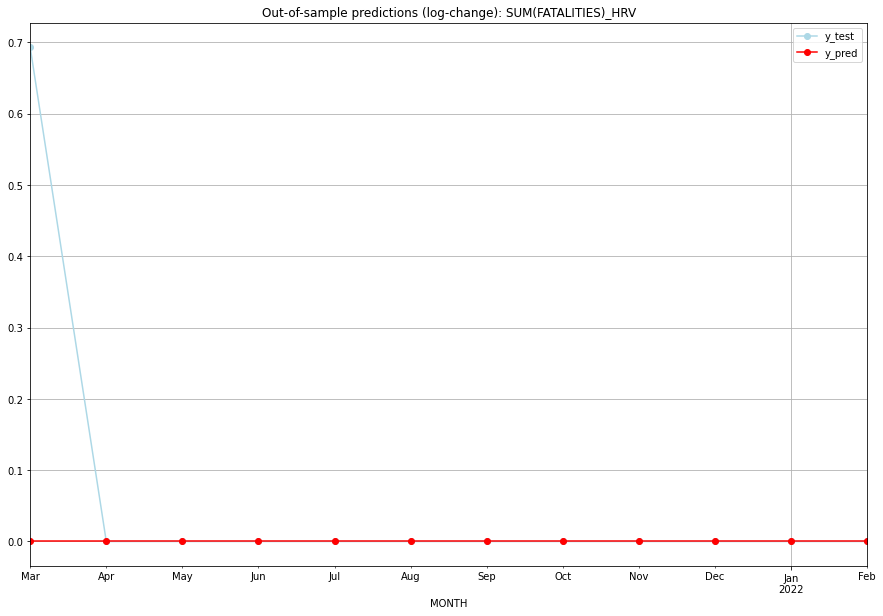

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.693147           0.0        0.693147
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.693147           0

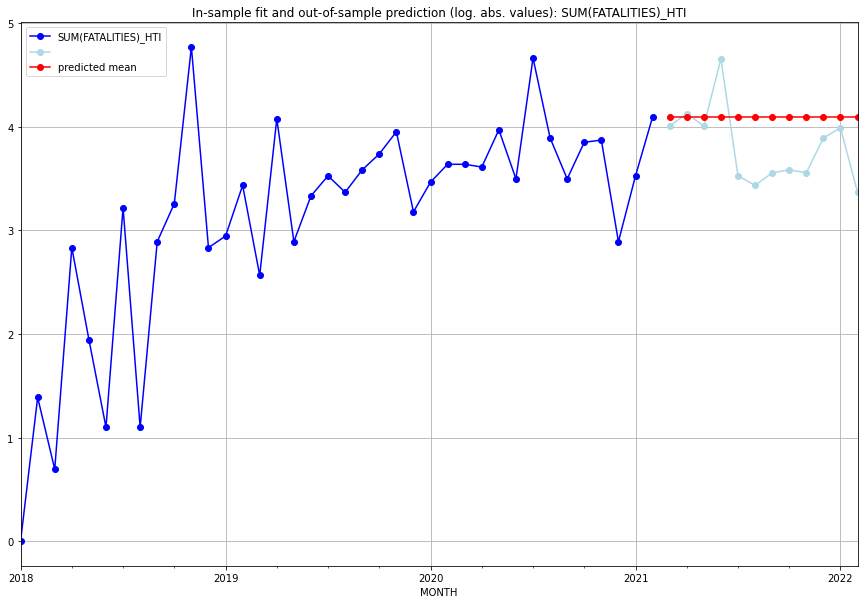

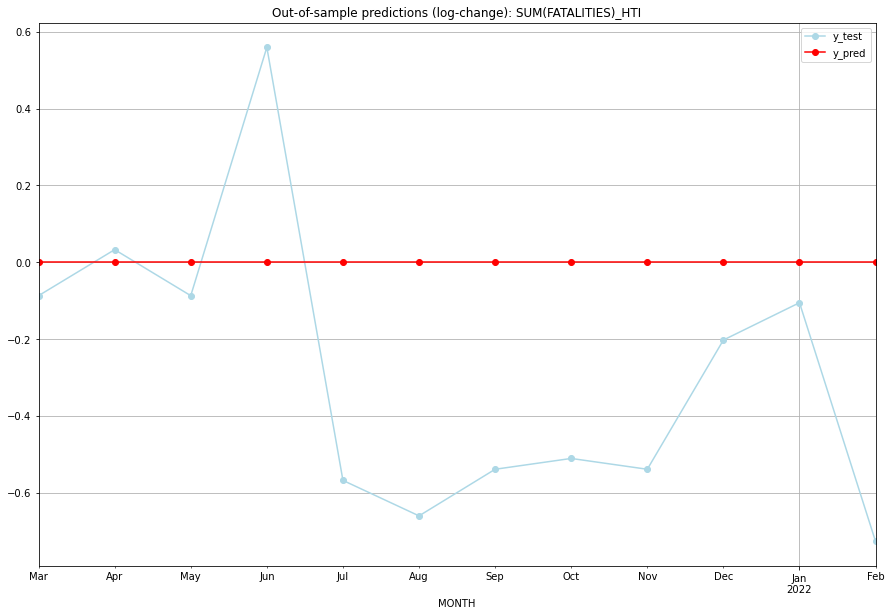

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  4.094345    4.007333           0.0       -0.087011
1   2021-04  4.094345    4.127134           0.0        0.032790
2   2021-05  4.094345    4.007333           0.0       -0.087011
3   2021-06  4.094345    4.653960           0.0        0.559616
4   2021-07  4.094345    3.526361           0.0       -0.567984
5   2021-08  4.094345    3.433987           0.0       -0.660357
6   2021-09  4.094345    3.555348           0.0       -0.538997
7   2021-10  4.094345    3.583519           0.0       -0.510826
8   2021-11  4.094345    3.555348           0.0       -0.538997
9   2021-12  4.094345    3.891820           0.0       -0.202524
10  2022-01  4.094345    3.988984           0.0       -0.105361
11  2022-02  4.094345    3.367296           0.0       -0.727049
TADDA: 0.3848768247764047
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  4.094345    4.007333           0.0

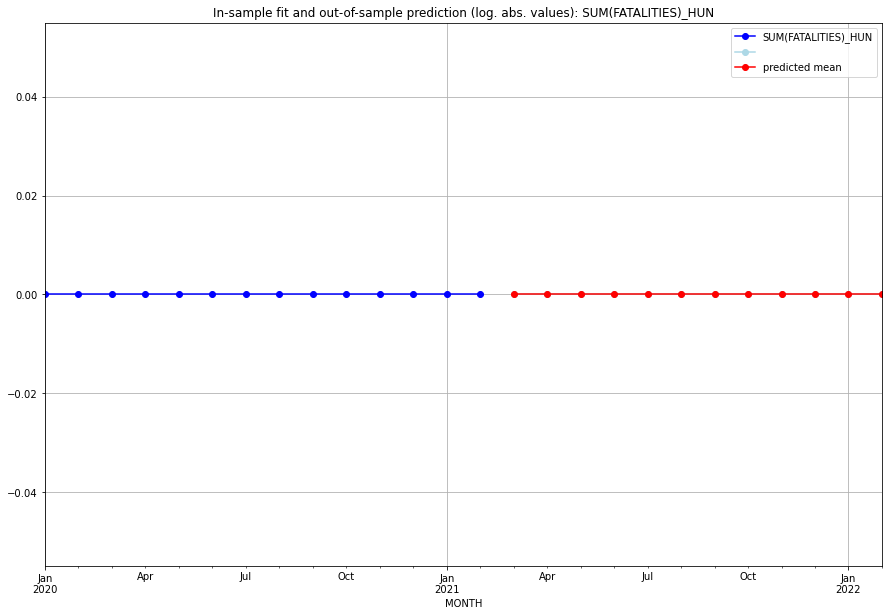

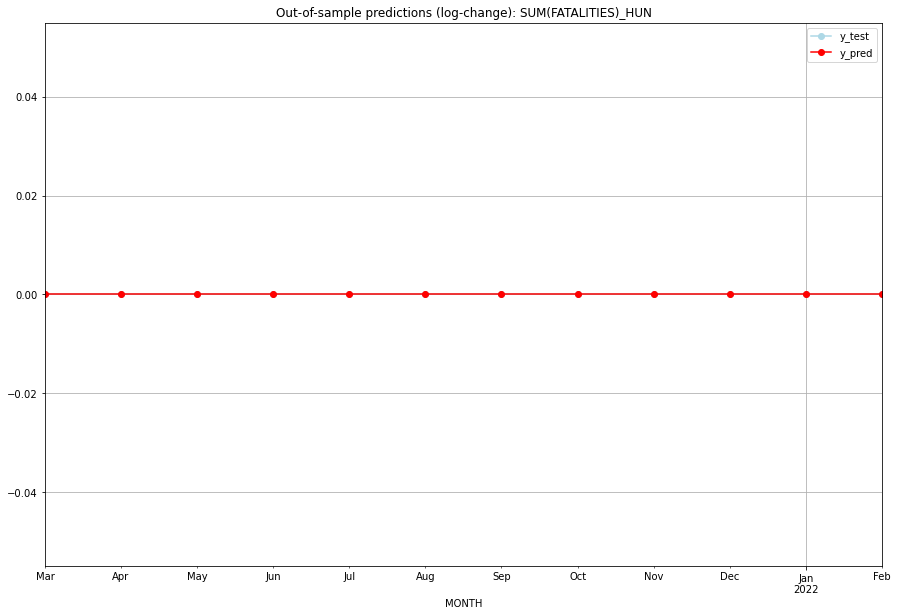

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

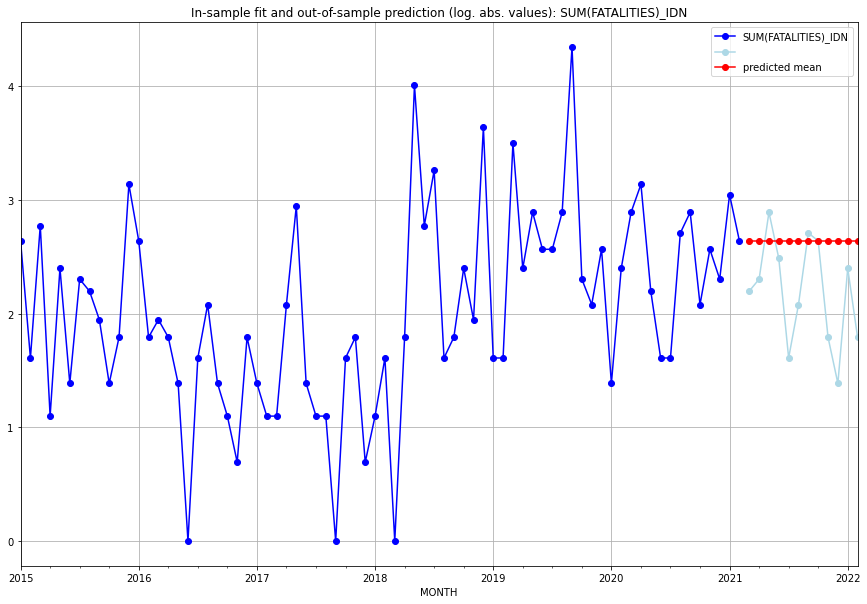

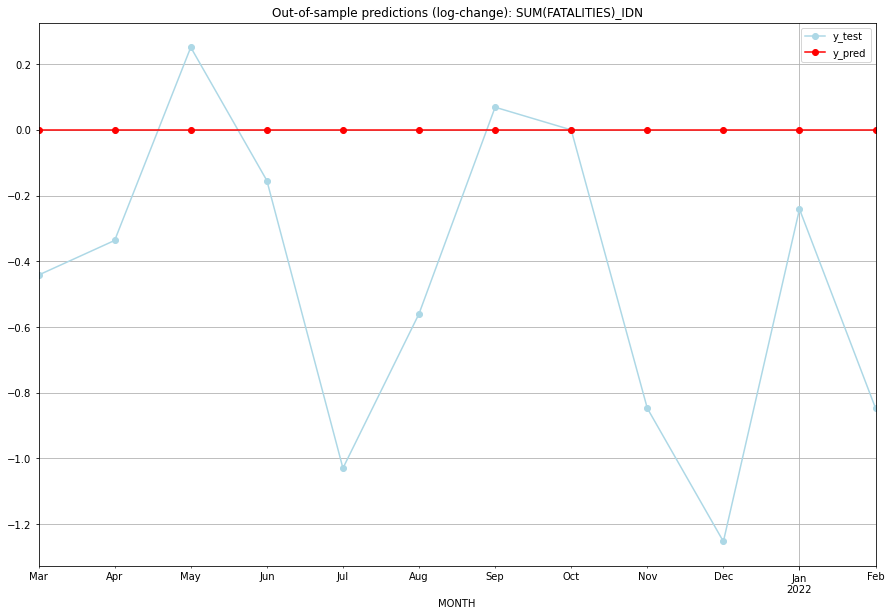

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  2.639057    2.197225           0.0       -0.441833
1   2021-04  2.639057    2.302585           0.0       -0.336472
2   2021-05  2.639057    2.890372           0.0        0.251314
3   2021-06  2.639057    2.484907           0.0       -0.154151
4   2021-07  2.639057    1.609438           0.0       -1.029619
5   2021-08  2.639057    2.079442           0.0       -0.559616
6   2021-09  2.639057    2.708050           0.0        0.068993
7   2021-10  2.639057    2.639057           0.0        0.000000
8   2021-11  2.639057    1.791759           0.0       -0.847298
9   2021-12  2.639057    1.386294           0.0       -1.252763
10  2022-01  2.639057    2.397895           0.0       -0.241162
11  2022-02  2.639057    1.791759           0.0       -0.847298
TADDA: 0.5025432433082174
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  2.639057    2.197225           0.0

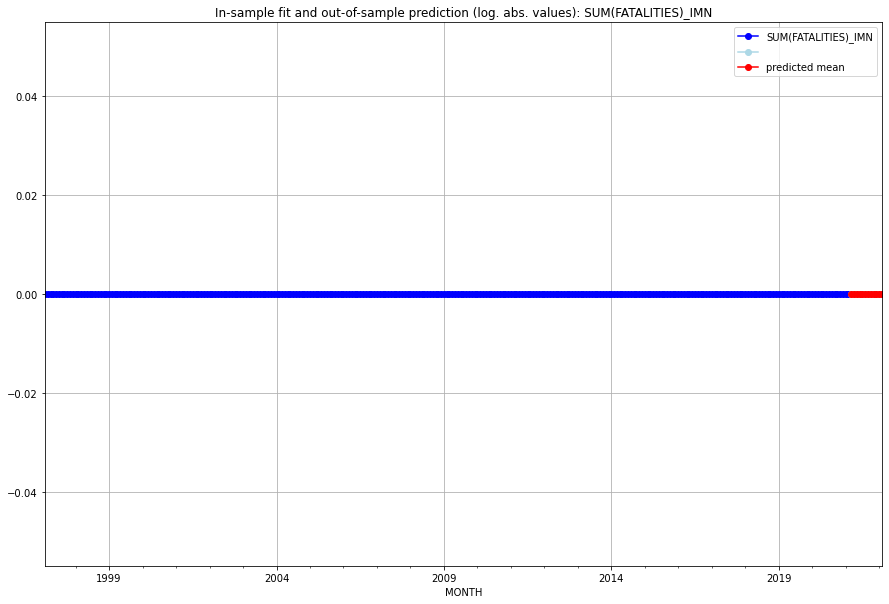

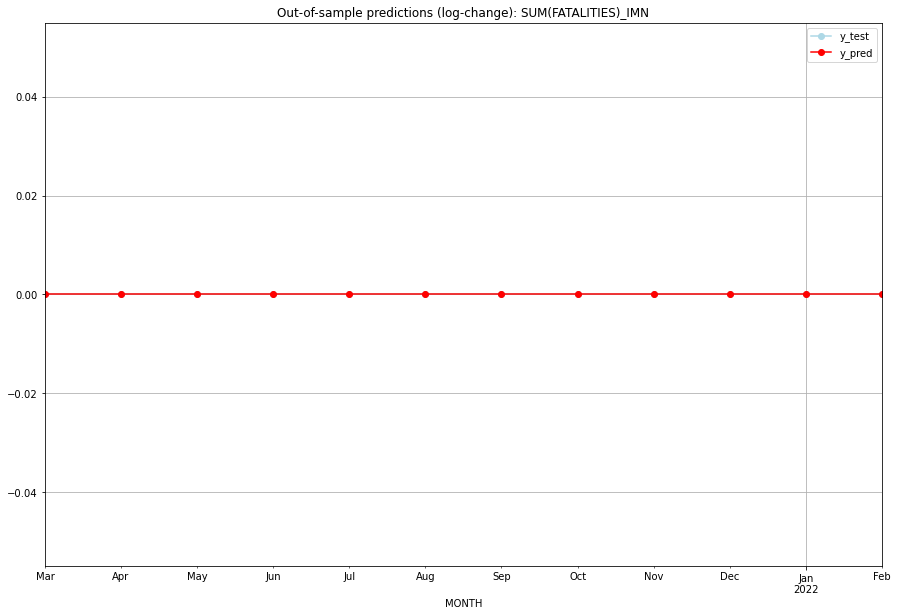

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

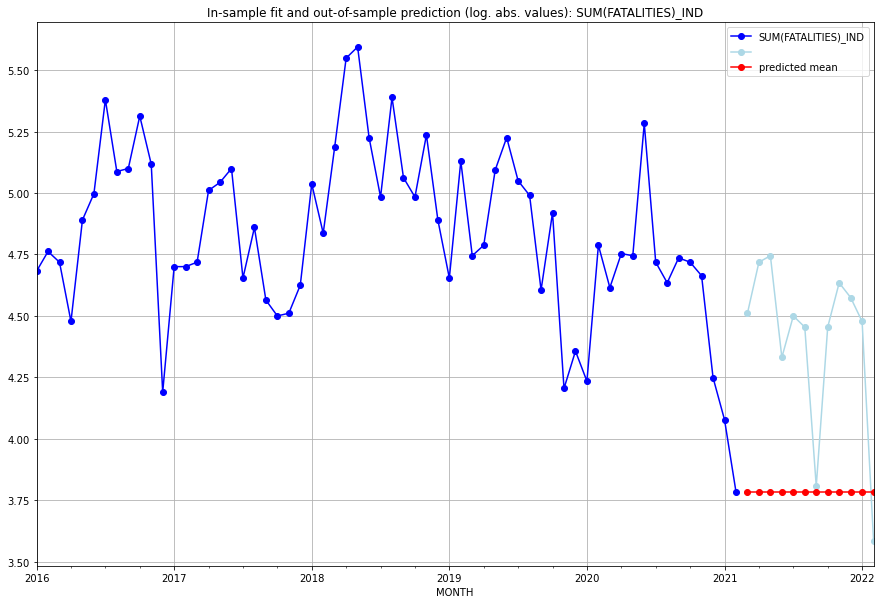

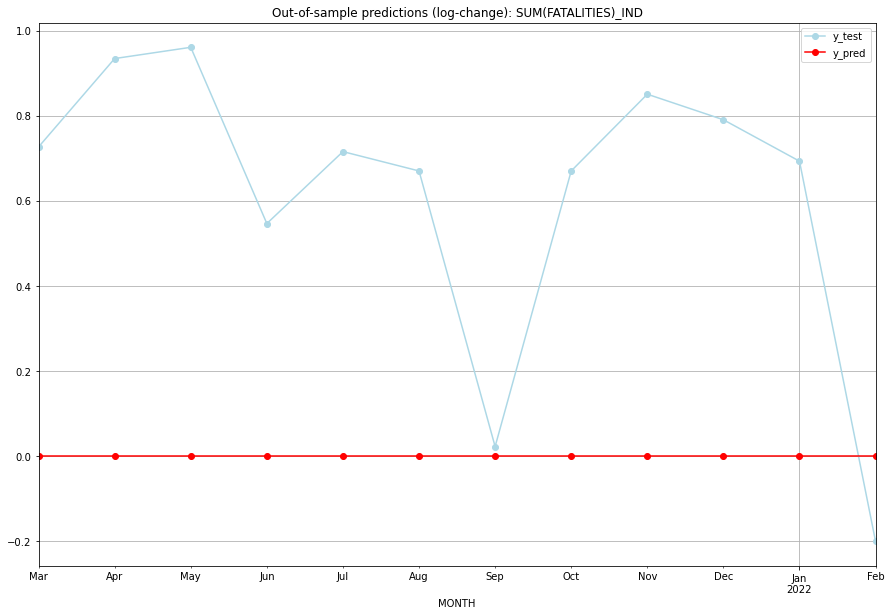

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03   3.78419    4.510860           0.0        0.726670
1   2021-04   3.78419    4.718499           0.0        0.934309
2   2021-05   3.78419    4.744932           0.0        0.960742
3   2021-06   3.78419    4.330733           0.0        0.546544
4   2021-07   3.78419    4.499810           0.0        0.715620
5   2021-08   3.78419    4.454347           0.0        0.670158
6   2021-09   3.78419    3.806662           0.0        0.022473
7   2021-10   3.78419    4.454347           0.0        0.670158
8   2021-11   3.78419    4.634729           0.0        0.850539
9   2021-12   3.78419    4.574711           0.0        0.790521
10  2022-01   3.78419    4.477337           0.0        0.693147
11  2022-02   3.78419    3.583519           0.0       -0.200671
TADDA: 0.6484626752201357
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01   3.78419    4.510860           0.0

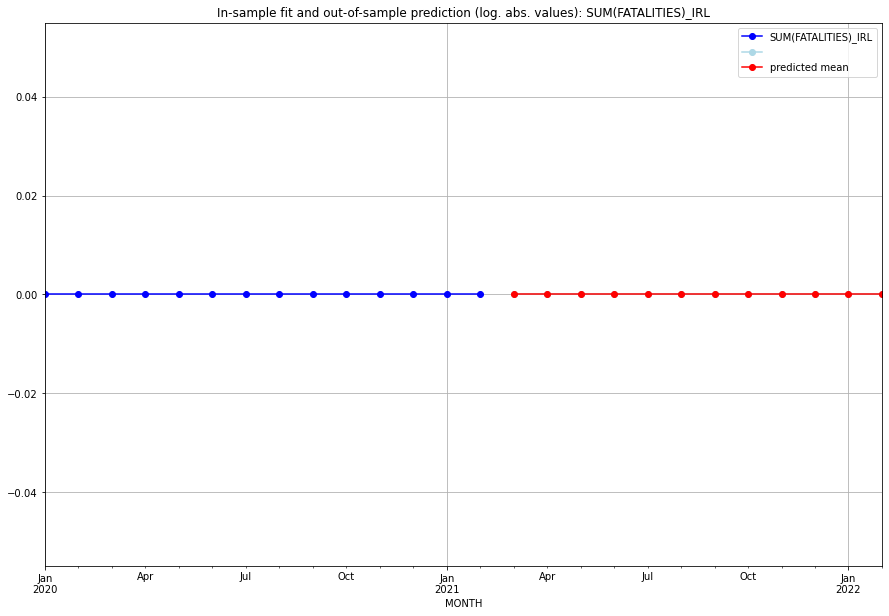

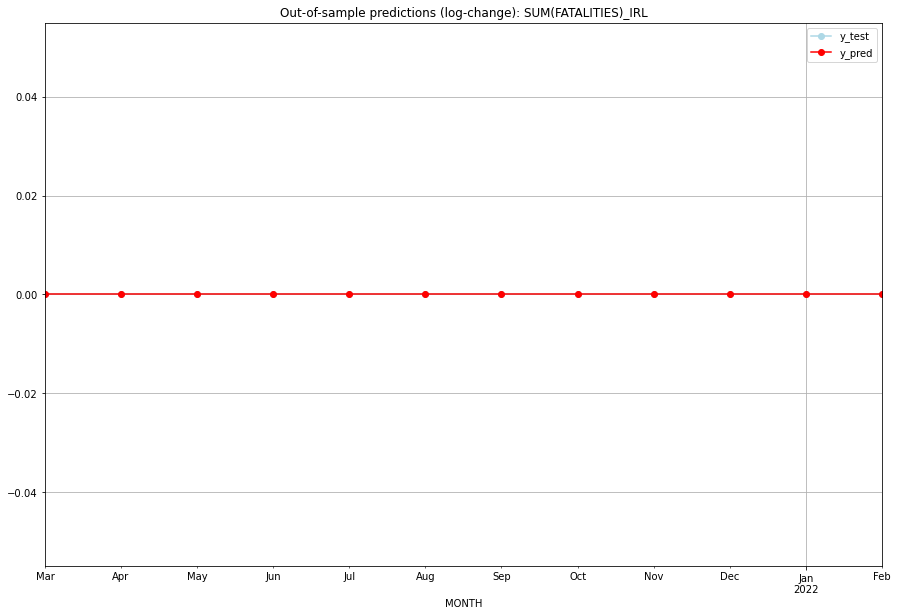

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

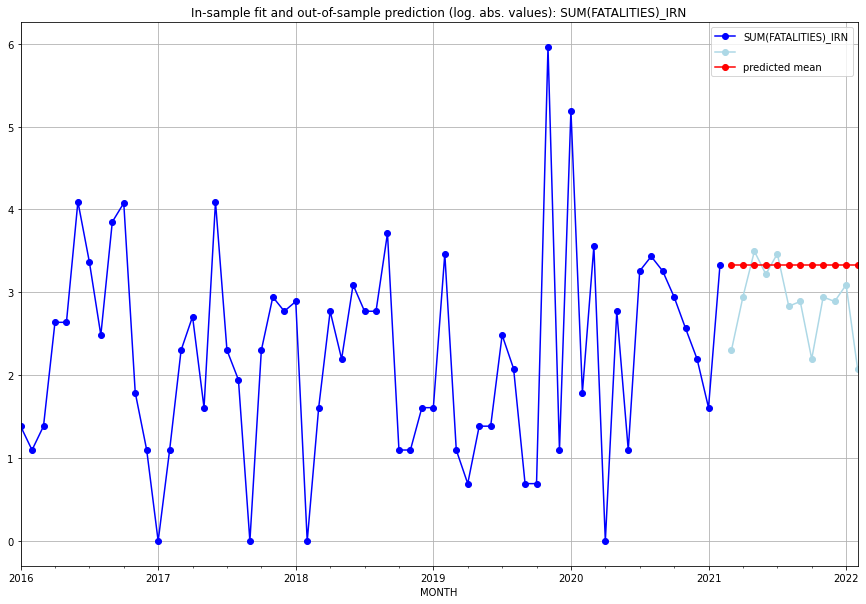

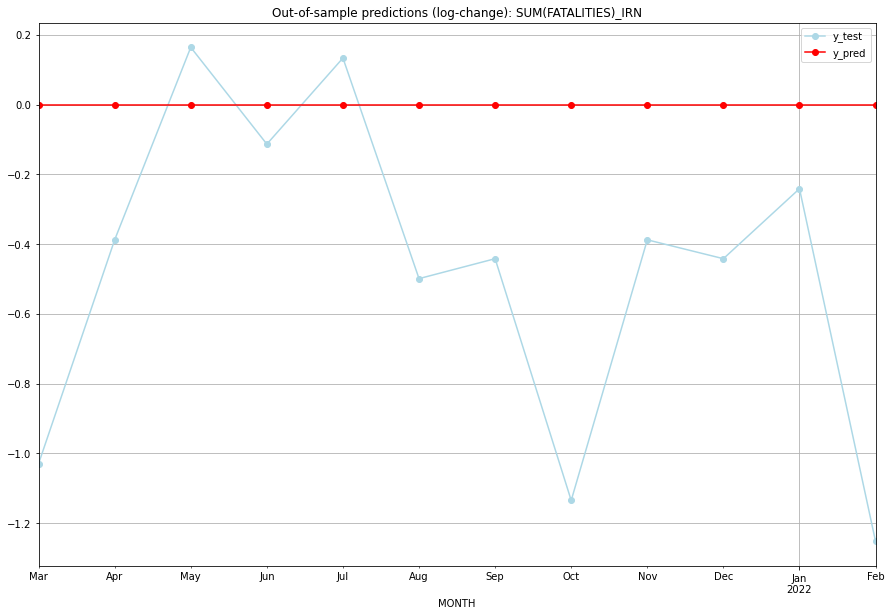

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  3.332205    2.302585           0.0       -1.029619
1   2021-04  3.332205    2.944439           0.0       -0.387766
2   2021-05  3.332205    3.496508           0.0        0.164303
3   2021-06  3.332205    3.218876           0.0       -0.113329
4   2021-07  3.332205    3.465736           0.0        0.133531
5   2021-08  3.332205    2.833213           0.0       -0.498991
6   2021-09  3.332205    2.890372           0.0       -0.441833
7   2021-10  3.332205    2.197225           0.0       -1.134980
8   2021-11  3.332205    2.944439           0.0       -0.387766
9   2021-12  3.332205    2.890372           0.0       -0.441833
10  2022-01  3.332205    3.091042           0.0       -0.241162
11  2022-02  3.332205    2.079442           0.0       -1.252763
TADDA: 0.5189896031041493
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  3.332205    2.302585           0.0

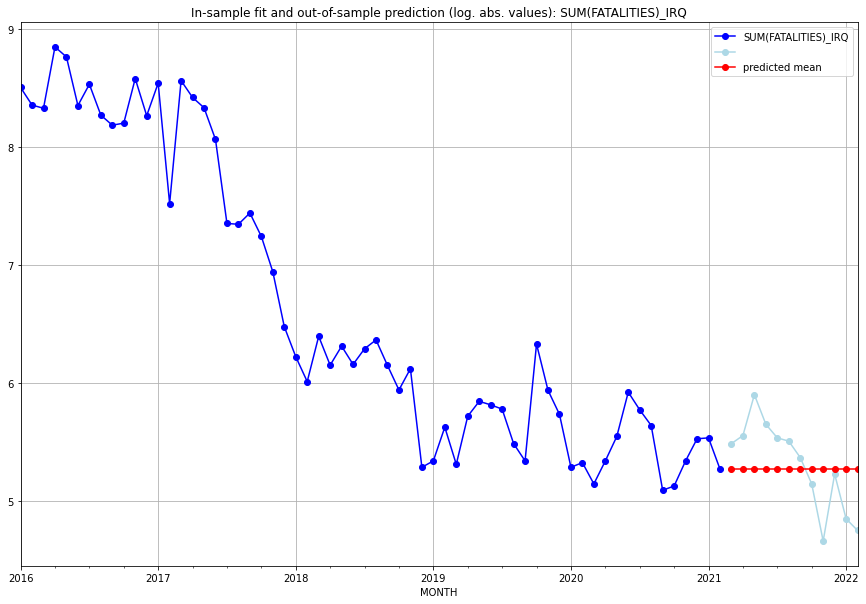

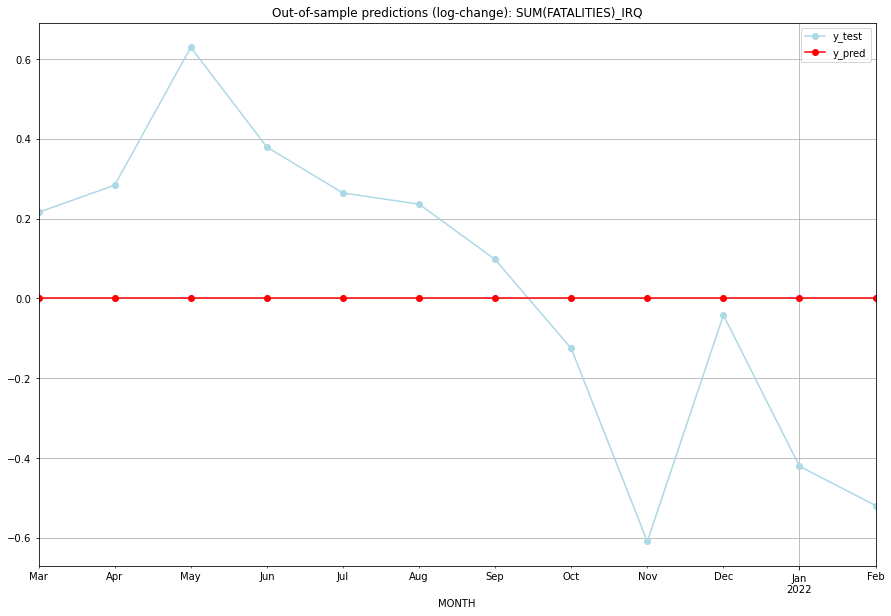

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03     5.273    5.488938           0.0        0.215938
1   2021-04     5.273    5.556828           0.0        0.283829
2   2021-05     5.273    5.902633           0.0        0.629634
3   2021-06     5.273    5.652489           0.0        0.379490
4   2021-07     5.273    5.537334           0.0        0.264335
5   2021-08     5.273    5.509388           0.0        0.236389
6   2021-09     5.273    5.370638           0.0        0.097638
7   2021-10     5.273    5.147494           0.0       -0.125505
8   2021-11     5.273    4.663439           0.0       -0.609560
9   2021-12     5.273    5.231109           0.0       -0.041891
10  2022-01     5.273    4.852030           0.0       -0.420969
11  2022-02     5.273    4.753590           0.0       -0.519409
TADDA: 0.3187155977805696
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01     5.273    5.488938           0.0

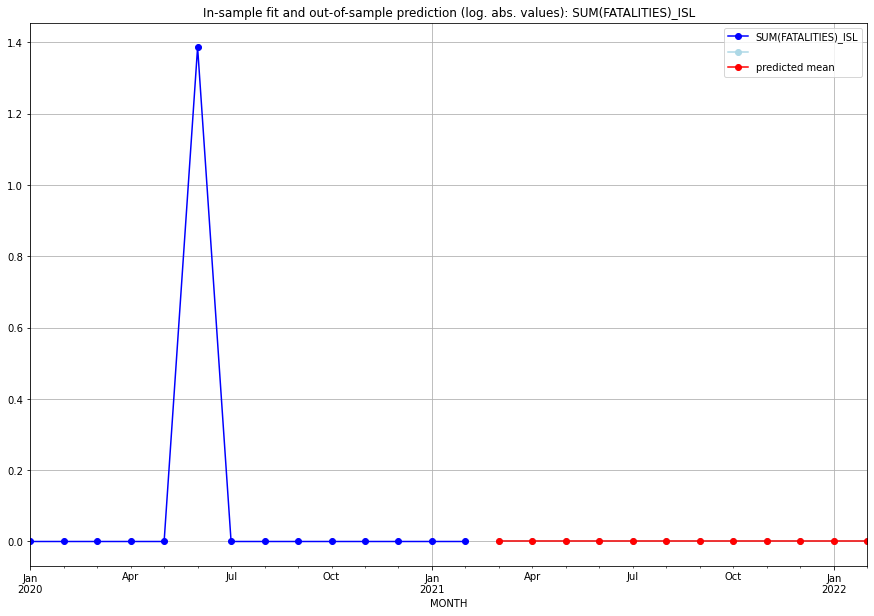

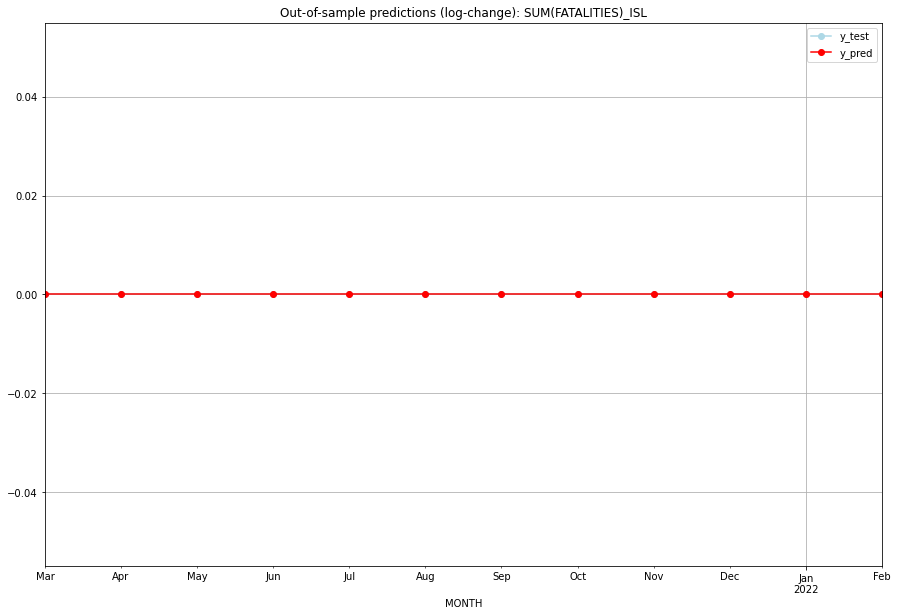

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

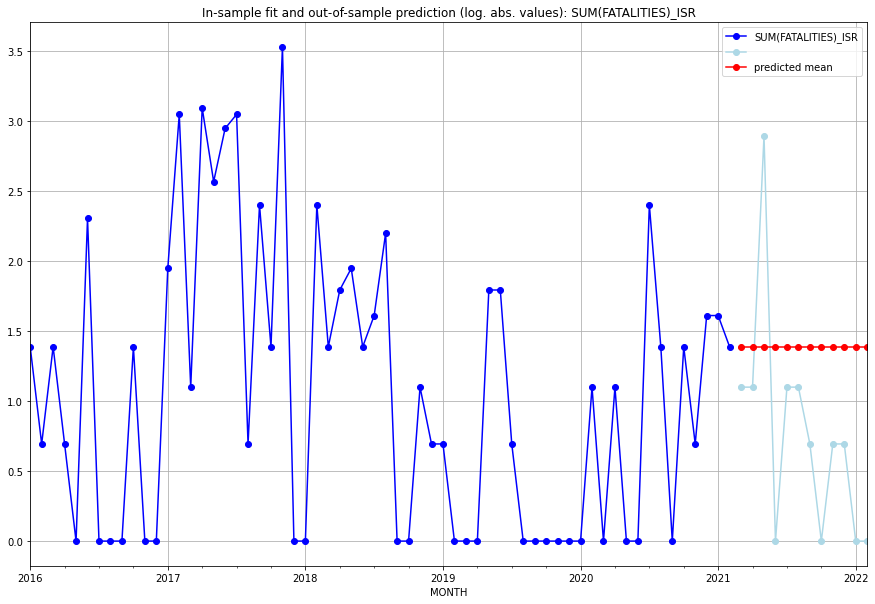

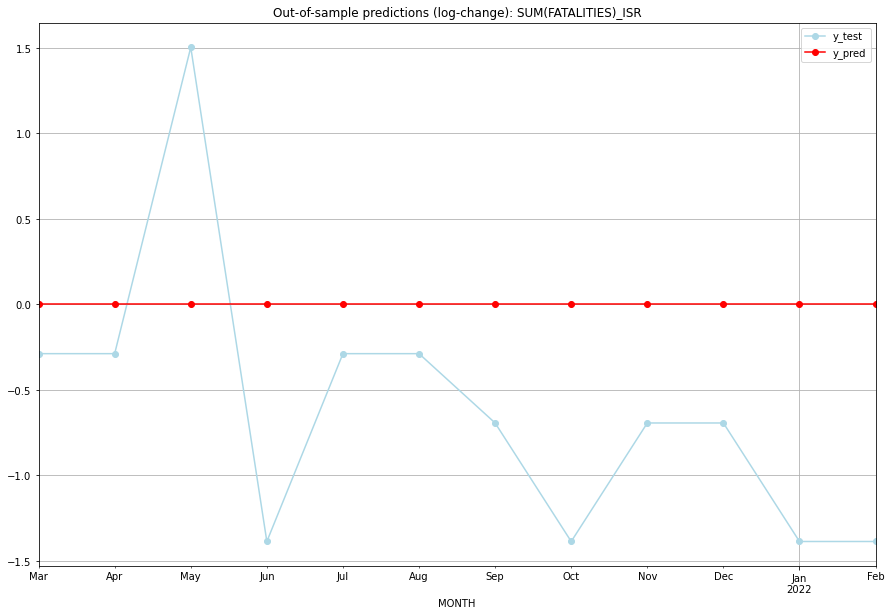

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.386294    1.098612           0.0       -0.287682
1   2021-04  1.386294    1.098612           0.0       -0.287682
2   2021-05  1.386294    2.890372           0.0        1.504077
3   2021-06  1.386294    0.000000           0.0       -1.386294
4   2021-07  1.386294    1.098612           0.0       -0.287682
5   2021-08  1.386294    1.098612           0.0       -0.287682
6   2021-09  1.386294    0.693147           0.0       -0.693147
7   2021-10  1.386294    0.000000           0.0       -1.386294
8   2021-11  1.386294    0.693147           0.0       -0.693147
9   2021-12  1.386294    0.693147           0.0       -0.693147
10  2022-01  1.386294    0.000000           0.0       -1.386294
11  2022-02  1.386294    0.000000           0.0       -1.386294
TADDA: 0.8566187227285663
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.386294    1.098612           0.0

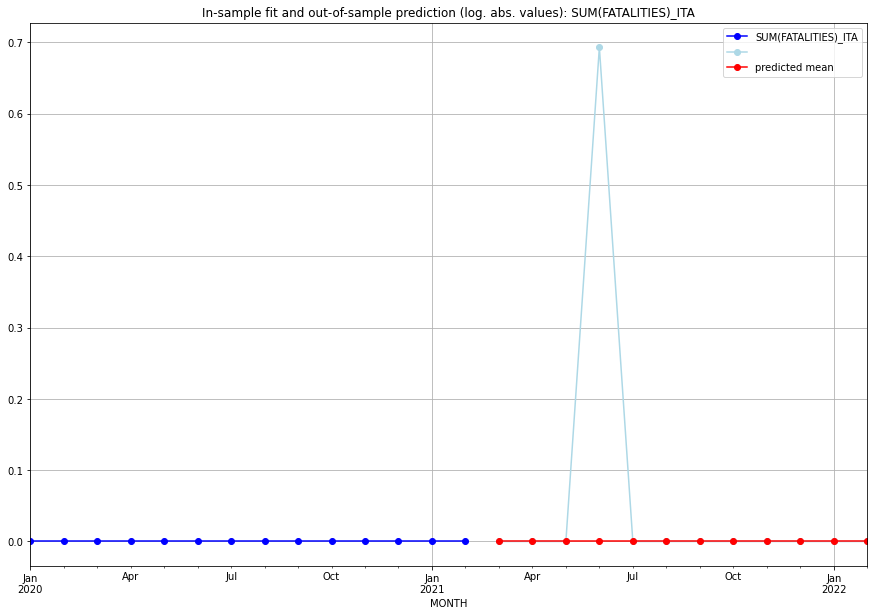

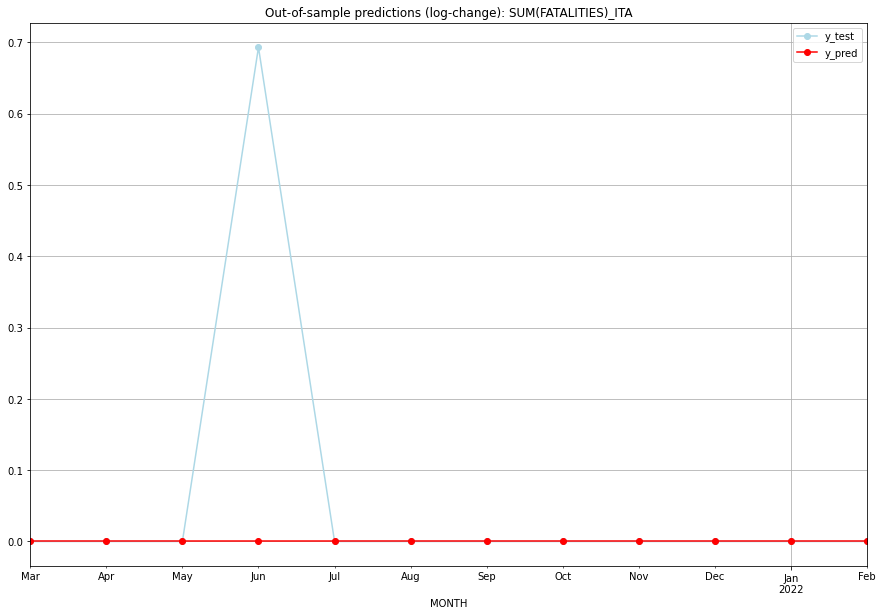

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.693147           0.0        0.693147
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

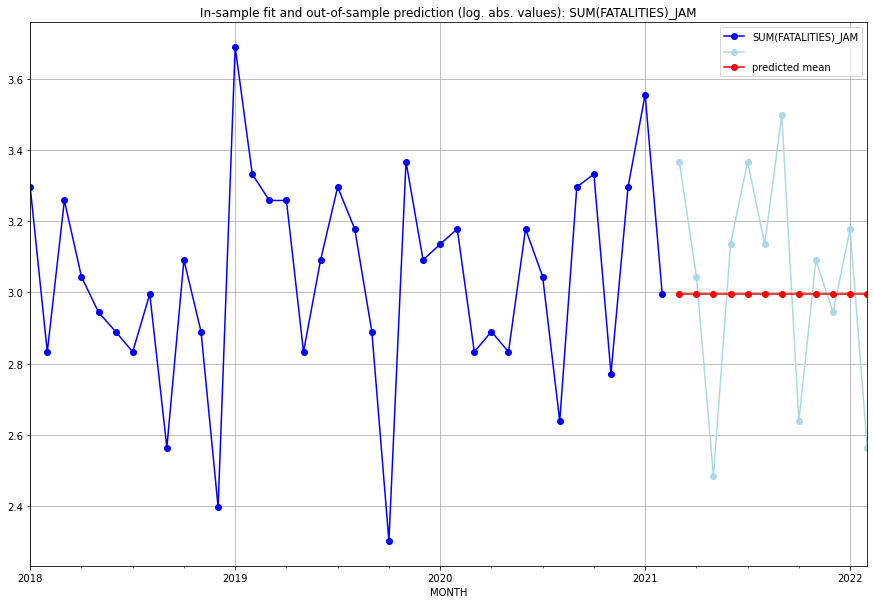

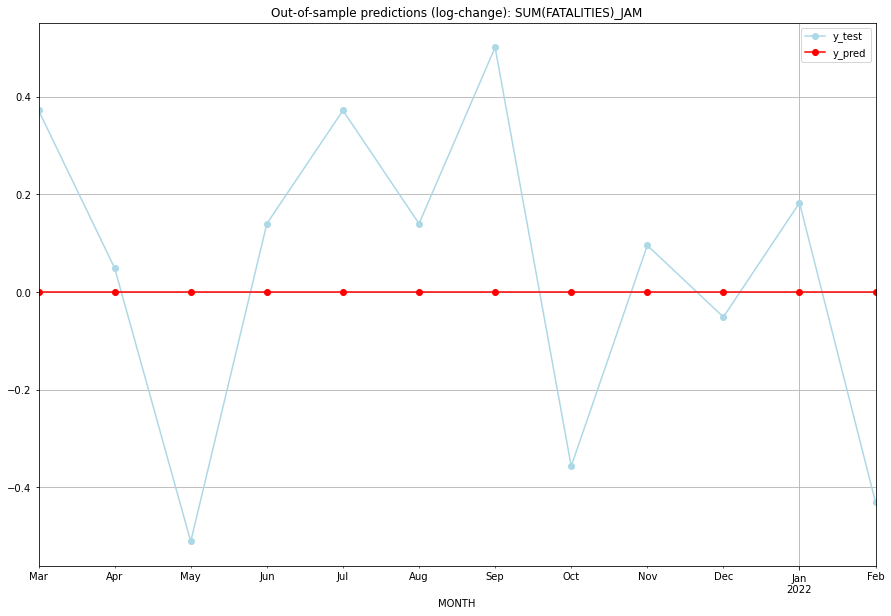

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  2.995732    3.367296           0.0        0.371564
1   2021-04  2.995732    3.044522           0.0        0.048790
2   2021-05  2.995732    2.484907           0.0       -0.510826
3   2021-06  2.995732    3.135494           0.0        0.139762
4   2021-07  2.995732    3.367296           0.0        0.371564
5   2021-08  2.995732    3.135494           0.0        0.139762
6   2021-09  2.995732    3.496508           0.0        0.500775
7   2021-10  2.995732    2.639057           0.0       -0.356675
8   2021-11  2.995732    3.091042           0.0        0.095310
9   2021-12  2.995732    2.944439           0.0       -0.051293
10  2022-01  2.995732    3.178054           0.0        0.182322
11  2022-02  2.995732    2.564949           0.0       -0.430783
TADDA: 0.26661874704001776
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  2.995732    3.367296           0.

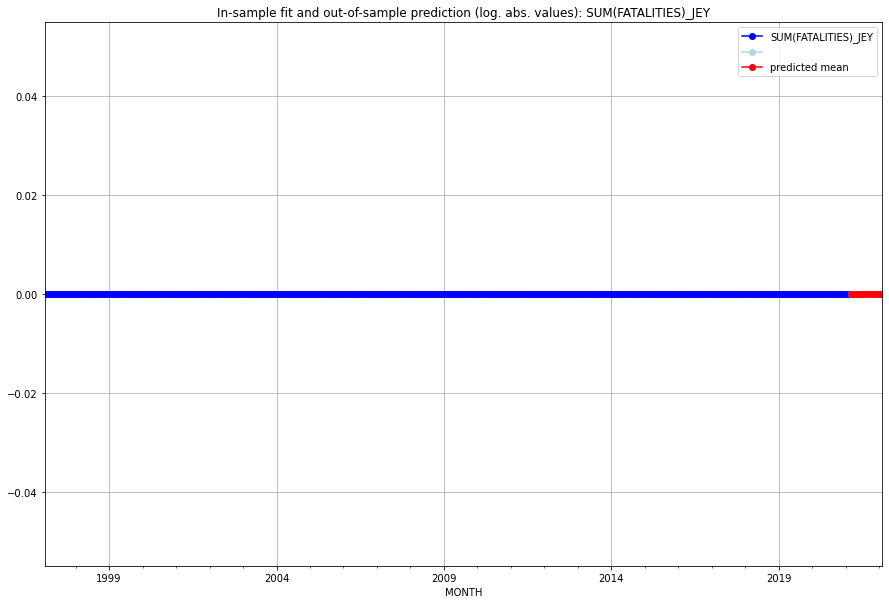

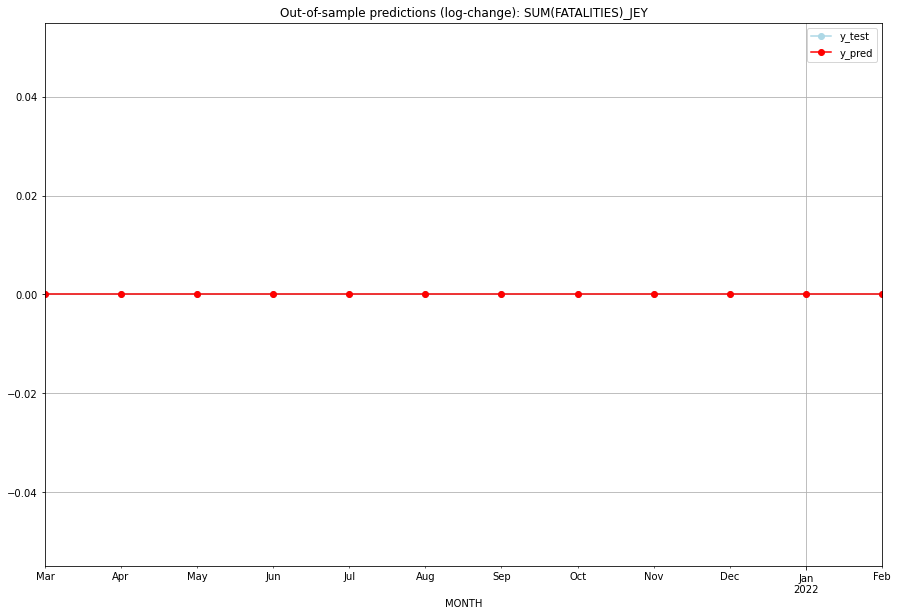

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

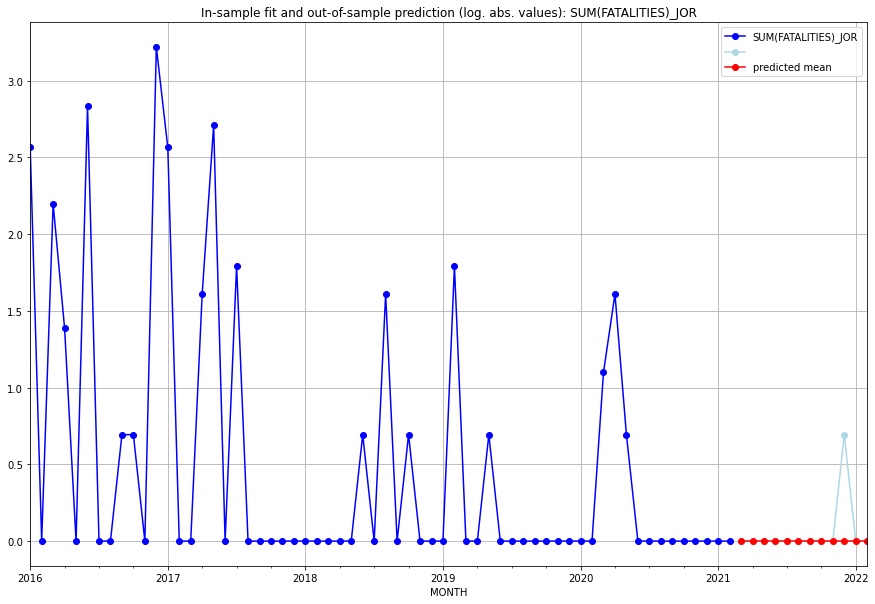

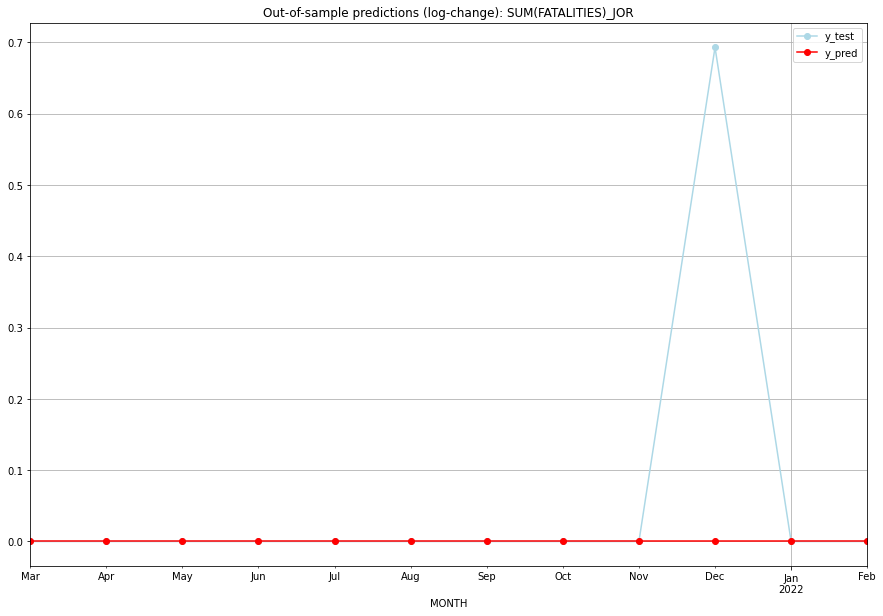

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.693147           0.0        0.693147
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

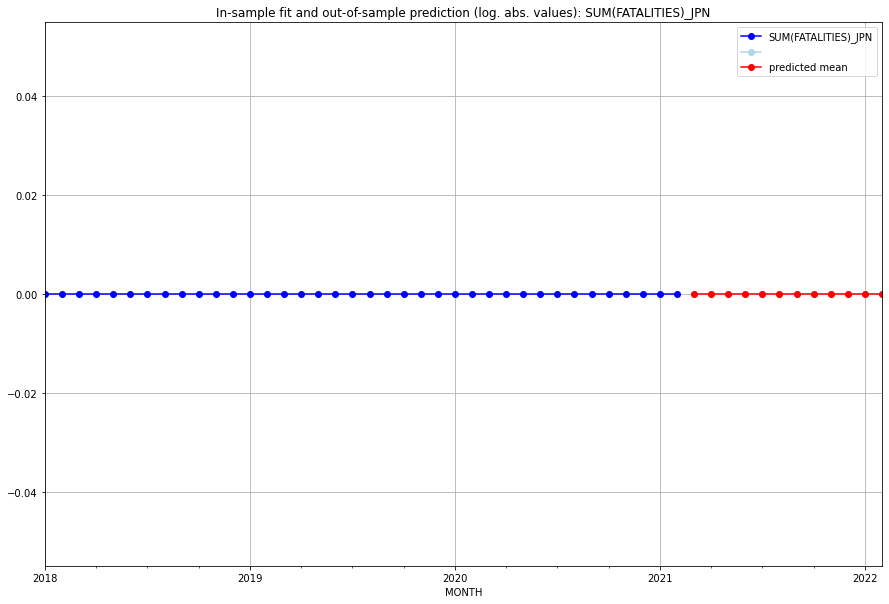

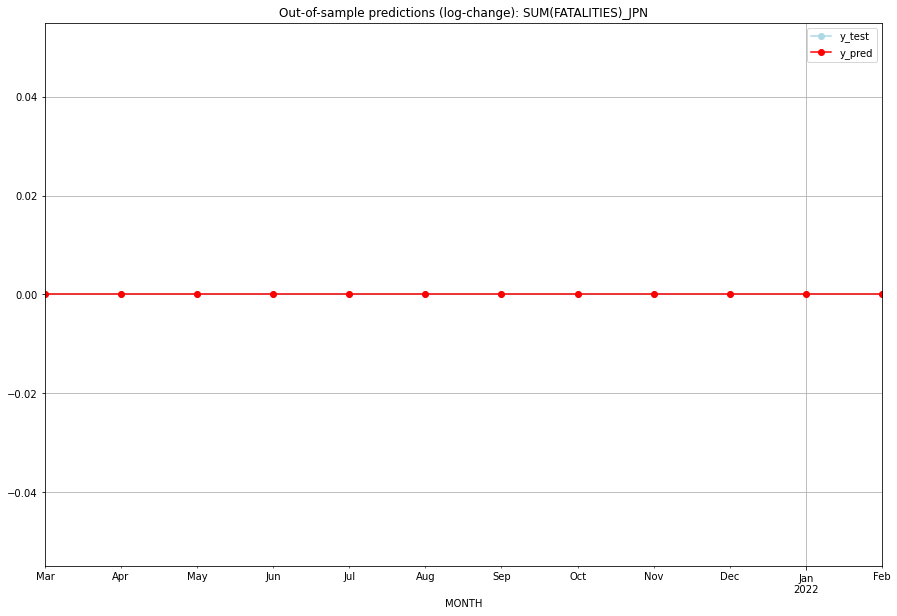

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

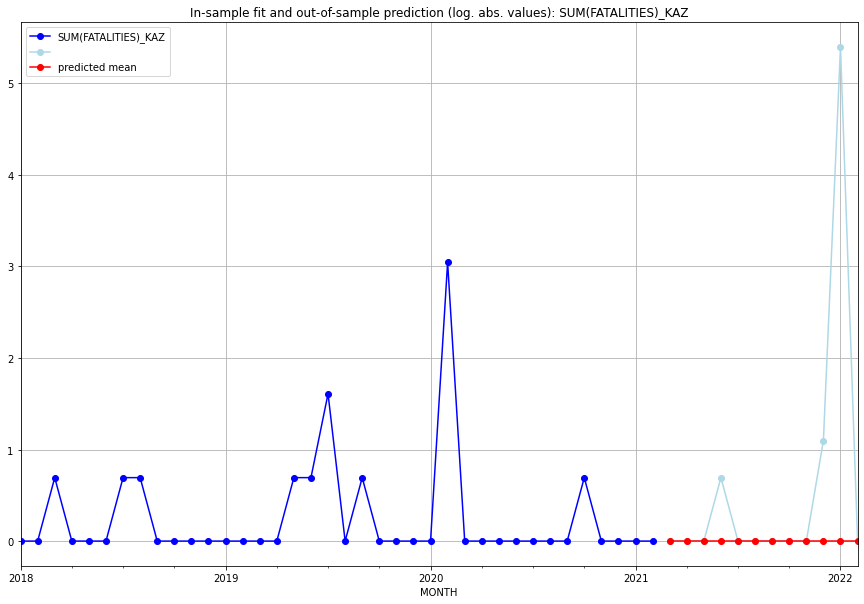

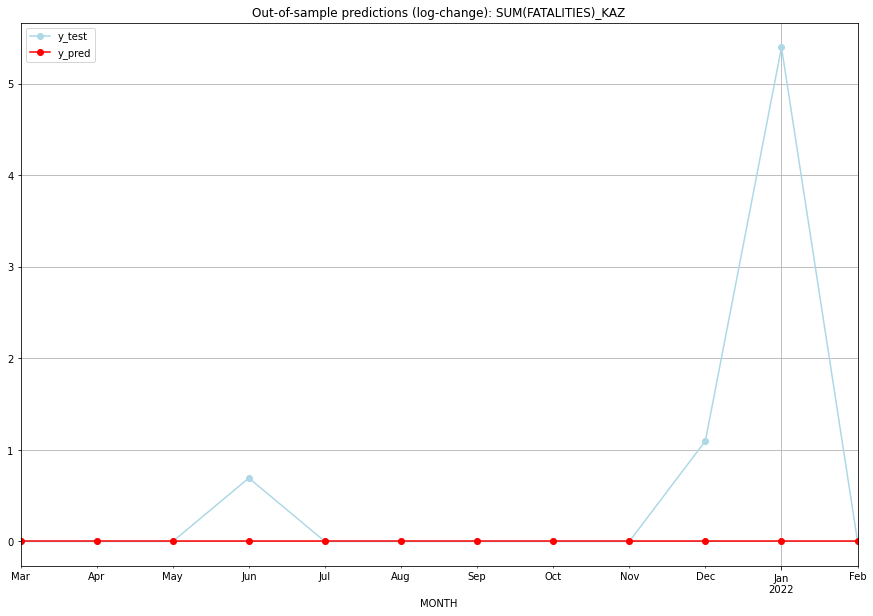

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.693147           0.0        0.693147
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    1.098612           0.0        1.098612
10  2022-01       0.0    5.398163           0.0        5.398163
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.599160180895484
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0 

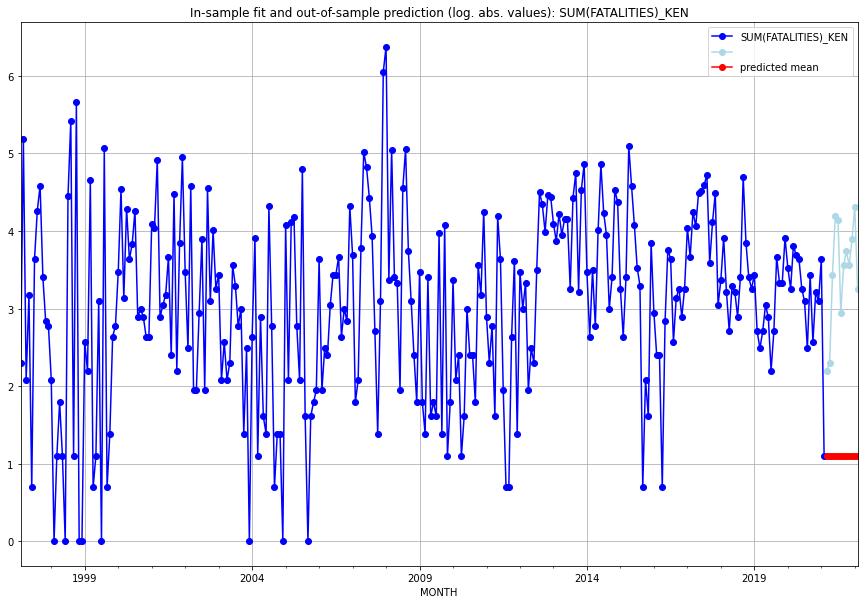

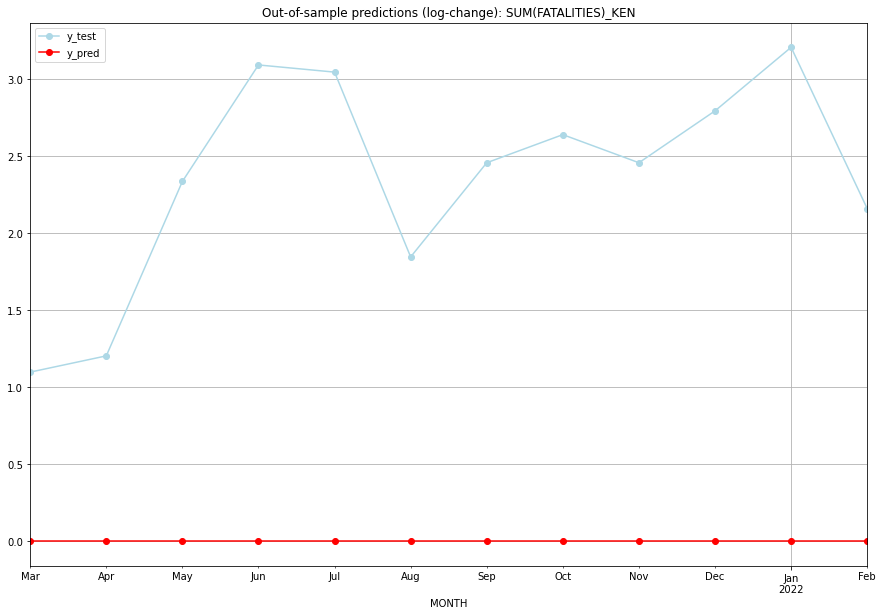

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.098612    2.197225           0.0        1.098612
1   2021-04  1.098612    2.302585           0.0        1.203973
2   2021-05  1.098612    3.433987           0.0        2.335375
3   2021-06  1.098612    4.189655           0.0        3.091042
4   2021-07  1.098612    4.143135           0.0        3.044522
5   2021-08  1.098612    2.944439           0.0        1.845827
6   2021-09  1.098612    3.555348           0.0        2.456736
7   2021-10  1.098612    3.737670           0.0        2.639057
8   2021-11  1.098612    3.555348           0.0        2.456736
9   2021-12  1.098612    3.891820           0.0        2.793208
10  2022-01  1.098612    4.304065           0.0        3.205453
11  2022-02  1.098612    3.258097           0.0        2.159484
TADDA: 2.360835460748414
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.098612    2.197225           0.0 

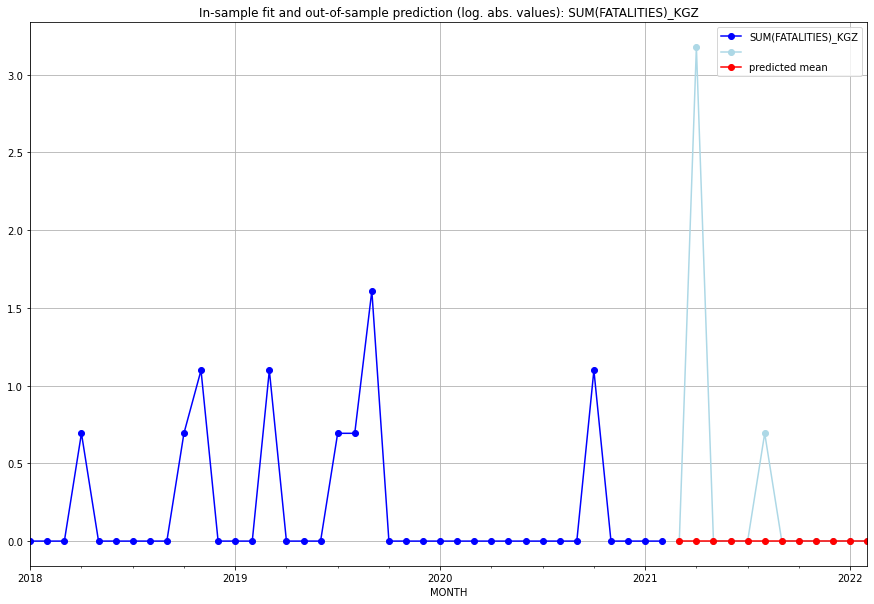

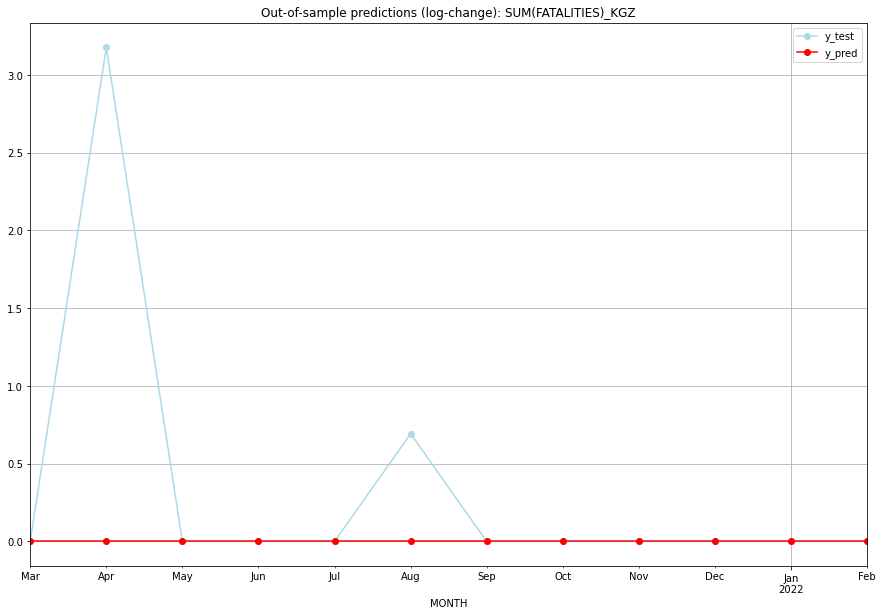

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    3.178054           0.0        3.178054
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.693147           0.0        0.693147
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.3226000842423243
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0

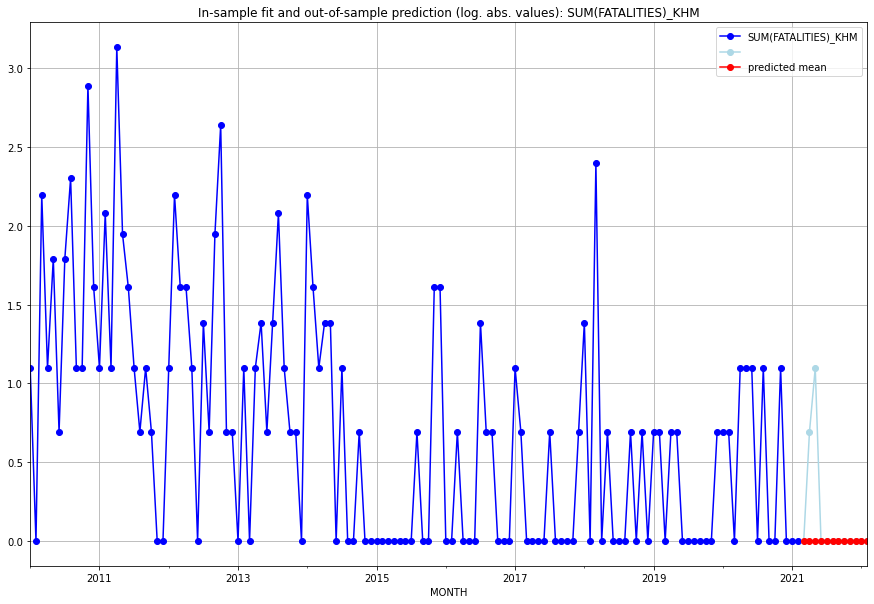

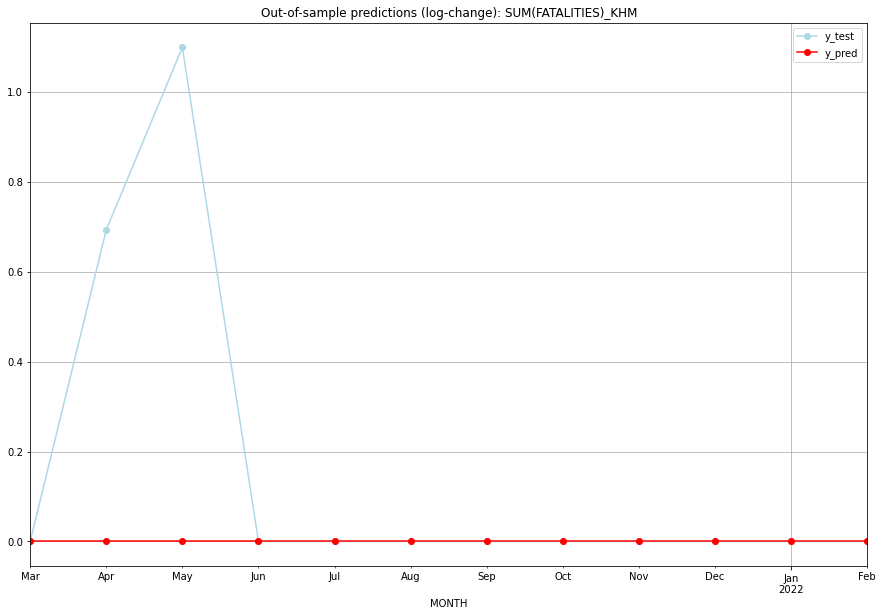

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.693147           0.0        0.693147
2   2021-05       0.0    1.098612           0.0        1.098612
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.1493132891023379
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0

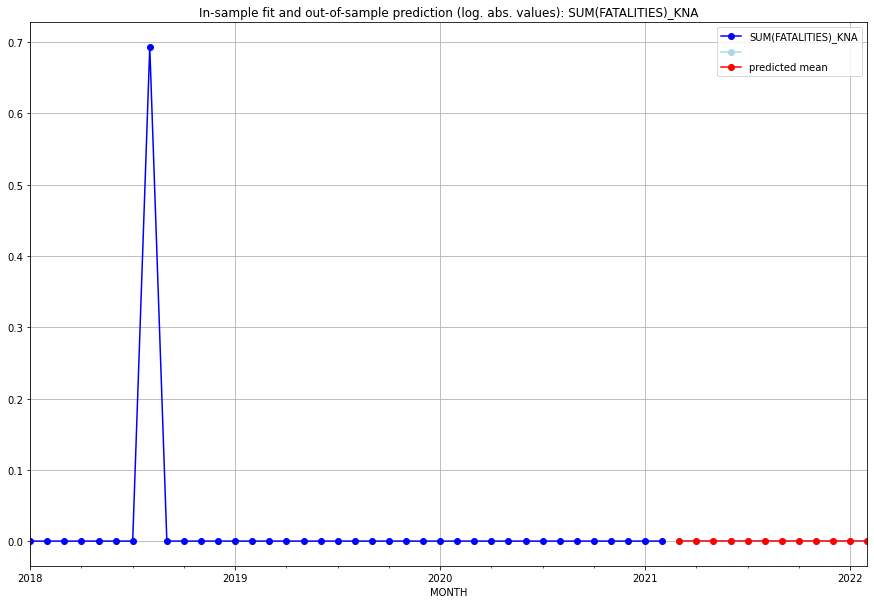

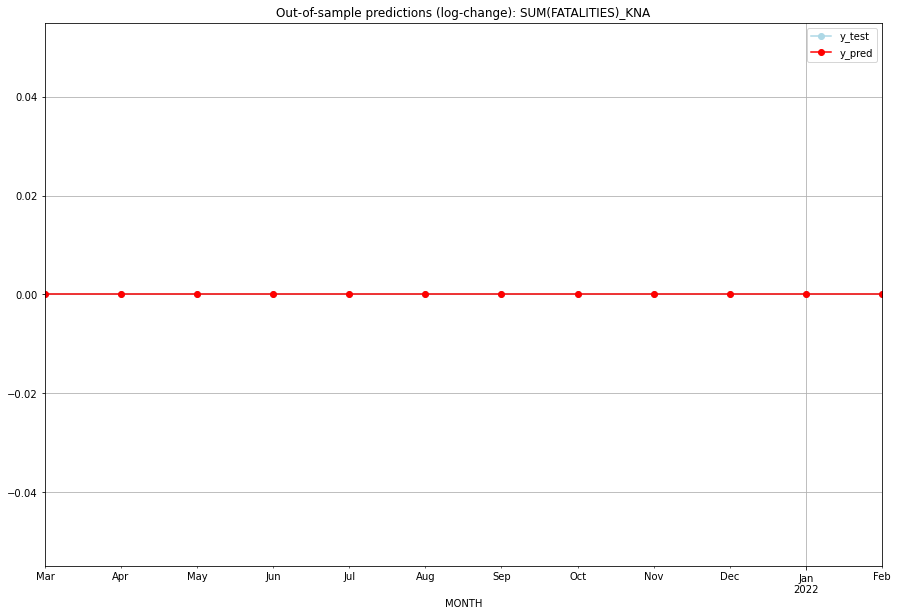

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

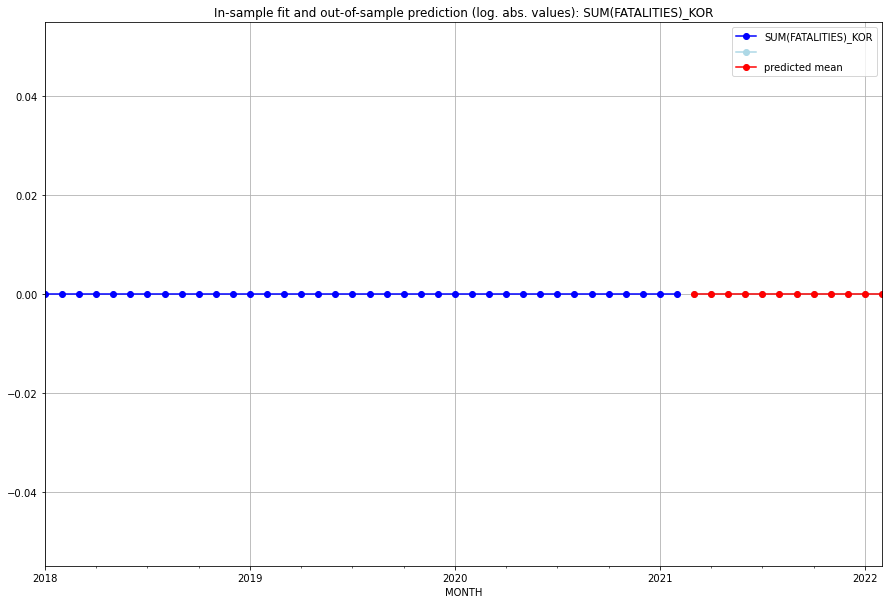

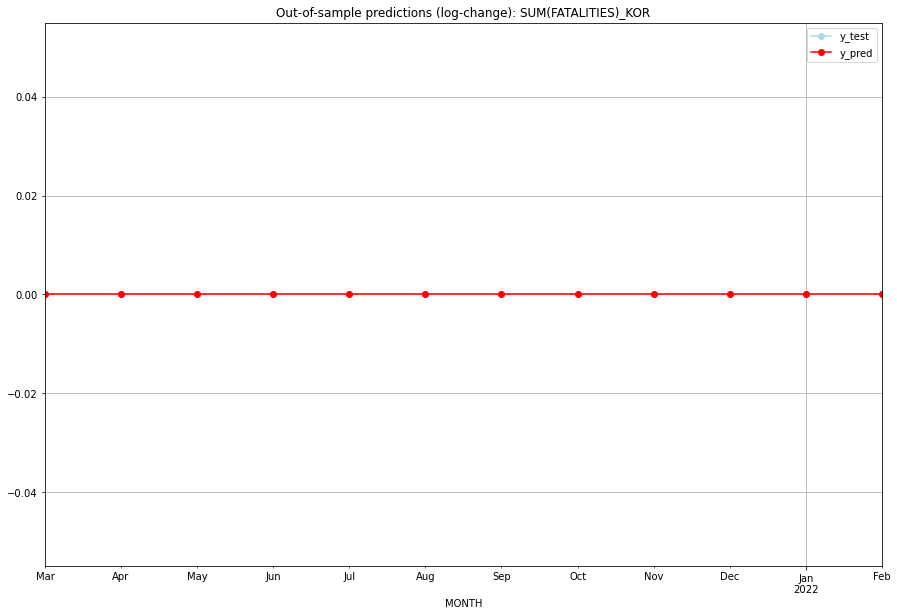

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

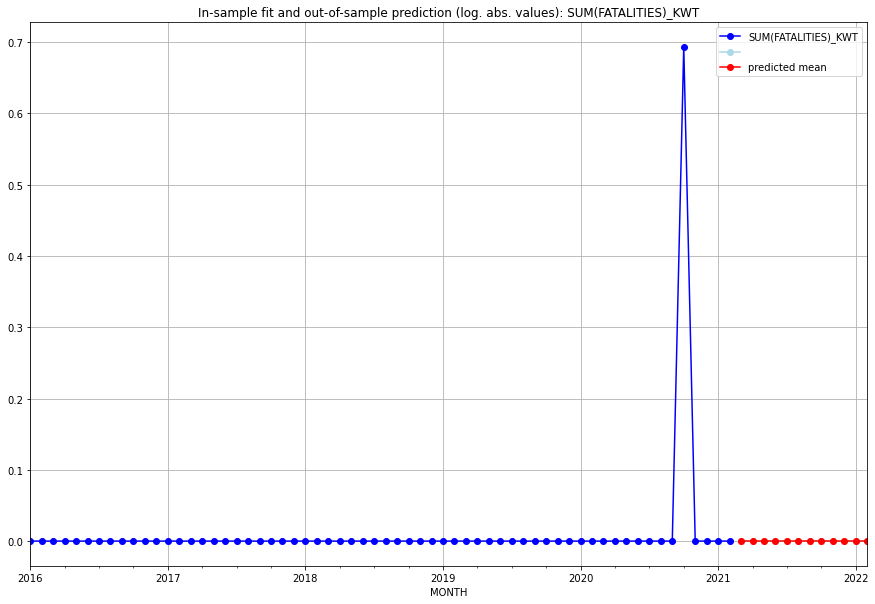

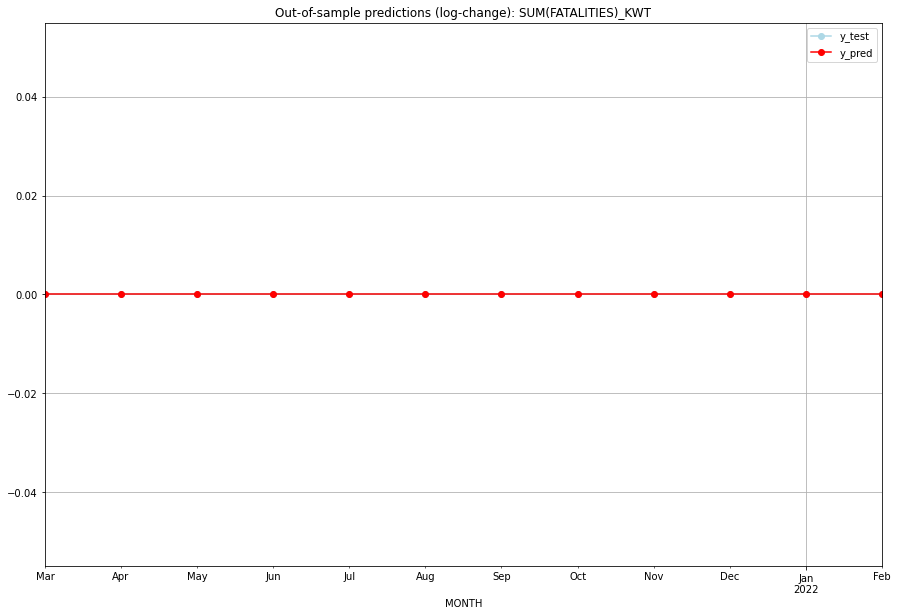

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

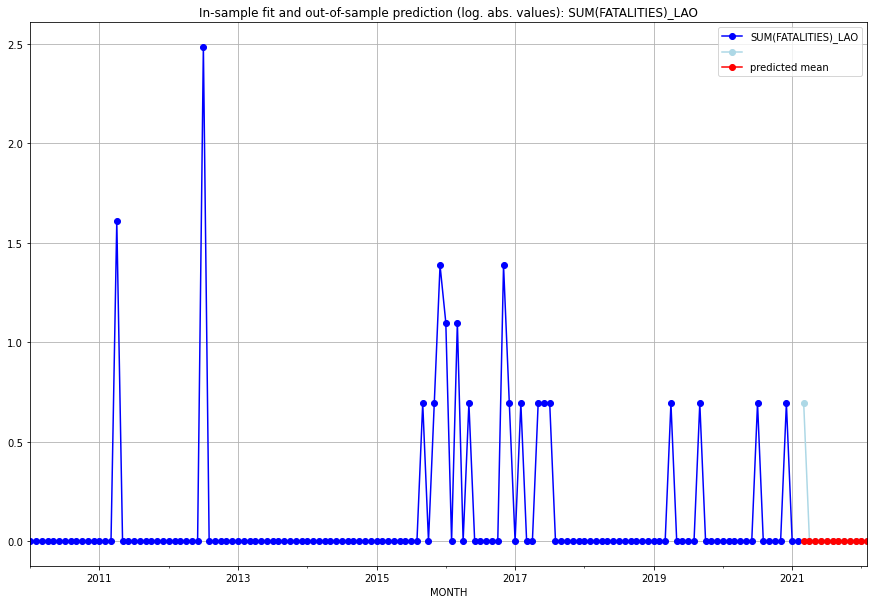

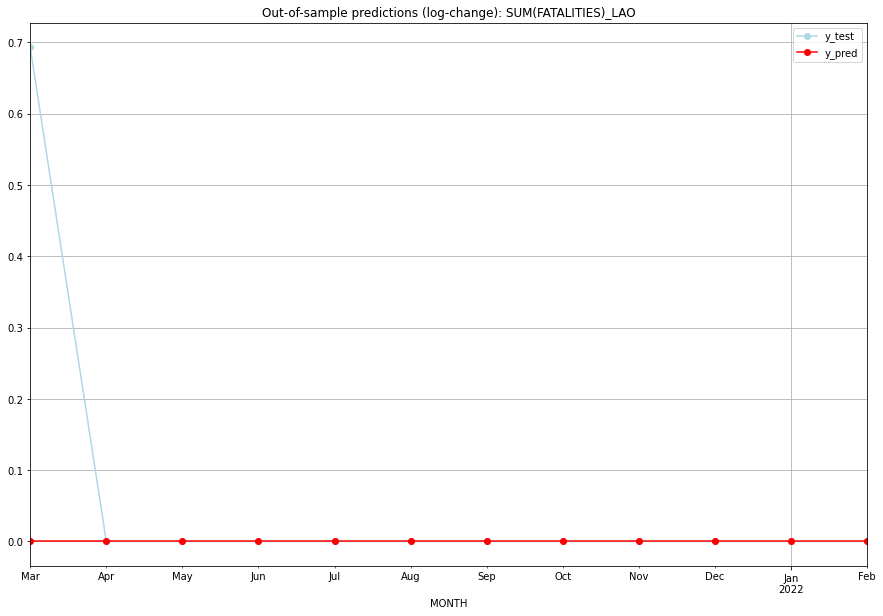

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.693147           0.0        0.693147
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.693147           0

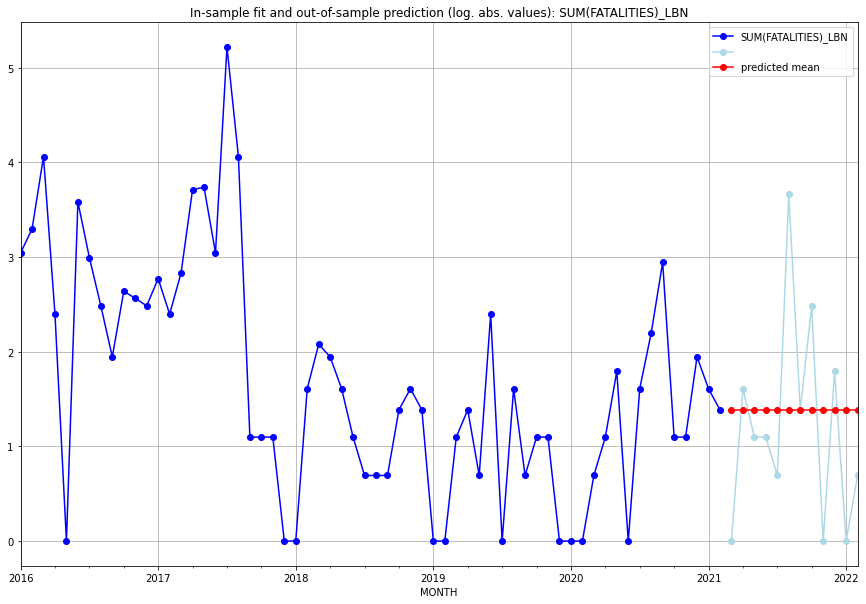

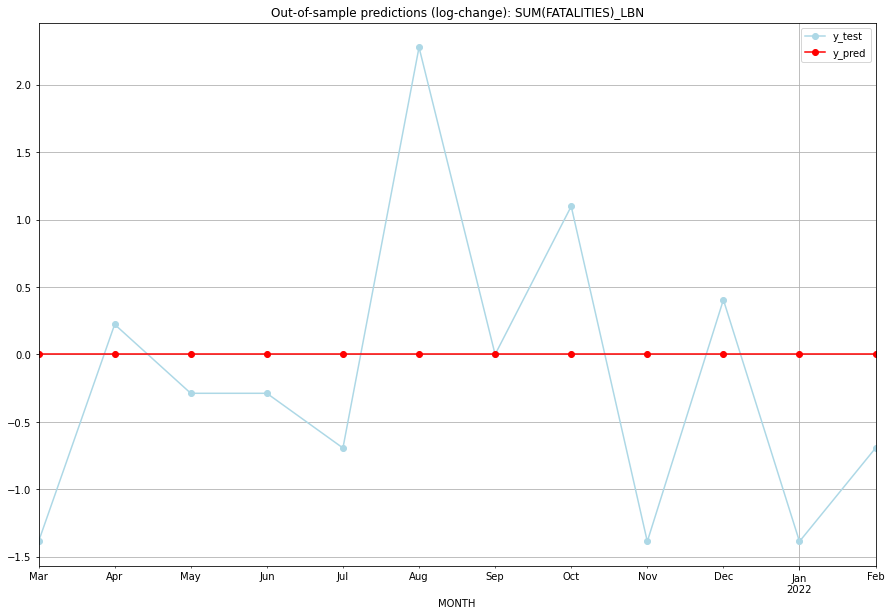

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.386294    0.000000           0.0       -1.386294
1   2021-04  1.386294    1.609438           0.0        0.223144
2   2021-05  1.386294    1.098612           0.0       -0.287682
3   2021-06  1.386294    1.098612           0.0       -0.287682
4   2021-07  1.386294    0.693147           0.0       -0.693147
5   2021-08  1.386294    3.663562           0.0        2.277267
6   2021-09  1.386294    1.386294           0.0        0.000000
7   2021-10  1.386294    2.484907           0.0        1.098612
8   2021-11  1.386294    0.000000           0.0       -1.386294
9   2021-12  1.386294    1.791759           0.0        0.405465
10  2022-01  1.386294    0.000000           0.0       -1.386294
11  2022-02  1.386294    0.693147           0.0       -0.693147
TADDA: 0.843752485206947
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.386294    0.000000           0.0 

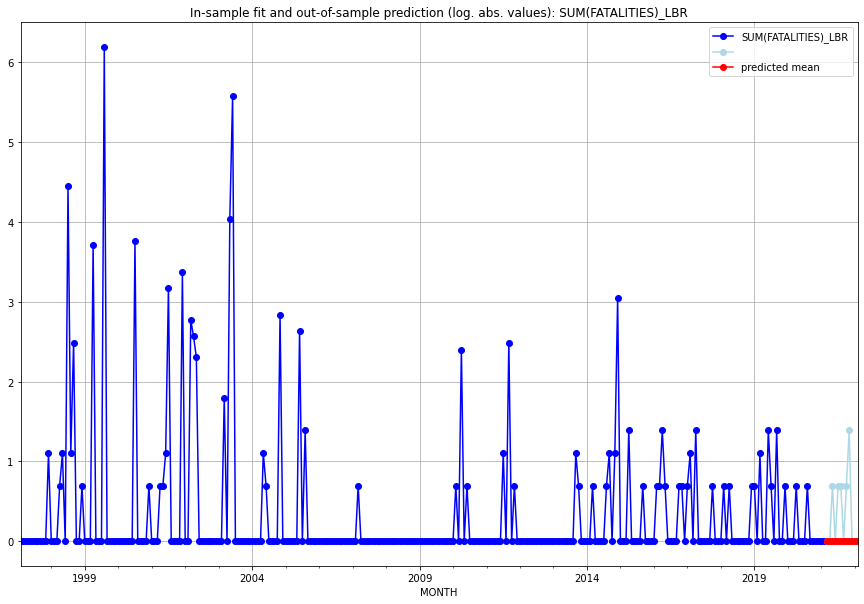

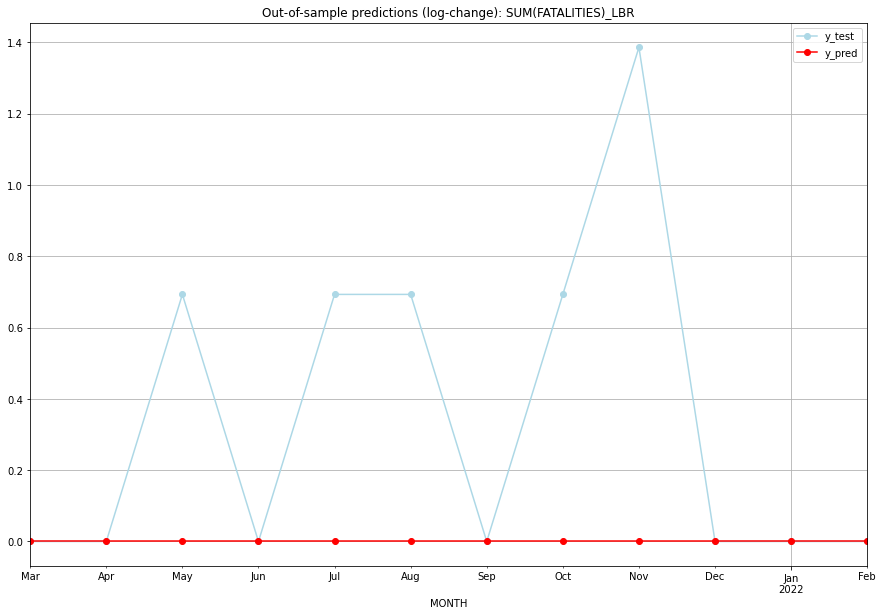

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.693147           0.0        0.693147
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.693147           0.0        0.693147
5   2021-08       0.0    0.693147           0.0        0.693147
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.693147           0.0        0.693147
8   2021-11       0.0    1.386294           0.0        1.386294
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.34657359027997264
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

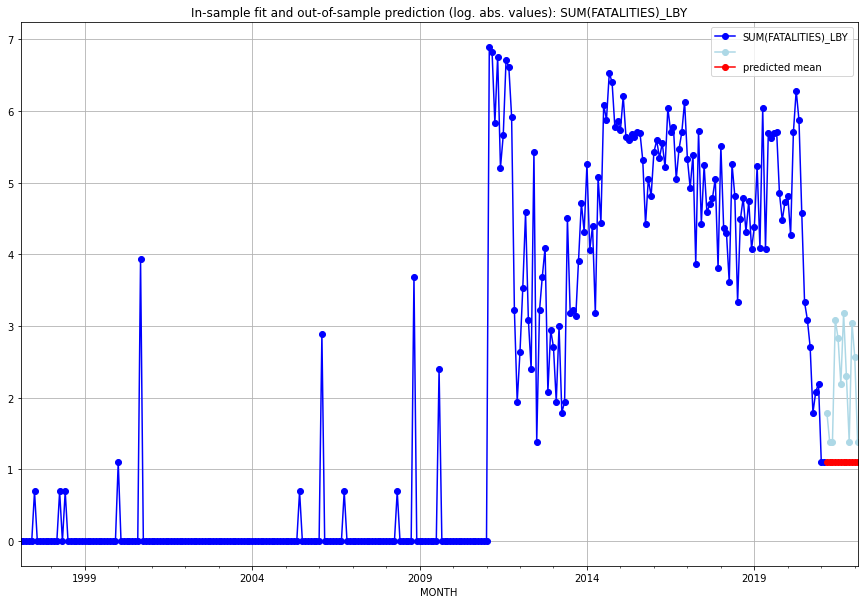

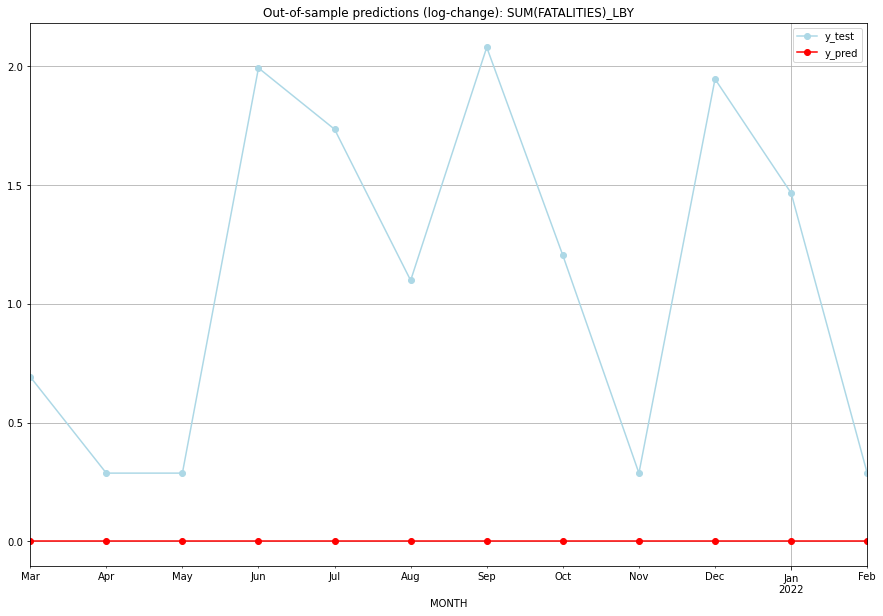

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.098612    1.791759           0.0        0.693147
1   2021-04  1.098612    1.386294           0.0        0.287682
2   2021-05  1.098612    1.386294           0.0        0.287682
3   2021-06  1.098612    3.091042           0.0        1.992430
4   2021-07  1.098612    2.833213           0.0        1.734601
5   2021-08  1.098612    2.197225           0.0        1.098612
6   2021-09  1.098612    3.178054           0.0        2.079442
7   2021-10  1.098612    2.302585           0.0        1.203973
8   2021-11  1.098612    1.386294           0.0        0.287682
9   2021-12  1.098612    3.044522           0.0        1.945910
10  2022-01  1.098612    2.564949           0.0        1.466337
11  2022-02  1.098612    1.386294           0.0        0.287682
TADDA: 1.1137650452473336
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.098612    1.791759           0.0

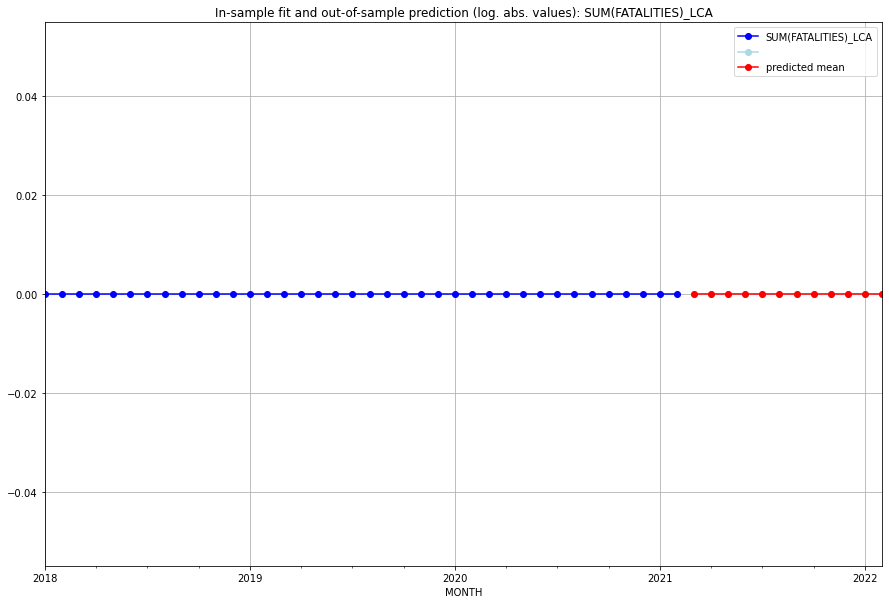

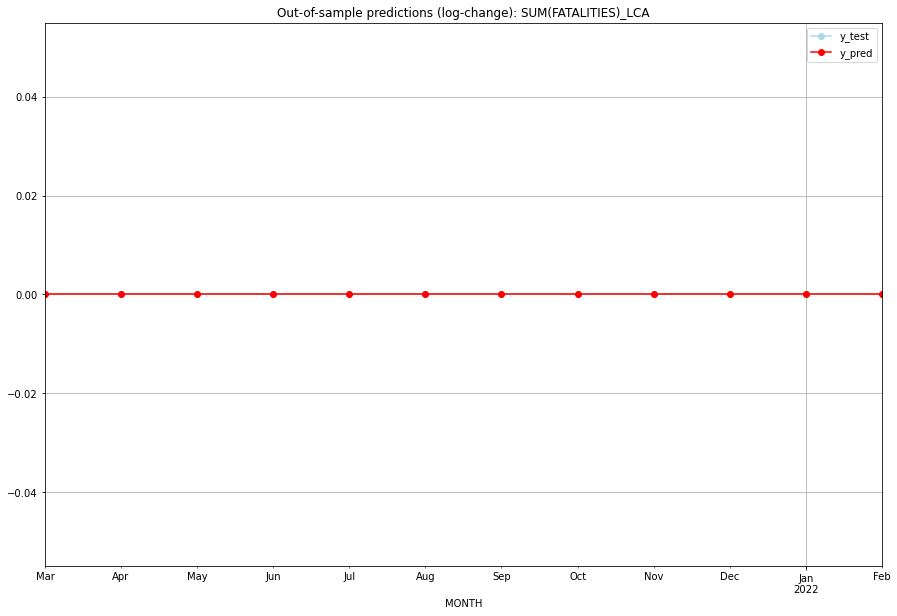

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

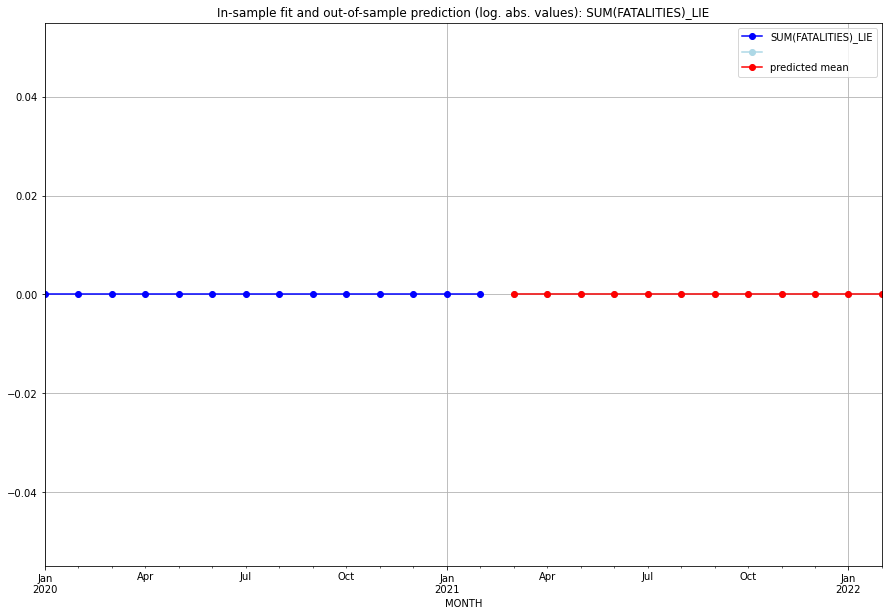

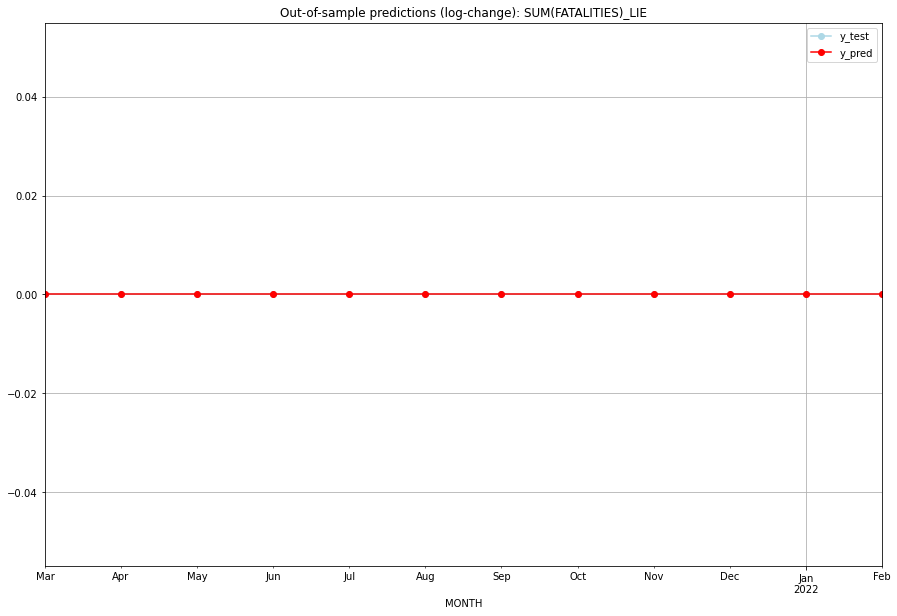

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

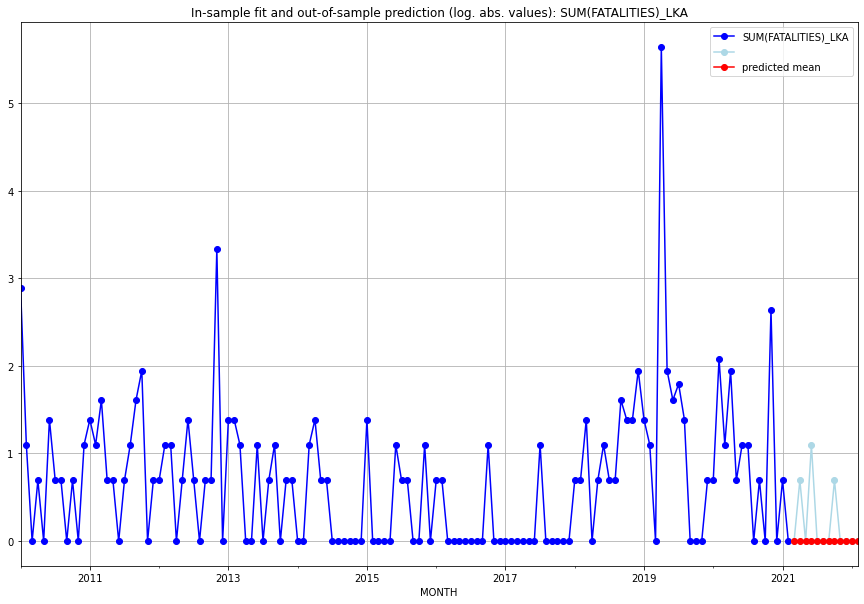

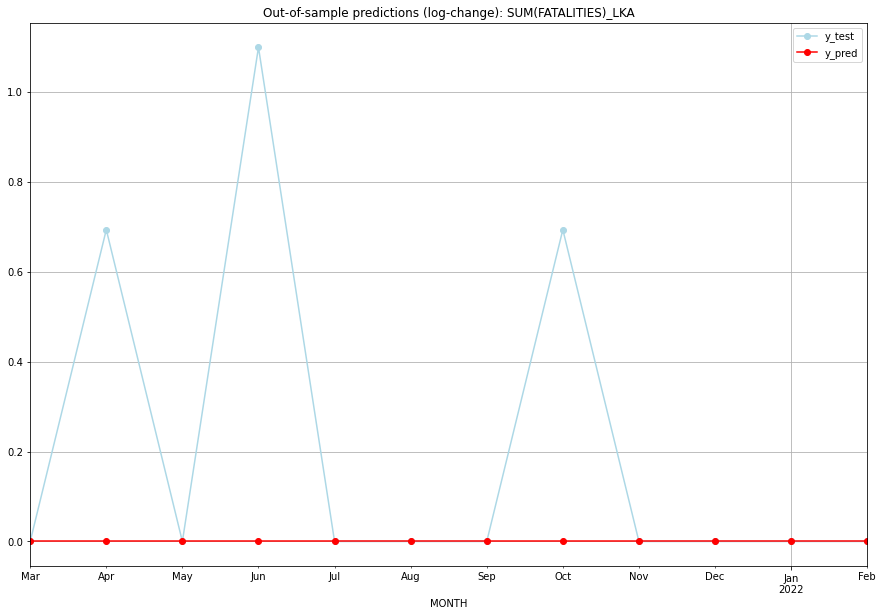

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.693147           0.0        0.693147
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    1.098612           0.0        1.098612
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.693147           0.0        0.693147
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.20707555414900003
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

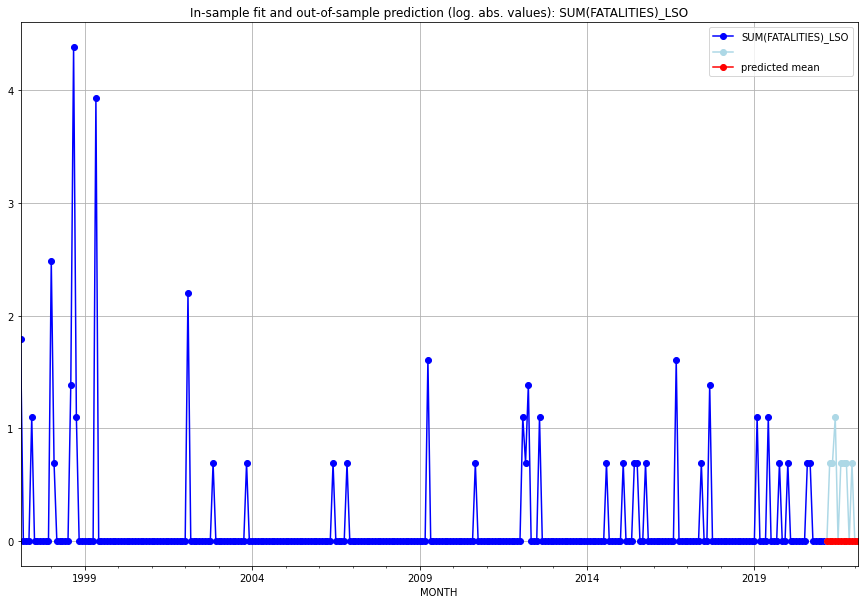

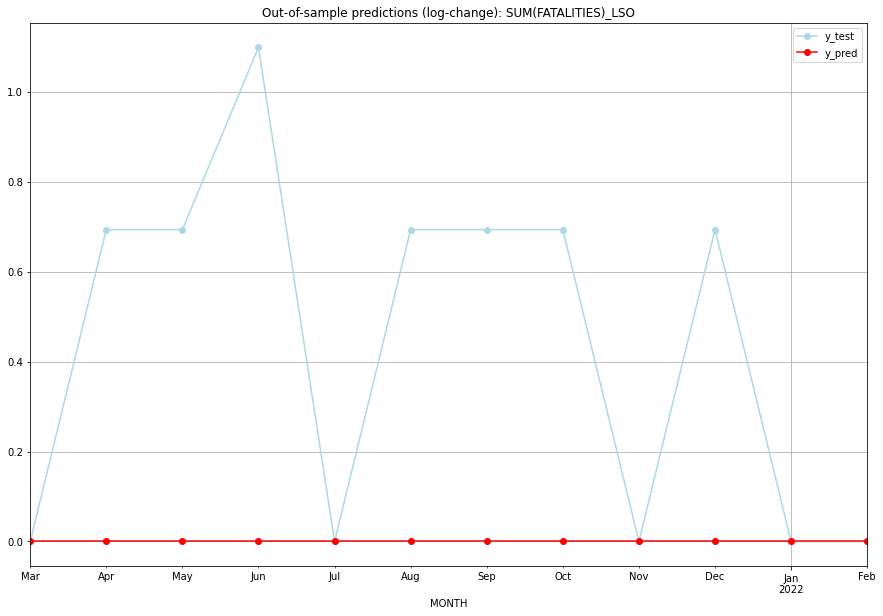

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.693147           0.0        0.693147
2   2021-05       0.0    0.693147           0.0        0.693147
3   2021-06       0.0    1.098612           0.0        1.098612
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.693147           0.0        0.693147
6   2021-09       0.0    0.693147           0.0        0.693147
7   2021-10       0.0    0.693147           0.0        0.693147
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.693147           0.0        0.693147
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.4381246143356485
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0

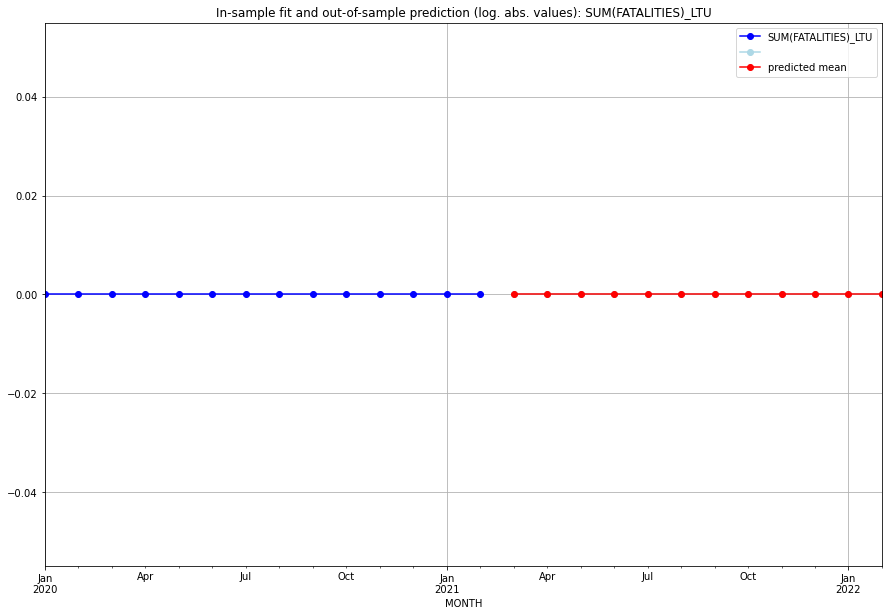

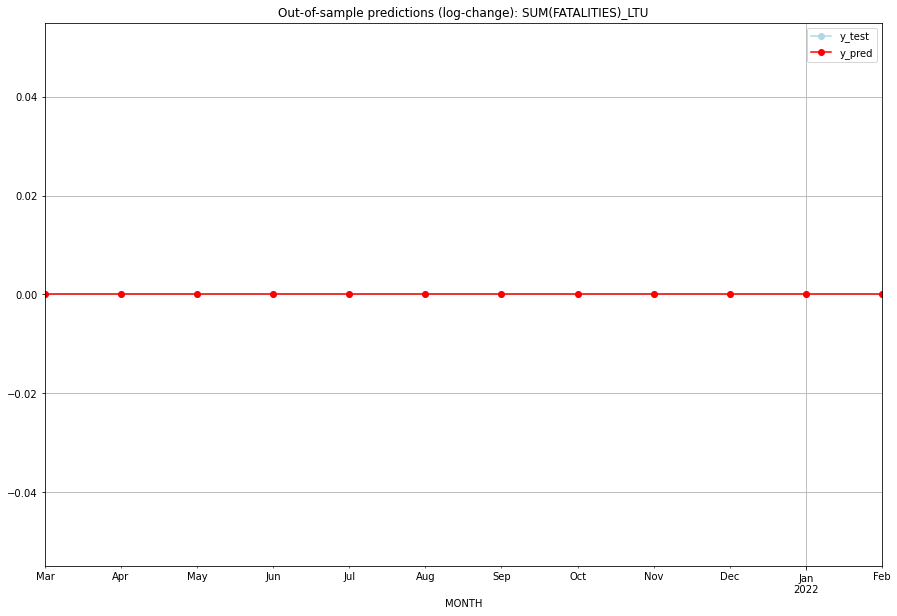

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

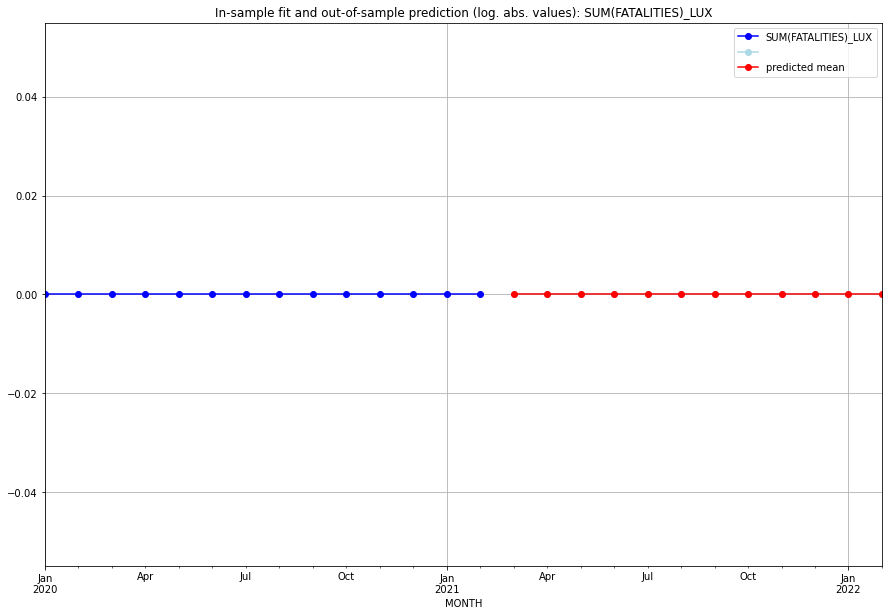

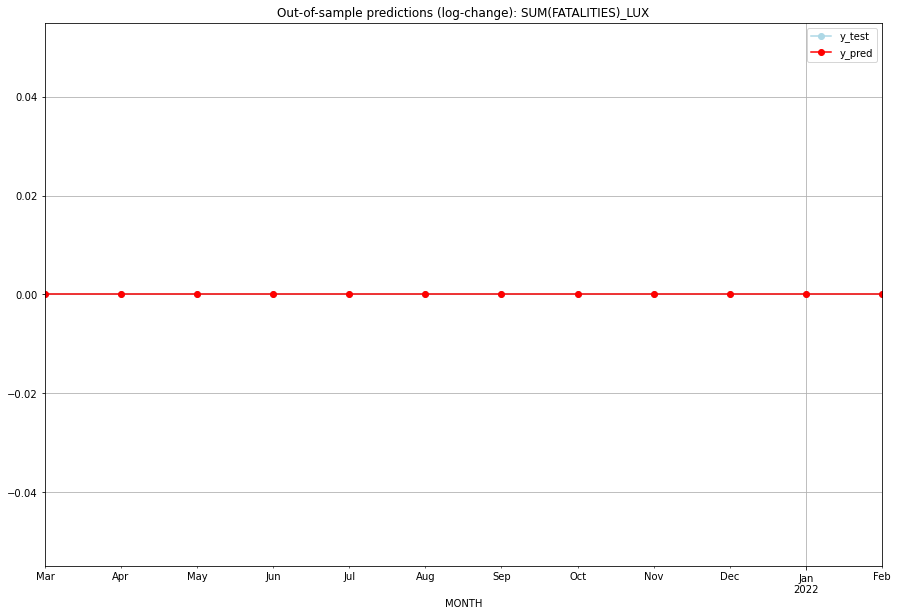

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

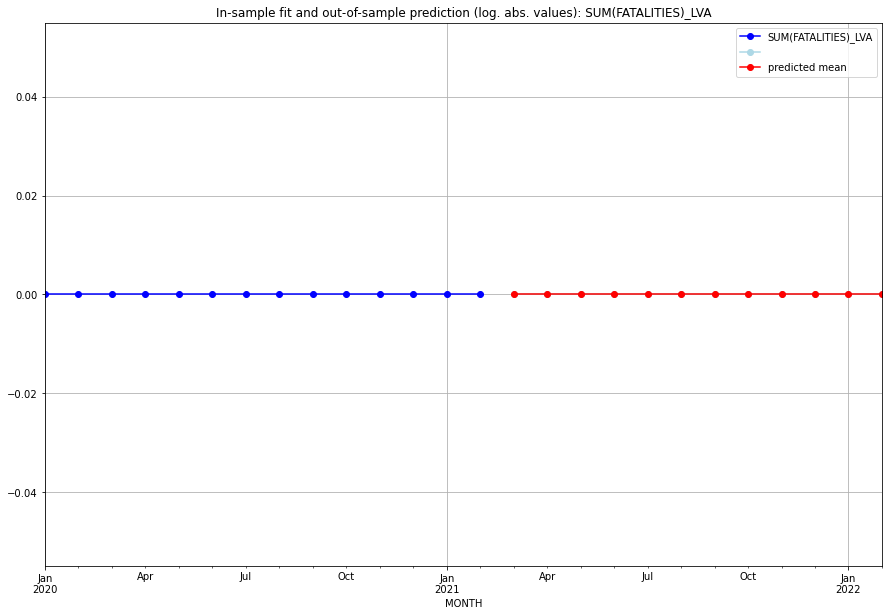

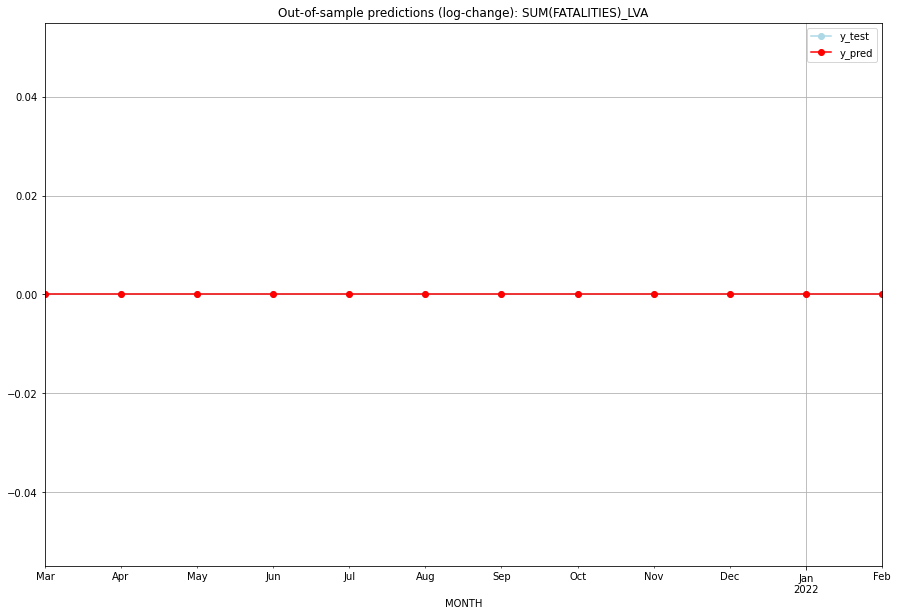

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

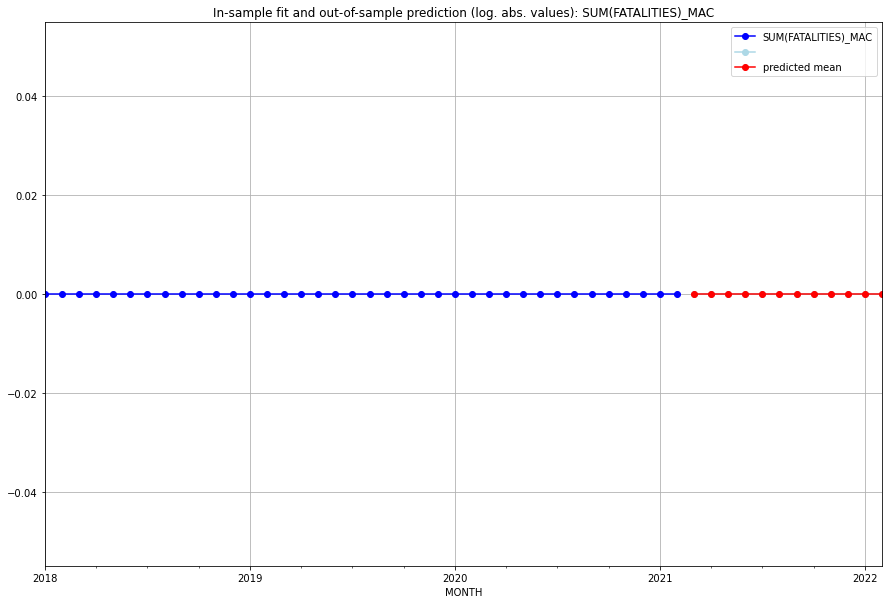

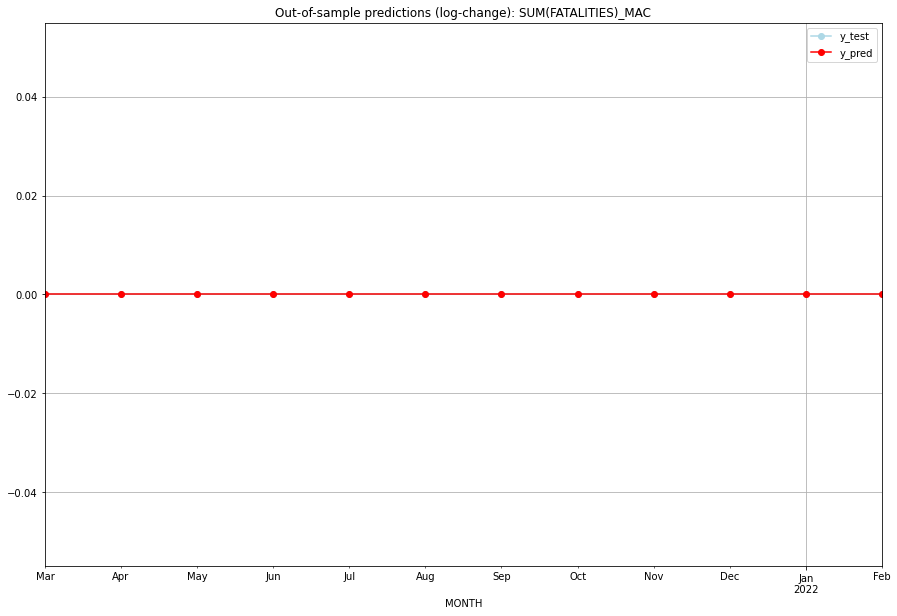

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

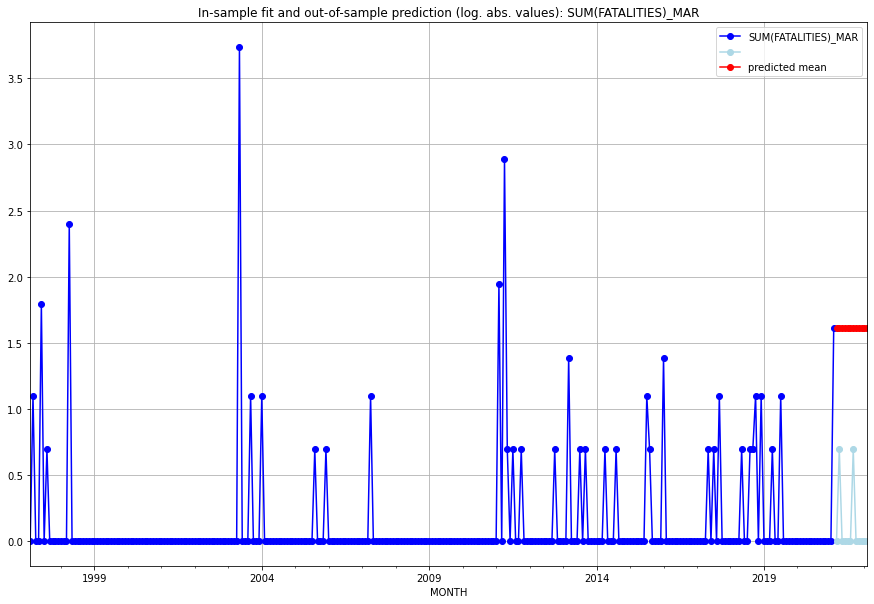

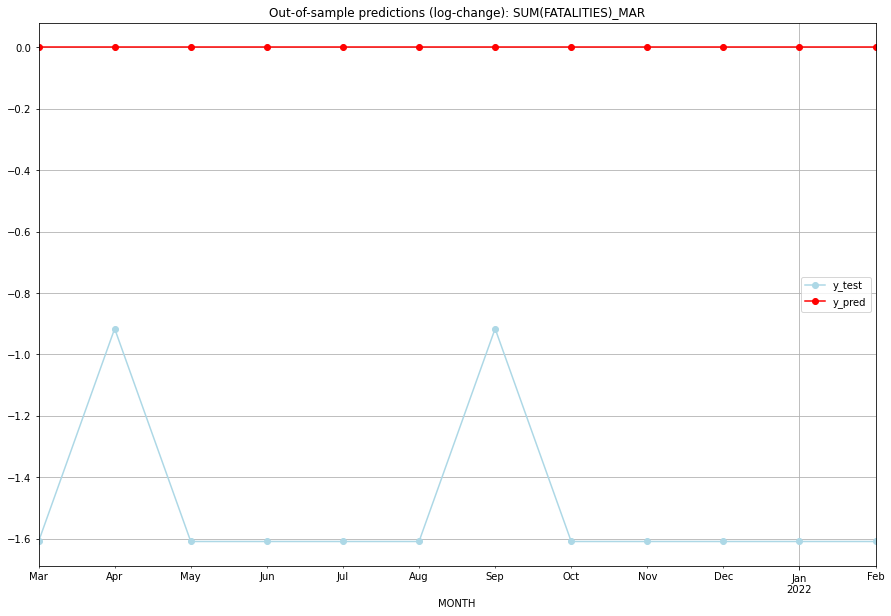

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.609438    0.000000           0.0       -1.609438
1   2021-04  1.609438    0.693147           0.0       -0.916291
2   2021-05  1.609438    0.000000           0.0       -1.609438
3   2021-06  1.609438    0.000000           0.0       -1.609438
4   2021-07  1.609438    0.000000           0.0       -1.609438
5   2021-08  1.609438    0.000000           0.0       -1.609438
6   2021-09  1.609438    0.693147           0.0       -0.916291
7   2021-10  1.609438    0.000000           0.0       -1.609438
8   2021-11  1.609438    0.000000           0.0       -1.609438
9   2021-12  1.609438    0.000000           0.0       -1.609438
10  2022-01  1.609438    0.000000           0.0       -1.609438
11  2022-02  1.609438    0.000000           0.0       -1.609438
TADDA: 1.493913382340776
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.609438    0.000000           0.0 

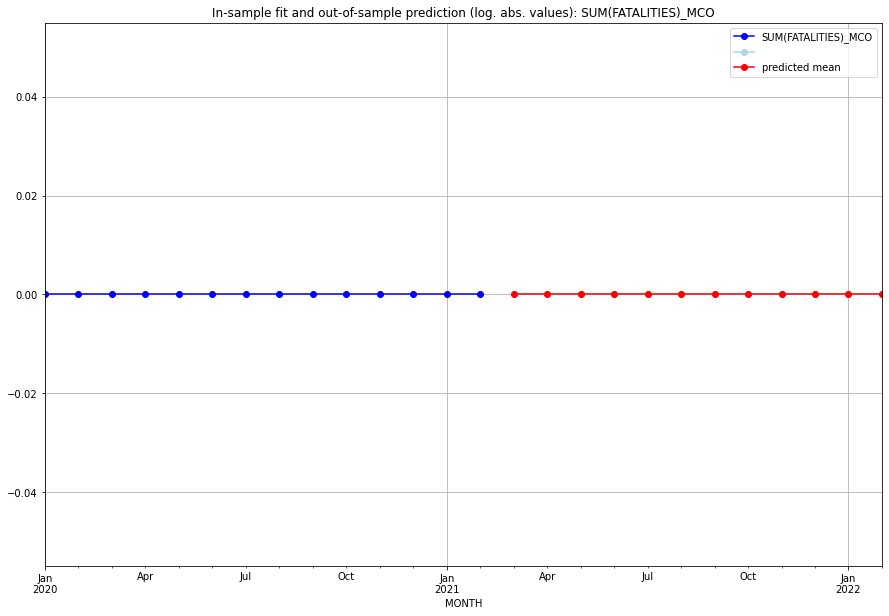

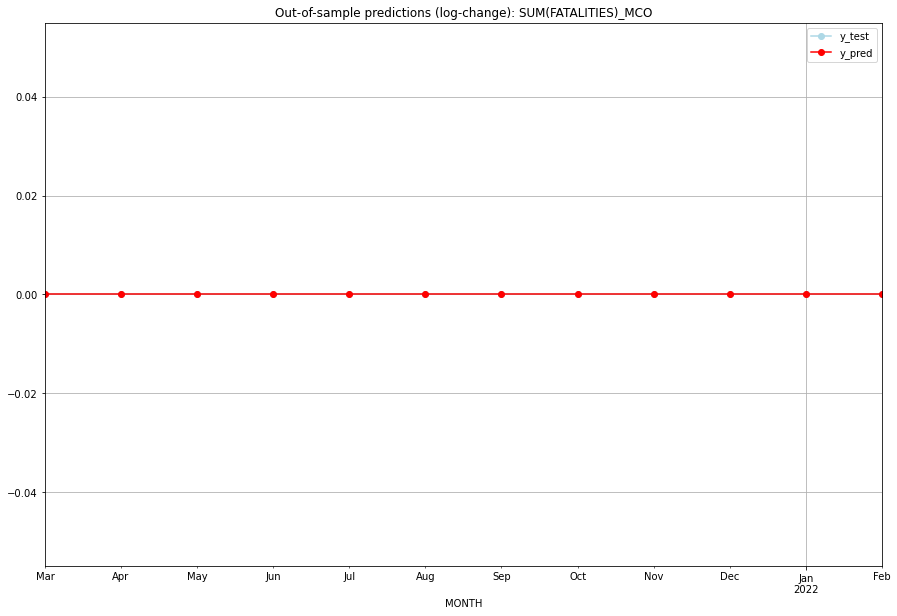

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

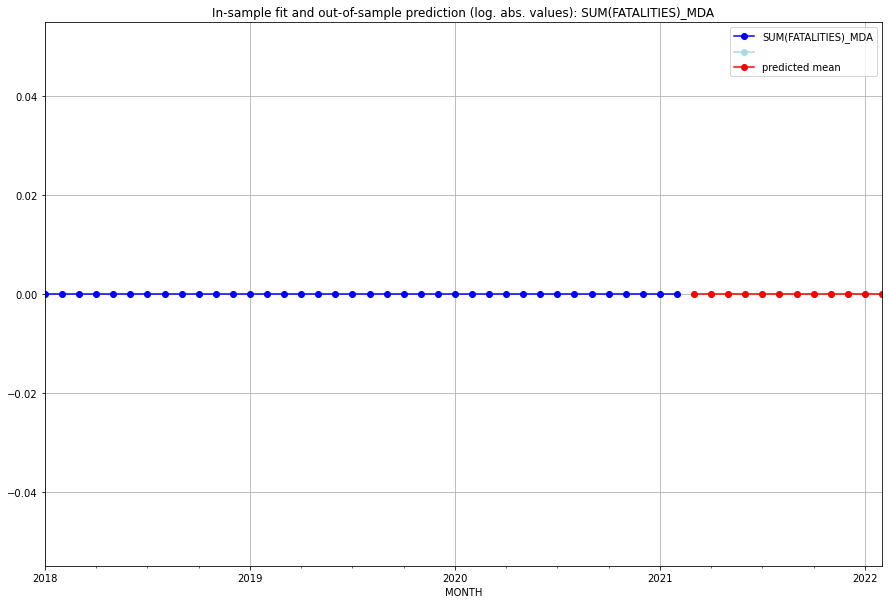

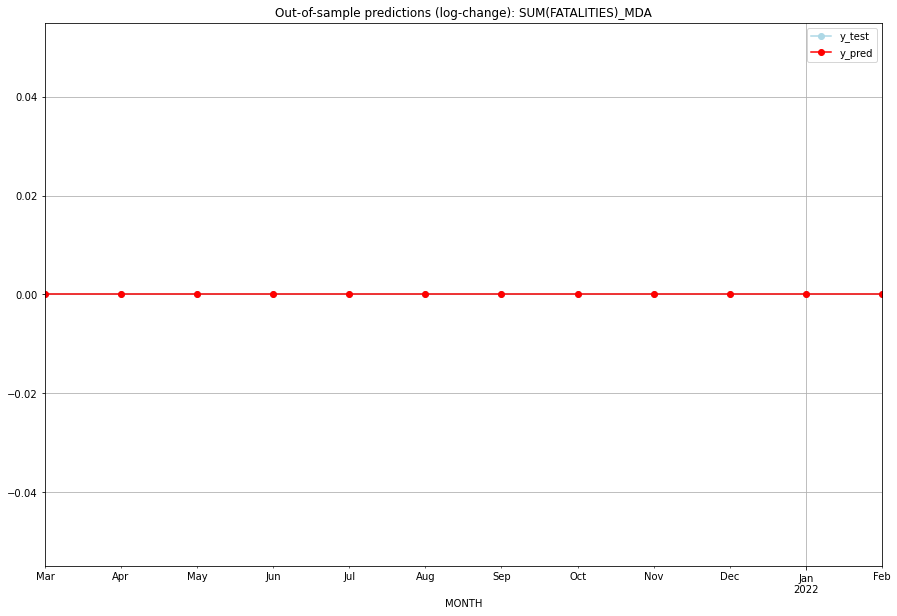

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

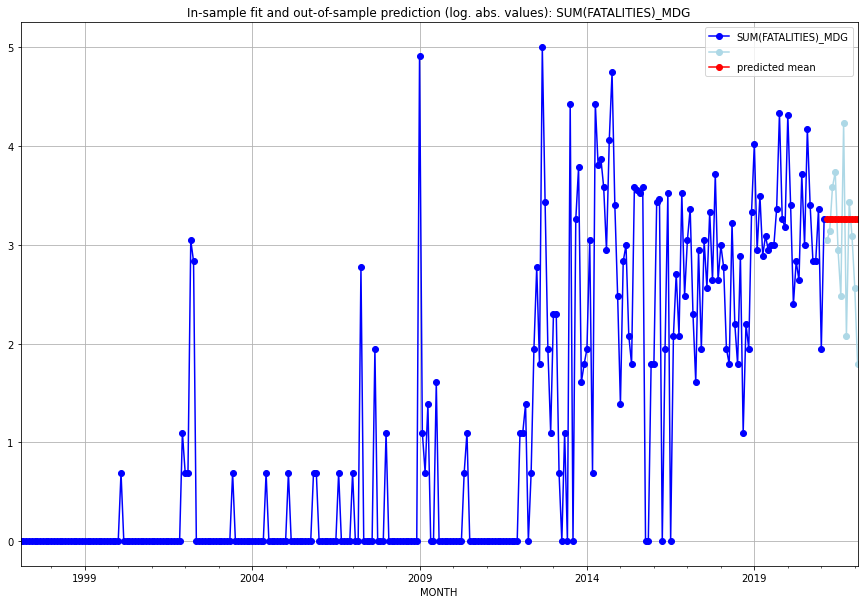

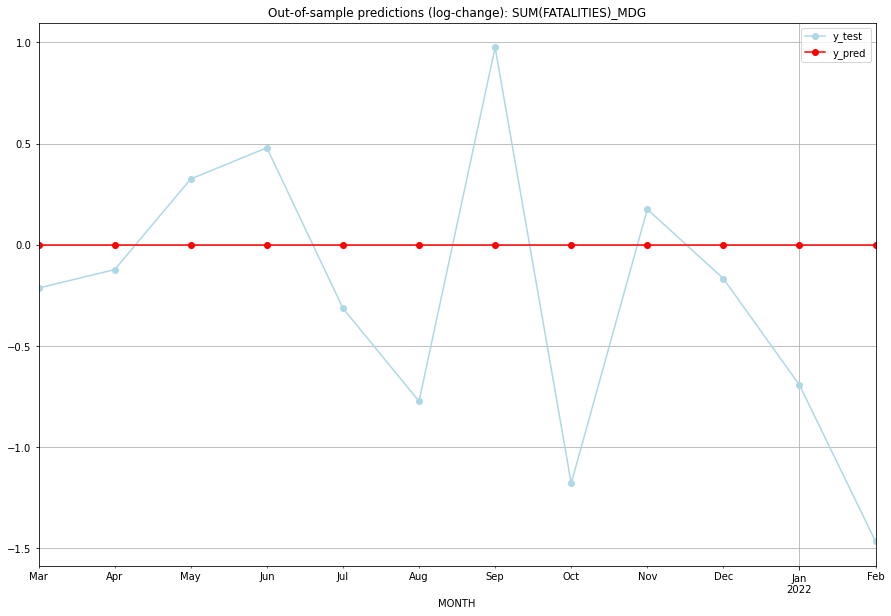

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  3.258097    3.044522           0.0       -0.213574
1   2021-04  3.258097    3.135494           0.0       -0.122602
2   2021-05  3.258097    3.583519           0.0        0.325422
3   2021-06  3.258097    3.737670           0.0        0.479573
4   2021-07  3.258097    2.944439           0.0       -0.313658
5   2021-08  3.258097    2.484907           0.0       -0.773190
6   2021-09  3.258097    4.234107           0.0        0.976010
7   2021-10  3.258097    2.079442           0.0       -1.178655
8   2021-11  3.258097    3.433987           0.0        0.175891
9   2021-12  3.258097    3.091042           0.0       -0.167054
10  2022-01  3.258097    2.564949           0.0       -0.693147
11  2022-02  3.258097    1.791759           0.0       -1.466337
TADDA: 0.5737594427977545
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  3.258097    3.044522           0.0

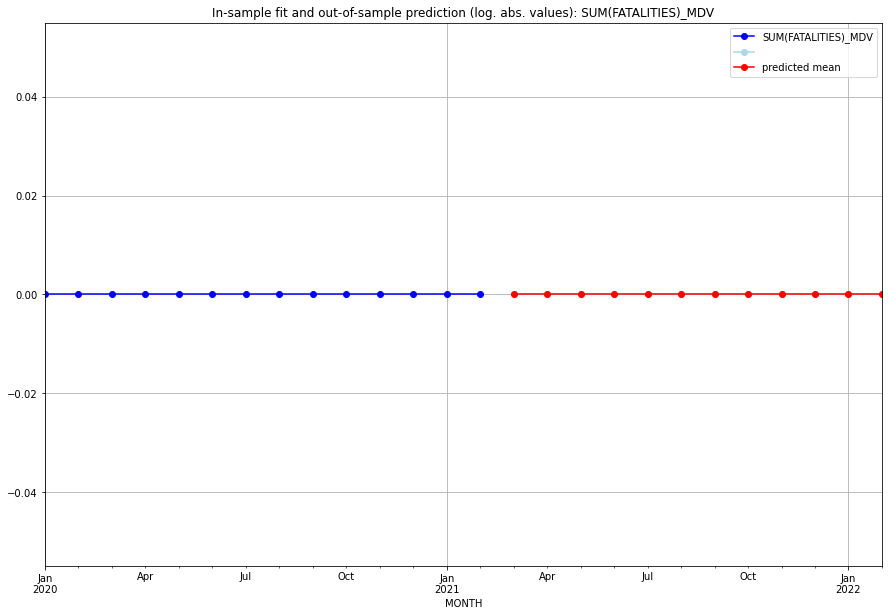

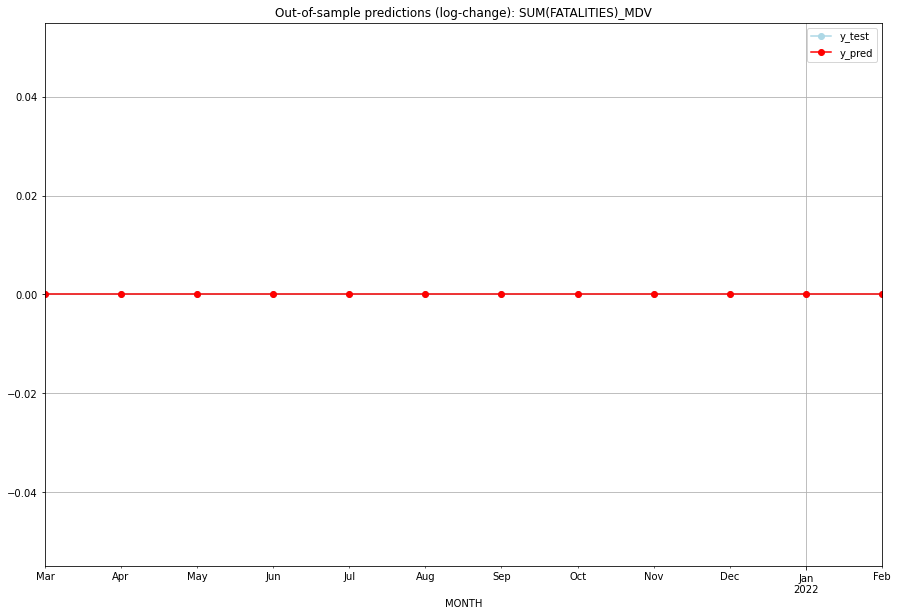

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

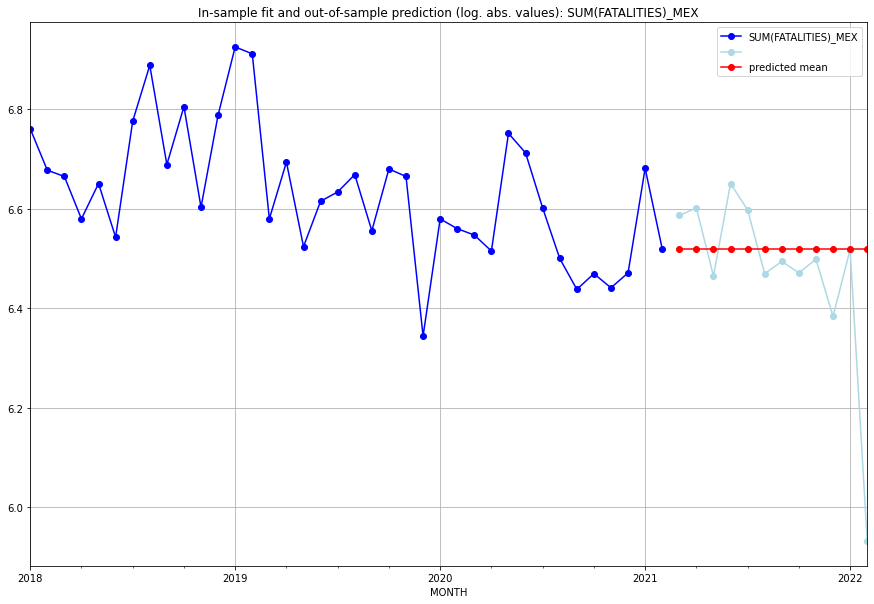

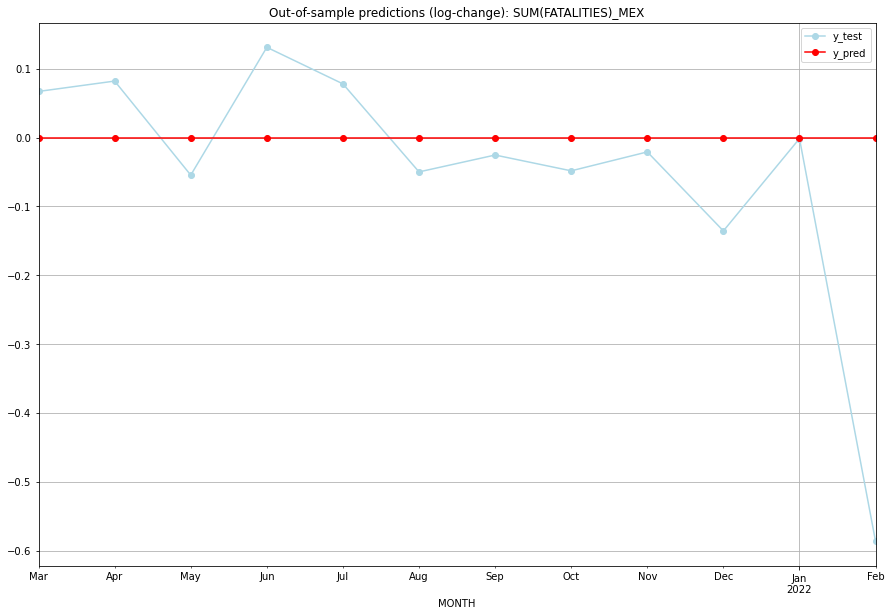

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  6.519147    6.586172           0.0        0.067024
1   2021-04  6.519147    6.601230           0.0        0.082083
2   2021-05  6.519147    6.464588           0.0       -0.054559
3   2021-06  6.519147    6.650279           0.0        0.131132
4   2021-07  6.519147    6.597146           0.0        0.077998
5   2021-08  6.519147    6.469250           0.0       -0.049897
6   2021-09  6.519147    6.493754           0.0       -0.025393
7   2021-10  6.519147    6.470800           0.0       -0.048348
8   2021-11  6.519147    6.498282           0.0       -0.020865
9   2021-12  6.519147    6.383507           0.0       -0.135641
10  2022-01  6.519147    6.517671           0.0       -0.001476
11  2022-02  6.519147    5.932245           0.0       -0.586902
TADDA: 0.10677653891487167
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  6.519147    6.586172           0.

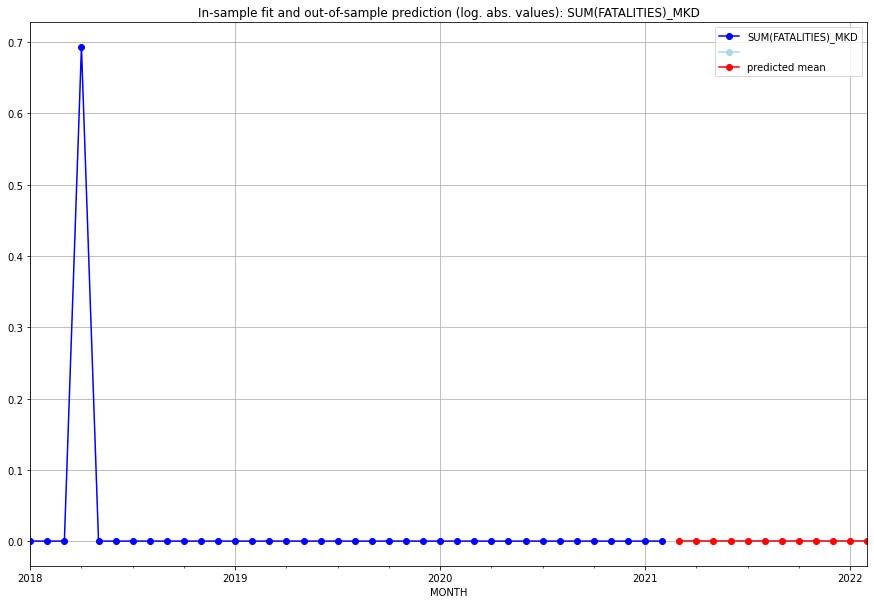

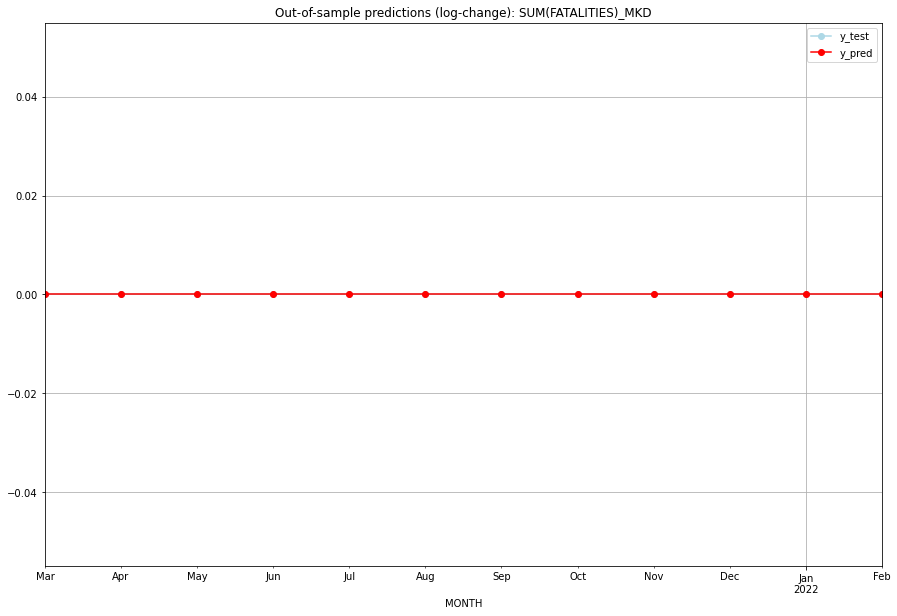

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

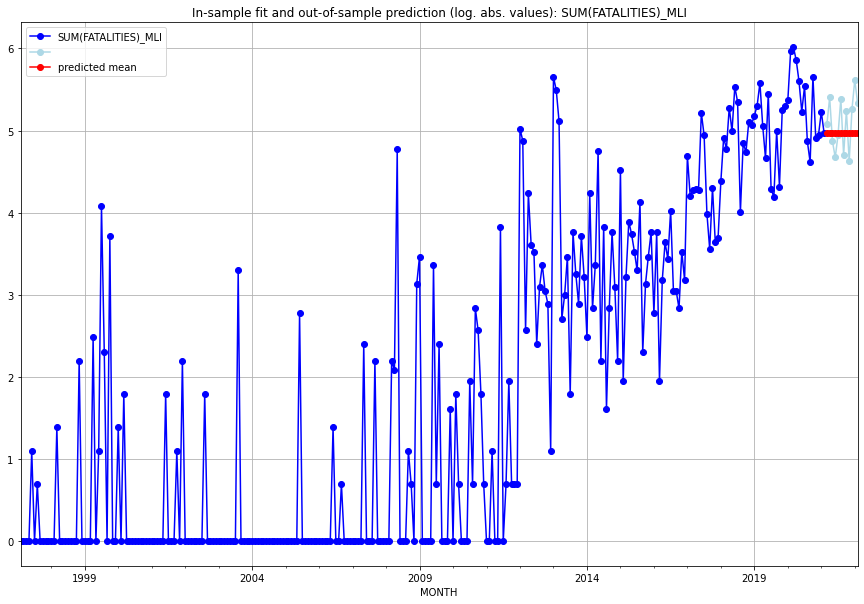

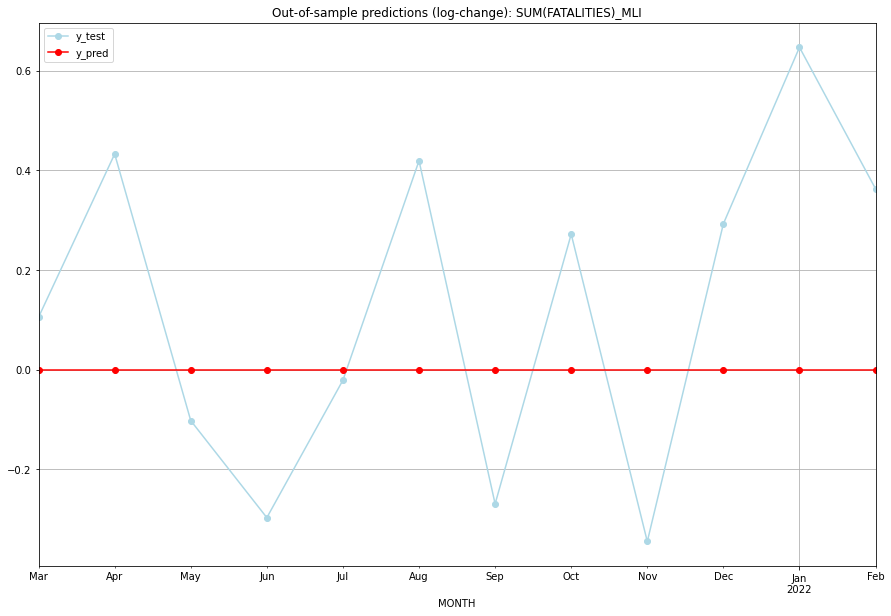

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  4.969813    5.075174           0.0        0.105361
1   2021-04  4.969813    5.402677           0.0        0.432864
2   2021-05  4.969813    4.867534           0.0       -0.102279
3   2021-06  4.969813    4.672829           0.0       -0.296984
4   2021-07  4.969813    4.948760           0.0       -0.021053
5   2021-08  4.969813    5.389072           0.0        0.419258
6   2021-09  4.969813    4.700480           0.0       -0.269333
7   2021-10  4.969813    5.241747           0.0        0.271934
8   2021-11  4.969813    4.624973           0.0       -0.344840
9   2021-12  4.969813    5.262690           0.0        0.292877
10  2022-01  4.969813    5.616771           0.0        0.646958
11  2022-02  4.969813    5.332719           0.0        0.362905
TADDA: 0.2972205890245609
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  4.969813    5.075174           0.0

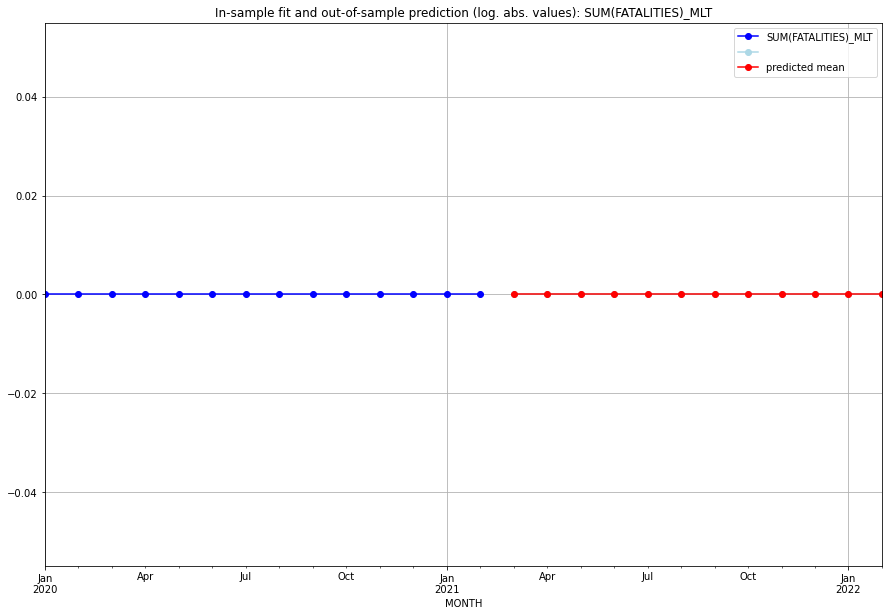

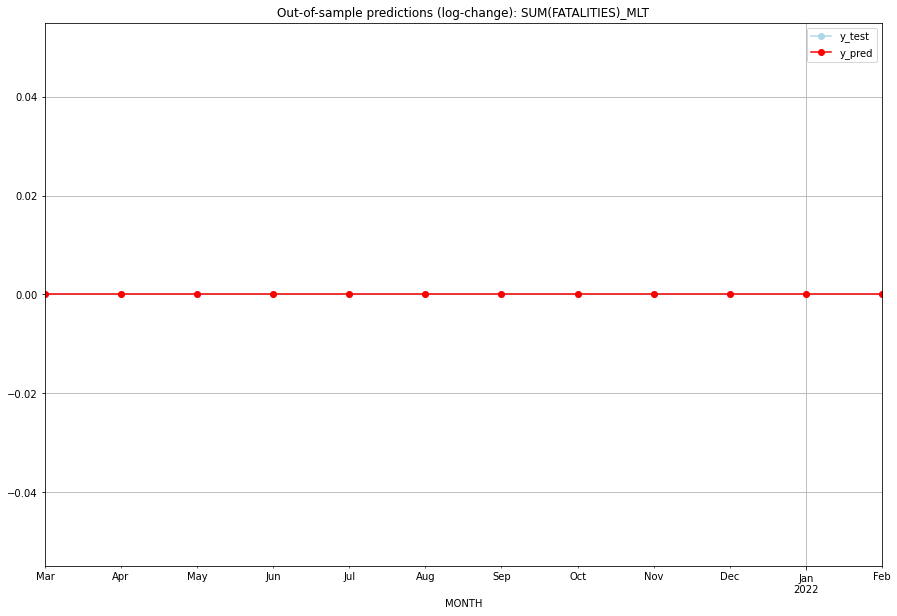

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

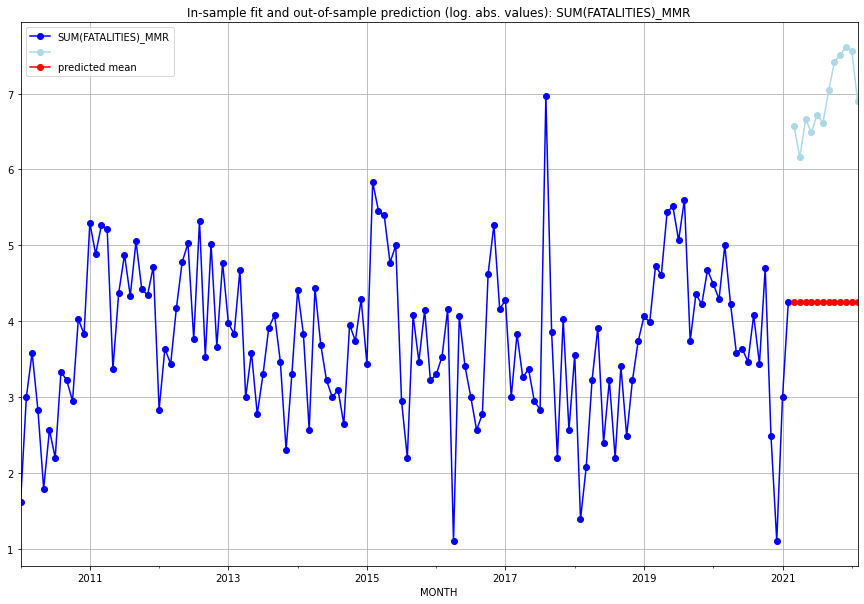

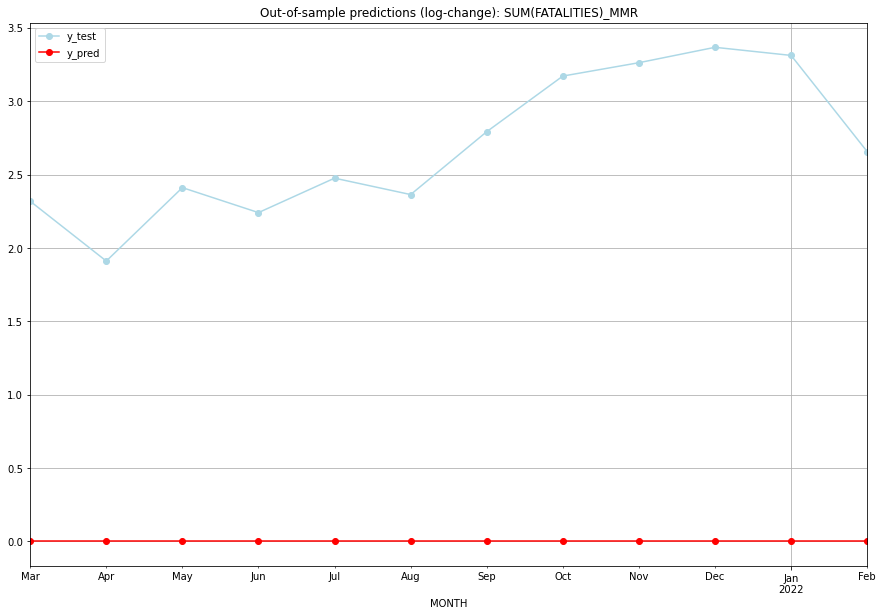

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  4.248495    6.566672           0.0        2.318177
1   2021-04  4.248495    6.159095           0.0        1.910600
2   2021-05  4.248495    6.659294           0.0        2.410799
3   2021-06  4.248495    6.489205           0.0        2.240710
4   2021-07  4.248495    6.723832           0.0        2.475337
5   2021-08  4.248495    6.612041           0.0        2.363546
6   2021-09  4.248495    7.040536           0.0        2.792041
7   2021-10  4.248495    7.419381           0.0        3.170885
8   2021-11  4.248495    7.510431           0.0        3.261935
9   2021-12  4.248495    7.615298           0.0        3.366803
10  2022-01  4.248495    7.560080           0.0        3.311585
11  2022-02  4.248495    6.904751           0.0        2.656256
TADDA: 2.6898895287240205
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  4.248495    6.566672           0.0

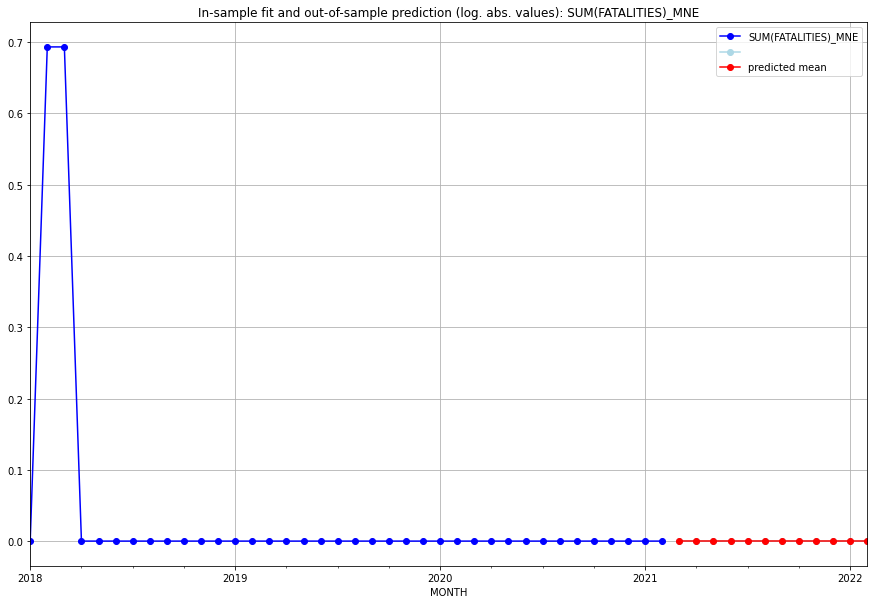

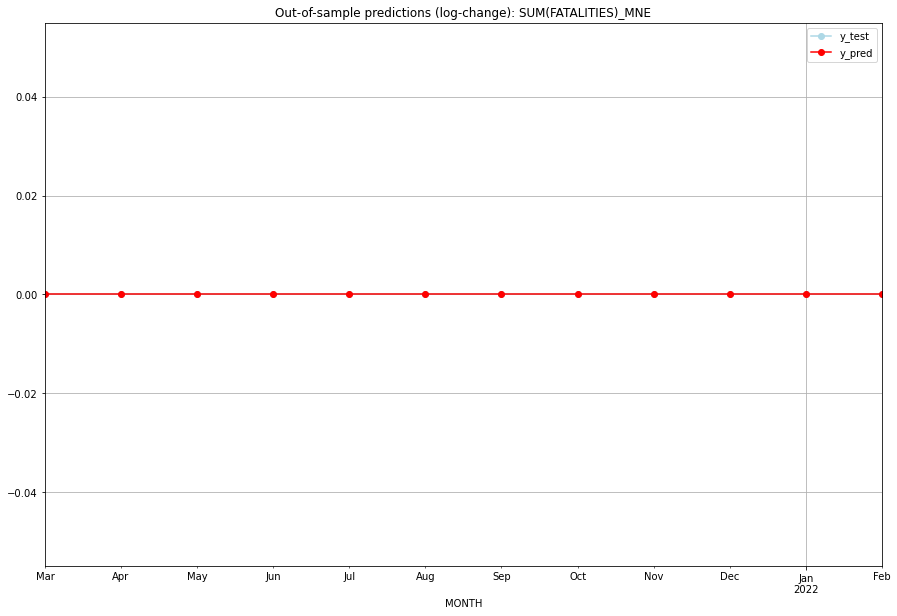

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

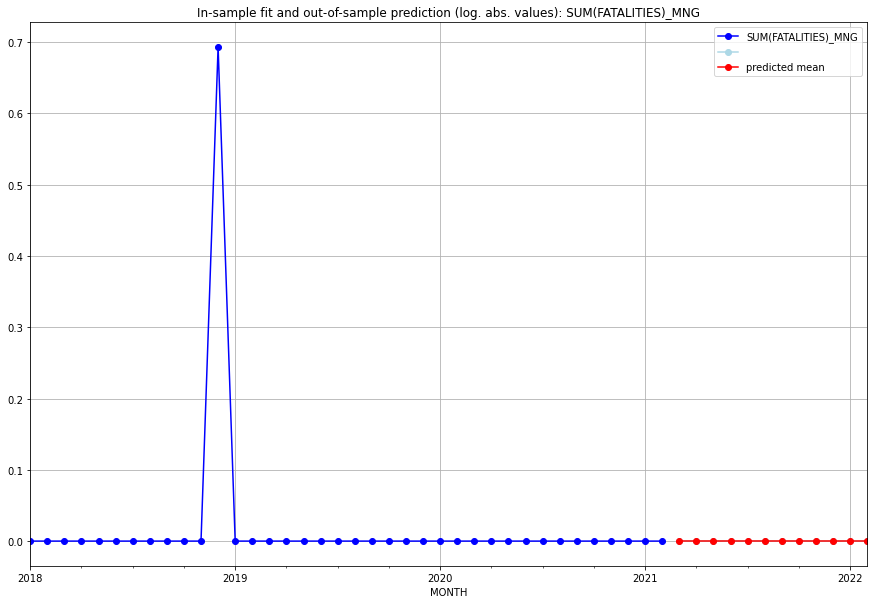

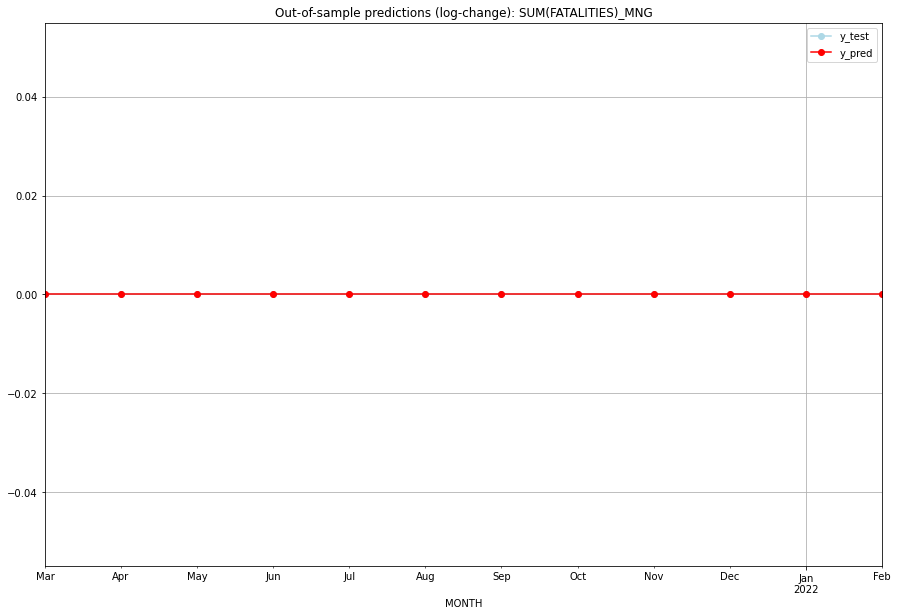

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

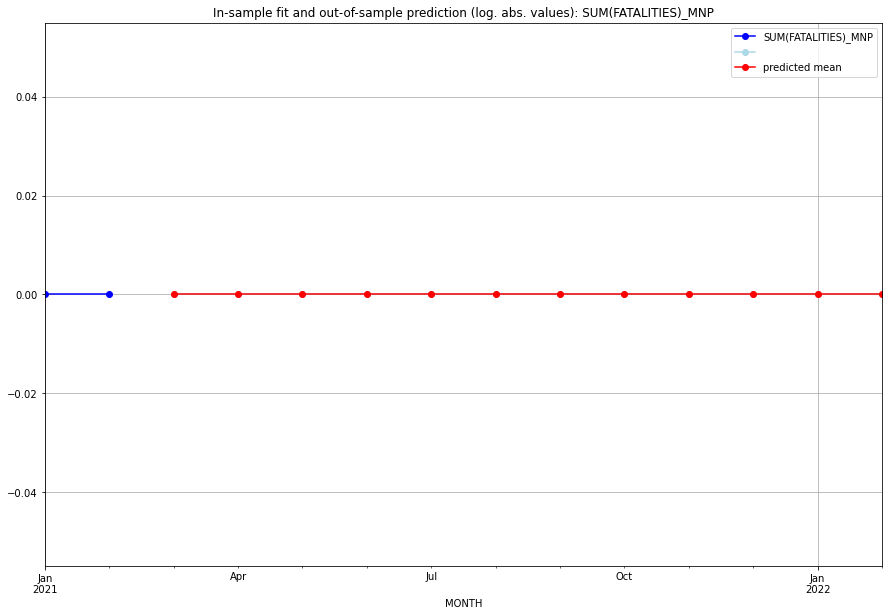

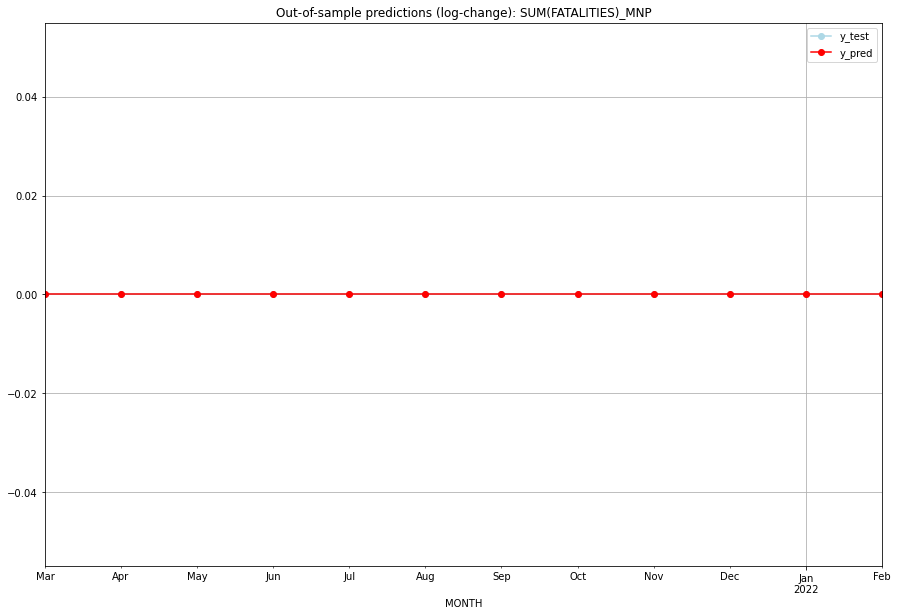

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

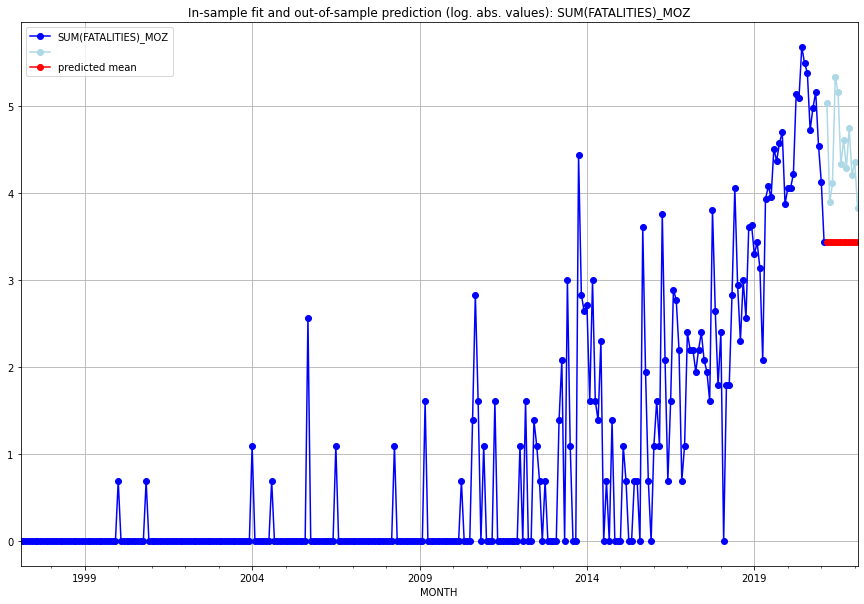

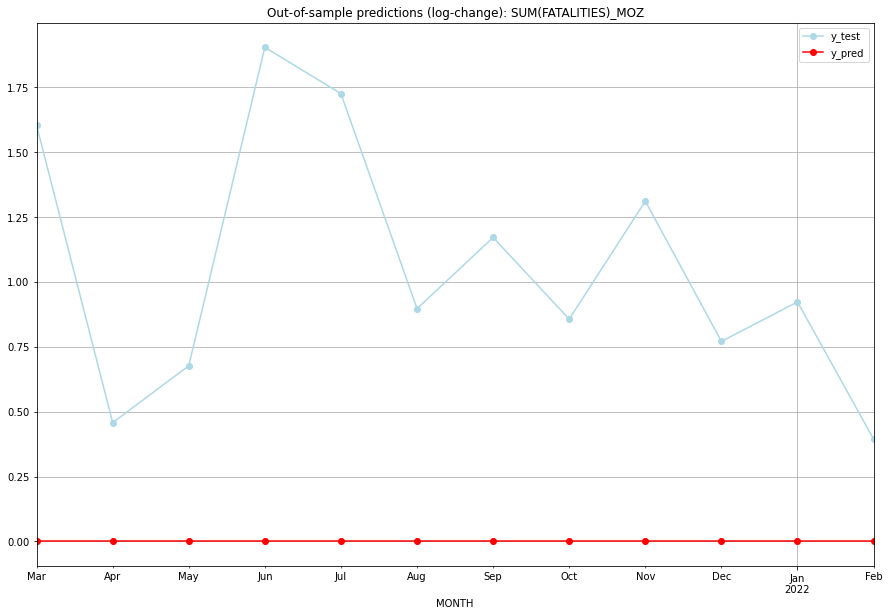

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  3.433987    5.036953           0.0        1.602965
1   2021-04  3.433987    3.891820           0.0        0.457833
2   2021-05  3.433987    4.110874           0.0        0.676887
3   2021-06  3.433987    5.337538           0.0        1.903551
4   2021-07  3.433987    5.159055           0.0        1.725068
5   2021-08  3.433987    4.330733           0.0        0.896746
6   2021-09  3.433987    4.605170           0.0        1.171183
7   2021-10  3.433987    4.290459           0.0        0.856472
8   2021-11  3.433987    4.744932           0.0        1.310945
9   2021-12  3.433987    4.204693           0.0        0.770705
10  2022-01  3.433987    4.356709           0.0        0.922722
11  2022-02  3.433987    3.828641           0.0        0.394654
TADDA: 1.057477635678948
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  3.433987    5.036953           0.0 

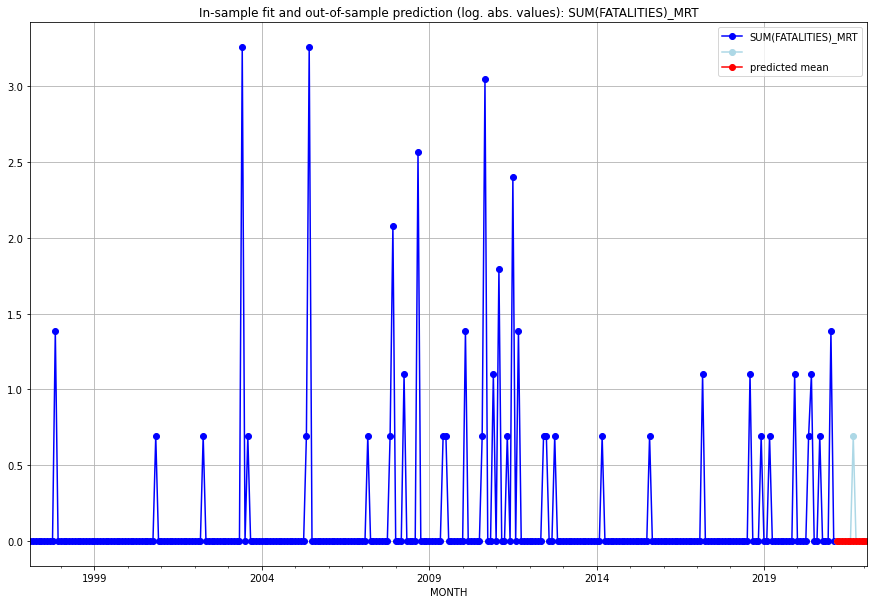

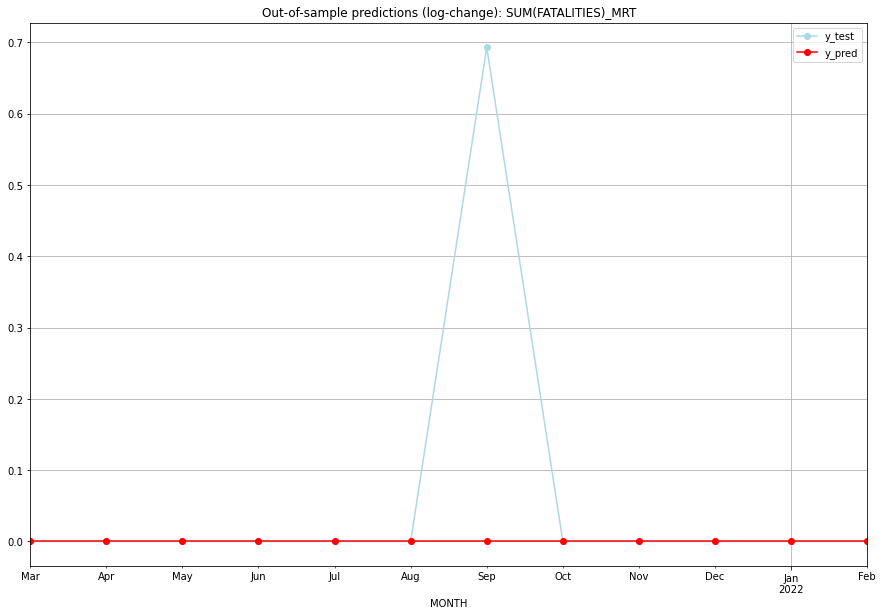

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.693147           0.0        0.693147
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

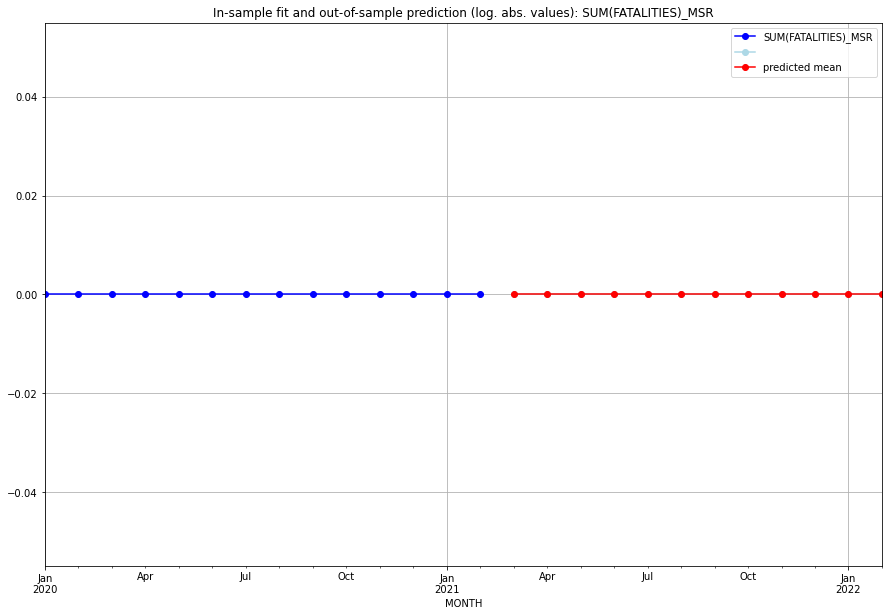

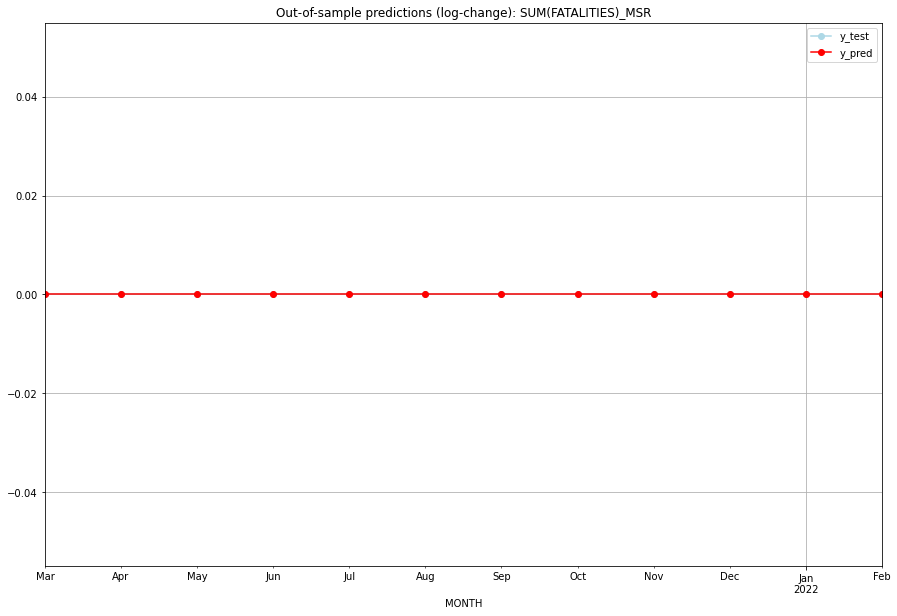

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

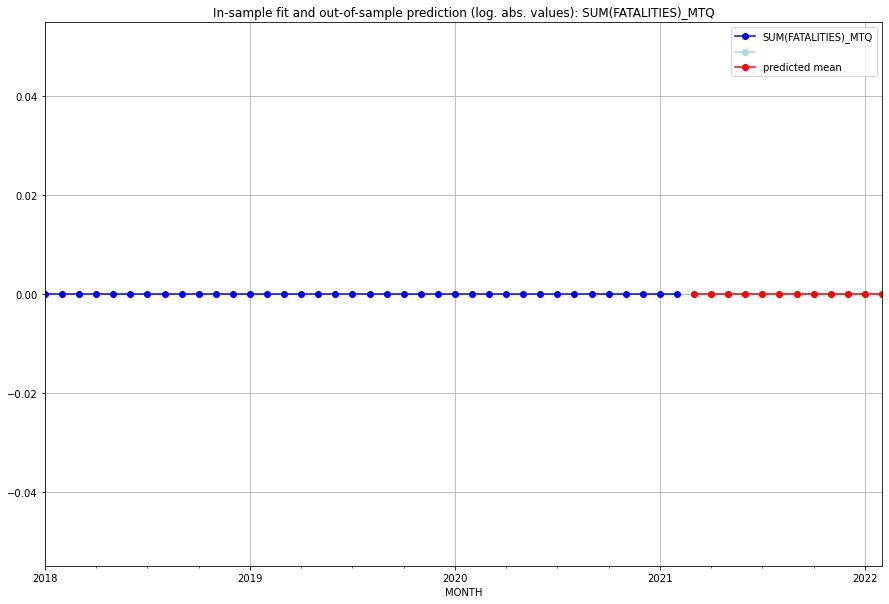

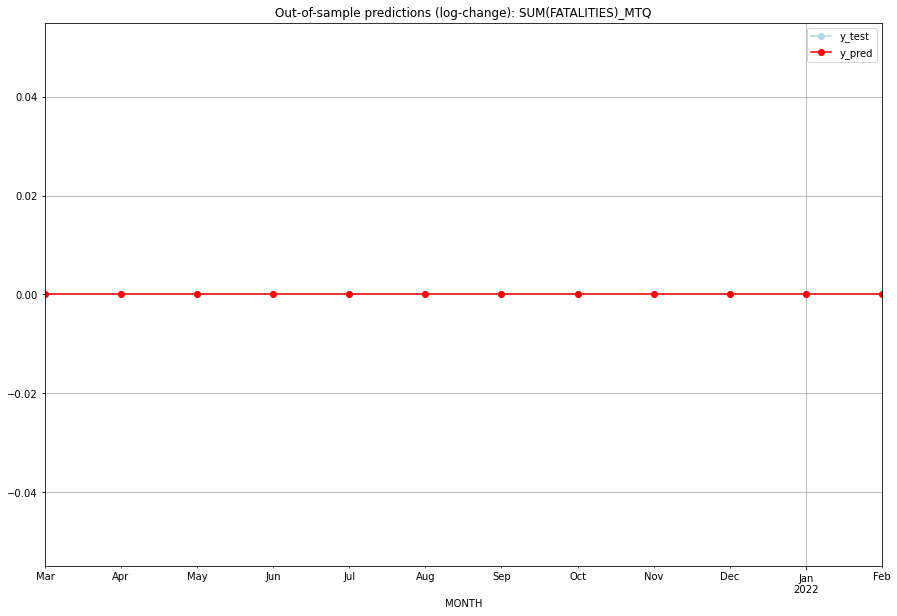

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

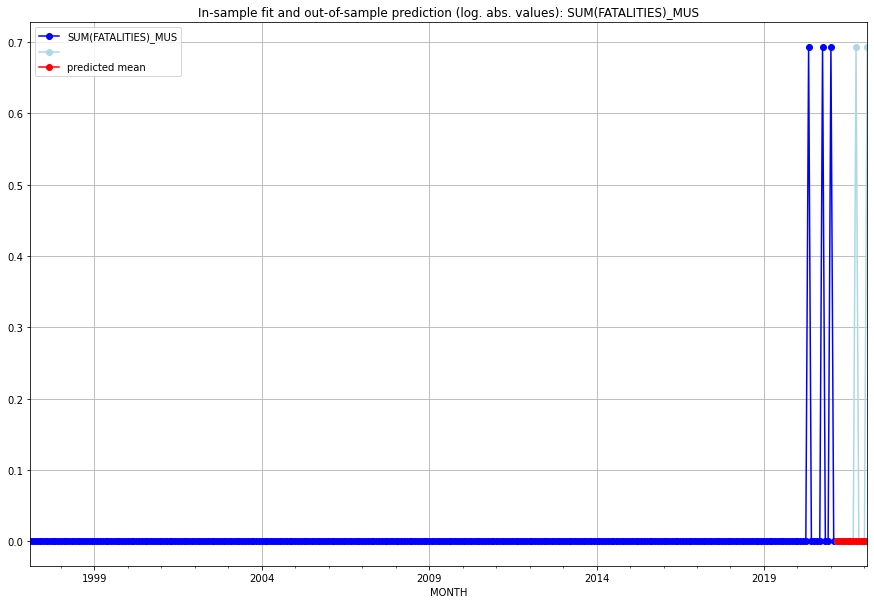

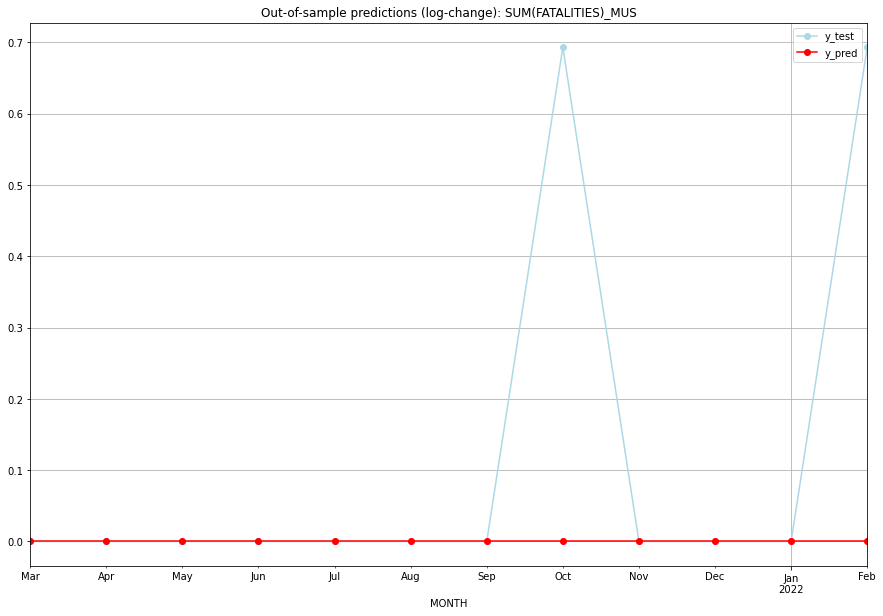

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.693147           0.0        0.693147
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.693147           0.0        0.693147
TADDA: 0.11552453009332421
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

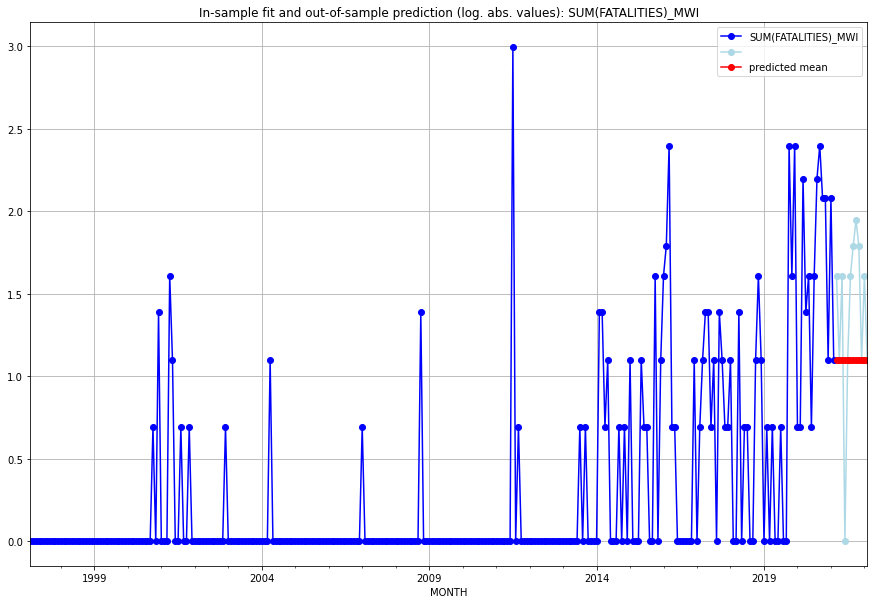

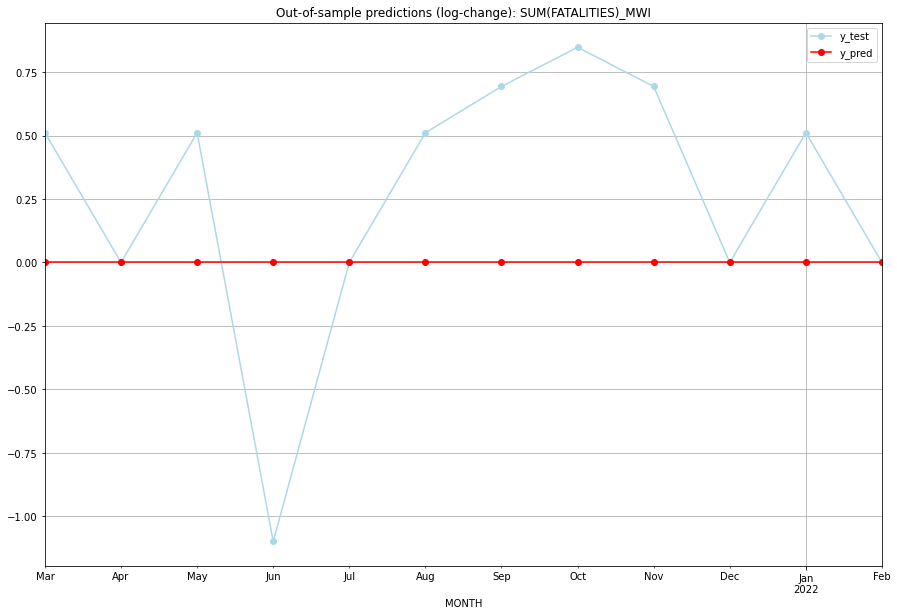

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.098612    1.609438           0.0        0.510826
1   2021-04  1.098612    1.098612           0.0        0.000000
2   2021-05  1.098612    1.609438           0.0        0.510826
3   2021-06  1.098612    0.000000           0.0       -1.098612
4   2021-07  1.098612    1.098612           0.0        0.000000
5   2021-08  1.098612    1.609438           0.0        0.510826
6   2021-09  1.098612    1.791759           0.0        0.693147
7   2021-10  1.098612    1.945910           0.0        0.847298
8   2021-11  1.098612    1.791759           0.0        0.693147
9   2021-12  1.098612    1.098612           0.0        0.000000
10  2022-01  1.098612    1.609438           0.0        0.510826
11  2022-02  1.098612    1.098612           0.0        0.000000
TADDA: 0.44795891710326385
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.098612    1.609438           0.

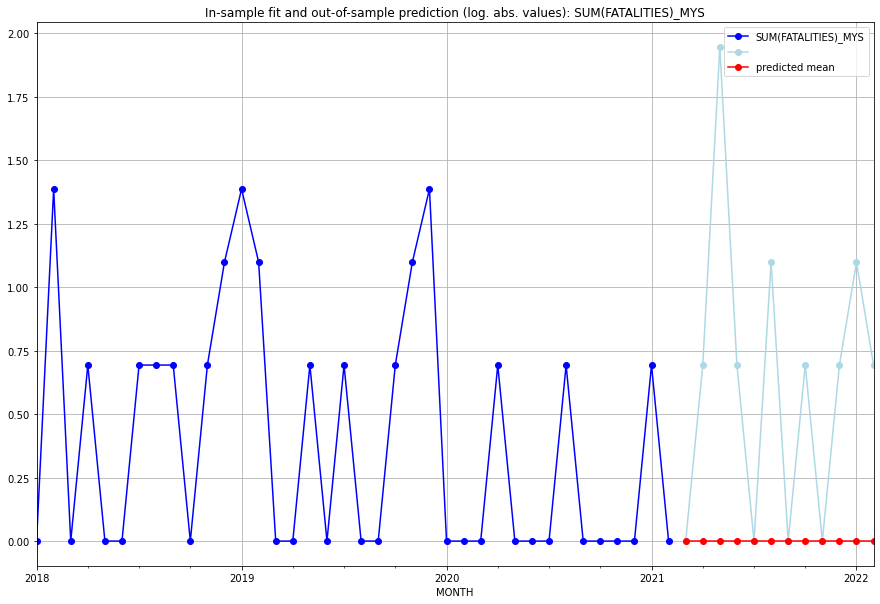

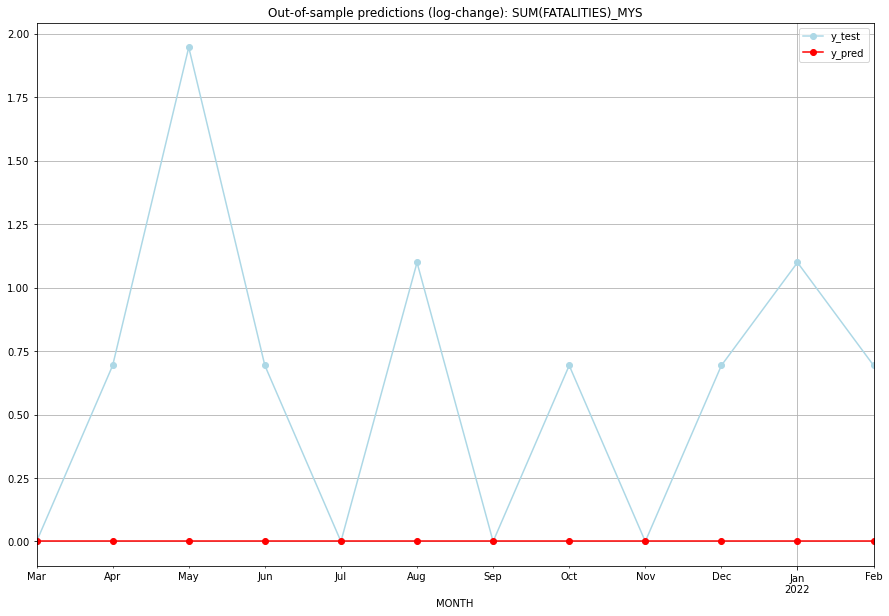

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.693147           0.0        0.693147
2   2021-05       0.0    1.945910           0.0        1.945910
3   2021-06       0.0    0.693147           0.0        0.693147
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    1.098612           0.0        1.098612
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.693147           0.0        0.693147
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.693147           0.0        0.693147
10  2022-01       0.0    1.098612           0.0        1.098612
11  2022-02       0.0    0.693147           0.0        0.693147
TADDA: 0.634072552432605
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0 

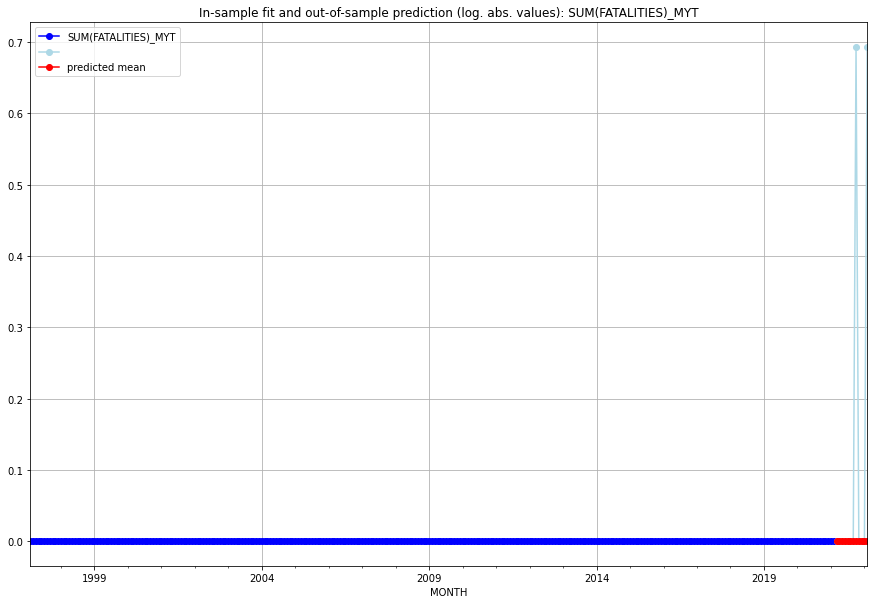

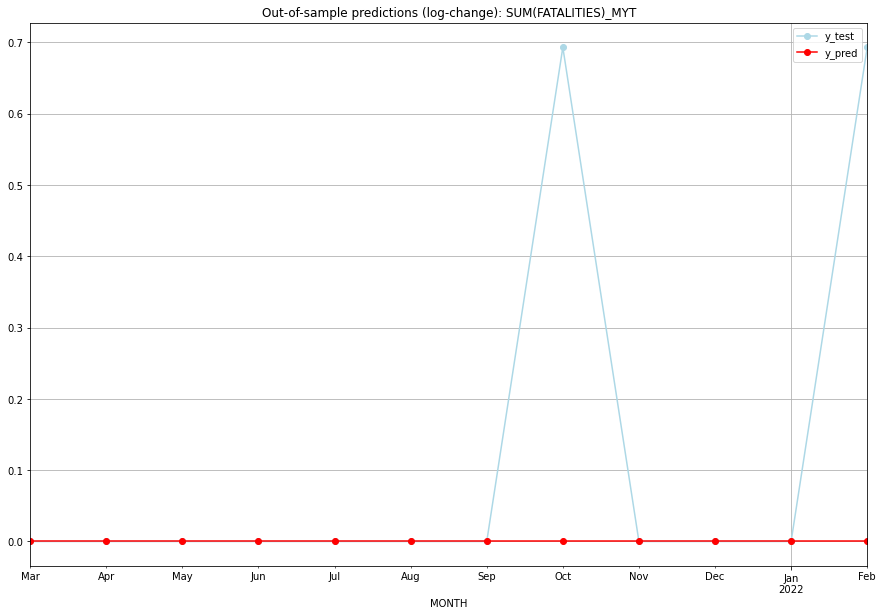

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.693147           0.0        0.693147
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.693147           0.0        0.693147
TADDA: 0.11552453009332421
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

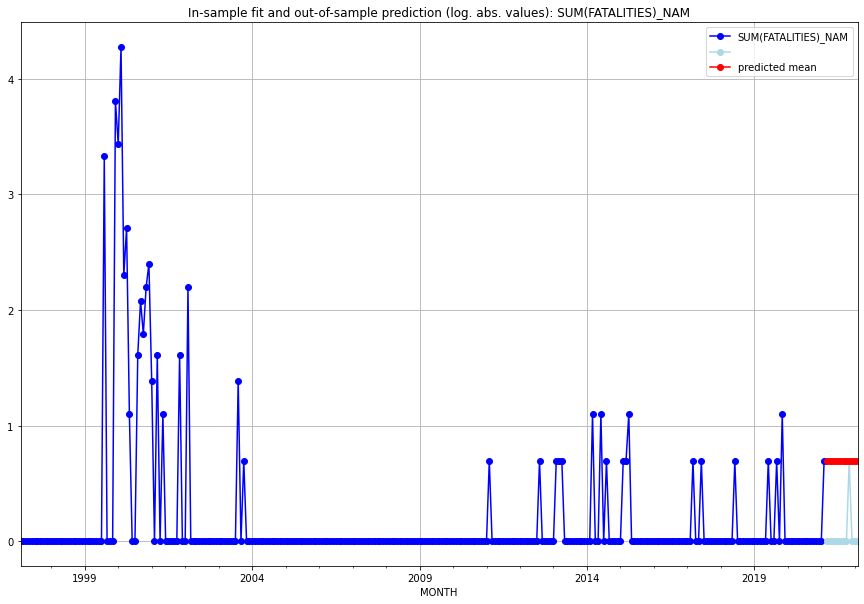

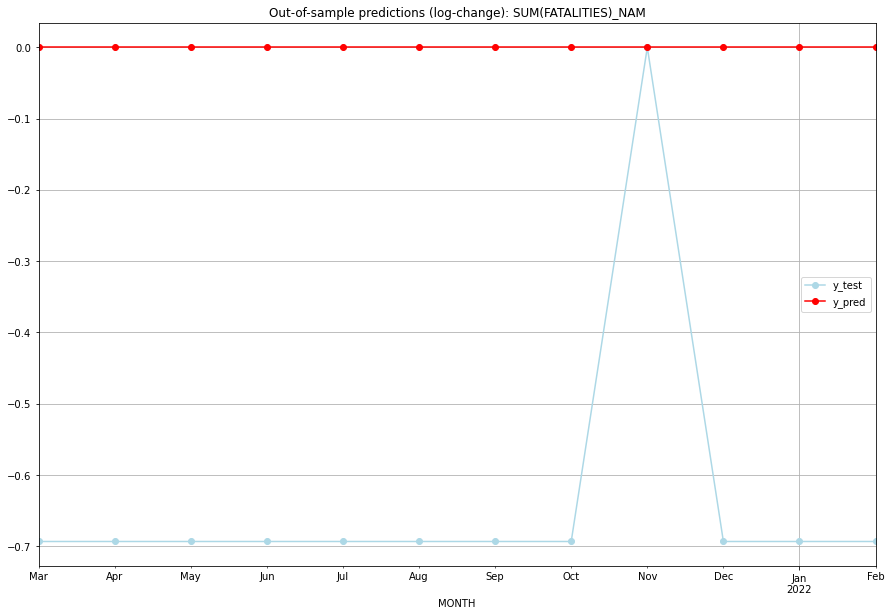

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  0.693147    0.000000           0.0       -0.693147
1   2021-04  0.693147    0.000000           0.0       -0.693147
2   2021-05  0.693147    0.000000           0.0       -0.693147
3   2021-06  0.693147    0.000000           0.0       -0.693147
4   2021-07  0.693147    0.000000           0.0       -0.693147
5   2021-08  0.693147    0.000000           0.0       -0.693147
6   2021-09  0.693147    0.000000           0.0       -0.693147
7   2021-10  0.693147    0.000000           0.0       -0.693147
8   2021-11  0.693147    0.693147           0.0        0.000000
9   2021-12  0.693147    0.000000           0.0       -0.693147
10  2022-01  0.693147    0.000000           0.0       -0.693147
11  2022-02  0.693147    0.000000           0.0       -0.693147
TADDA: 0.6353849155132832
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  0.693147    0.000000           0.0

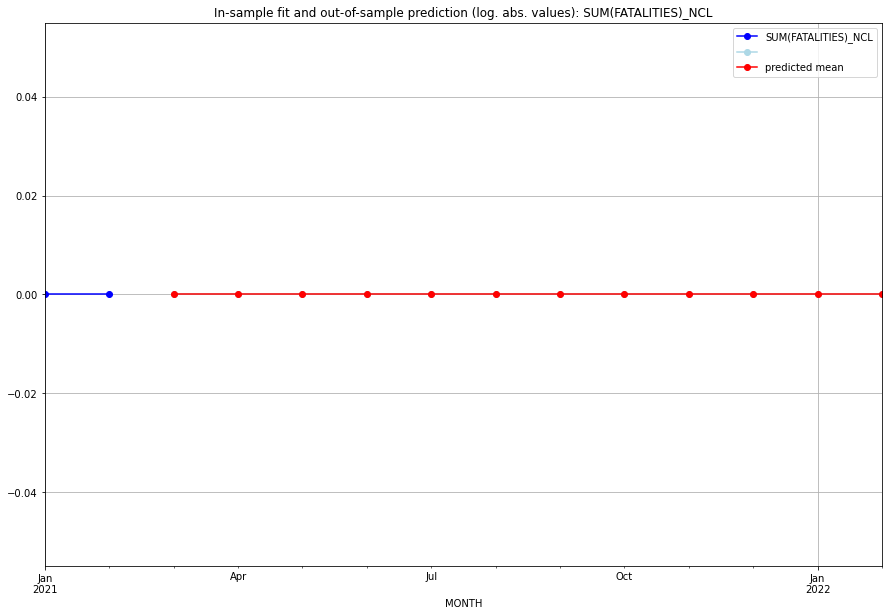

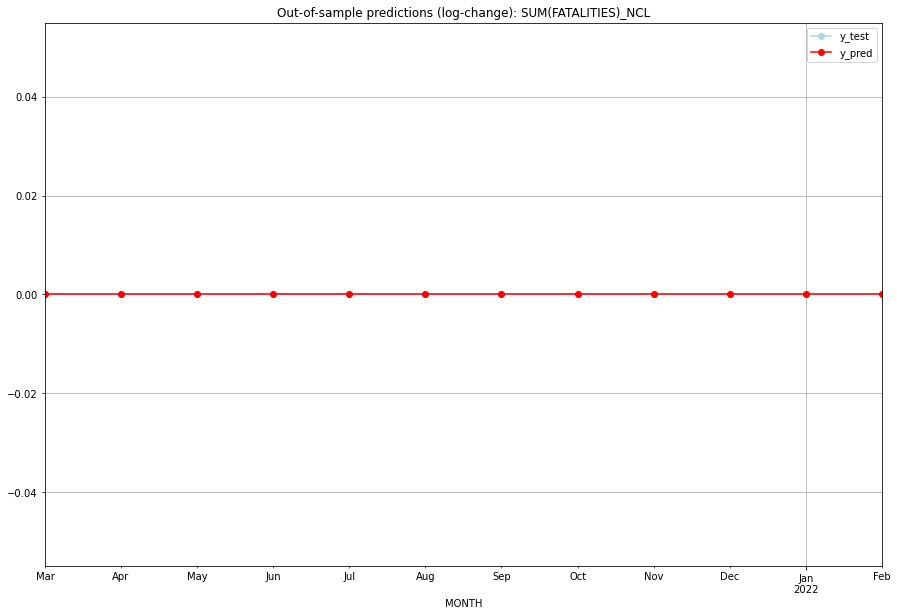

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

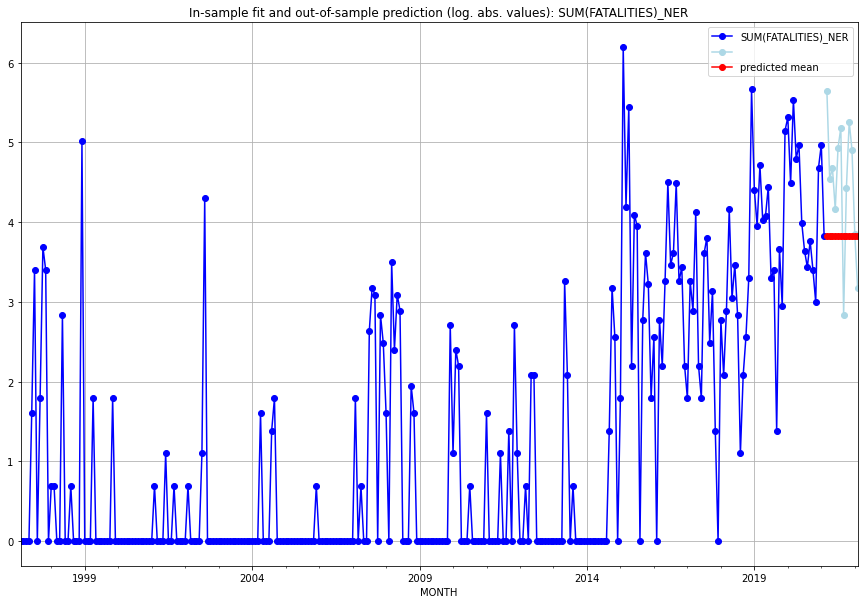

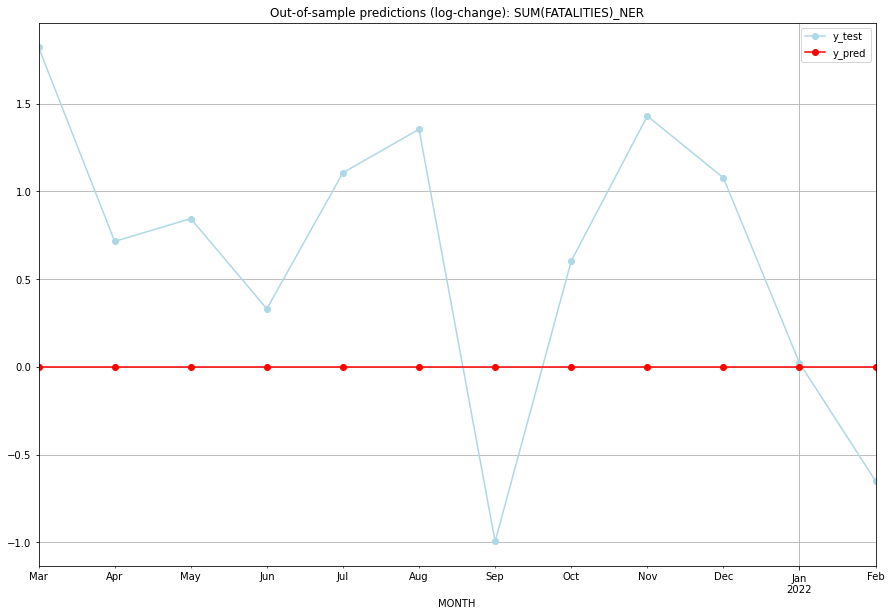

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  3.828641    5.648974           0.0        1.820333
1   2021-04  3.828641    4.543295           0.0        0.714653
2   2021-05  3.828641    4.672829           0.0        0.844187
3   2021-06  3.828641    4.158883           0.0        0.330242
4   2021-07  3.828641    4.934474           0.0        1.105833
5   2021-08  3.828641    5.181784           0.0        1.353142
6   2021-09  3.828641    2.833213           0.0       -0.995428
7   2021-10  3.828641    4.430817           0.0        0.602175
8   2021-11  3.828641    5.257495           0.0        1.428854
9   2021-12  3.828641    4.905275           0.0        1.076633
10  2022-01  3.828641    3.850148           0.0        0.021506
11  2022-02  3.828641    3.178054           0.0       -0.650588
TADDA: 0.9119645521981856
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  3.828641    5.648974           0.0

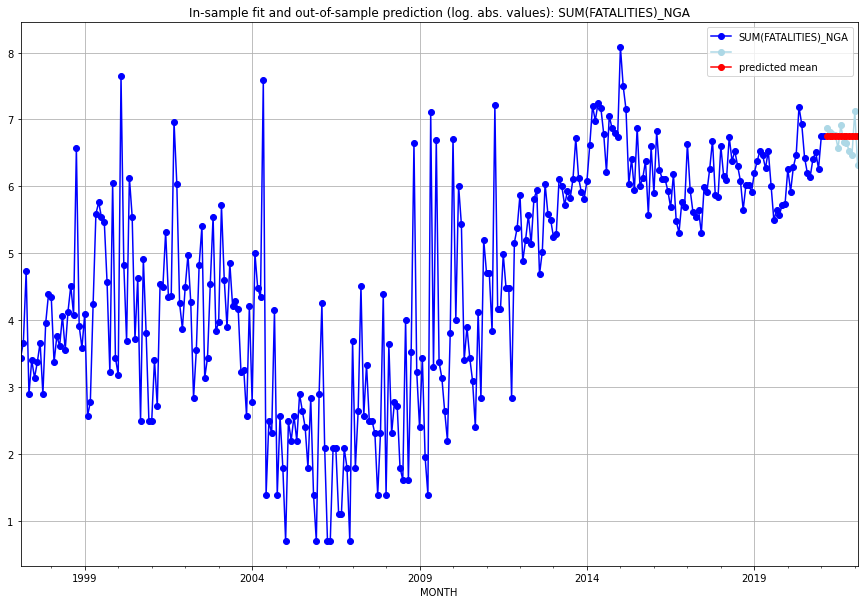

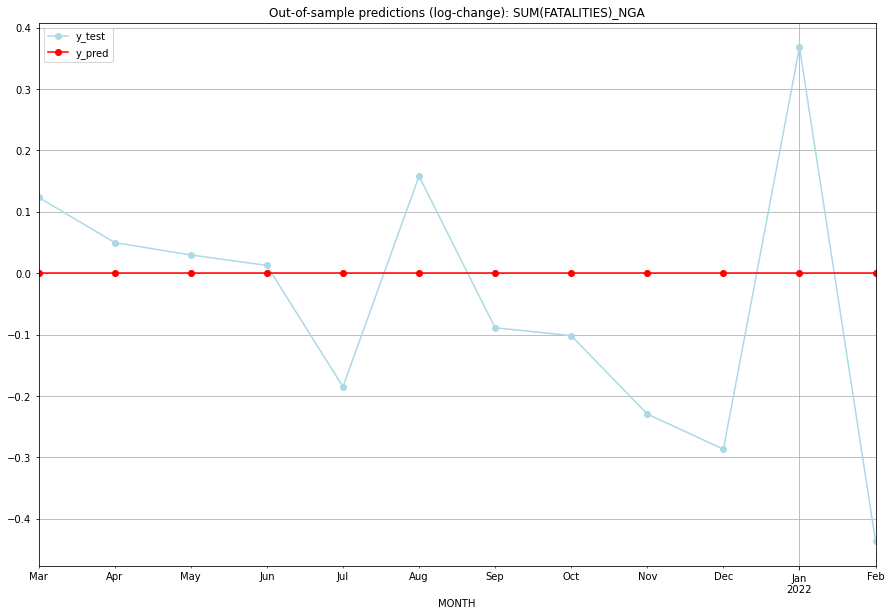

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  6.755769    6.879356           0.0        0.123587
1   2021-04  6.755769    6.805723           0.0        0.049954
2   2021-05  6.755769    6.785588           0.0        0.029819
3   2021-06  6.755769    6.768493           0.0        0.012724
4   2021-07  6.755769    6.570883           0.0       -0.184886
5   2021-08  6.755769    6.913737           0.0        0.157968
6   2021-09  6.755769    6.666957           0.0       -0.088812
7   2021-10  6.755769    6.654153           0.0       -0.101616
8   2021-11  6.755769    6.526495           0.0       -0.229274
9   2021-12  6.755769    6.469250           0.0       -0.286519
10  2022-01  6.755769    7.123673           0.0        0.367904
11  2022-02  6.755769    6.318968           0.0       -0.436801
TADDA: 0.17248864877777237
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  6.755769    6.879356           0.

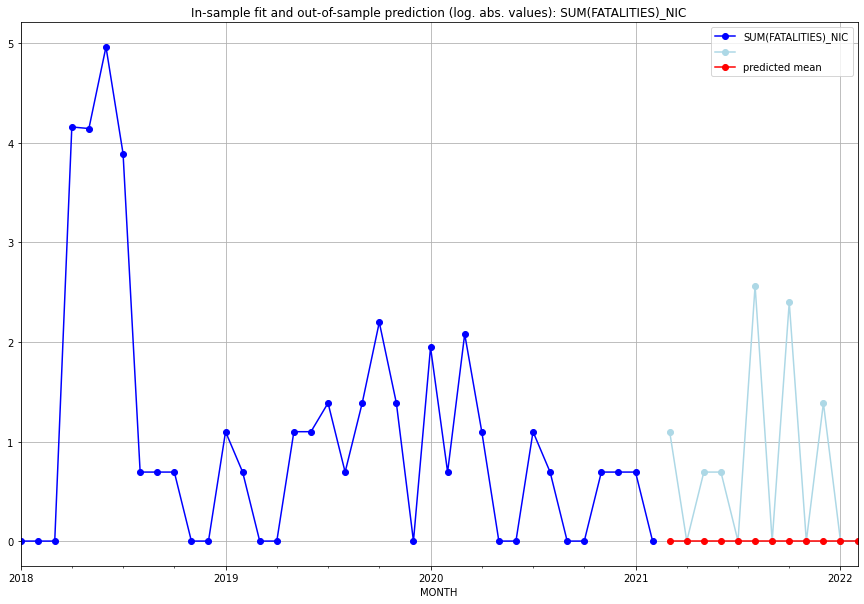

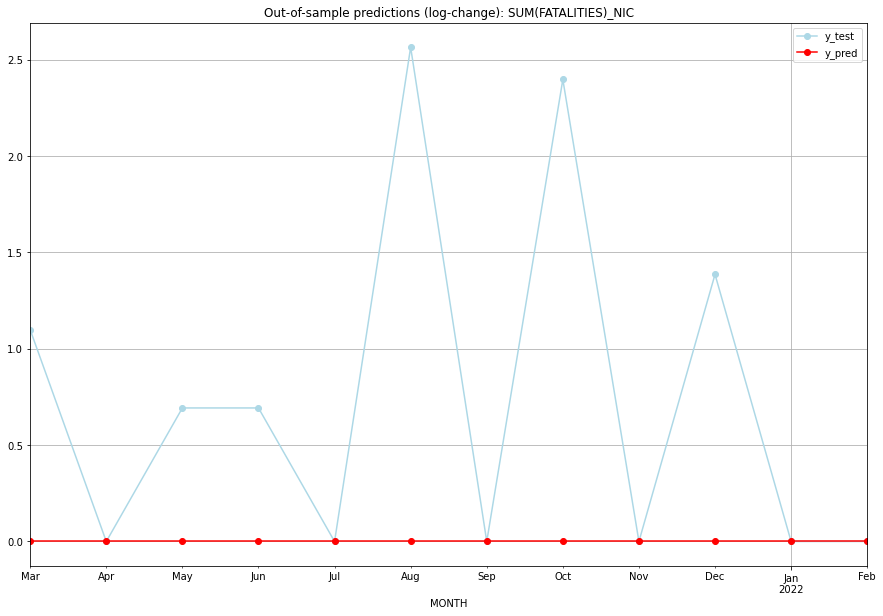

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    1.098612           0.0        1.098612
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.693147           0.0        0.693147
3   2021-06       0.0    0.693147           0.0        0.693147
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    2.564949           0.0        2.564949
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    2.397895           0.0        2.397895
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    1.386294           0.0        1.386294
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.7361704700973165
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    1.098612           0.0

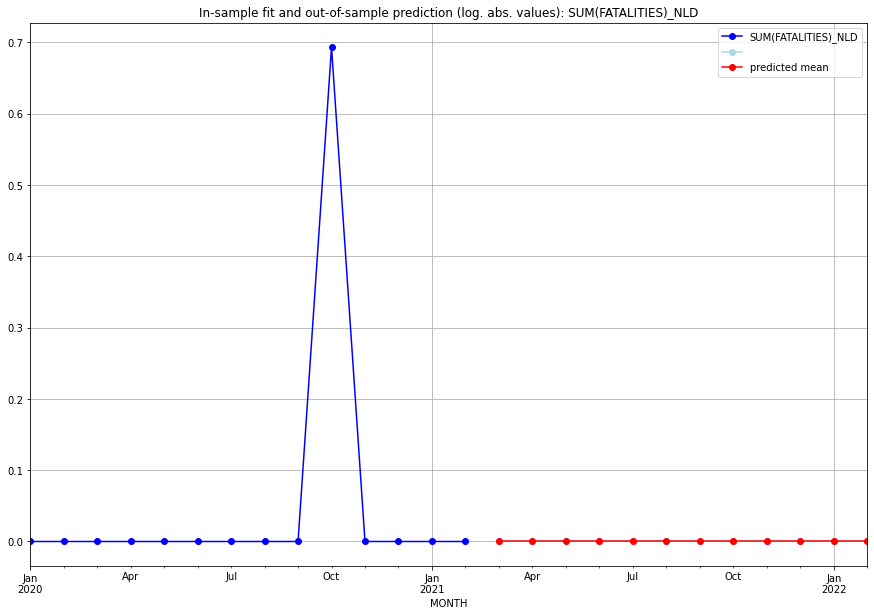

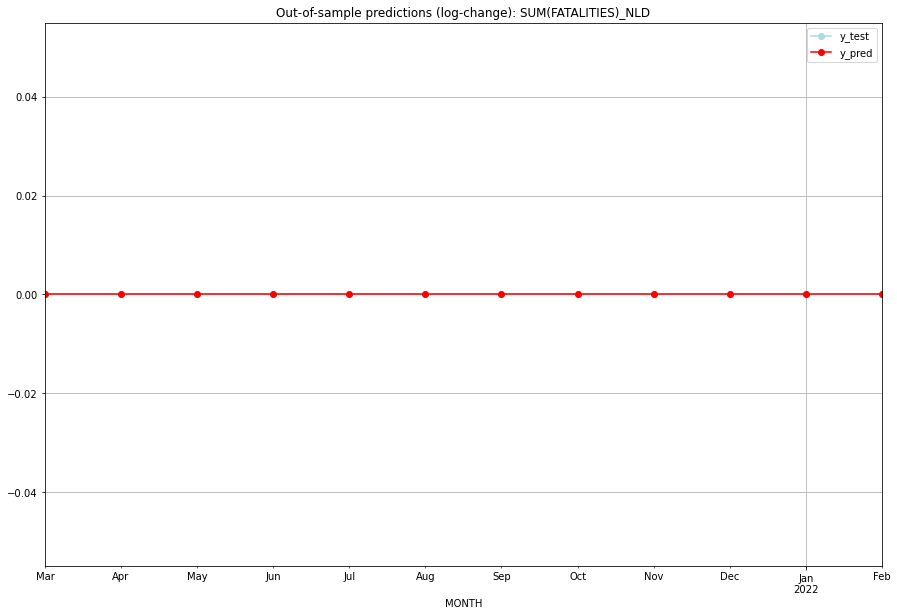

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

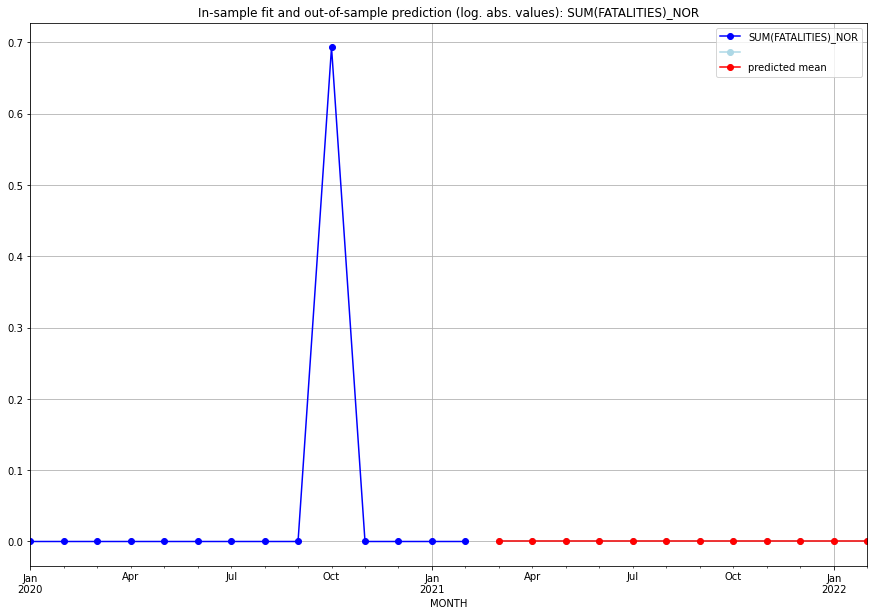

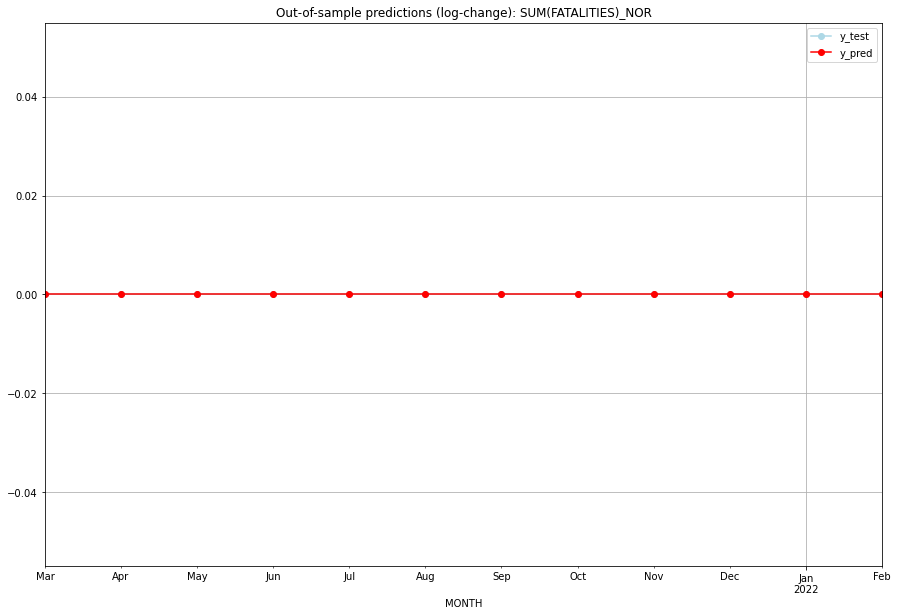

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

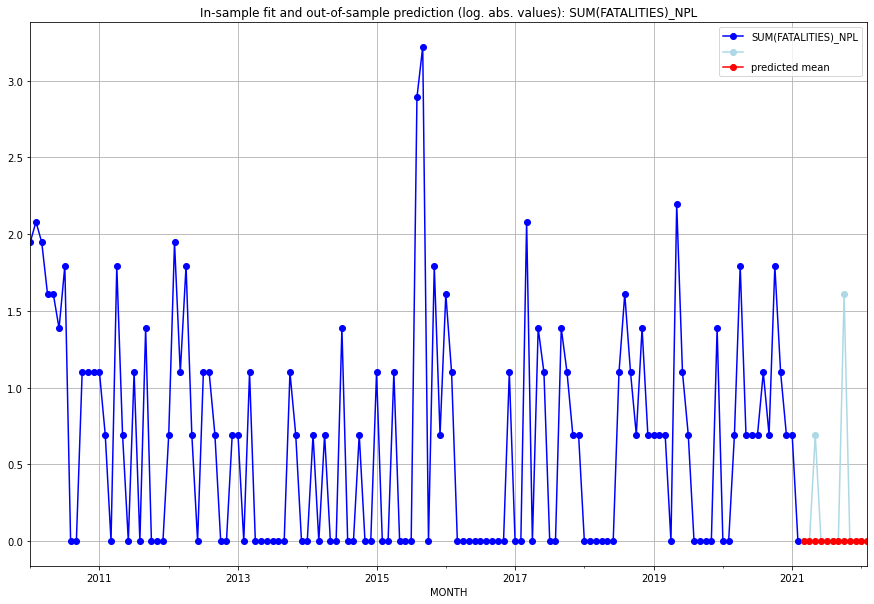

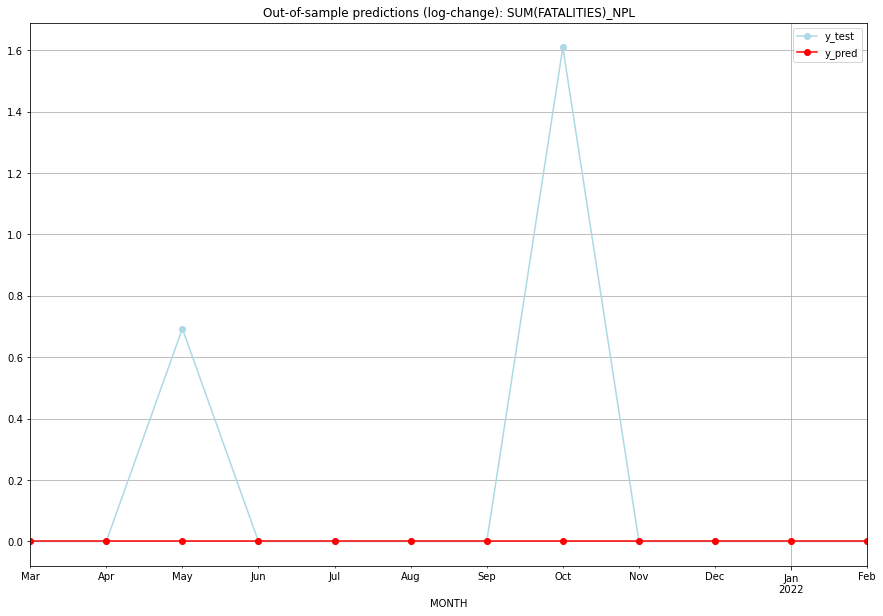

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.693147           0.0        0.693147
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    1.609438           0.0        1.609438
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.19188209108283716
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

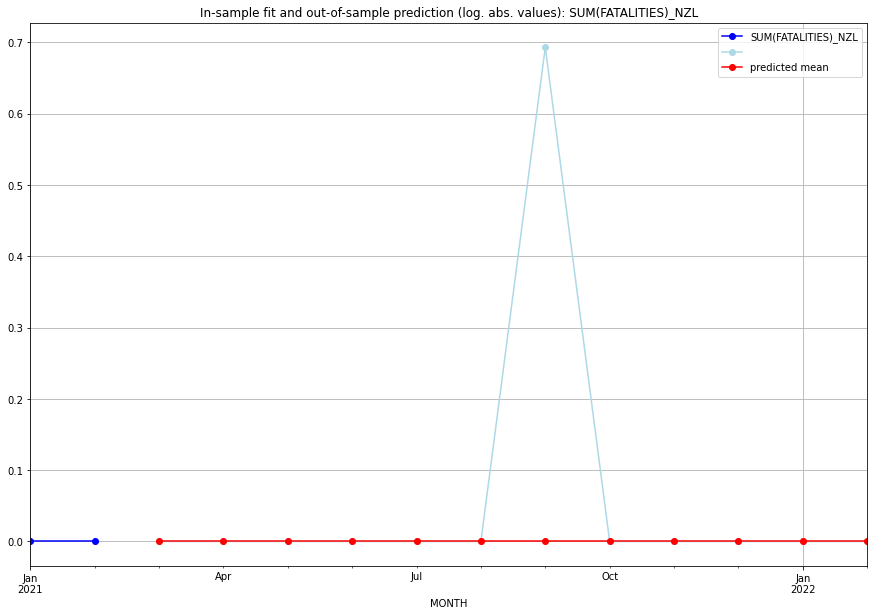

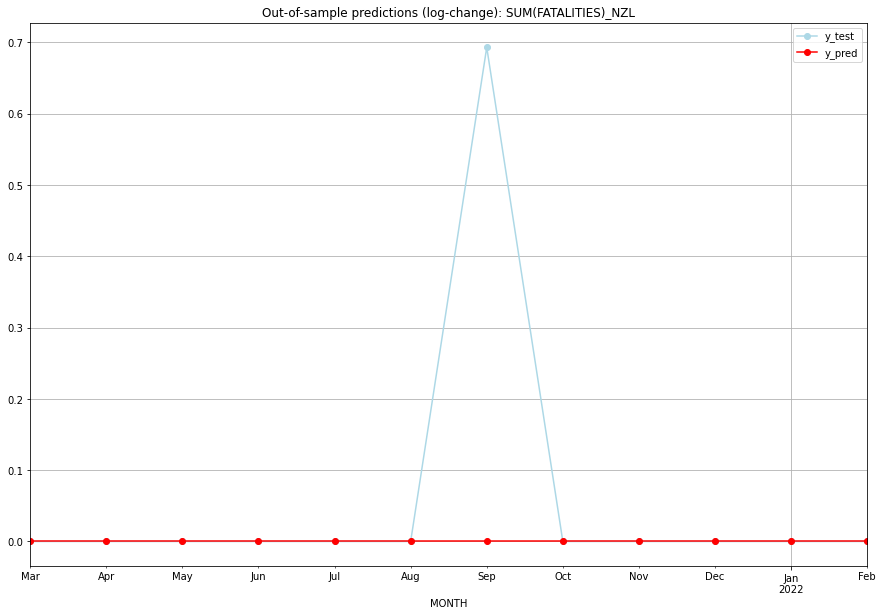

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.693147           0.0        0.693147
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

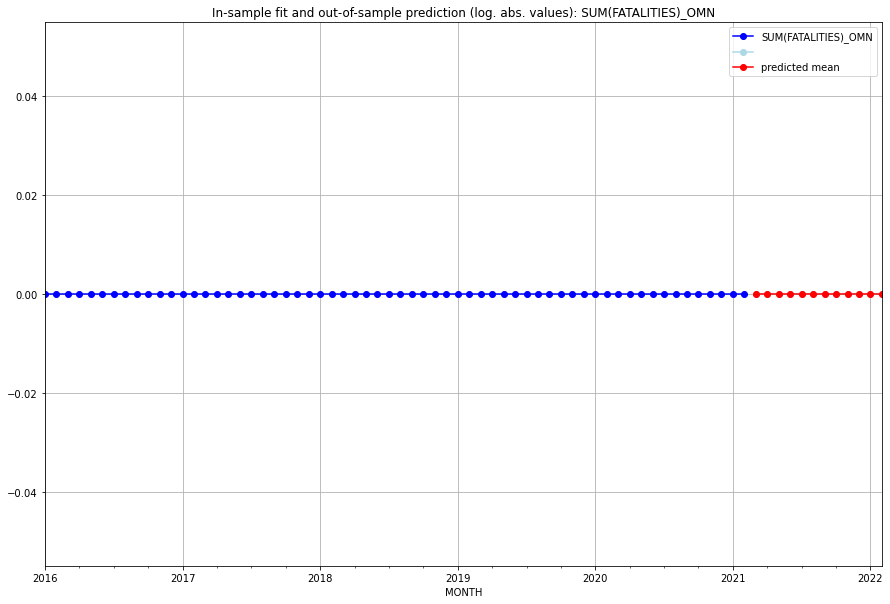

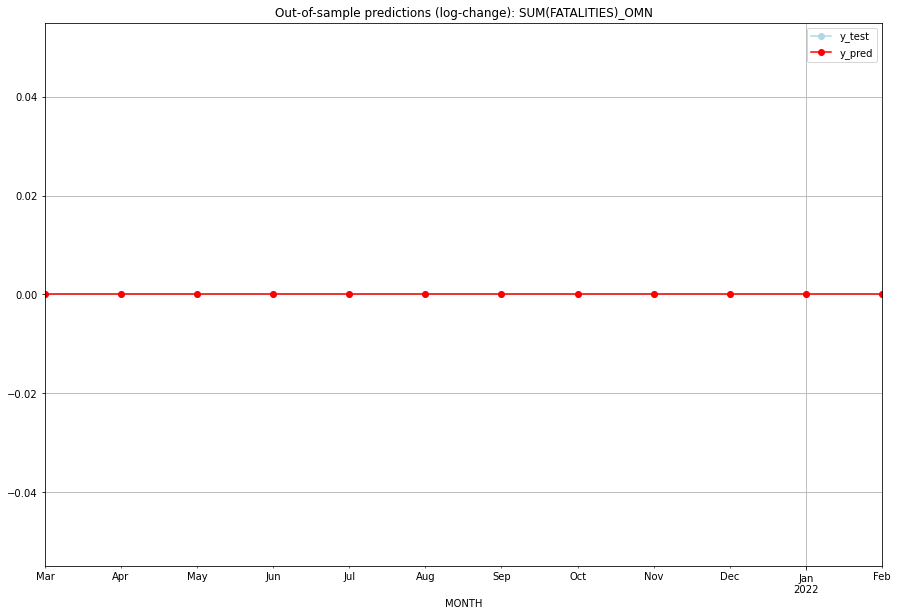

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

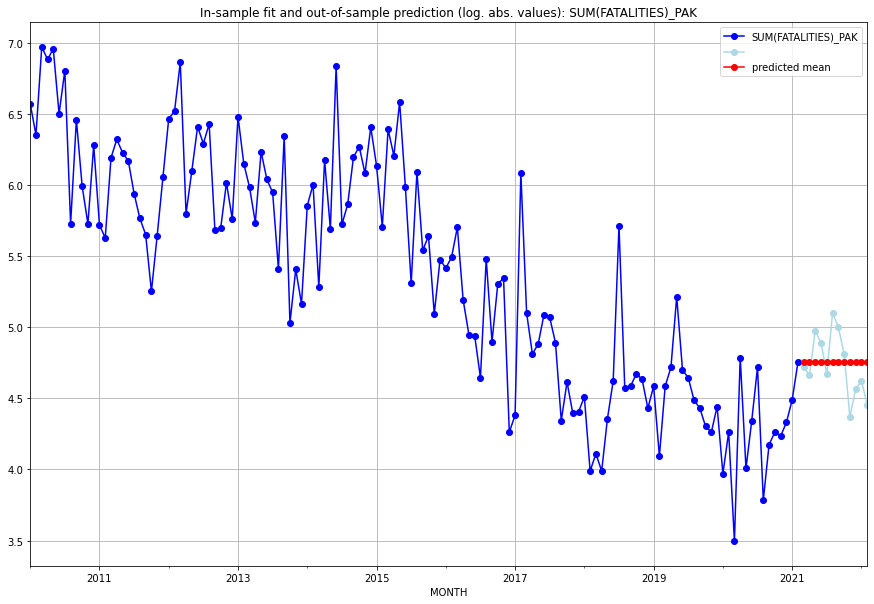

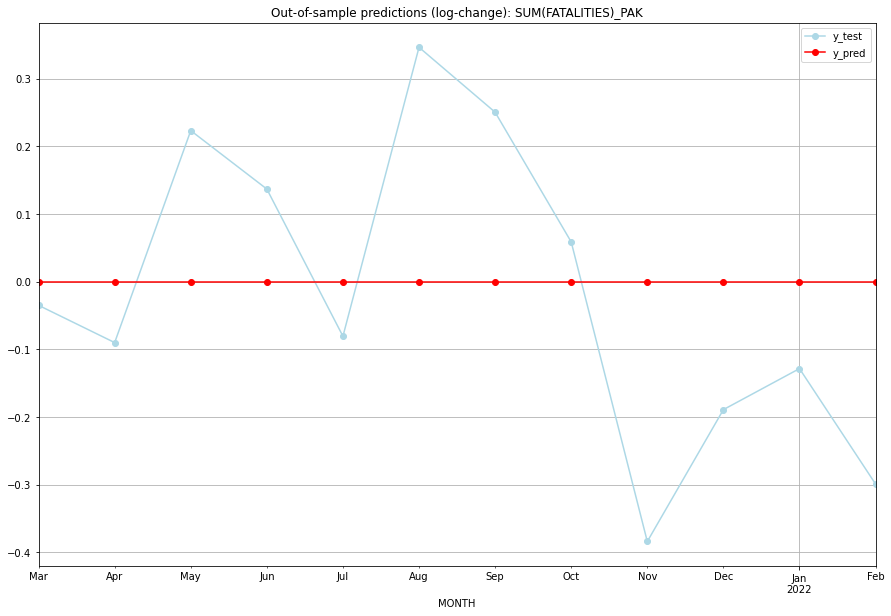

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03   4.75359    4.718499           0.0       -0.035091
1   2021-04   4.75359    4.663439           0.0       -0.090151
2   2021-05   4.75359    4.976734           0.0        0.223144
3   2021-06   4.75359    4.890349           0.0        0.136759
4   2021-07   4.75359    4.672829           0.0       -0.080761
5   2021-08   4.75359    5.099866           0.0        0.346276
6   2021-09   4.75359    5.003946           0.0        0.250356
7   2021-10   4.75359    4.812184           0.0        0.058594
8   2021-11   4.75359    4.369448           0.0       -0.384142
9   2021-12   4.75359    4.564348           0.0       -0.189242
10  2022-01   4.75359    4.624973           0.0       -0.128617
11  2022-02   4.75359    4.454347           0.0       -0.299243
TADDA: 0.18519811572128578
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01   4.75359    4.718499           0.

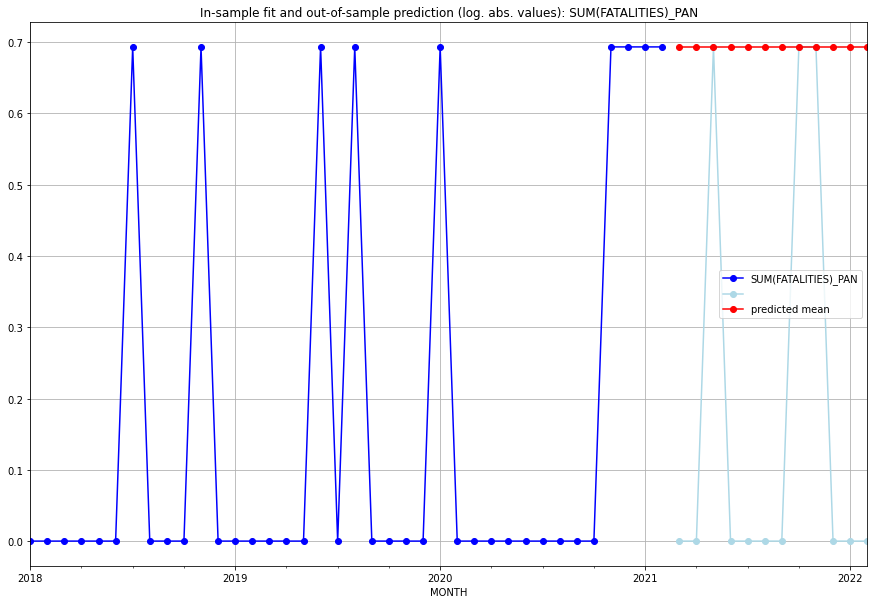

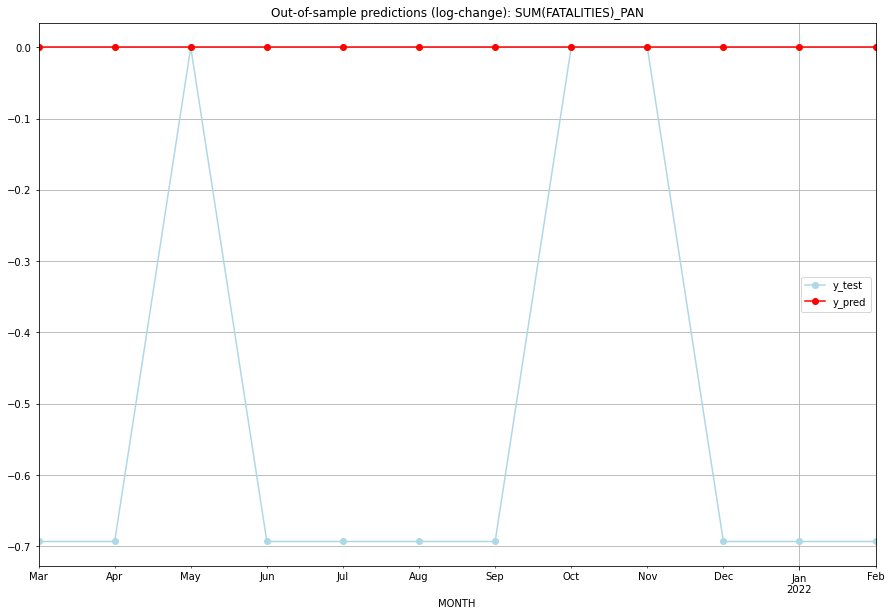

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  0.693147    0.000000           0.0       -0.693147
1   2021-04  0.693147    0.000000           0.0       -0.693147
2   2021-05  0.693147    0.693147           0.0        0.000000
3   2021-06  0.693147    0.000000           0.0       -0.693147
4   2021-07  0.693147    0.000000           0.0       -0.693147
5   2021-08  0.693147    0.000000           0.0       -0.693147
6   2021-09  0.693147    0.000000           0.0       -0.693147
7   2021-10  0.693147    0.693147           0.0        0.000000
8   2021-11  0.693147    0.693147           0.0        0.000000
9   2021-12  0.693147    0.000000           0.0       -0.693147
10  2022-01  0.693147    0.000000           0.0       -0.693147
11  2022-02  0.693147    0.000000           0.0       -0.693147
TADDA: 0.5198603854199589
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  0.693147    0.000000           0.0

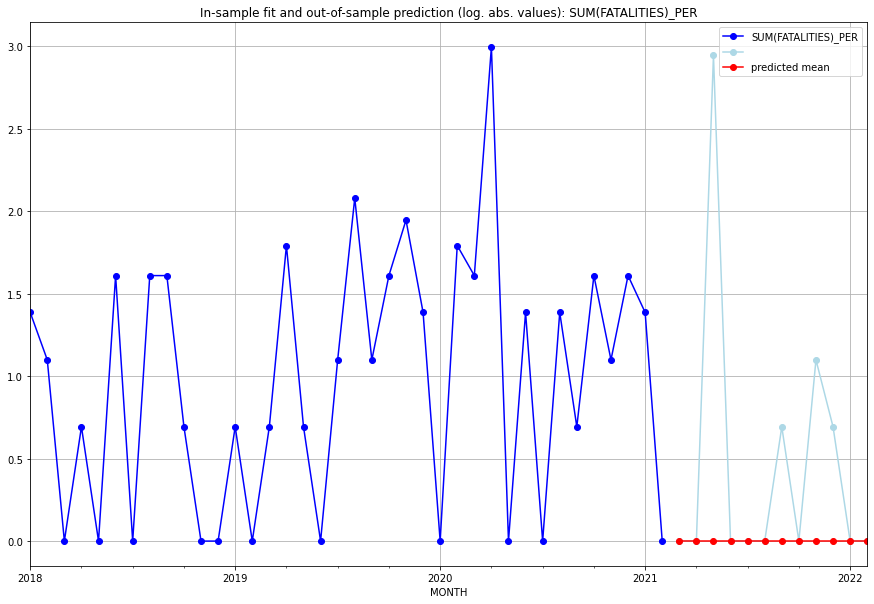

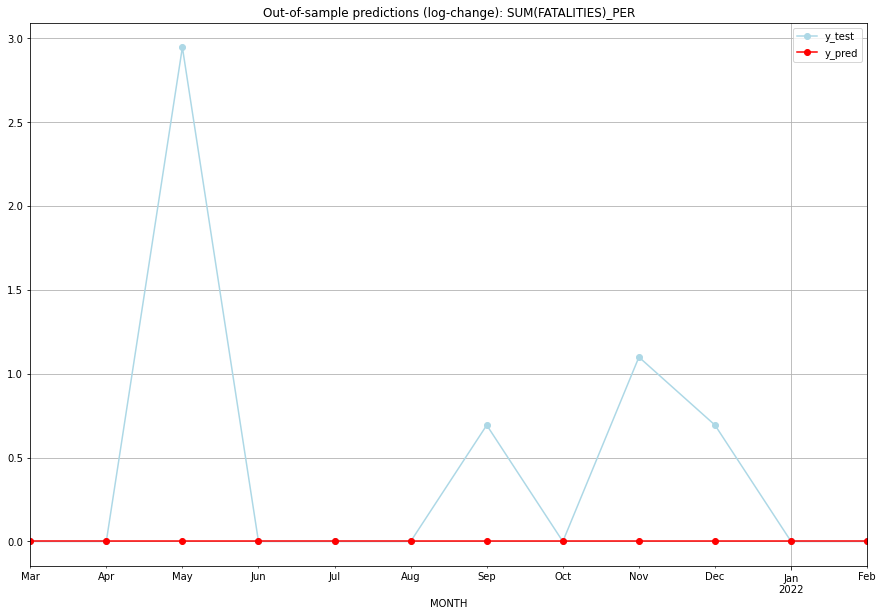

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    2.944439           0.0        2.944439
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.693147           0.0        0.693147
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    1.098612           0.0        1.098612
9   2021-12       0.0    0.693147           0.0        0.693147
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.45244546907953676
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

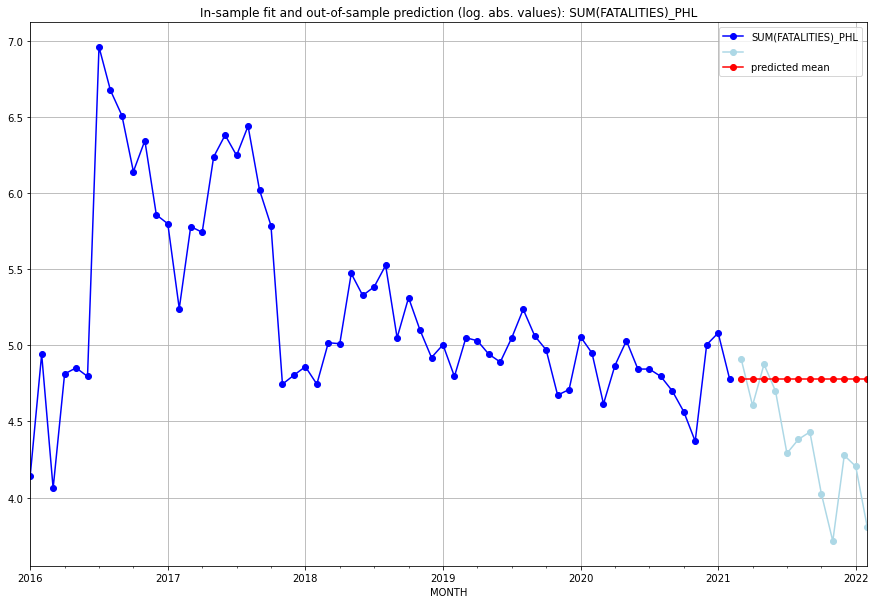

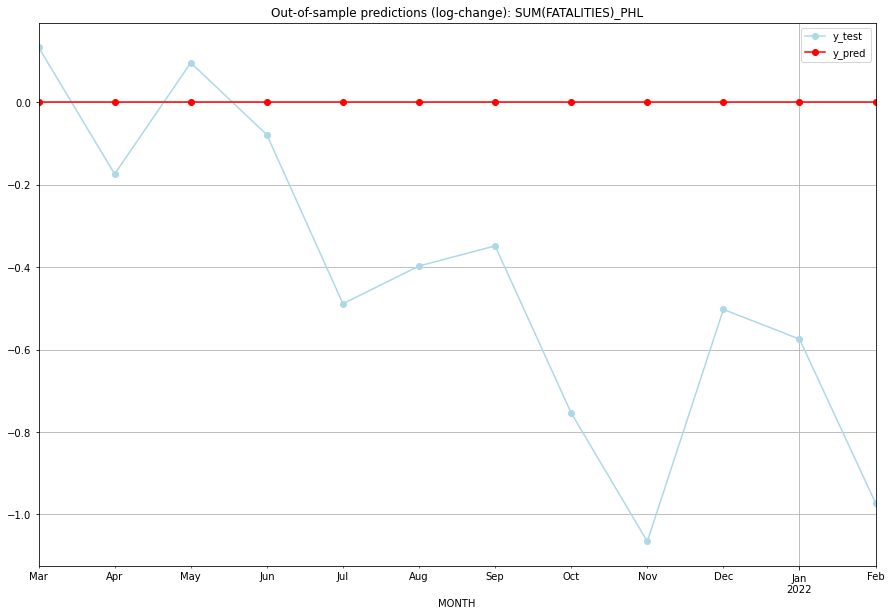

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  4.779123    4.912655           0.0        0.133531
1   2021-04  4.779123    4.605170           0.0       -0.173953
2   2021-05  4.779123    4.875197           0.0        0.096074
3   2021-06  4.779123    4.700480           0.0       -0.078643
4   2021-07  4.779123    4.290459           0.0       -0.488664
5   2021-08  4.779123    4.382027           0.0       -0.397097
6   2021-09  4.779123    4.430817           0.0       -0.348307
7   2021-10  4.779123    4.025352           0.0       -0.753772
8   2021-11  4.779123    3.713572           0.0       -1.065551
9   2021-12  4.779123    4.276666           0.0       -0.502457
10  2022-01  4.779123    4.204693           0.0       -0.574431
11  2022-02  4.779123    3.806662           0.0       -0.972461
TADDA: 0.465411811813879
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  4.779123    4.912655           0.0 

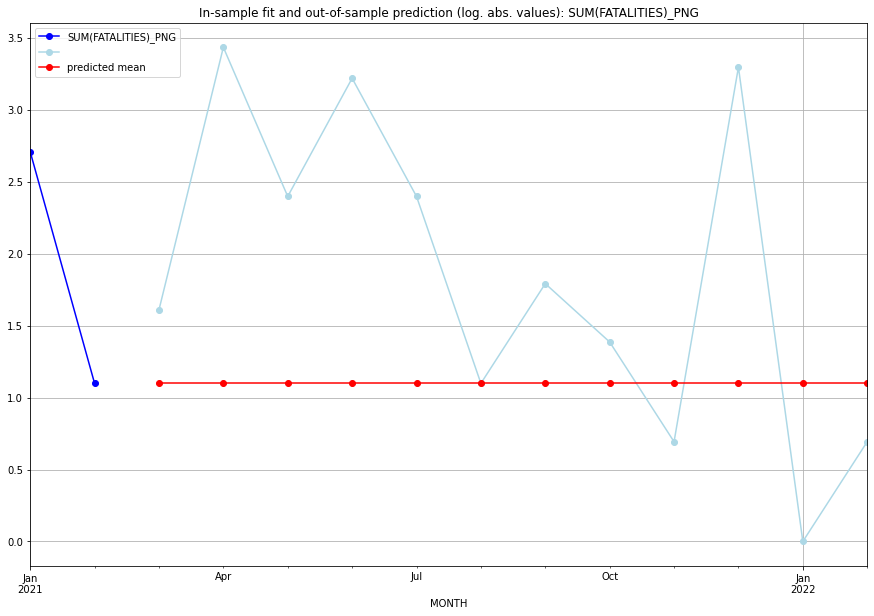

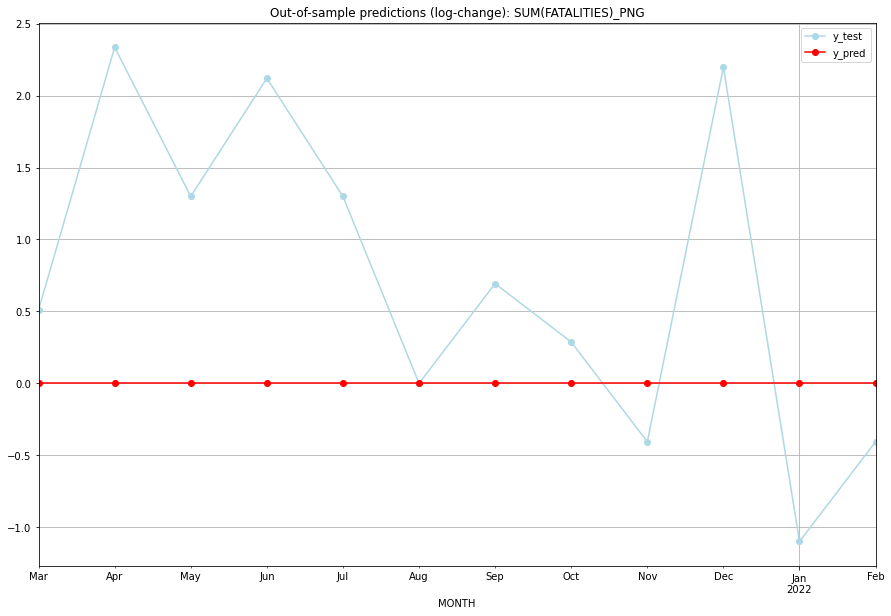

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.098612    1.609438           0.0        0.510826
1   2021-04  1.098612    3.433987           0.0        2.335375
2   2021-05  1.098612    2.397895           0.0        1.299283
3   2021-06  1.098612    3.218876           0.0        2.120264
4   2021-07  1.098612    2.397895           0.0        1.299283
5   2021-08  1.098612    1.098612           0.0        0.000000
6   2021-09  1.098612    1.791759           0.0        0.693147
7   2021-10  1.098612    1.386294           0.0        0.287682
8   2021-11  1.098612    0.693147           0.0       -0.405465
9   2021-12  1.098612    3.295837           0.0        2.197225
10  2022-01  1.098612    0.000000           0.0       -1.098612
11  2022-02  1.098612    0.693147           0.0       -0.405465
TADDA: 1.054385531606335
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.098612    1.609438           0.0 

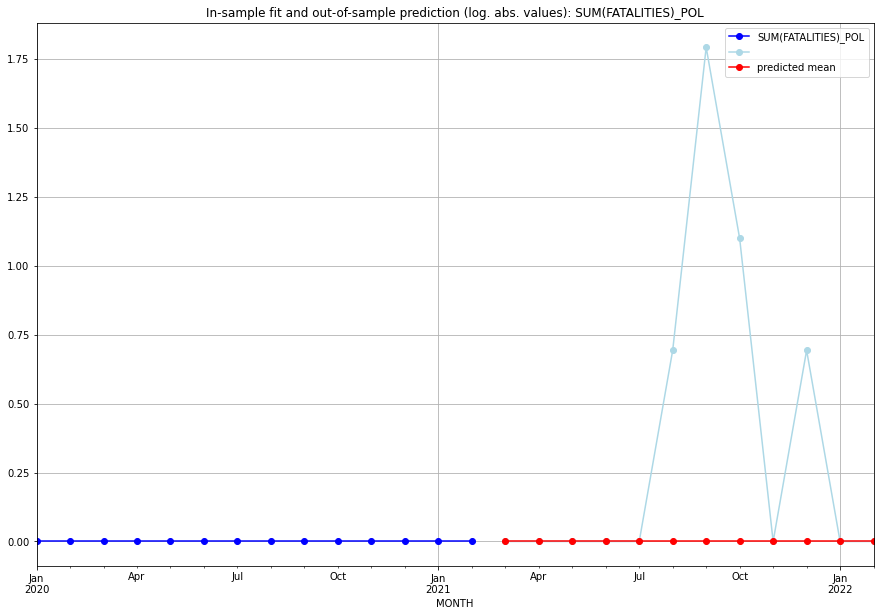

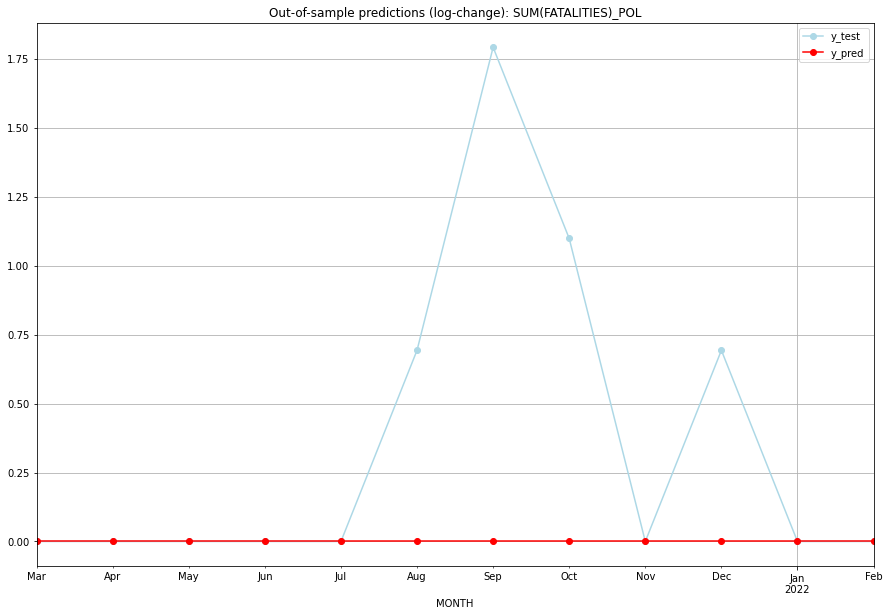

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.693147           0.0        0.693147
6   2021-09       0.0    1.791759           0.0        1.791759
7   2021-10       0.0    1.098612           0.0        1.098612
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.693147           0.0        0.693147
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.35638884325133796
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

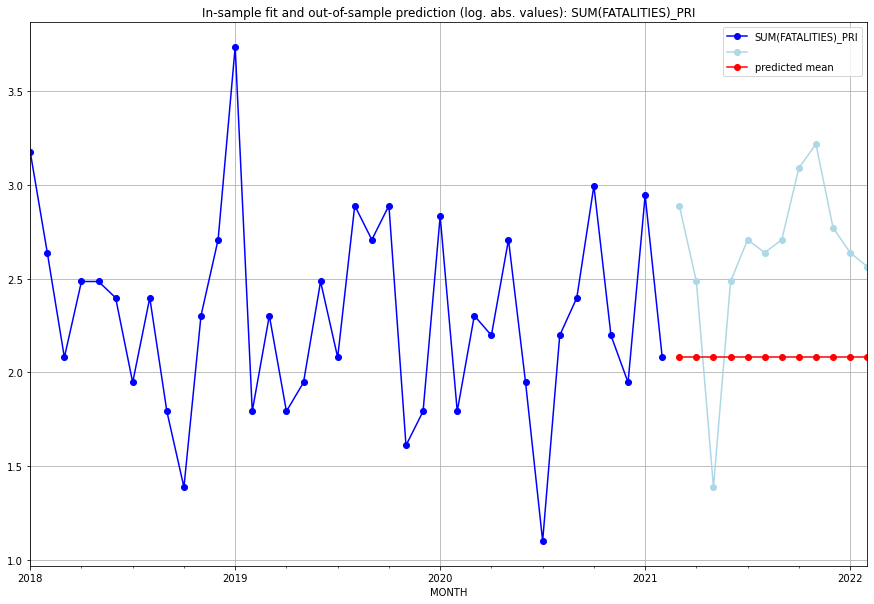

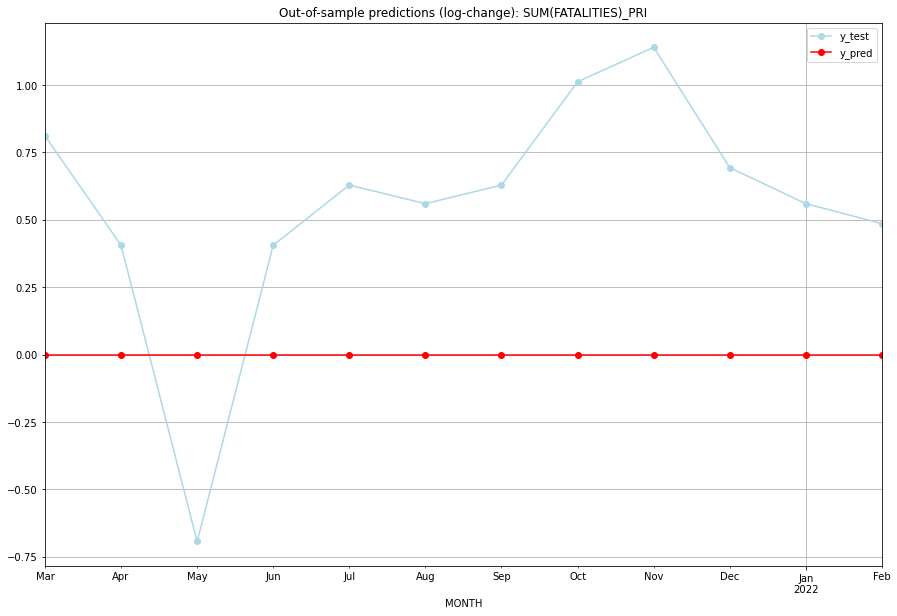

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  2.079442    2.890372           0.0        0.810930
1   2021-04  2.079442    2.484907           0.0        0.405465
2   2021-05  2.079442    1.386294           0.0       -0.693147
3   2021-06  2.079442    2.484907           0.0        0.405465
4   2021-07  2.079442    2.708050           0.0        0.628609
5   2021-08  2.079442    2.639057           0.0        0.559616
6   2021-09  2.079442    2.708050           0.0        0.628609
7   2021-10  2.079442    3.091042           0.0        1.011601
8   2021-11  2.079442    3.218876           0.0        1.139434
9   2021-12  2.079442    2.772589           0.0        0.693147
10  2022-01  2.079442    2.639057           0.0        0.559616
11  2022-02  2.079442    2.564949           0.0        0.485508
TADDA: 0.6684288915763904
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  2.079442    2.890372           0.0

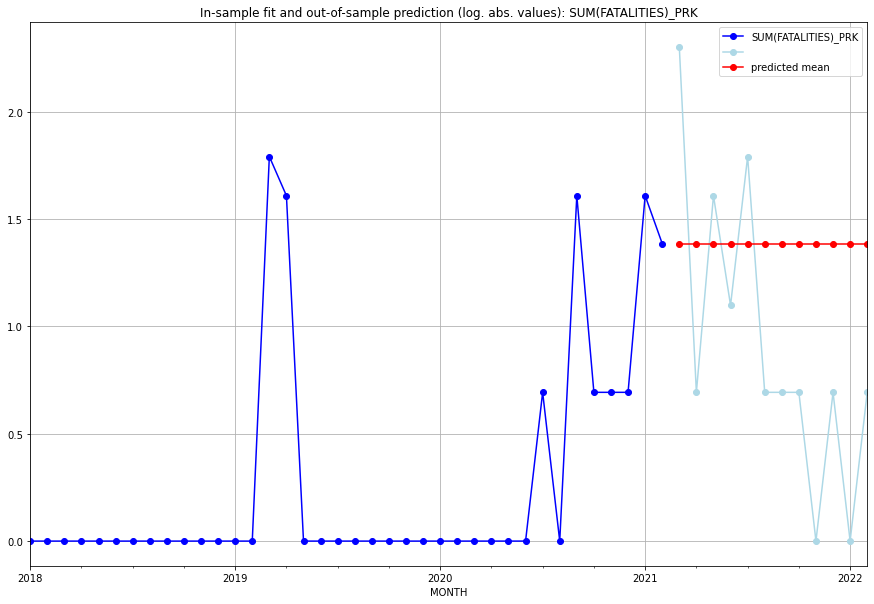

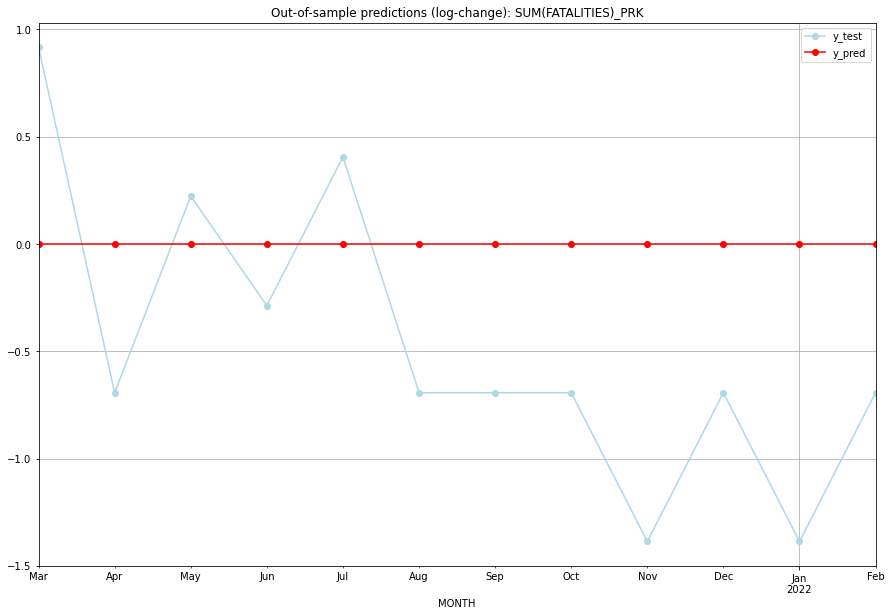

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.386294    2.302585           0.0        0.916291
1   2021-04  1.386294    0.693147           0.0       -0.693147
2   2021-05  1.386294    1.609438           0.0        0.223144
3   2021-06  1.386294    1.098612           0.0       -0.287682
4   2021-07  1.386294    1.791759           0.0        0.405465
5   2021-08  1.386294    0.693147           0.0       -0.693147
6   2021-09  1.386294    0.693147           0.0       -0.693147
7   2021-10  1.386294    0.693147           0.0       -0.693147
8   2021-11  1.386294    0.000000           0.0       -1.386294
9   2021-12  1.386294    0.693147           0.0       -0.693147
10  2022-01  1.386294    0.000000           0.0       -1.386294
11  2022-02  1.386294    0.693147           0.0       -0.693147
TADDA: 0.730337772445647
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.386294    2.302585           0.0 

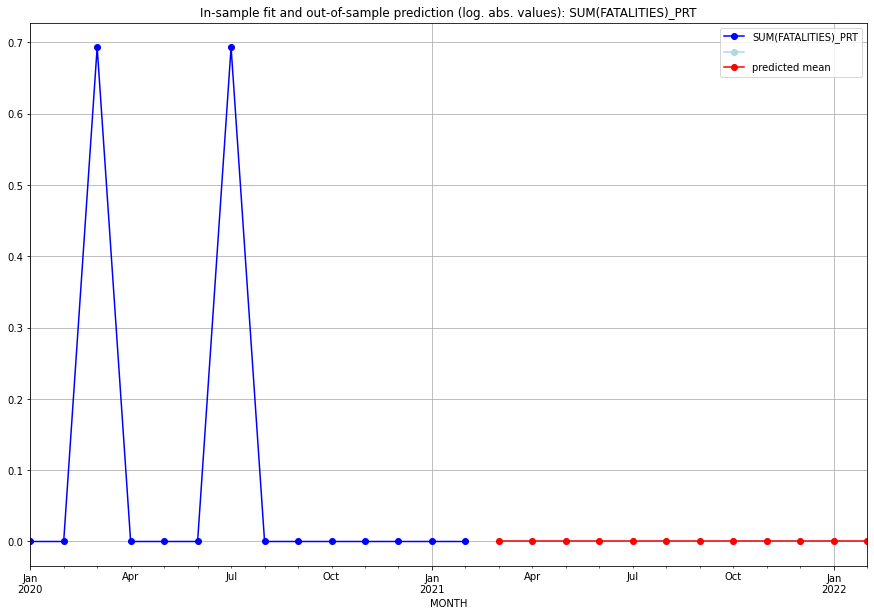

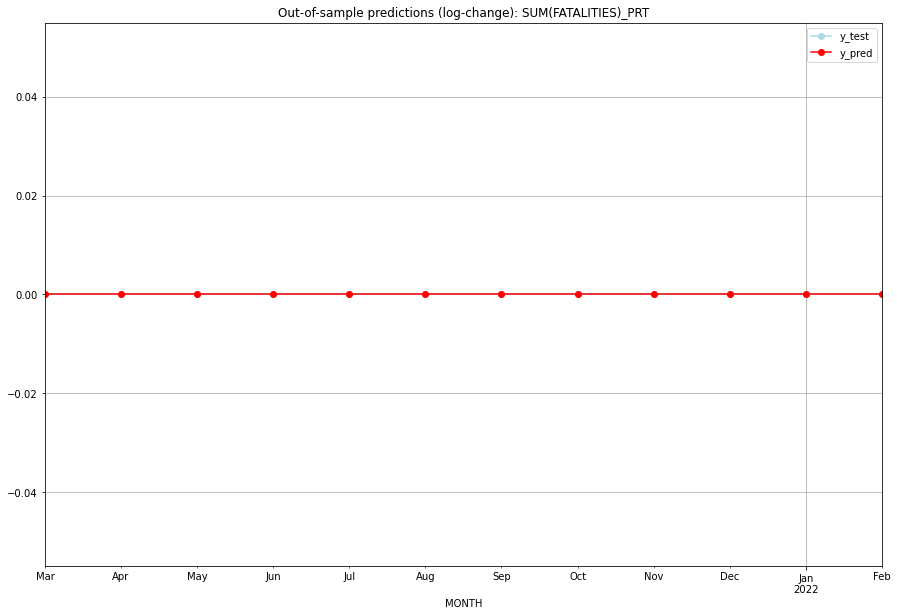

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

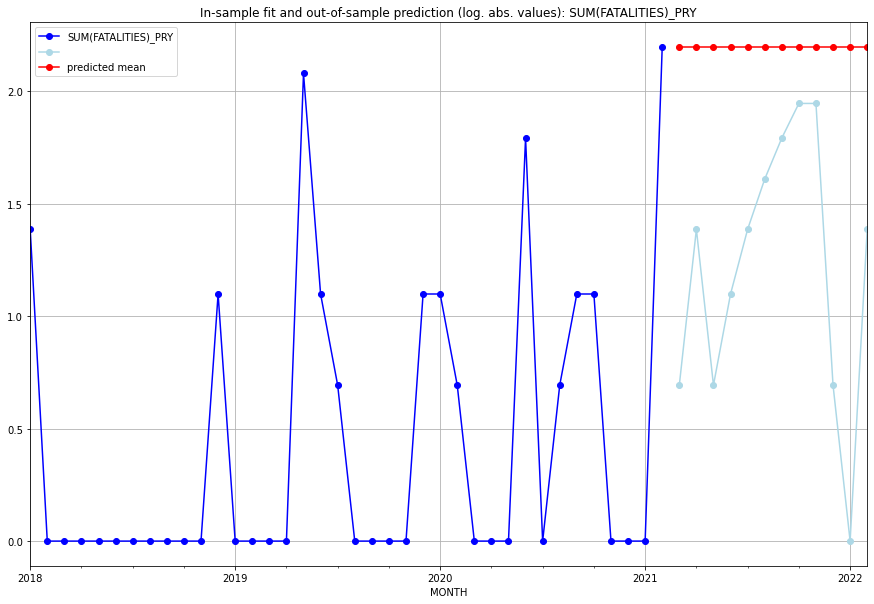

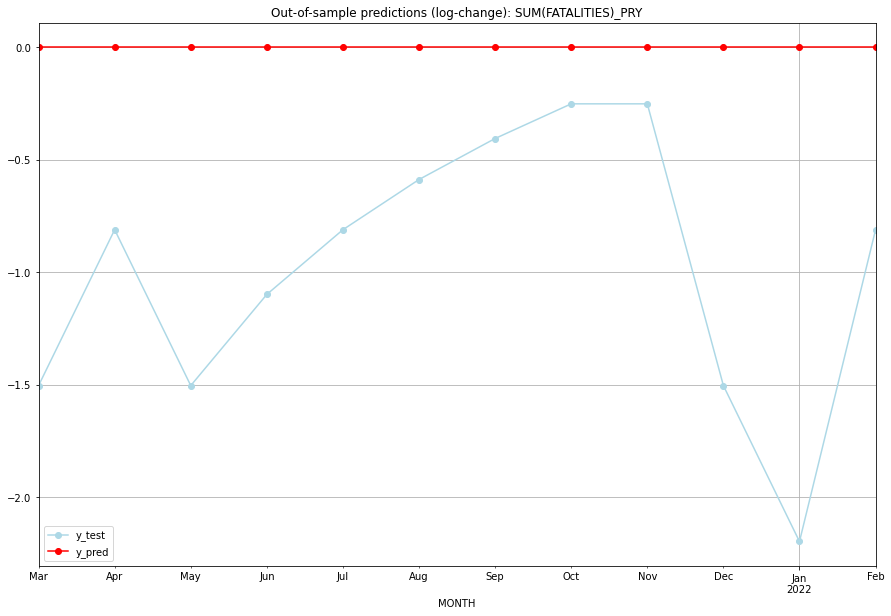

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  2.197225    0.693147           0.0       -1.504077
1   2021-04  2.197225    1.386294           0.0       -0.810930
2   2021-05  2.197225    0.693147           0.0       -1.504077
3   2021-06  2.197225    1.098612           0.0       -1.098612
4   2021-07  2.197225    1.386294           0.0       -0.810930
5   2021-08  2.197225    1.609438           0.0       -0.587787
6   2021-09  2.197225    1.791759           0.0       -0.405465
7   2021-10  2.197225    1.945910           0.0       -0.251314
8   2021-11  2.197225    1.945910           0.0       -0.251314
9   2021-12  2.197225    0.693147           0.0       -1.504077
10  2022-01  2.197225    0.000000           0.0       -2.197225
11  2022-02  2.197225    1.386294           0.0       -0.810930
TADDA: 0.9780616945461867
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  2.197225    0.693147           0.0

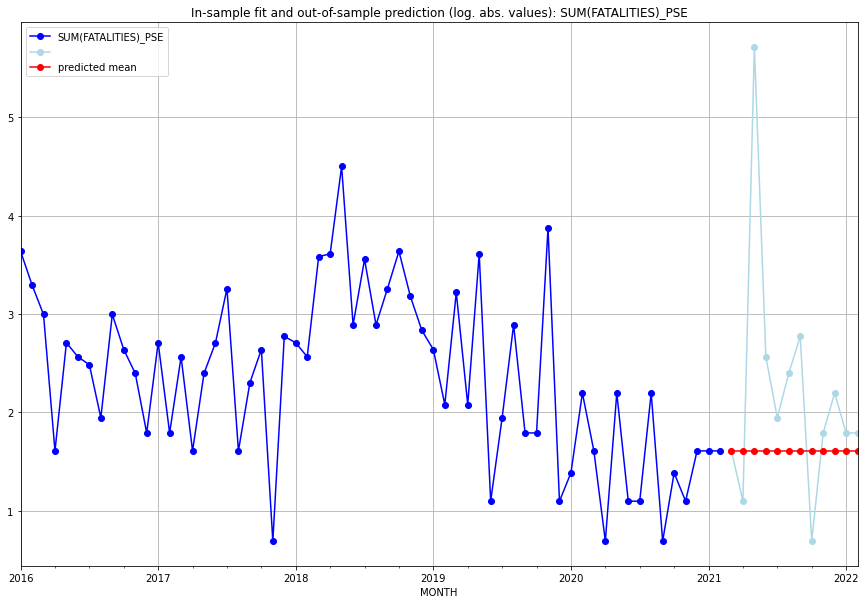

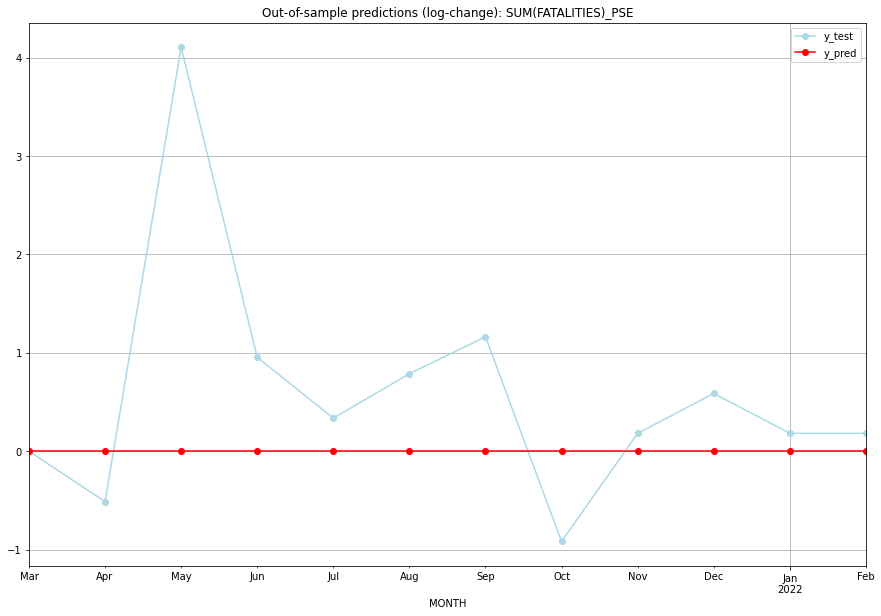

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.609438    1.609438           0.0        0.000000
1   2021-04  1.609438    1.098612           0.0       -0.510826
2   2021-05  1.609438    5.713733           0.0        4.104295
3   2021-06  1.609438    2.564949           0.0        0.955511
4   2021-07  1.609438    1.945910           0.0        0.336472
5   2021-08  1.609438    2.397895           0.0        0.788457
6   2021-09  1.609438    2.772589           0.0        1.163151
7   2021-10  1.609438    0.693147           0.0       -0.916291
8   2021-11  1.609438    1.791759           0.0        0.182322
9   2021-12  1.609438    2.197225           0.0        0.587787
10  2022-01  1.609438    1.791759           0.0        0.182322
11  2022-02  1.609438    1.791759           0.0        0.182322
TADDA: 0.8258128696514998
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.609438    1.609438           0.0

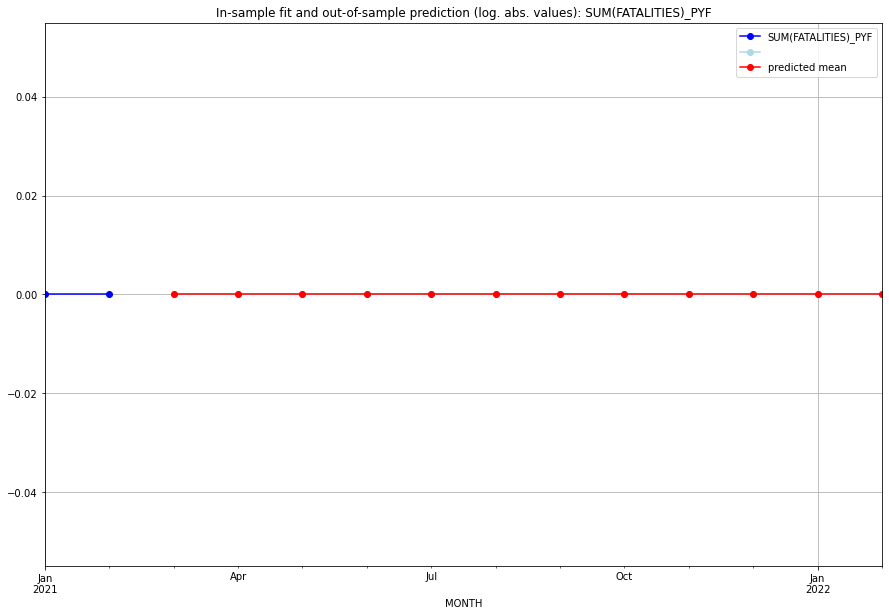

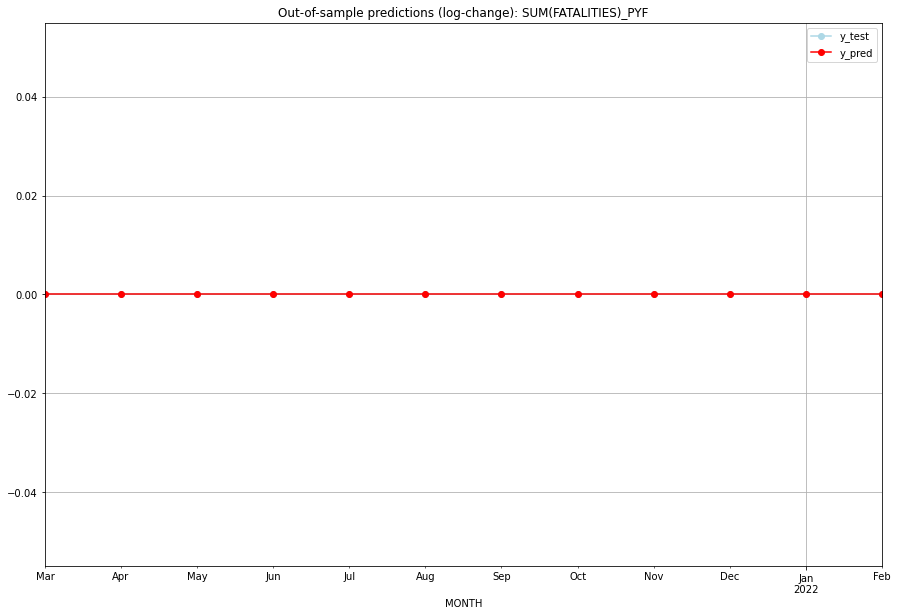

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

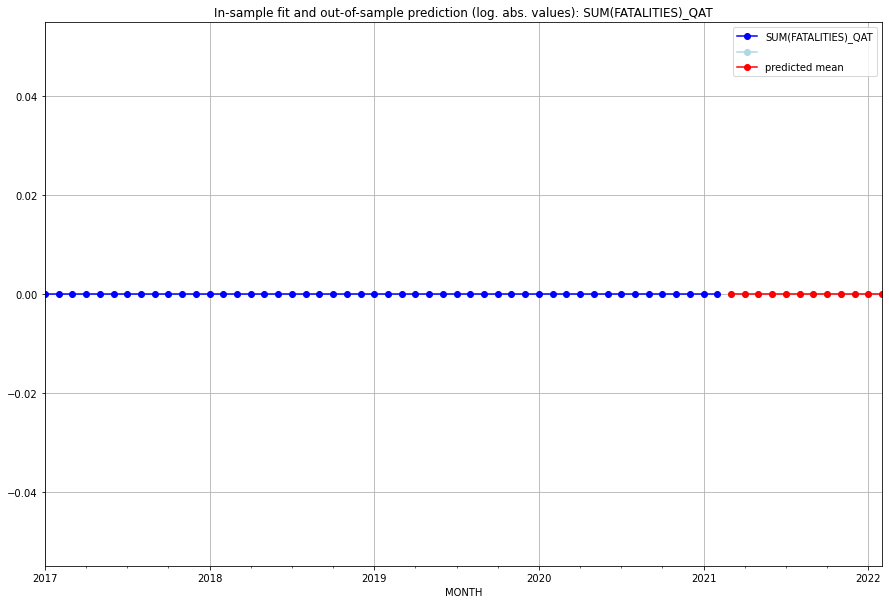

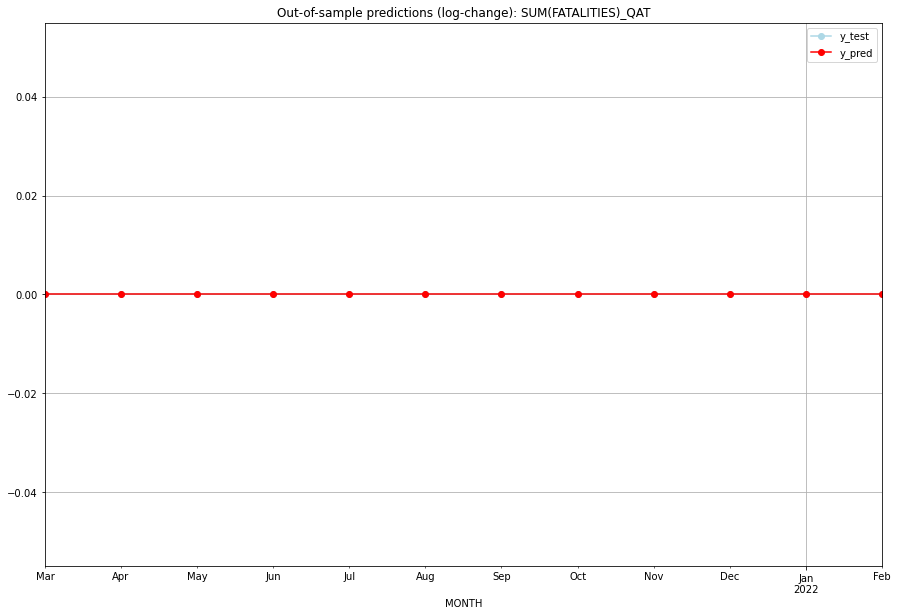

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

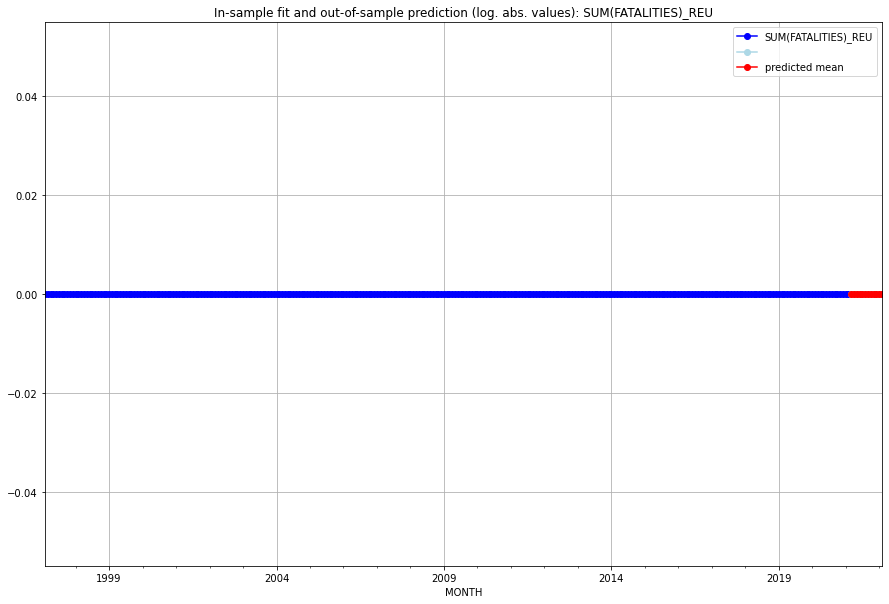

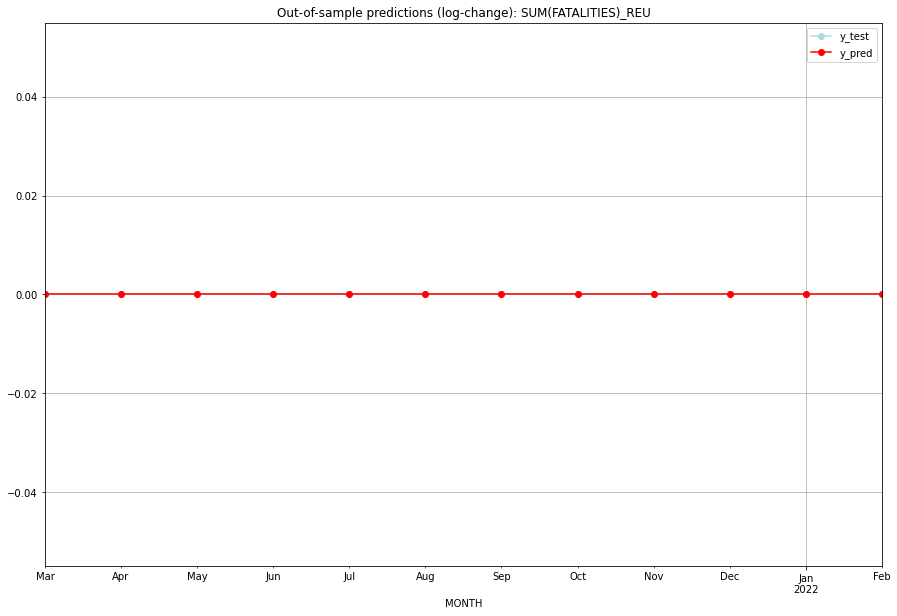

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

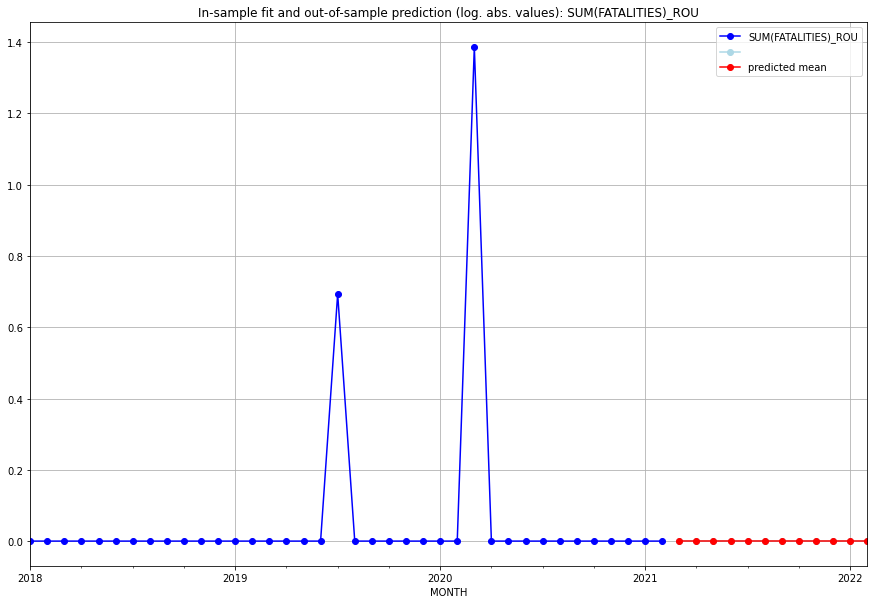

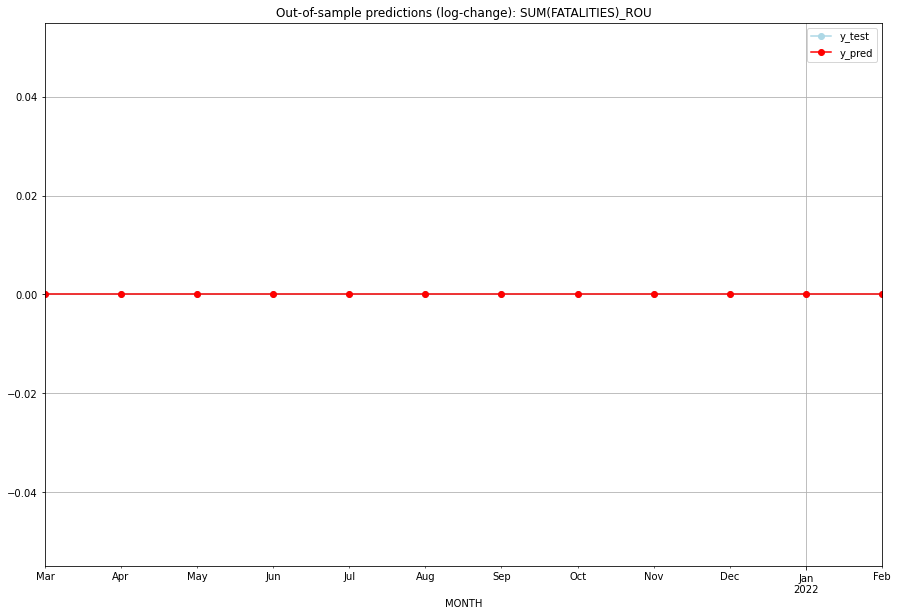

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

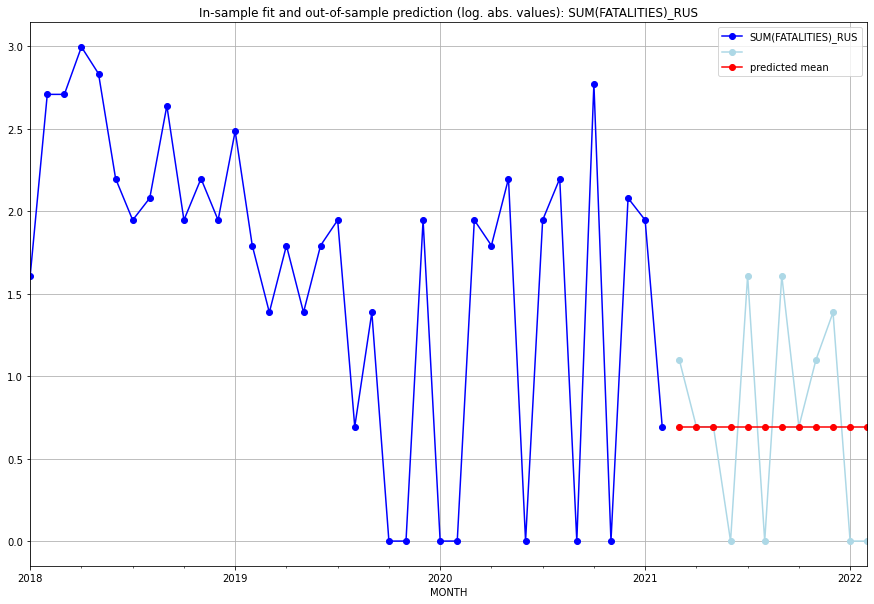

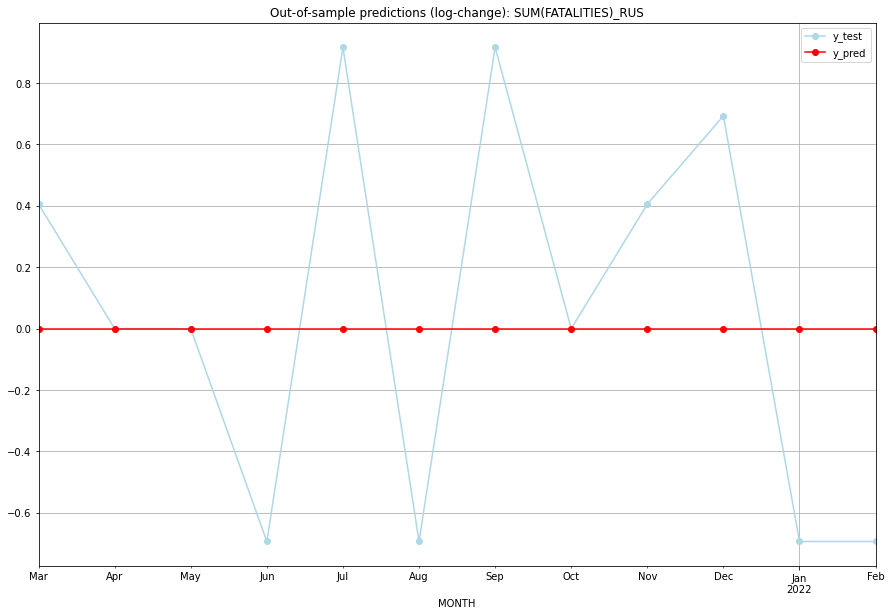

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  0.693147    1.098612           0.0        0.405465
1   2021-04  0.693147    0.693147           0.0        0.000000
2   2021-05  0.693147    0.693147           0.0        0.000000
3   2021-06  0.693147    0.000000           0.0       -0.693147
4   2021-07  0.693147    1.609438           0.0        0.916291
5   2021-08  0.693147    0.000000           0.0       -0.693147
6   2021-09  0.693147    1.609438           0.0        0.916291
7   2021-10  0.693147    0.693147           0.0        0.000000
8   2021-11  0.693147    1.098612           0.0        0.405465
9   2021-12  0.693147    1.386294           0.0        0.693147
10  2022-01  0.693147    0.000000           0.0       -0.693147
11  2022-02  0.693147    0.000000           0.0       -0.693147
TADDA: 0.5091039652303638
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  0.693147    1.098612           0.0

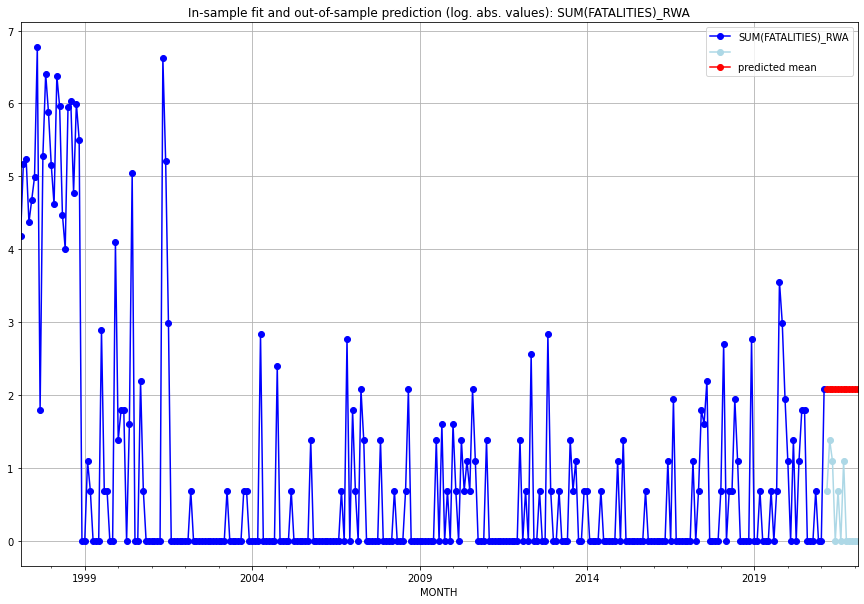

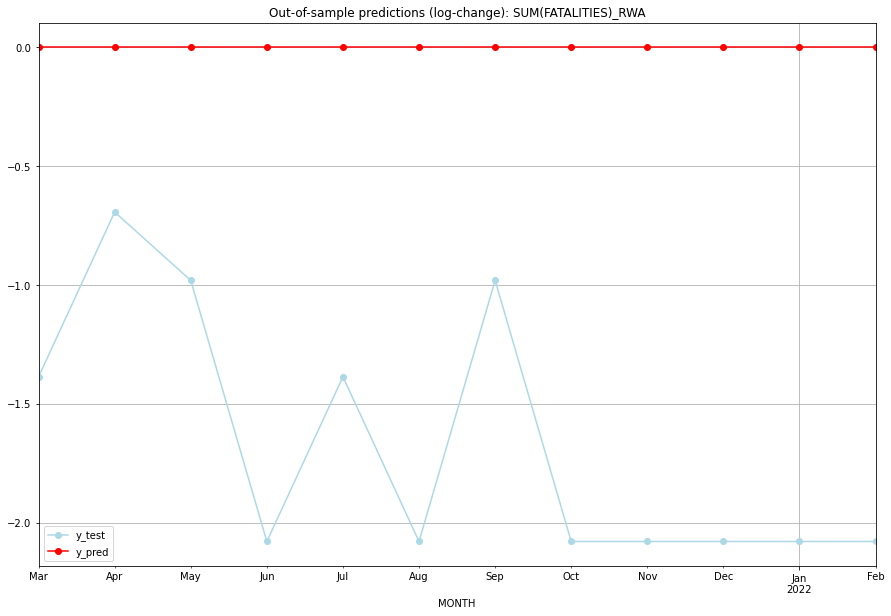

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  2.079442    0.693147           0.0       -1.386294
1   2021-04  2.079442    1.386294           0.0       -0.693147
2   2021-05  2.079442    1.098612           0.0       -0.980829
3   2021-06  2.079442    0.000000           0.0       -2.079442
4   2021-07  2.079442    0.693147           0.0       -1.386294
5   2021-08  2.079442    0.000000           0.0       -2.079442
6   2021-09  2.079442    1.098612           0.0       -0.980829
7   2021-10  2.079442    0.000000           0.0       -2.079442
8   2021-11  2.079442    0.000000           0.0       -2.079442
9   2021-12  2.079442    0.000000           0.0       -2.079442
10  2022-01  2.079442    0.000000           0.0       -2.079442
11  2022-02  2.079442    0.000000           0.0       -2.079442
TADDA: 1.665290433381836
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  2.079442    0.693147           0.0 

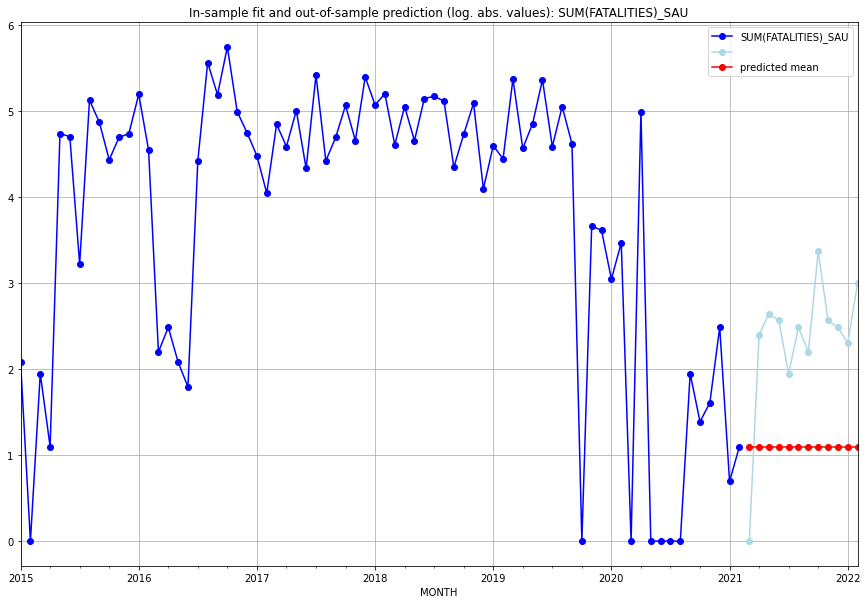

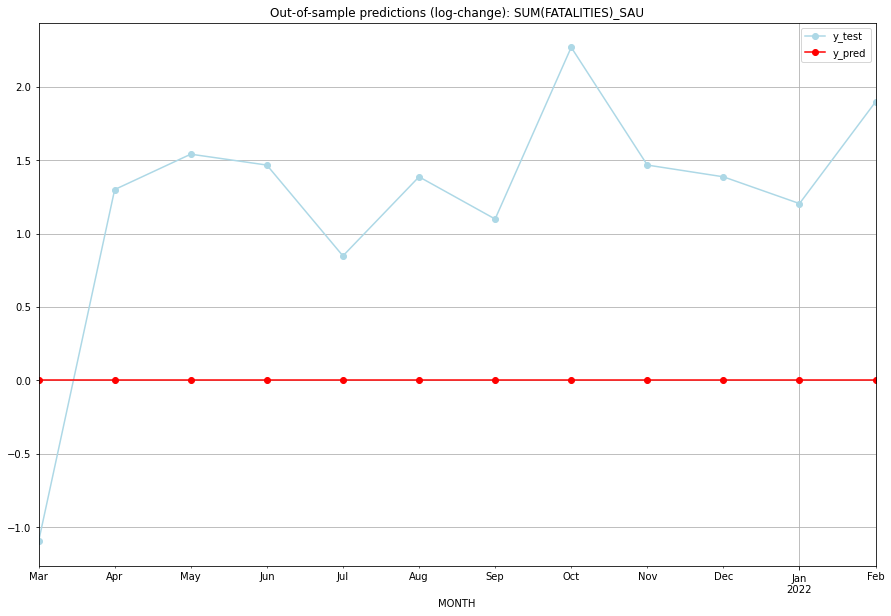

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.098612    0.000000           0.0       -1.098612
1   2021-04  1.098612    2.397895           0.0        1.299283
2   2021-05  1.098612    2.639057           0.0        1.540445
3   2021-06  1.098612    2.564949           0.0        1.466337
4   2021-07  1.098612    1.945910           0.0        0.847298
5   2021-08  1.098612    2.484907           0.0        1.386294
6   2021-09  1.098612    2.197225           0.0        1.098612
7   2021-10  1.098612    3.367296           0.0        2.268684
8   2021-11  1.098612    2.564949           0.0        1.466337
9   2021-12  1.098612    2.484907           0.0        1.386294
10  2022-01  1.098612    2.302585           0.0        1.203973
11  2022-02  1.098612    2.995732           0.0        1.897120
TADDA: 1.4132741377631375
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.098612    0.000000           0.0

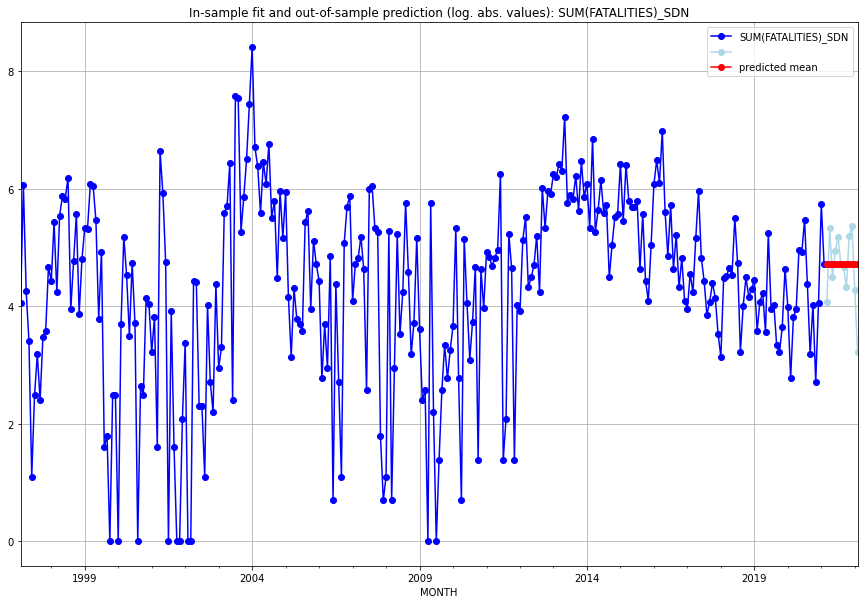

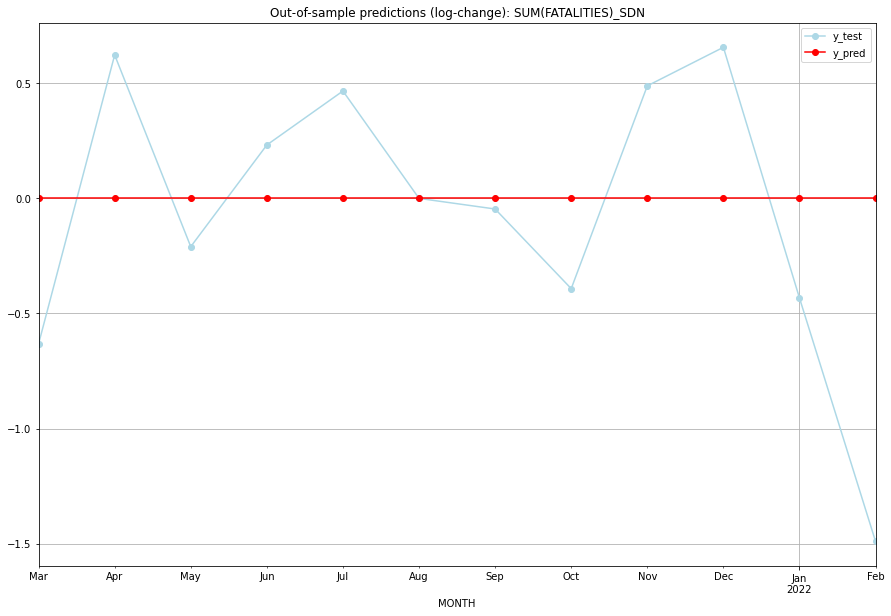

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03   4.70953    4.077537           0.0       -0.631993
1   2021-04   4.70953    5.332719           0.0        0.623189
2   2021-05   4.70953    4.499810           0.0       -0.209721
3   2021-06   4.70953    4.941642           0.0        0.232112
4   2021-07   4.70953    5.176150           0.0        0.466620
5   2021-08   4.70953    4.709530           0.0        0.000000
6   2021-09   4.70953    4.663439           0.0       -0.046091
7   2021-10   4.70953    4.317488           0.0       -0.392042
8   2021-11   4.70953    5.198497           0.0        0.488967
9   2021-12   4.70953    5.365976           0.0        0.656446
10  2022-01   4.70953    4.276666           0.0       -0.432864
11  2022-02   4.70953    3.218876           0.0       -1.490654
TADDA: 0.47255816085665786
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01   4.70953    4.077537           0.

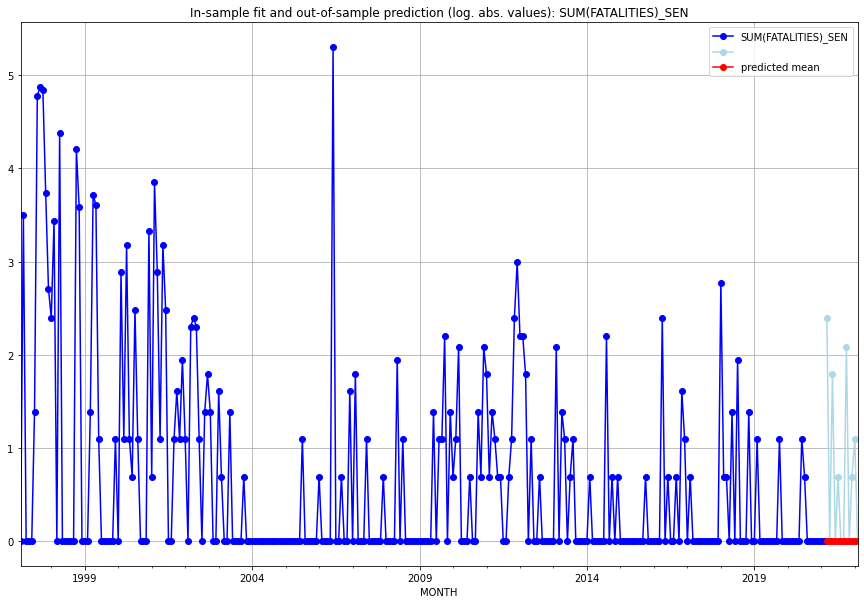

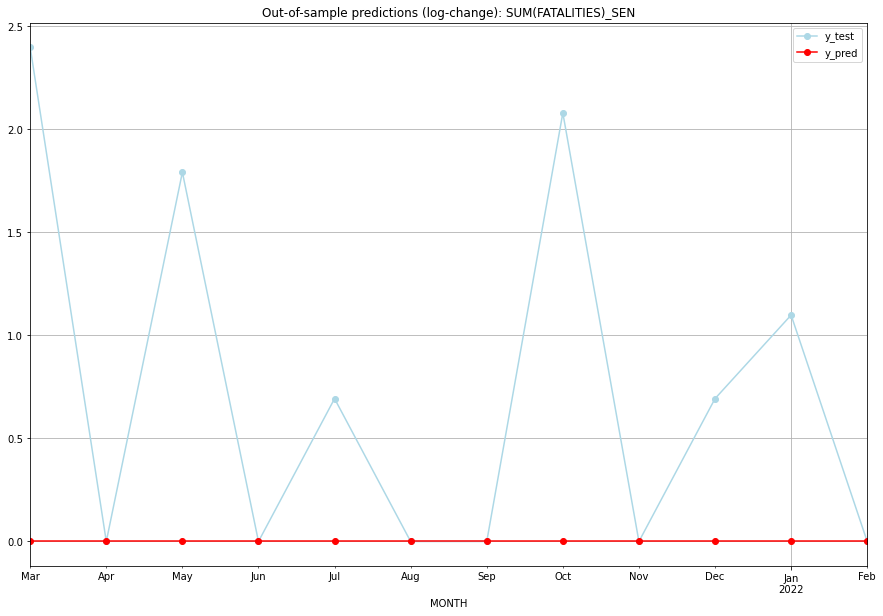

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    2.397895           0.0        2.397895
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    1.791759           0.0        1.791759
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.693147           0.0        0.693147
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    2.079442           0.0        2.079442
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.693147           0.0        0.693147
10  2022-01       0.0    1.098612           0.0        1.098612
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.7295002444578551
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    2.397895           0.0

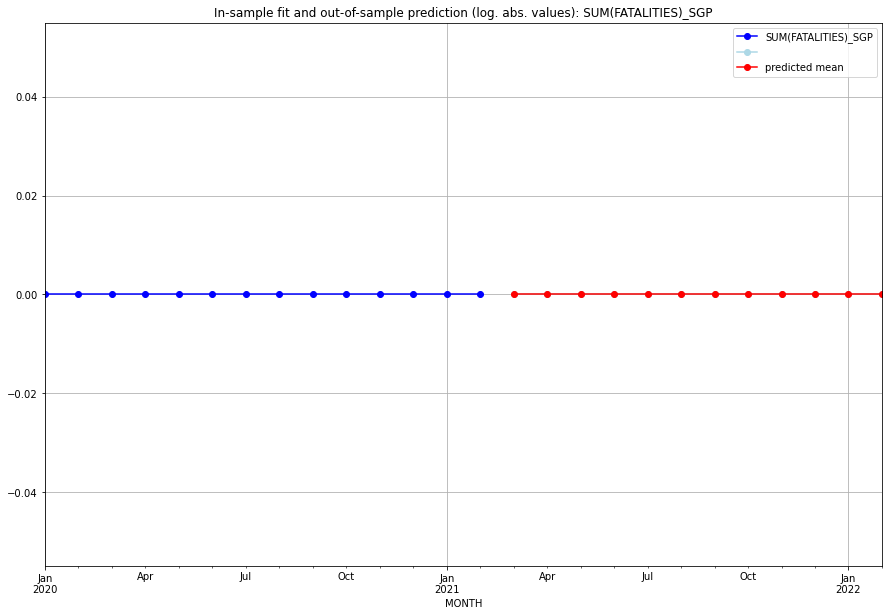

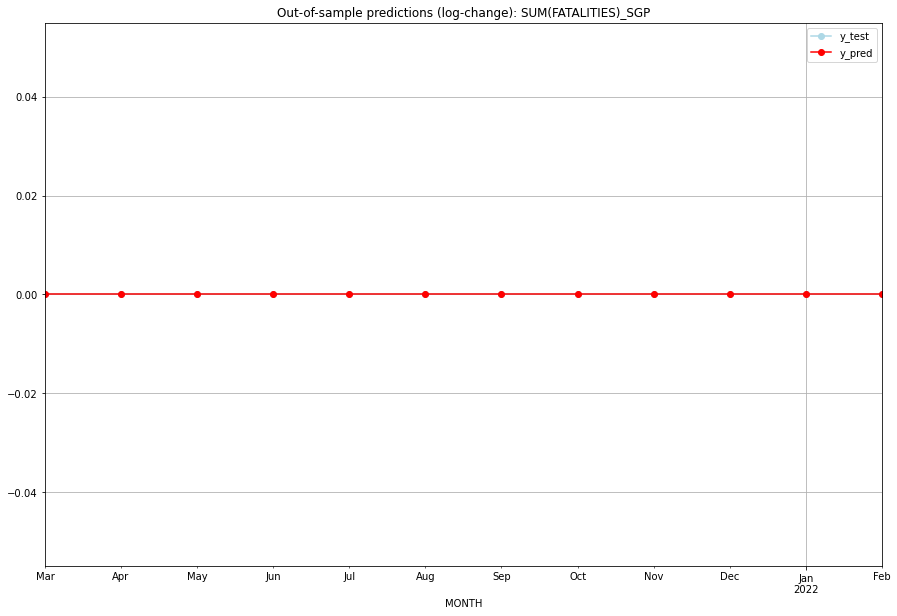

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

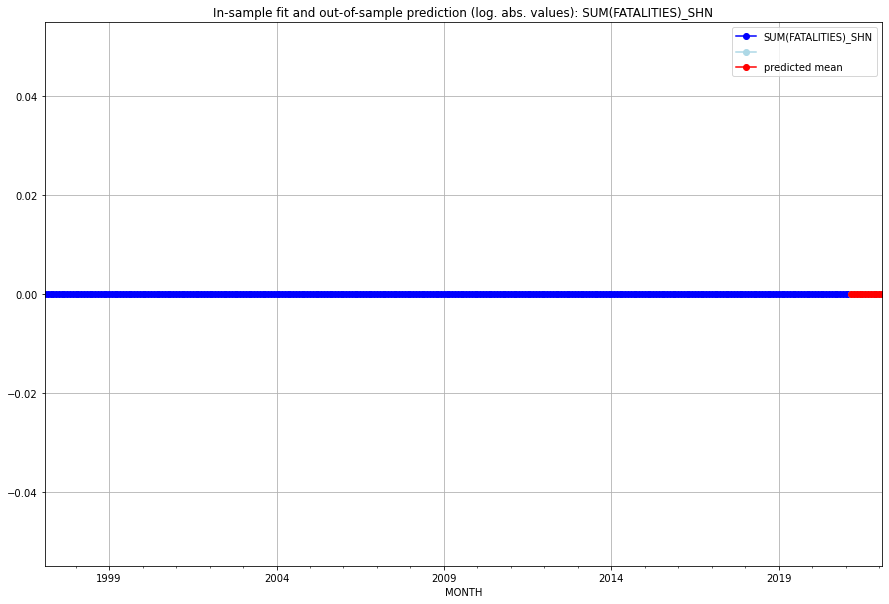

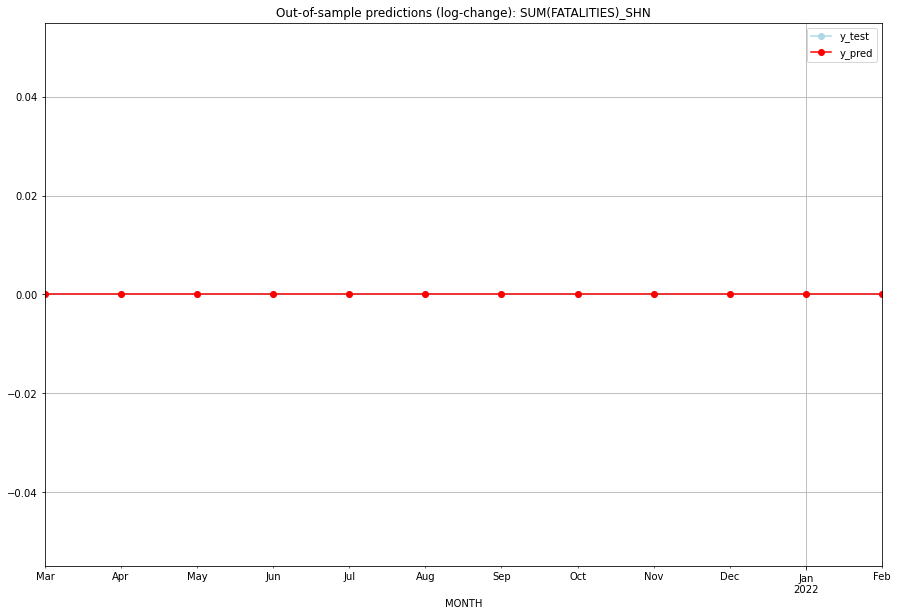

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

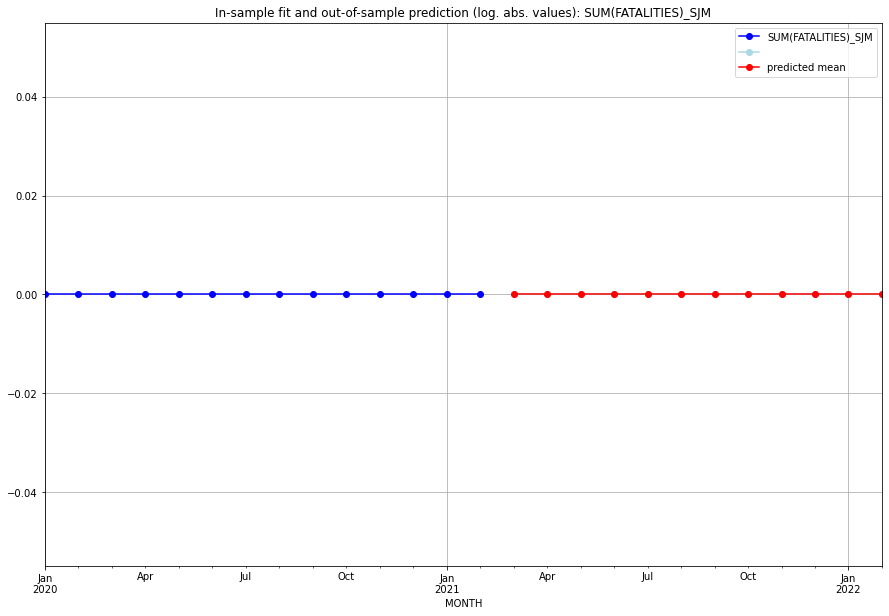

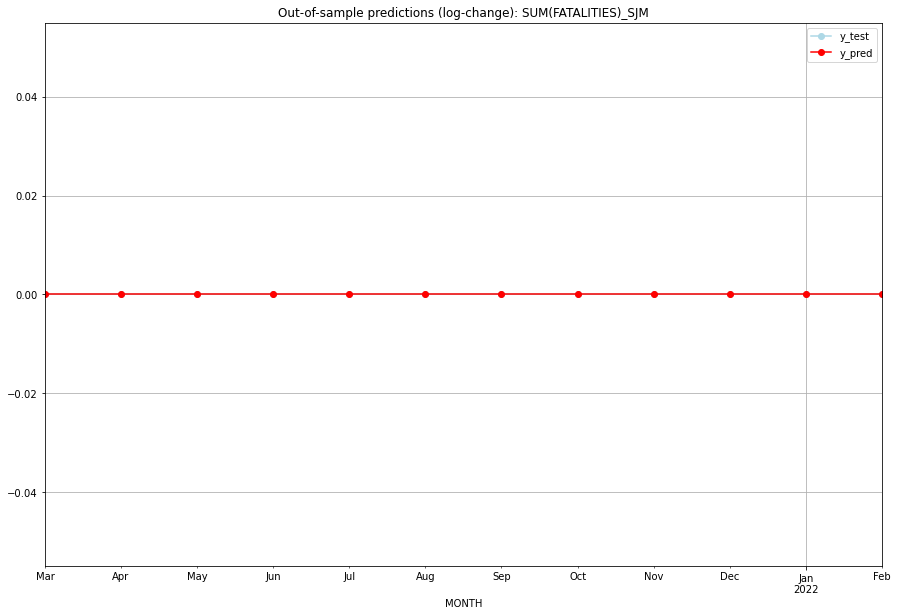

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

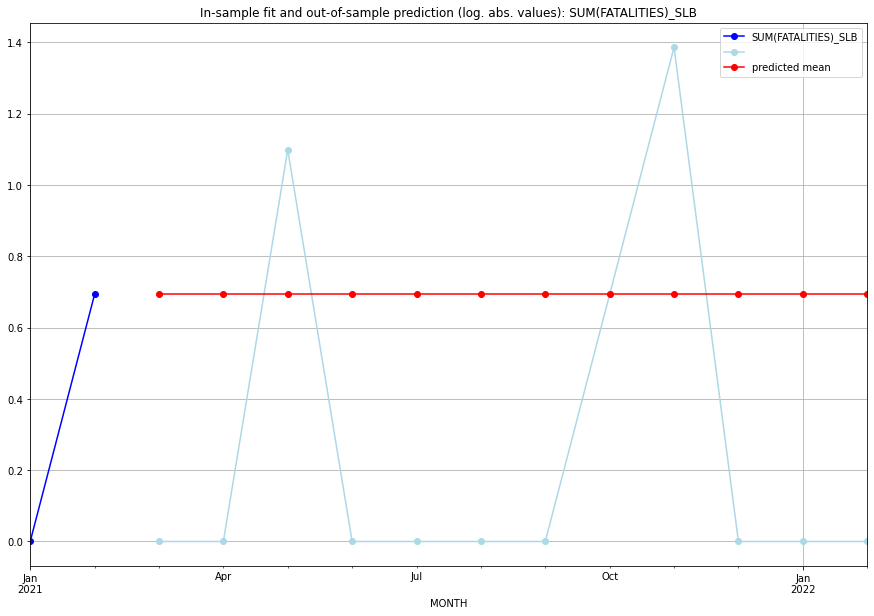

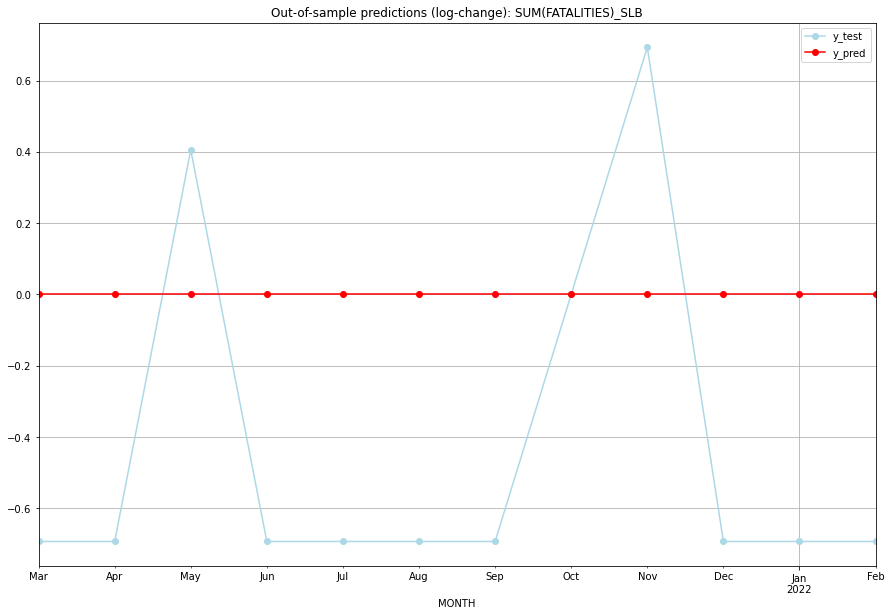

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  0.693147    0.000000           0.0       -0.693147
1   2021-04  0.693147    0.000000           0.0       -0.693147
2   2021-05  0.693147    1.098612           0.0        0.405465
3   2021-06  0.693147    0.000000           0.0       -0.693147
4   2021-07  0.693147    0.000000           0.0       -0.693147
5   2021-08  0.693147    0.000000           0.0       -0.693147
6   2021-09  0.693147    0.000000           0.0       -0.693147
7   2021-10  0.693147    0.693147           0.0        0.000000
8   2021-11  0.693147    1.386294           0.0        0.693147
9   2021-12  0.693147    0.000000           0.0       -0.693147
10  2022-01  0.693147    0.000000           0.0       -0.693147
11  2022-02  0.693147    0.000000           0.0       -0.693147
TADDA: 0.6114114094756348
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  0.693147    0.000000           0.0

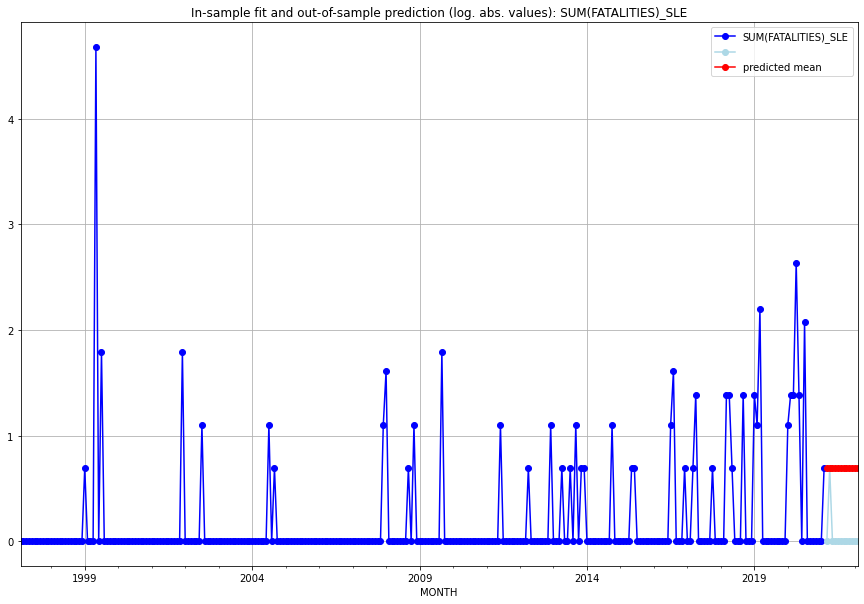

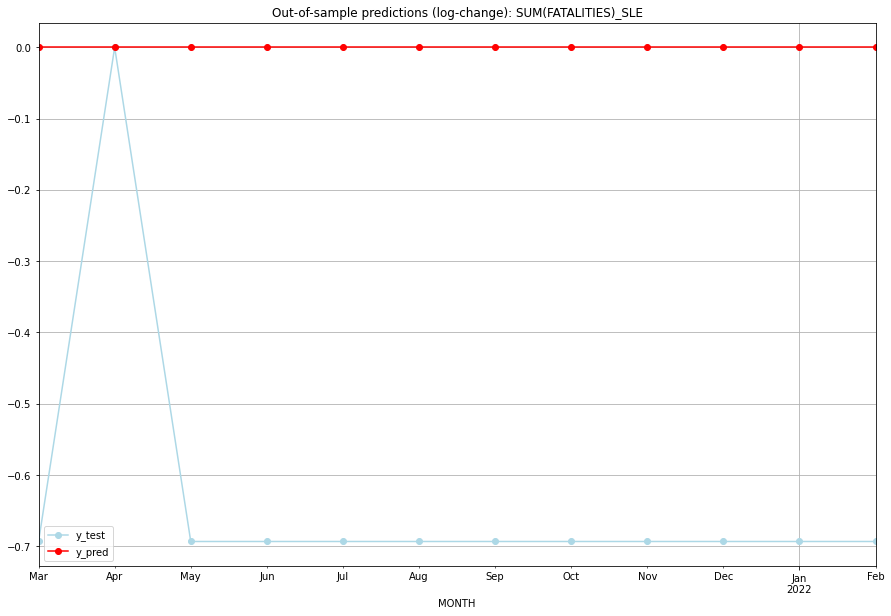

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  0.693147    0.000000           0.0       -0.693147
1   2021-04  0.693147    0.693147           0.0        0.000000
2   2021-05  0.693147    0.000000           0.0       -0.693147
3   2021-06  0.693147    0.000000           0.0       -0.693147
4   2021-07  0.693147    0.000000           0.0       -0.693147
5   2021-08  0.693147    0.000000           0.0       -0.693147
6   2021-09  0.693147    0.000000           0.0       -0.693147
7   2021-10  0.693147    0.000000           0.0       -0.693147
8   2021-11  0.693147    0.000000           0.0       -0.693147
9   2021-12  0.693147    0.000000           0.0       -0.693147
10  2022-01  0.693147    0.000000           0.0       -0.693147
11  2022-02  0.693147    0.000000           0.0       -0.693147
TADDA: 0.6353849155132832
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  0.693147    0.000000           0.0

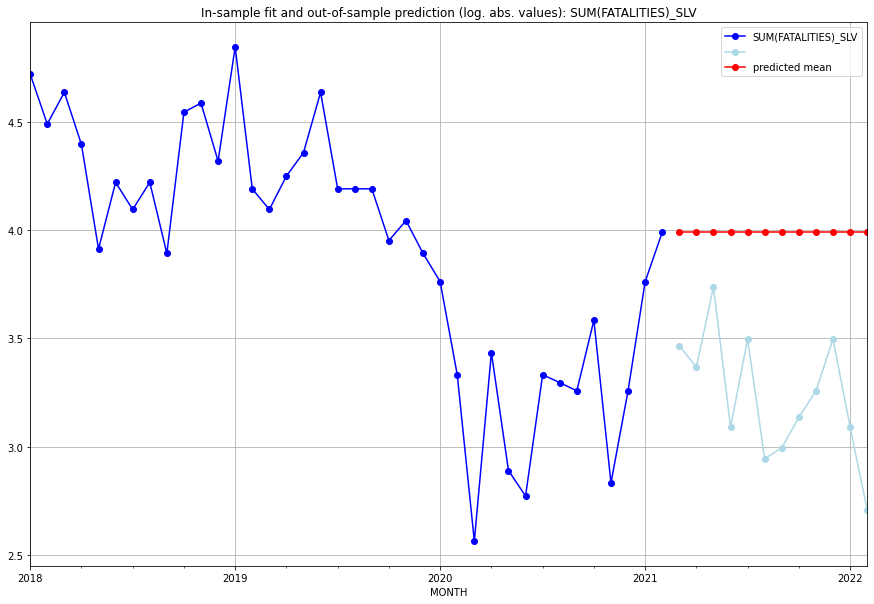

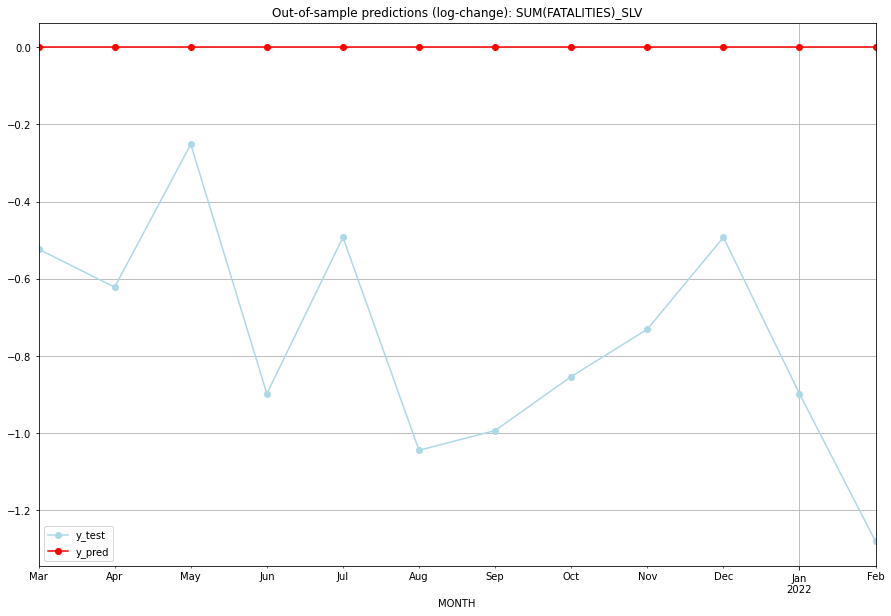

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  3.988984    3.465736           0.0       -0.523248
1   2021-04  3.988984    3.367296           0.0       -0.621688
2   2021-05  3.988984    3.737670           0.0       -0.251314
3   2021-06  3.988984    3.091042           0.0       -0.897942
4   2021-07  3.988984    3.496508           0.0       -0.492476
5   2021-08  3.988984    2.944439           0.0       -1.044545
6   2021-09  3.988984    2.995732           0.0       -0.993252
7   2021-10  3.988984    3.135494           0.0       -0.853490
8   2021-11  3.988984    3.258097           0.0       -0.730888
9   2021-12  3.988984    3.496508           0.0       -0.492476
10  2022-01  3.988984    3.091042           0.0       -0.897942
11  2022-02  3.988984    2.708050           0.0       -1.280934
TADDA: 0.7566829141899051
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  3.988984    3.465736           0.0

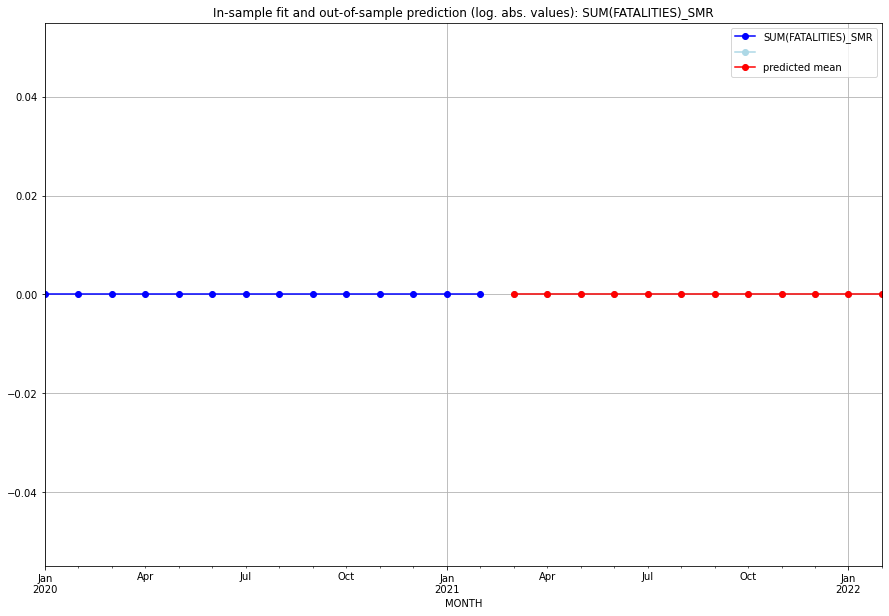

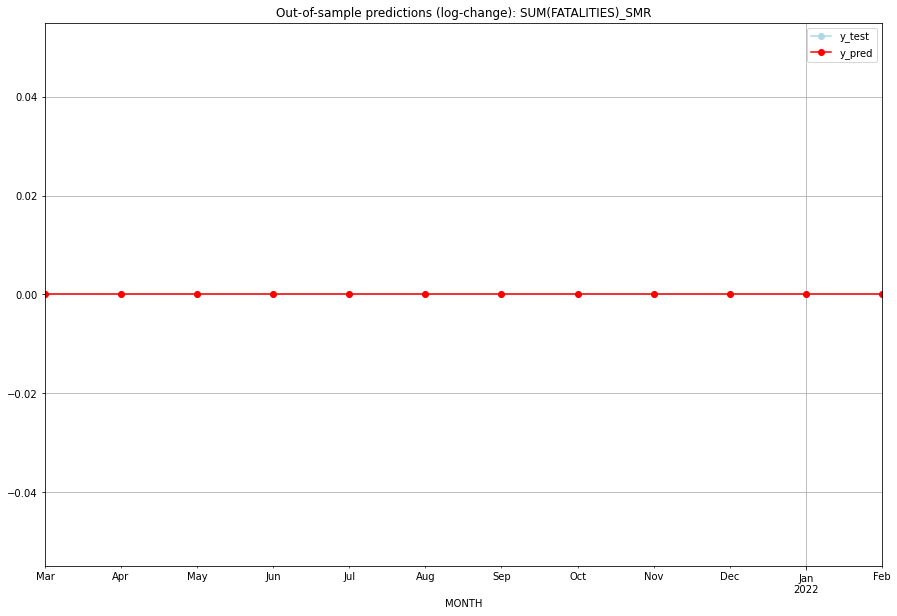

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

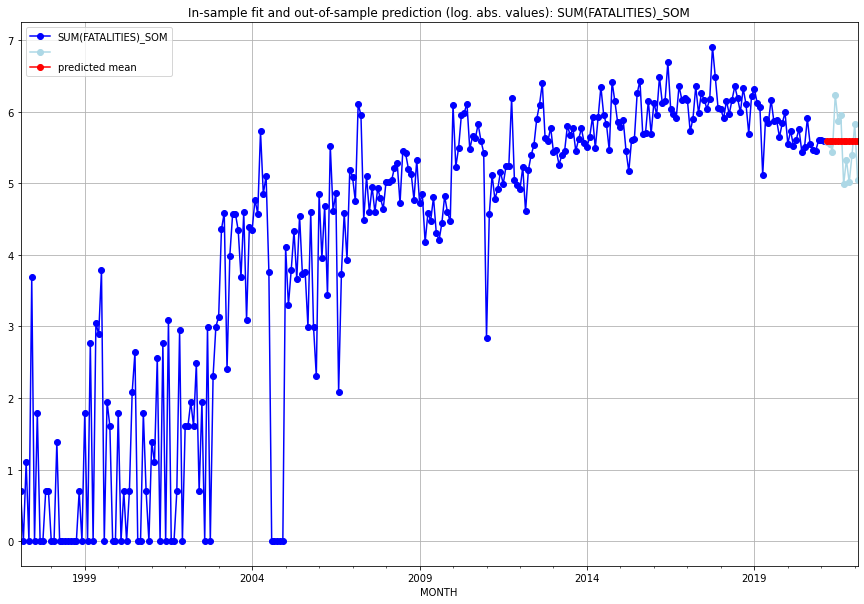

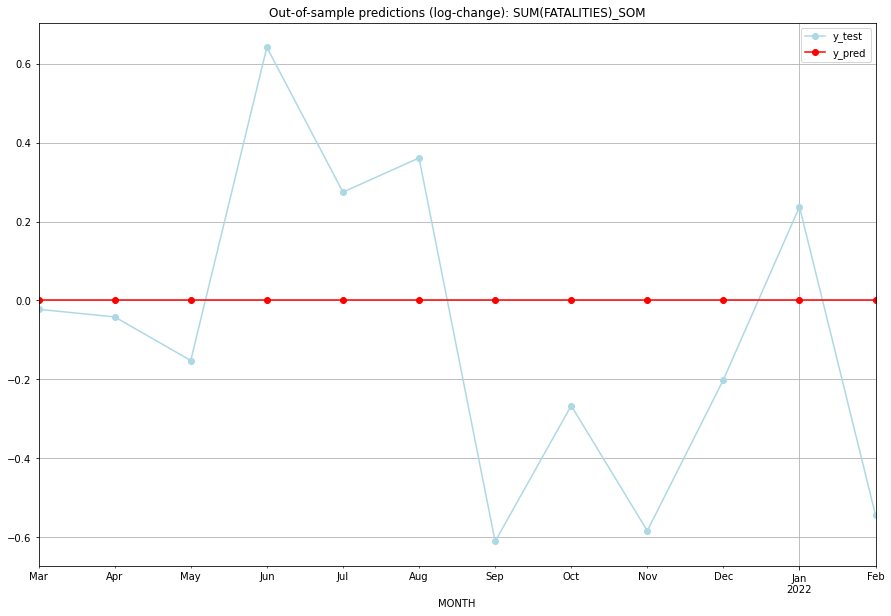

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  5.594711    5.572154           0.0       -0.022557
1   2021-04  5.594711    5.552960           0.0       -0.041752
2   2021-05  5.594711    5.442418           0.0       -0.152294
3   2021-06  5.594711    6.236370           0.0        0.641658
4   2021-07  5.594711    5.869297           0.0        0.274586
5   2021-08  5.594711    5.955837           0.0        0.361126
6   2021-09  5.594711    4.983607           0.0       -0.611105
7   2021-10  5.594711    5.327876           0.0       -0.266835
8   2021-11  5.594711    5.010635           0.0       -0.584076
9   2021-12  5.594711    5.393628           0.0       -0.201084
10  2022-01  5.594711    5.831882           0.0        0.237171
11  2022-02  5.594711    5.049856           0.0       -0.544855
TADDA: 0.3282582418896612
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  5.594711    5.572154           0.0

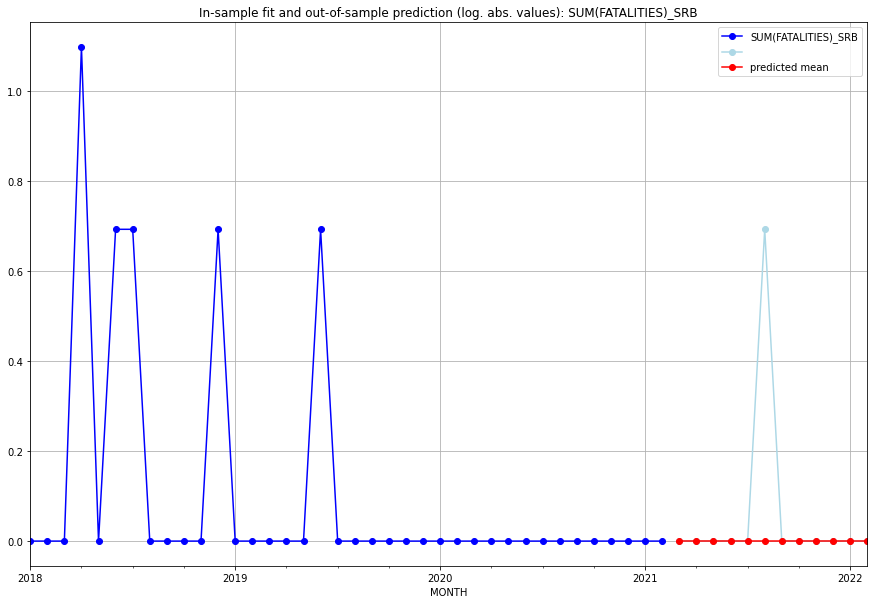

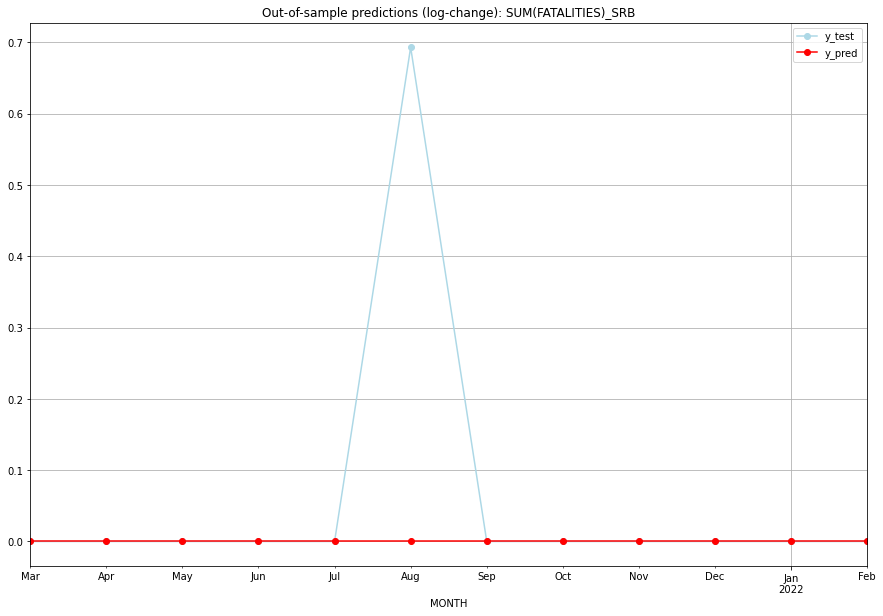

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.693147           0.0        0.693147
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0

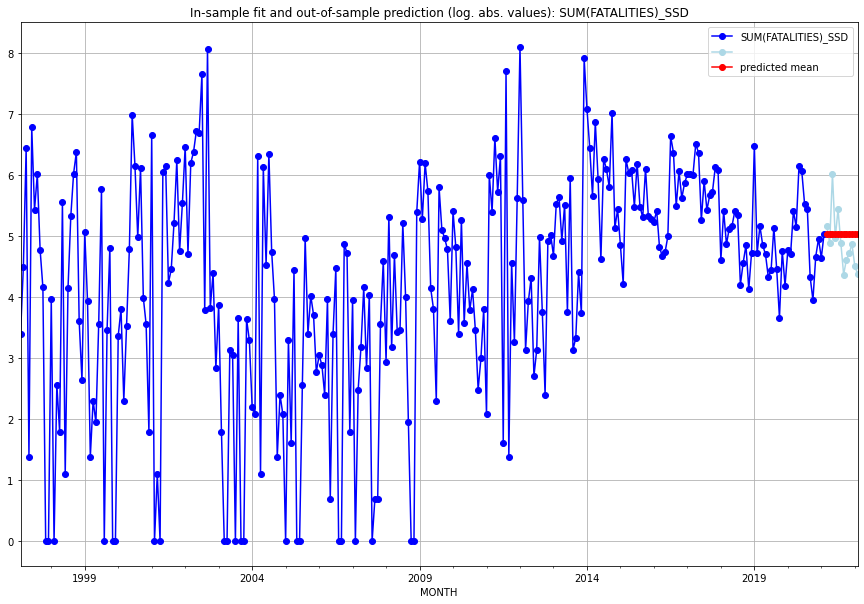

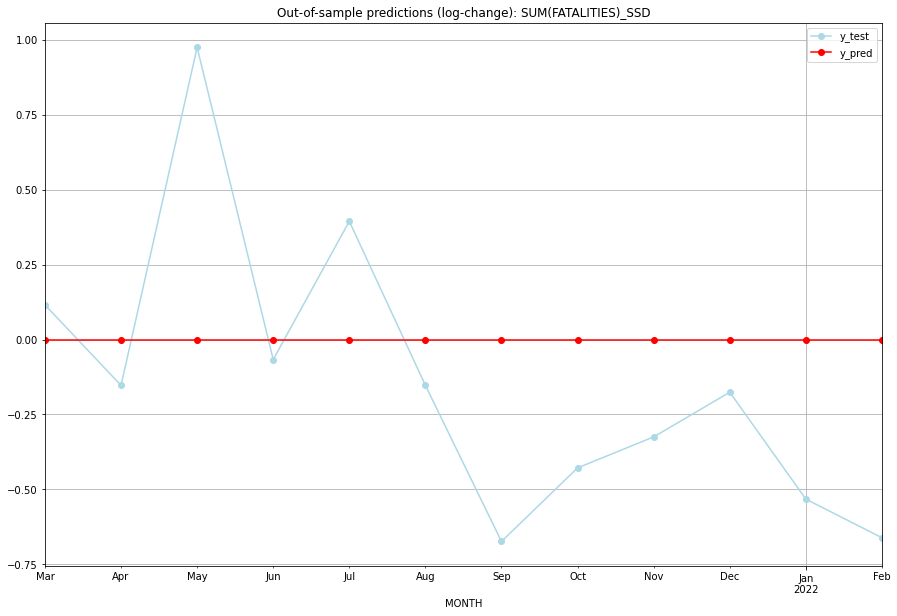

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  5.043425    5.159055           0.0        0.115630
1   2021-04  5.043425    4.890349           0.0       -0.153076
2   2021-05  5.043425    6.018593           0.0        0.975168
3   2021-06  5.043425    4.976734           0.0       -0.066691
4   2021-07  5.043425    5.438079           0.0        0.394654
5   2021-08  5.043425    4.890349           0.0       -0.153076
6   2021-09  5.043425    4.369448           0.0       -0.673977
7   2021-10  5.043425    4.615121           0.0       -0.428305
8   2021-11  5.043425    4.718499           0.0       -0.324926
9   2021-12  5.043425    4.867534           0.0       -0.175891
10  2022-01  5.043425    4.510860           0.0       -0.532566
11  2022-02  5.043425    4.382027           0.0       -0.661398
TADDA: 0.38794655775297243
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  5.043425    5.159055           0.

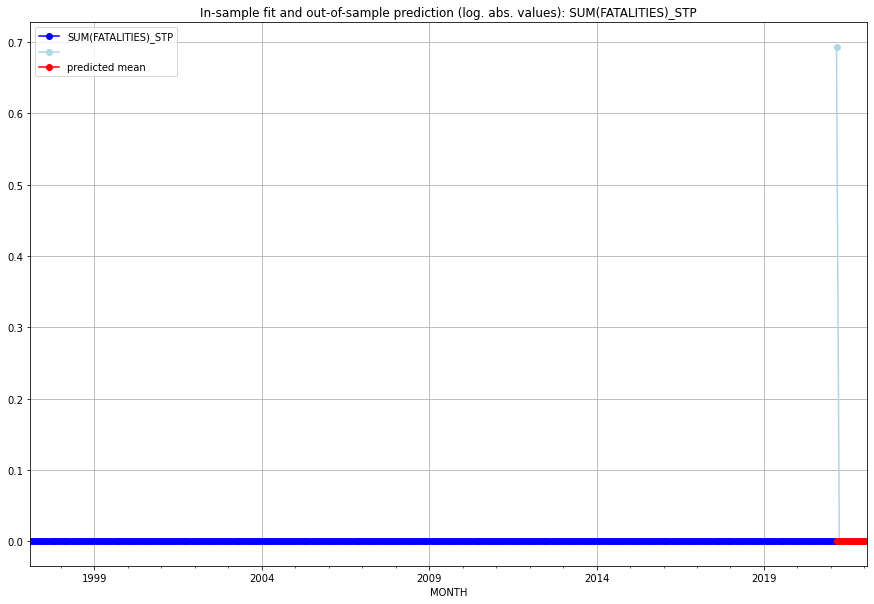

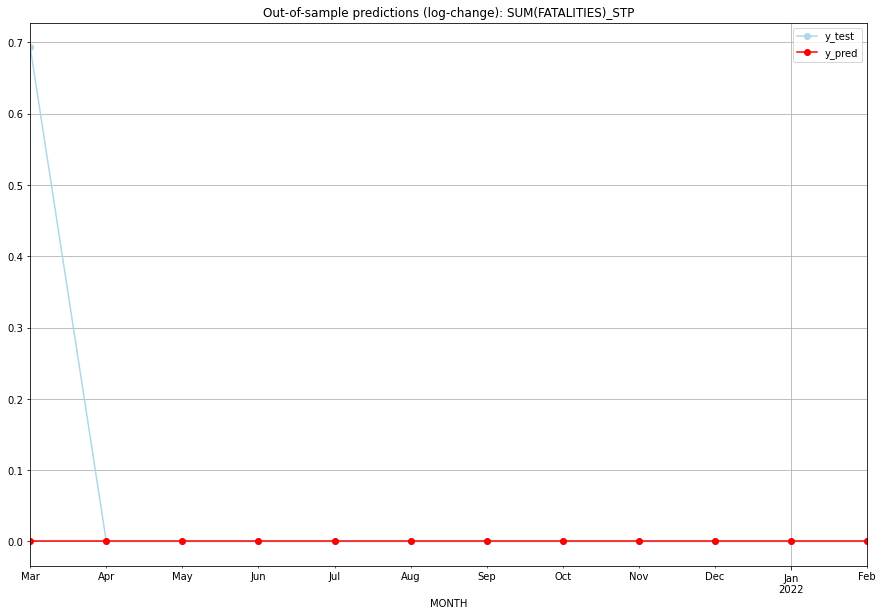

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.693147           0.0        0.693147
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.057762265046662105
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.693147           0

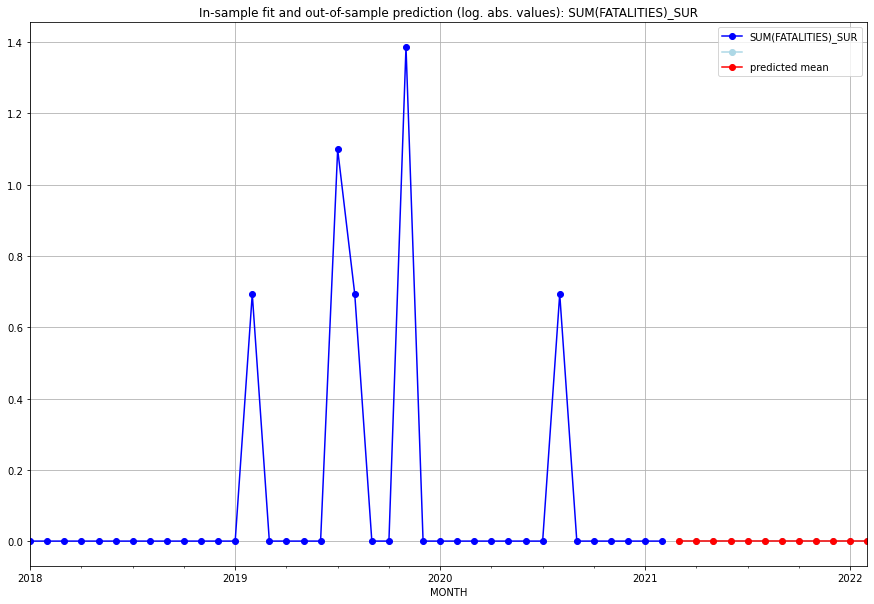

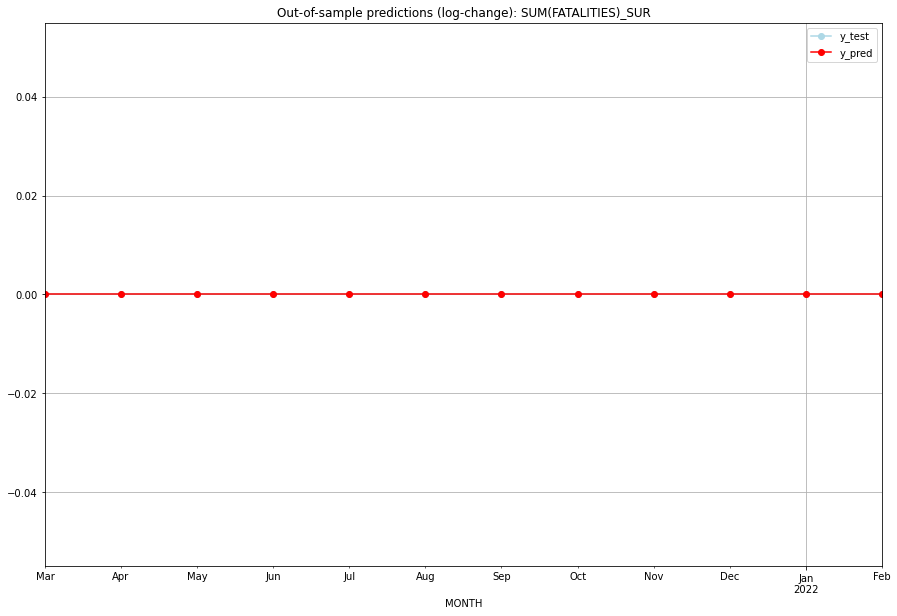

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

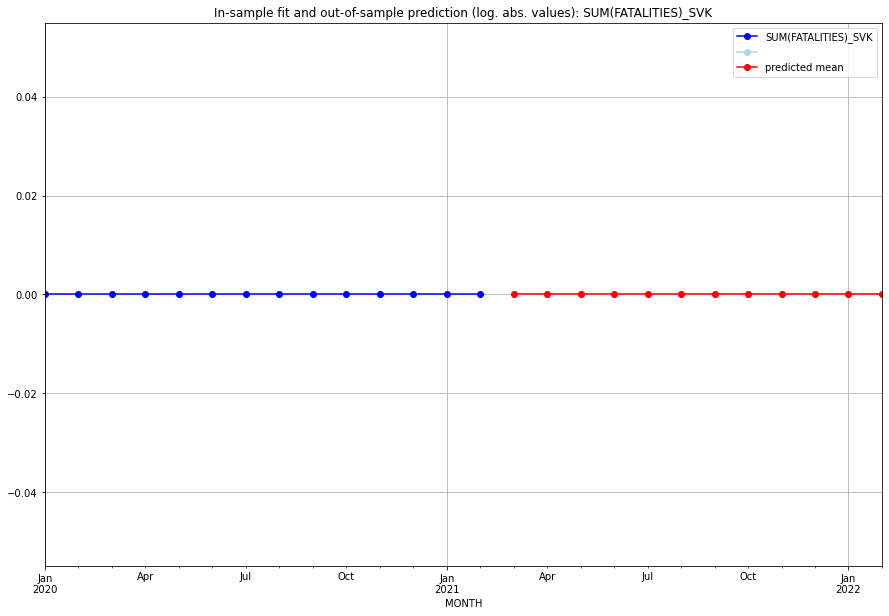

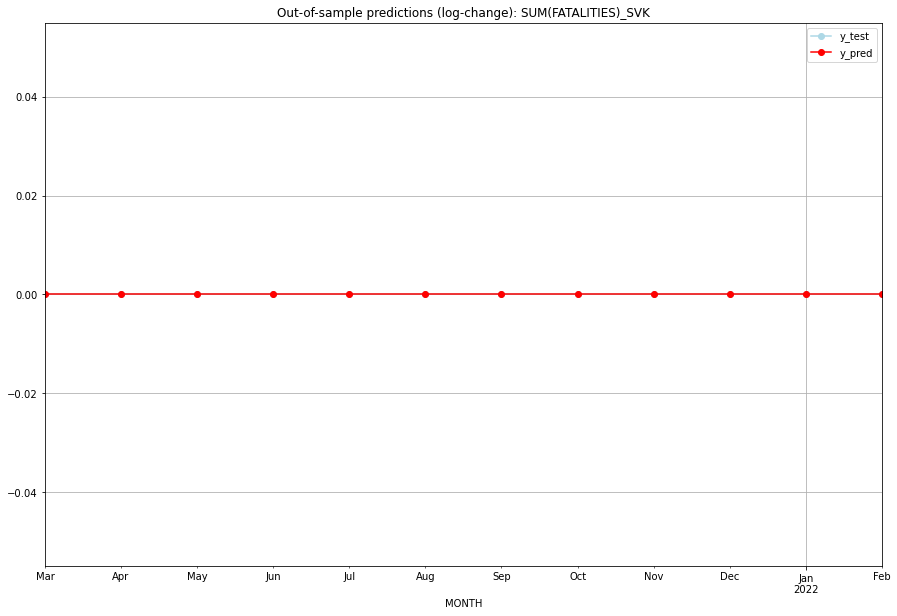

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

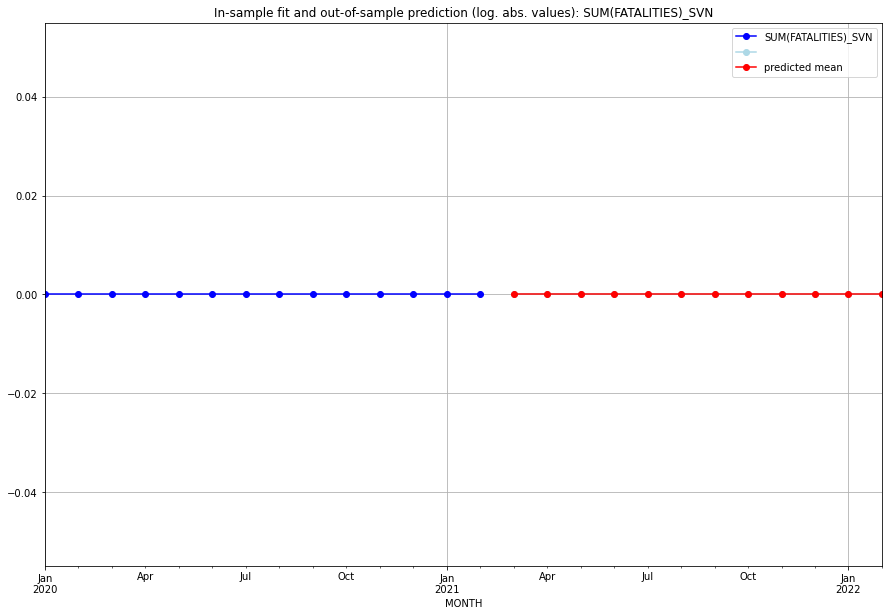

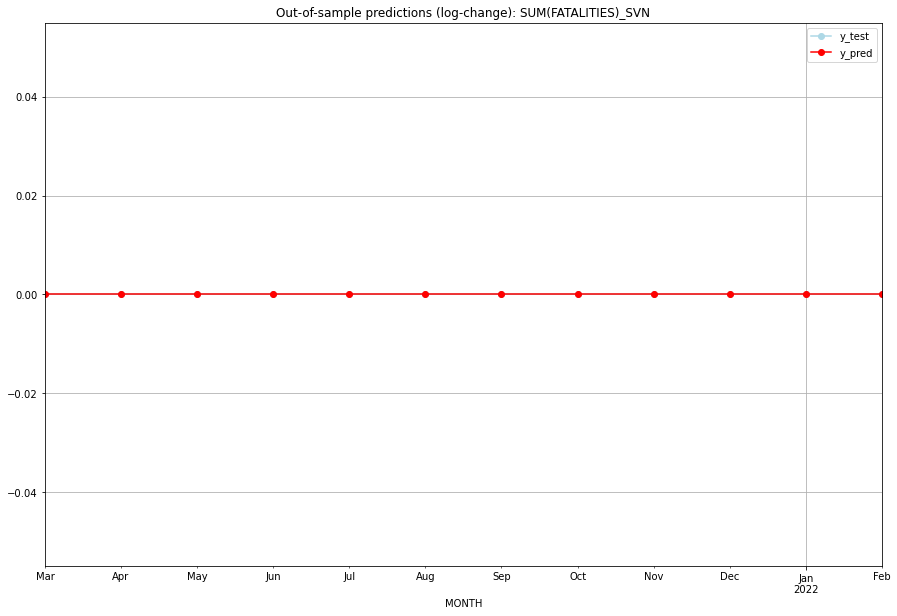

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

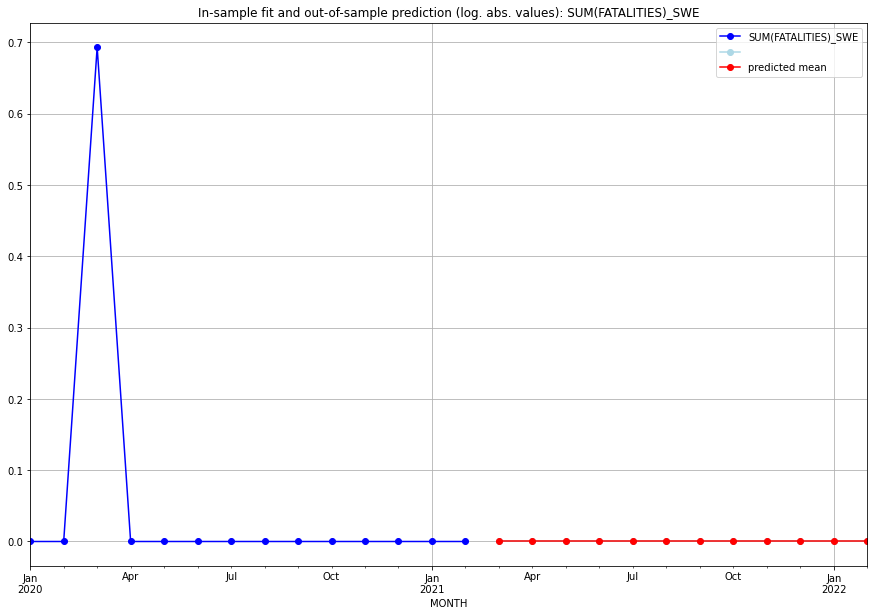

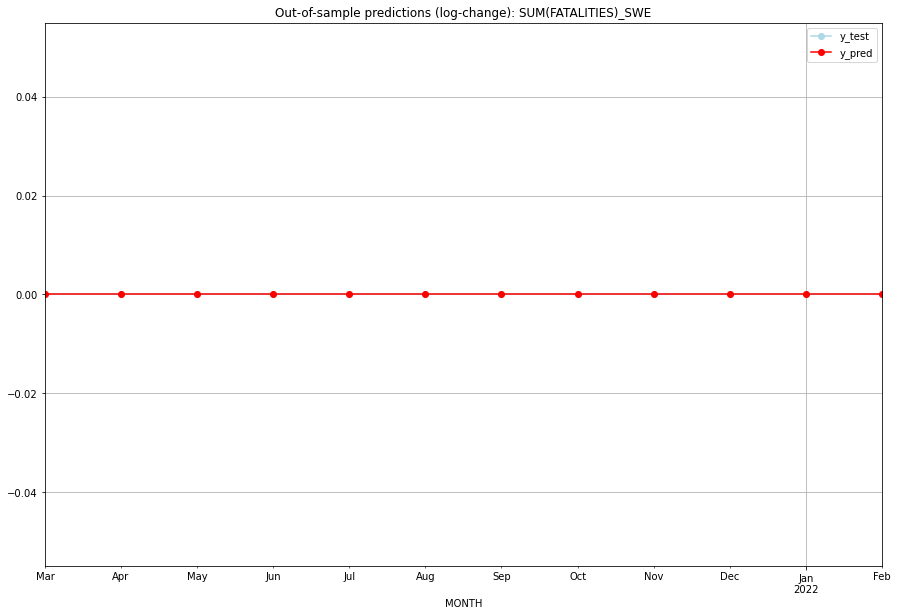

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

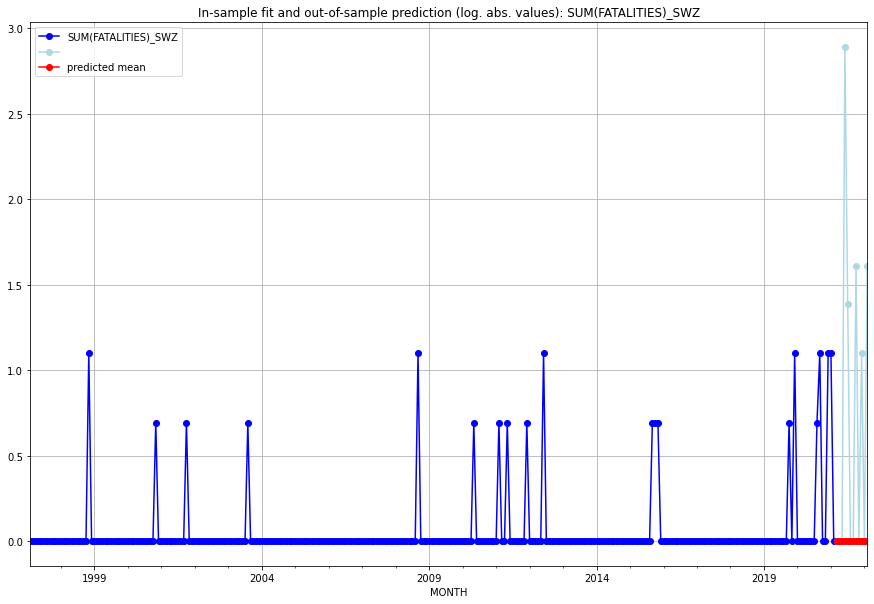

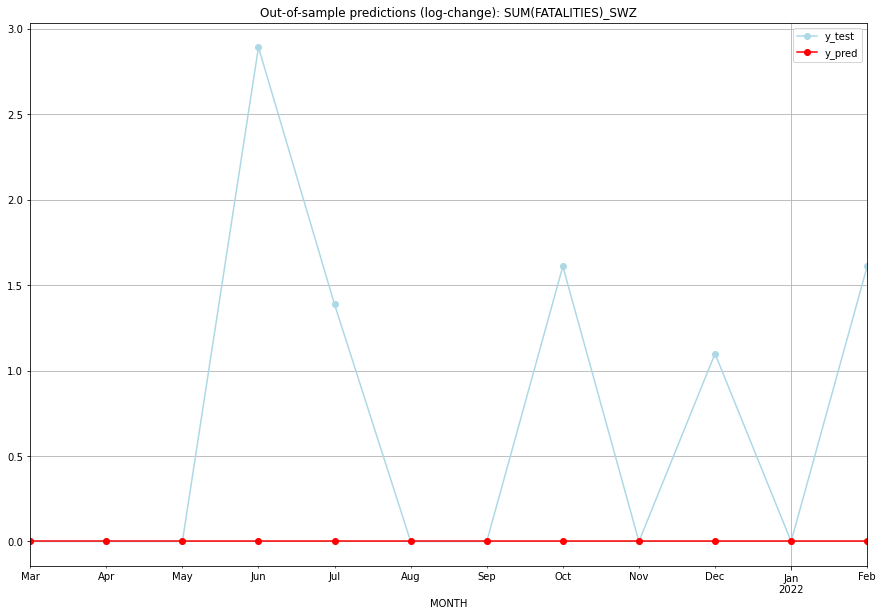

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    2.890372           0.0        2.890372
4   2021-07       0.0    1.386294           0.0        1.386294
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    1.609438           0.0        1.609438
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    1.098612           0.0        1.098612
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    1.609438           0.0        1.609438
TADDA: 0.7161795193793639
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0

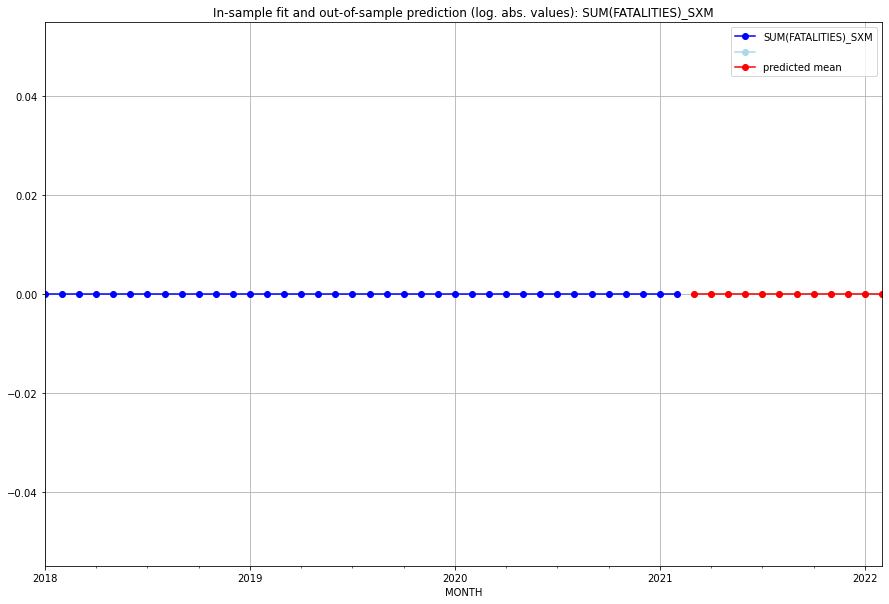

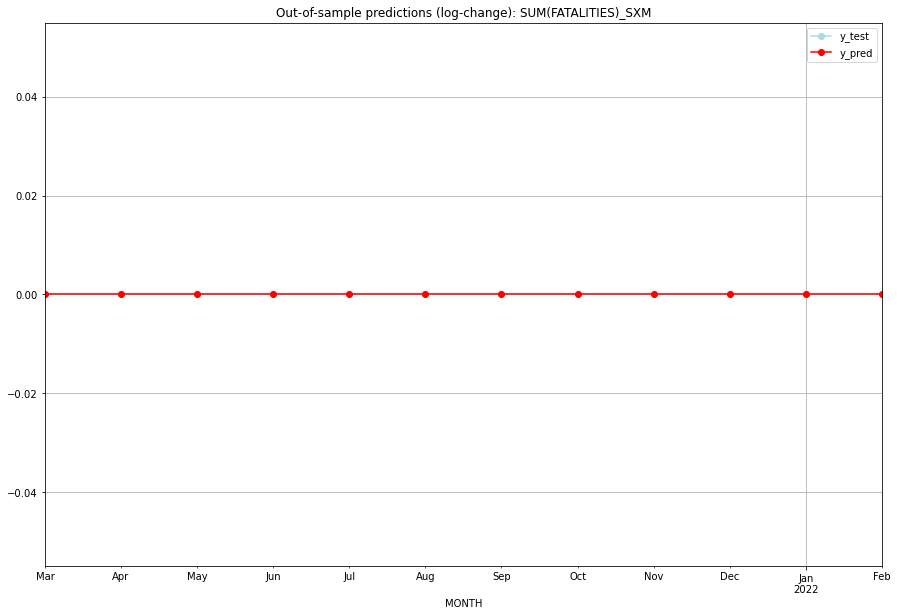

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

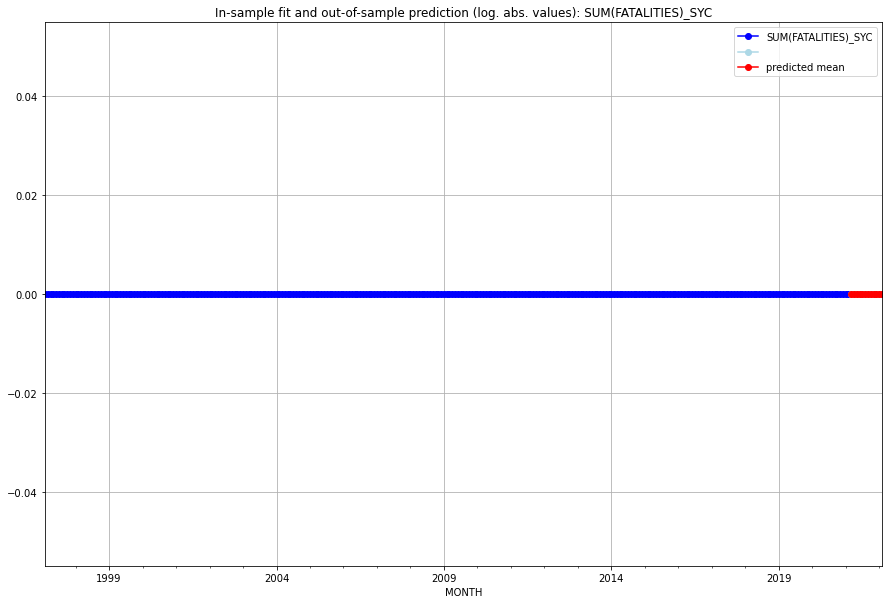

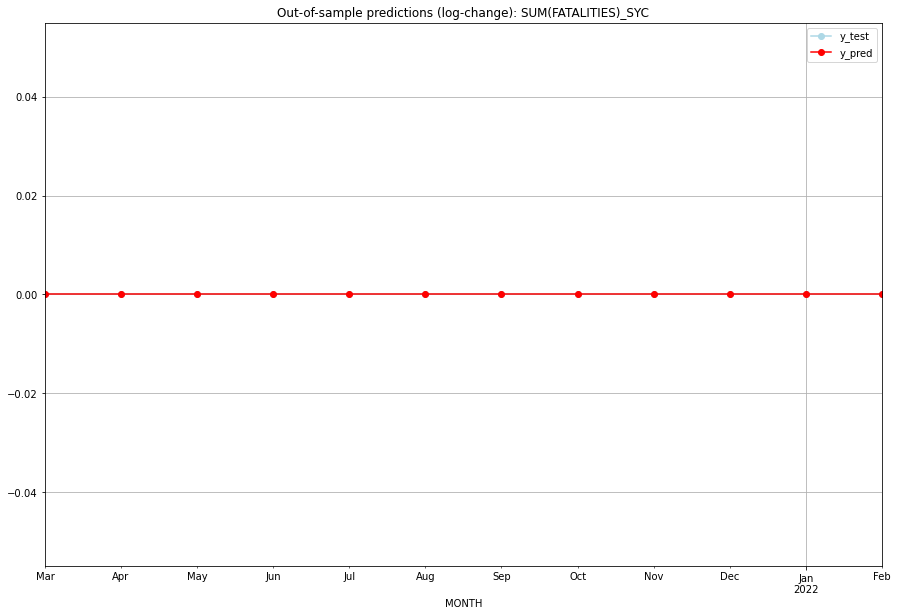

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

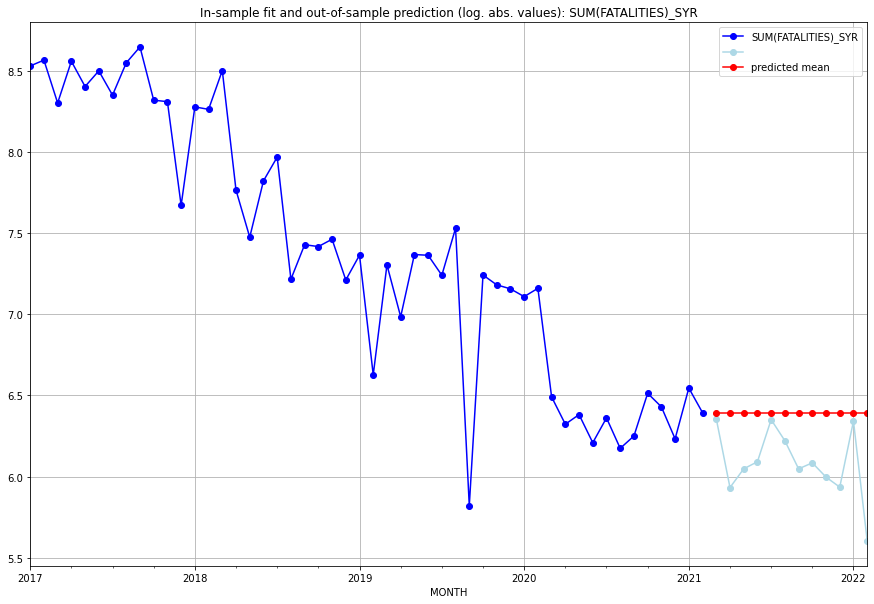

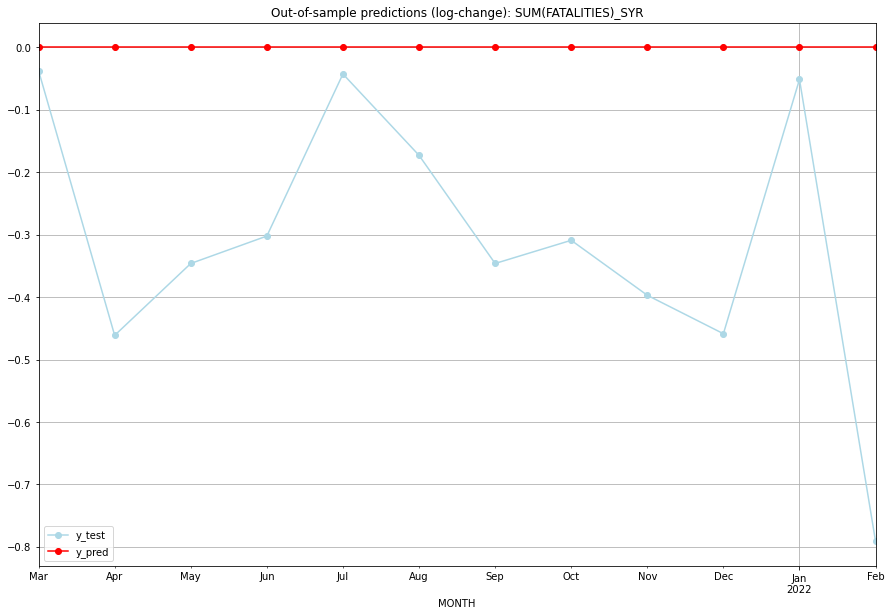

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  6.393591    6.356108           0.0       -0.037483
1   2021-04  6.393591    5.932245           0.0       -0.461346
2   2021-05  6.393591    6.047372           0.0       -0.346219
3   2021-06  6.393591    6.091310           0.0       -0.302281
4   2021-07  6.393591    6.350886           0.0       -0.042705
5   2021-08  6.393591    6.220590           0.0       -0.173001
6   2021-09  6.393591    6.047372           0.0       -0.346219
7   2021-10  6.393591    6.084499           0.0       -0.309091
8   2021-11  6.393591    5.996452           0.0       -0.397139
9   2021-12  6.393591    5.934894           0.0       -0.458697
10  2022-01  6.393591    6.342121           0.0       -0.051469
11  2022-02  6.393591    5.602119           0.0       -0.791472
TADDA: 0.3097600112803589
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  6.393591    6.356108           0.0

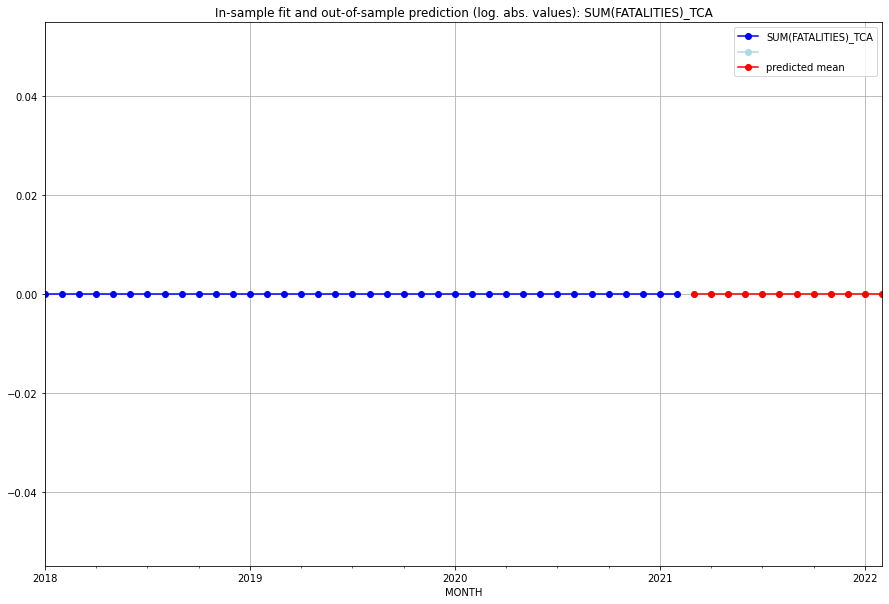

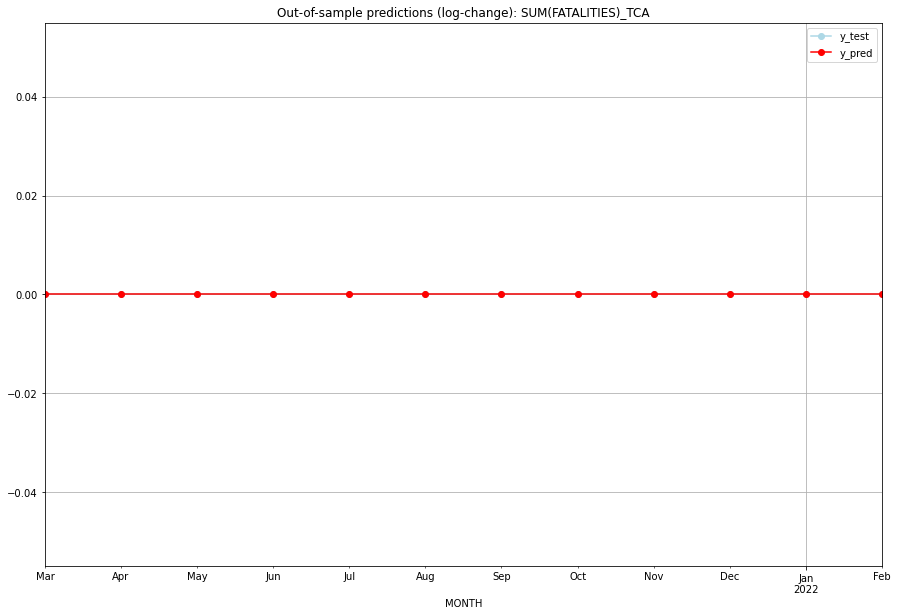

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

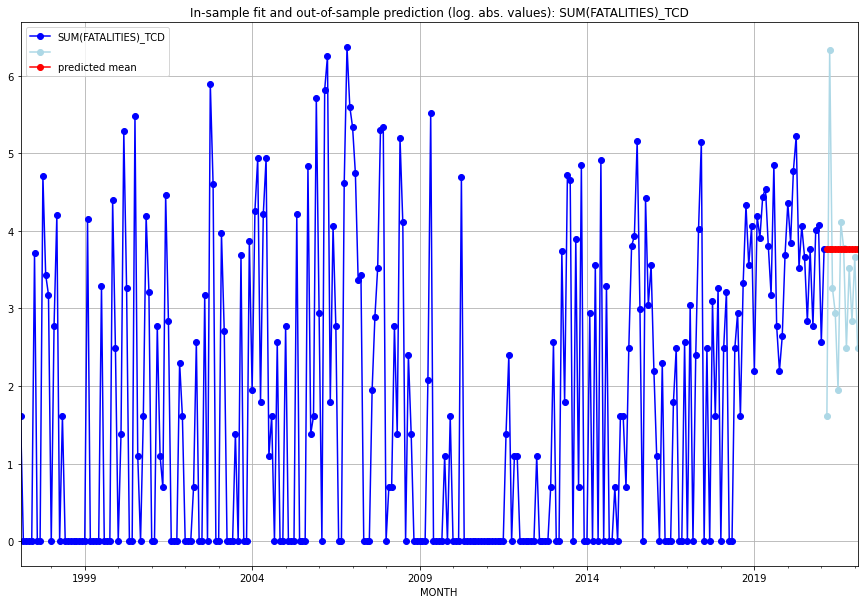

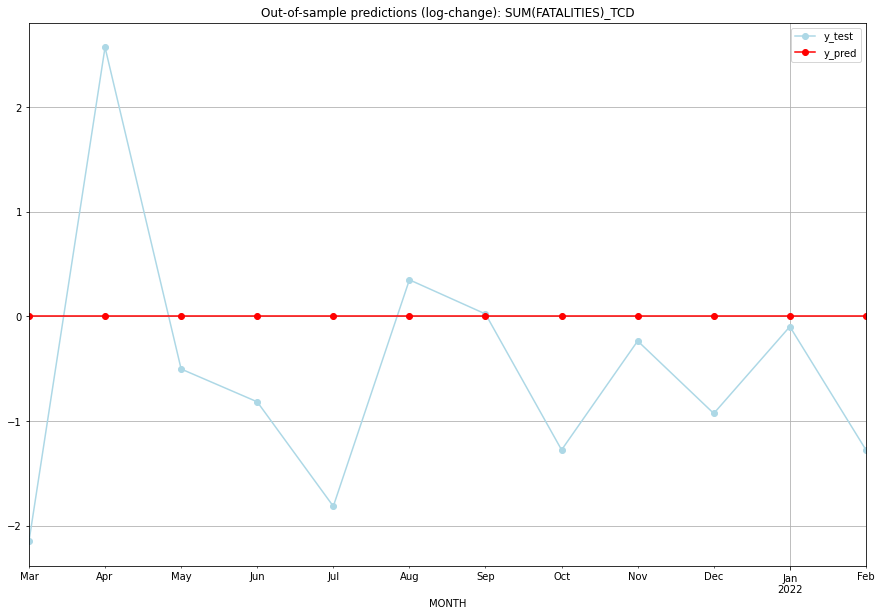

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03    3.7612    1.609438           0.0       -2.151762
1   2021-04    3.7612    6.333280           0.0        2.572080
2   2021-05    3.7612    3.258097           0.0       -0.503104
3   2021-06    3.7612    2.944439           0.0       -0.816761
4   2021-07    3.7612    1.945910           0.0       -1.815290
5   2021-08    3.7612    4.110874           0.0        0.349674
6   2021-09    3.7612    3.784190           0.0        0.022990
7   2021-10    3.7612    2.484907           0.0       -1.276293
8   2021-11    3.7612    3.526361           0.0       -0.234840
9   2021-12    3.7612    2.833213           0.0       -0.927987
10  2022-01    3.7612    3.663562           0.0       -0.097638
11  2022-02    3.7612    2.484907           0.0       -1.276293
TADDA: 1.0037259522781061
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01    3.7612    1.609438           0.0

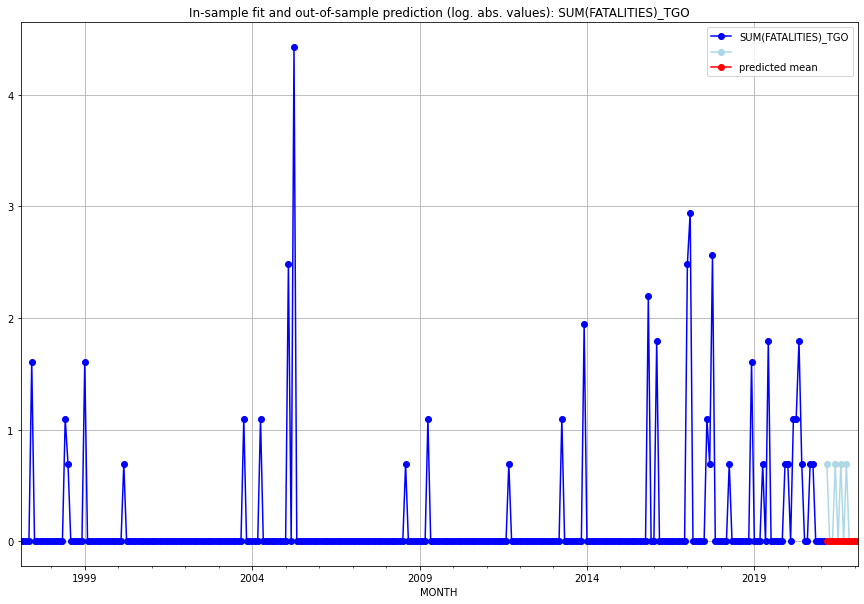

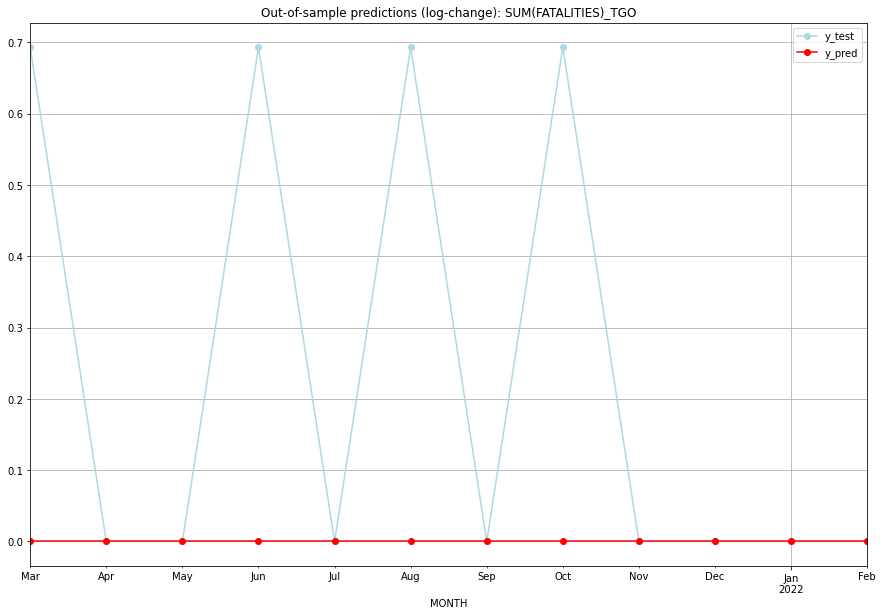

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.693147           0.0        0.693147
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.693147           0.0        0.693147
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.693147           0.0        0.693147
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.693147           0.0        0.693147
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.23104906018664842
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.693147           0.

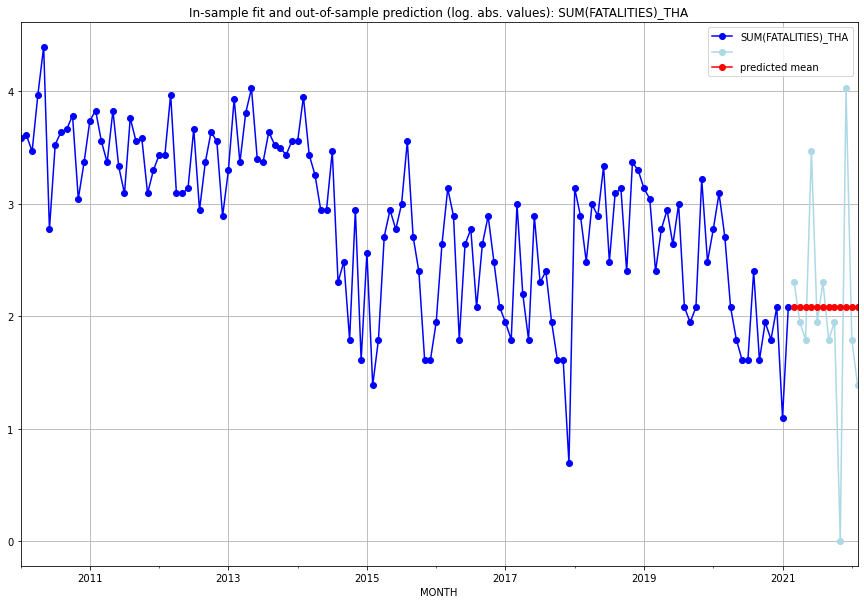

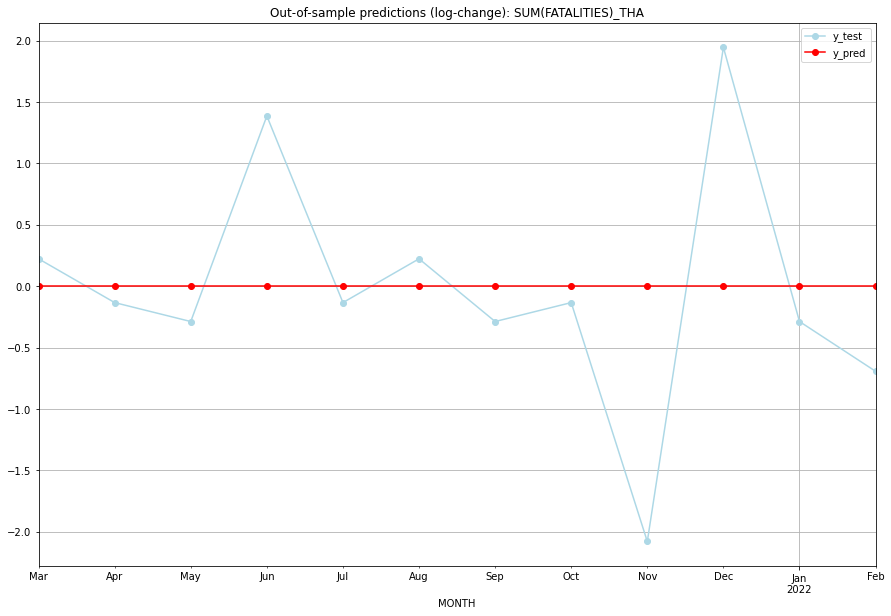

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  2.079442    2.302585           0.0        0.223144
1   2021-04  2.079442    1.945910           0.0       -0.133531
2   2021-05  2.079442    1.791759           0.0       -0.287682
3   2021-06  2.079442    3.465736           0.0        1.386294
4   2021-07  2.079442    1.945910           0.0       -0.133531
5   2021-08  2.079442    2.302585           0.0        0.223144
6   2021-09  2.079442    1.791759           0.0       -0.287682
7   2021-10  2.079442    1.945910           0.0       -0.133531
8   2021-11  2.079442    0.000000           0.0       -2.079442
9   2021-12  2.079442    4.025352           0.0        1.945910
10  2022-01  2.079442    1.791759           0.0       -0.287682
11  2022-02  2.079442    1.386294           0.0       -0.693147
TADDA: 0.6512267275226932
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  2.079442    2.302585           0.0

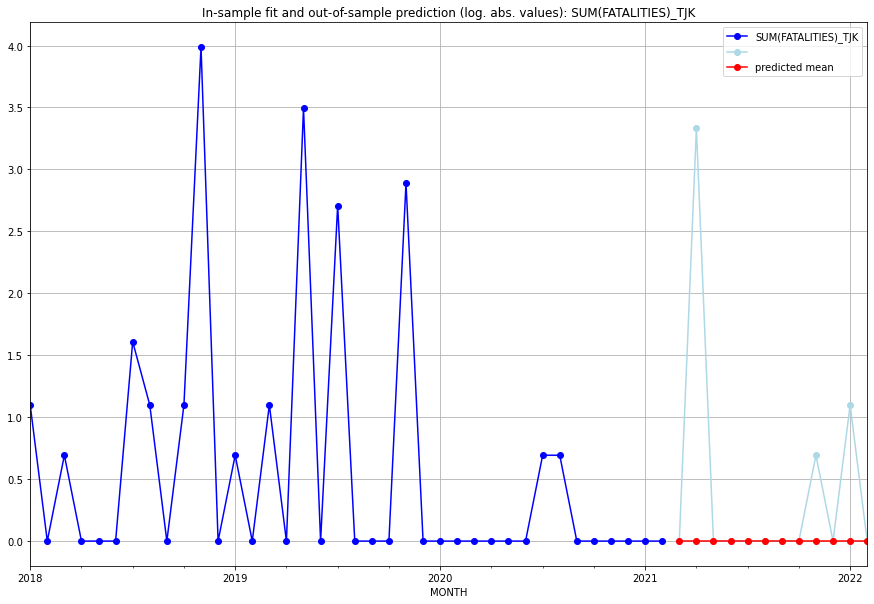

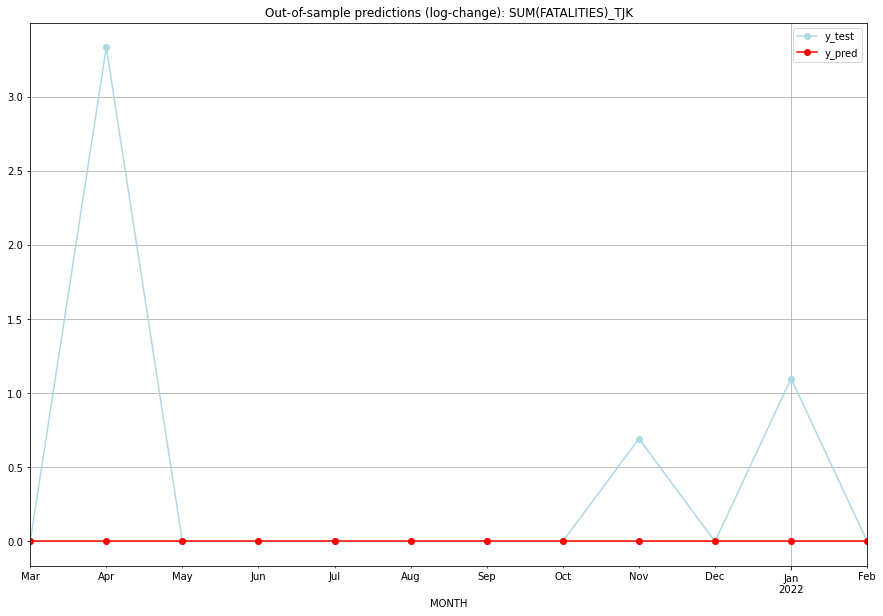

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    3.332205           0.0        3.332205
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.693147           0.0        0.693147
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    1.098612           0.0        1.098612
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.4269969982836049
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0

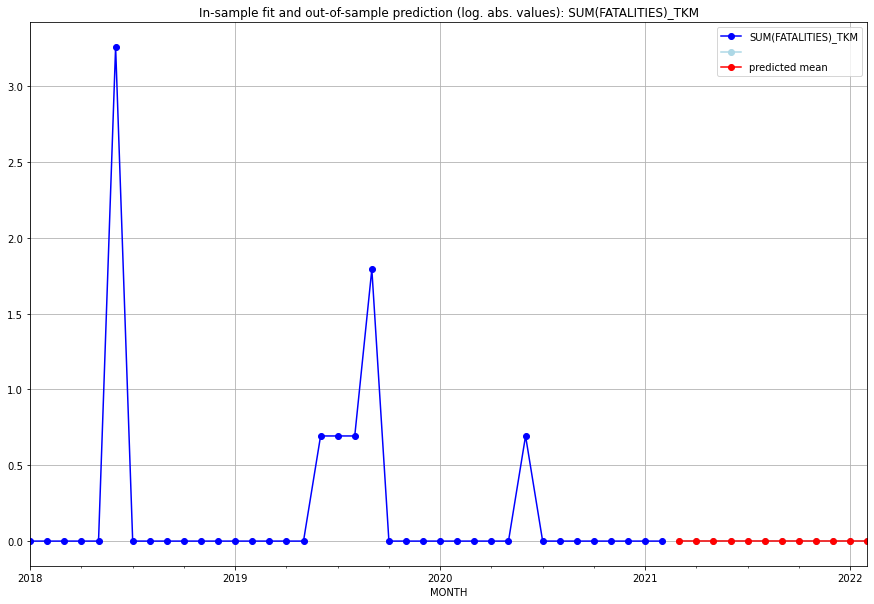

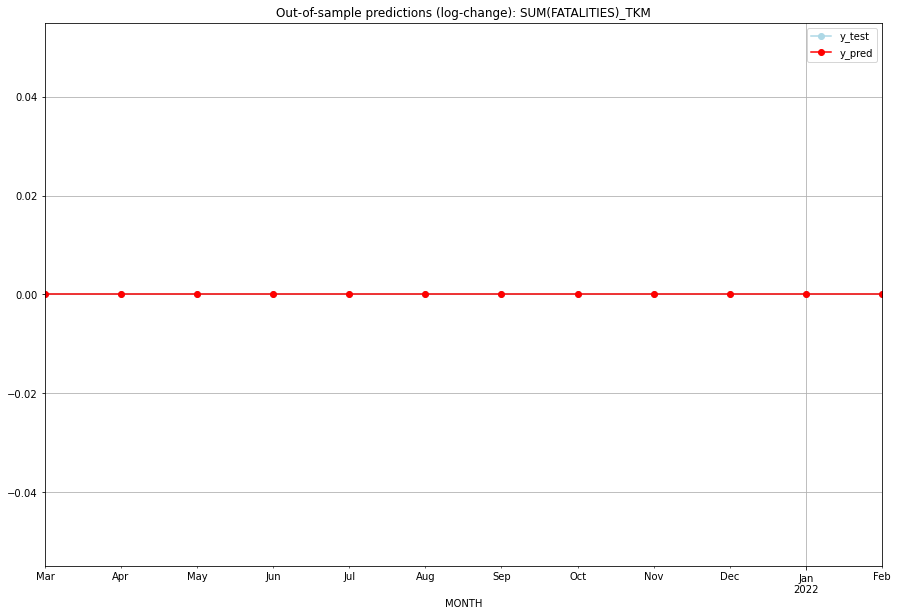

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

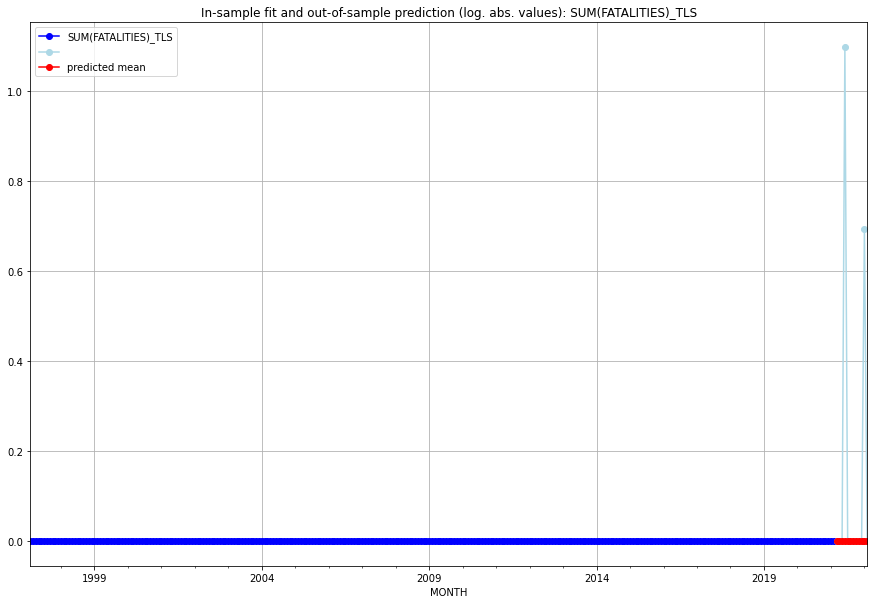

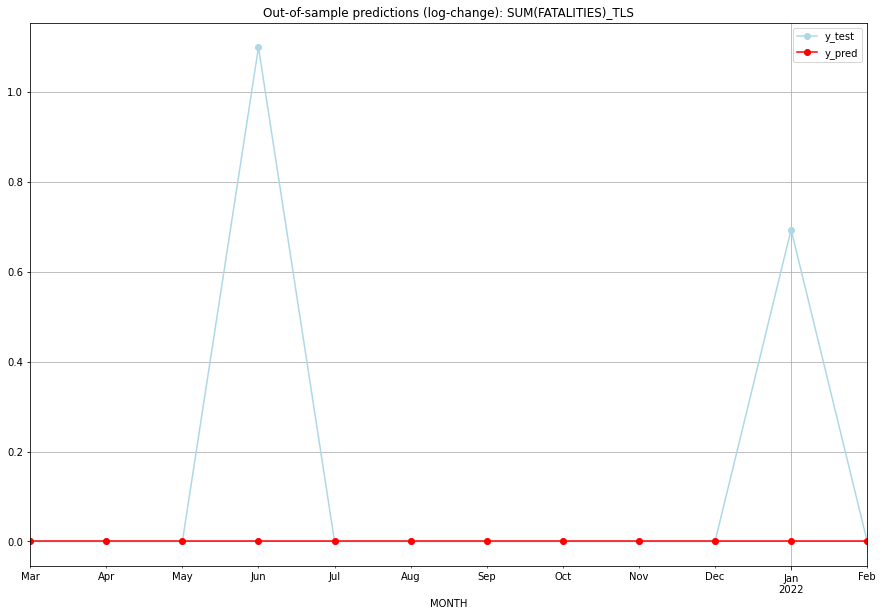

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    1.098612           0.0        1.098612
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.693147           0.0        0.693147
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.1493132891023379
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.0

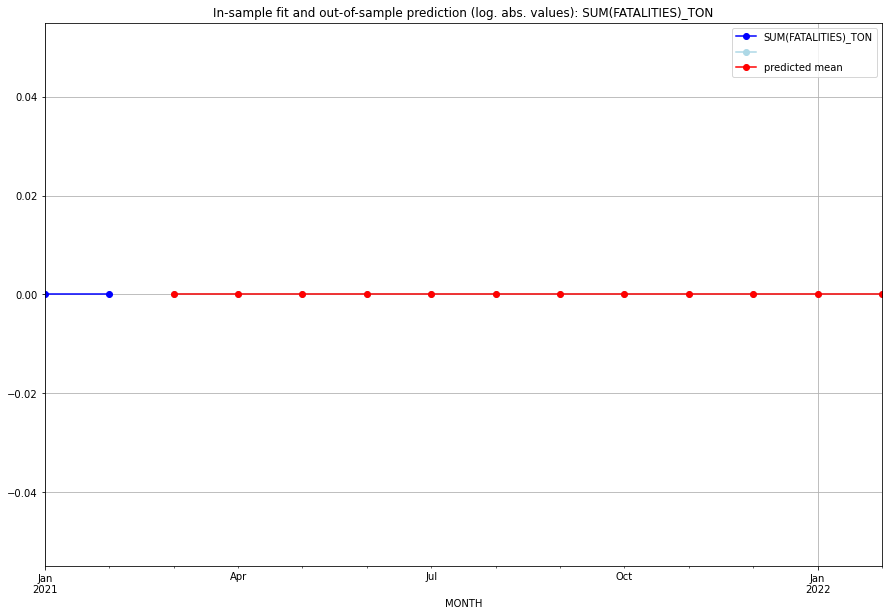

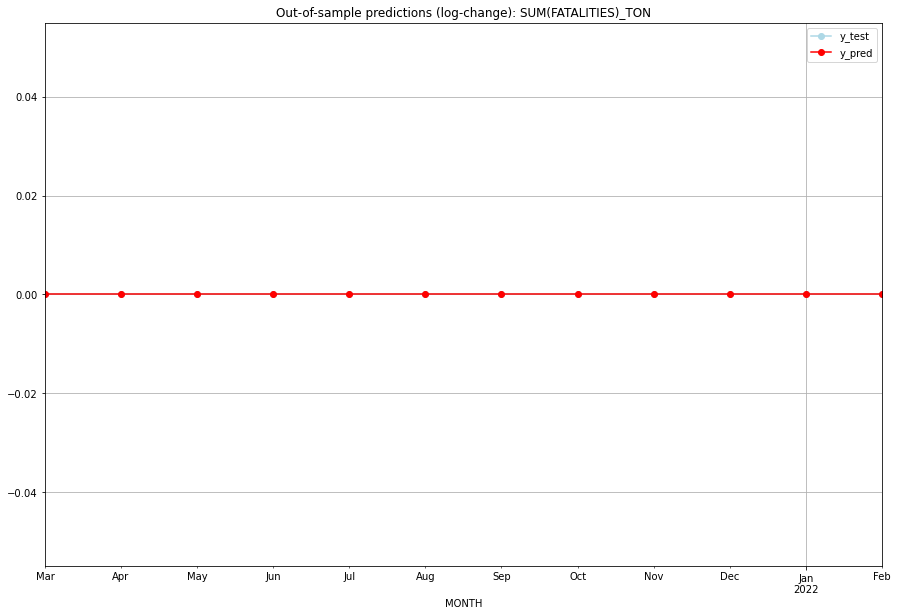

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

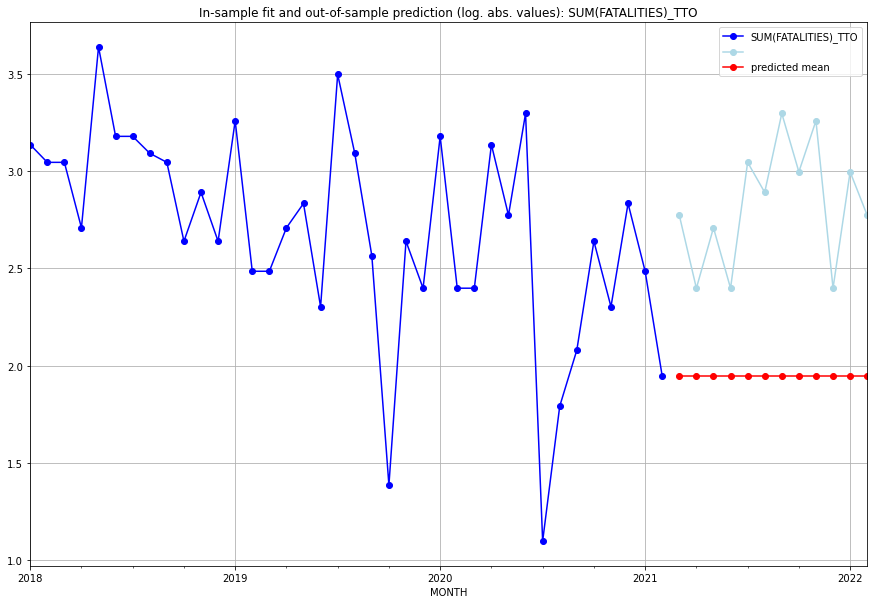

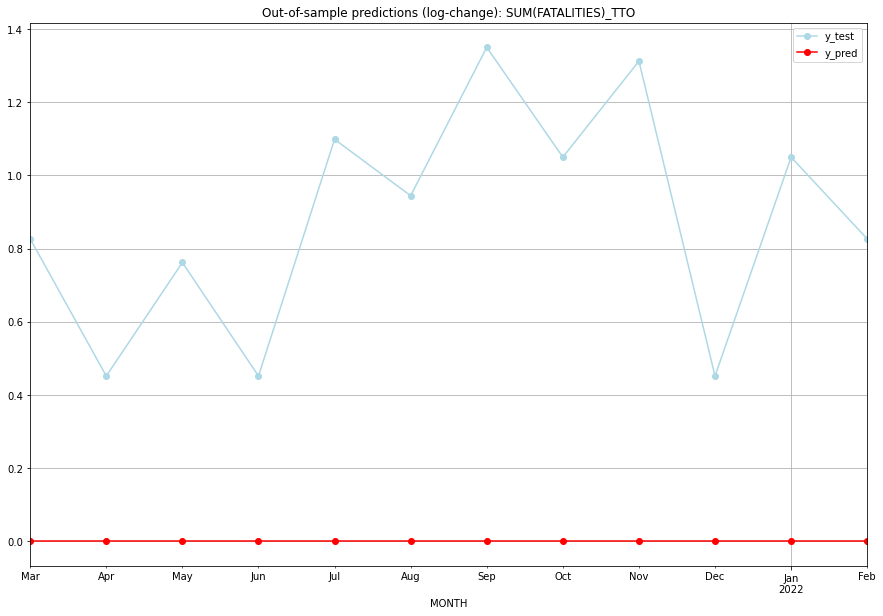

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03   1.94591    2.772589           0.0        0.826679
1   2021-04   1.94591    2.397895           0.0        0.451985
2   2021-05   1.94591    2.708050           0.0        0.762140
3   2021-06   1.94591    2.397895           0.0        0.451985
4   2021-07   1.94591    3.044522           0.0        1.098612
5   2021-08   1.94591    2.890372           0.0        0.944462
6   2021-09   1.94591    3.295837           0.0        1.349927
7   2021-10   1.94591    2.995732           0.0        1.049822
8   2021-11   1.94591    3.258097           0.0        1.312186
9   2021-12   1.94591    2.397895           0.0        0.451985
10  2022-01   1.94591    2.995732           0.0        1.049822
11  2022-02   1.94591    2.772589           0.0        0.826679
TADDA: 0.8813569851722093
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01   1.94591    2.772589           0.0

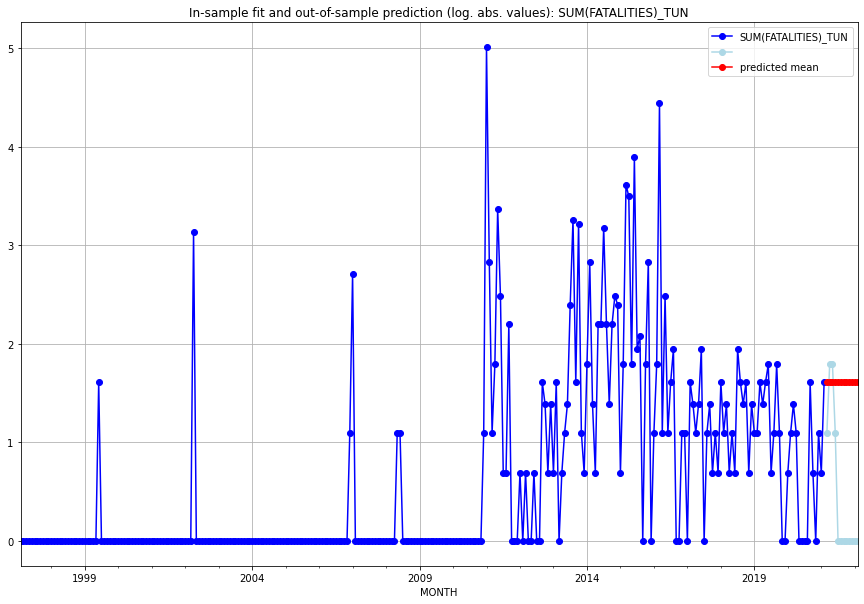

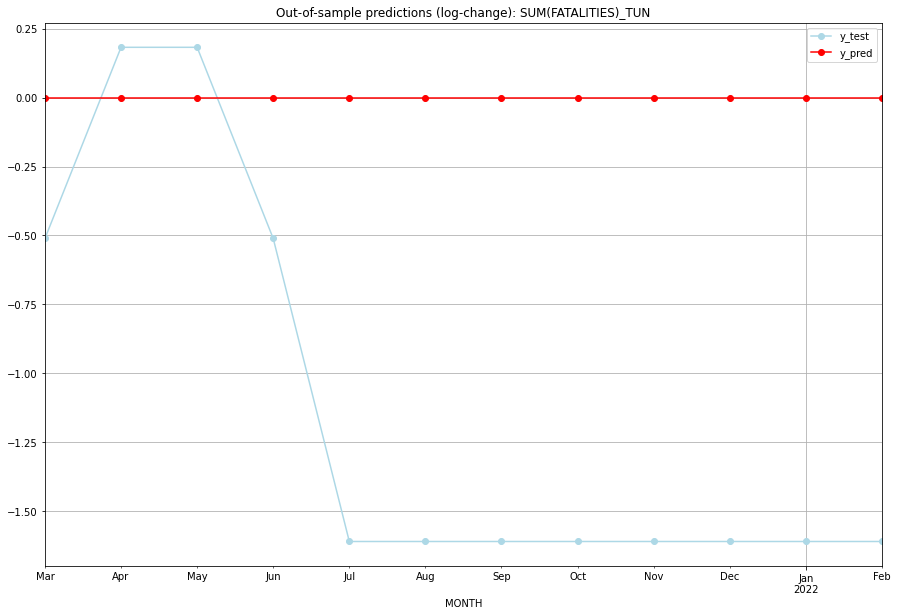

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.609438    1.098612           0.0       -0.510826
1   2021-04  1.609438    1.791759           0.0        0.182322
2   2021-05  1.609438    1.791759           0.0        0.182322
3   2021-06  1.609438    1.098612           0.0       -0.510826
4   2021-07  1.609438    0.000000           0.0       -1.609438
5   2021-08  1.609438    0.000000           0.0       -1.609438
6   2021-09  1.609438    0.000000           0.0       -1.609438
7   2021-10  1.609438    0.000000           0.0       -1.609438
8   2021-11  1.609438    0.000000           0.0       -1.609438
9   2021-12  1.609438    0.000000           0.0       -1.609438
10  2022-01  1.609438    0.000000           0.0       -1.609438
11  2022-02  1.609438    0.000000           0.0       -1.609438
TADDA: 1.1884831383827243
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.609438    1.098612           0.0

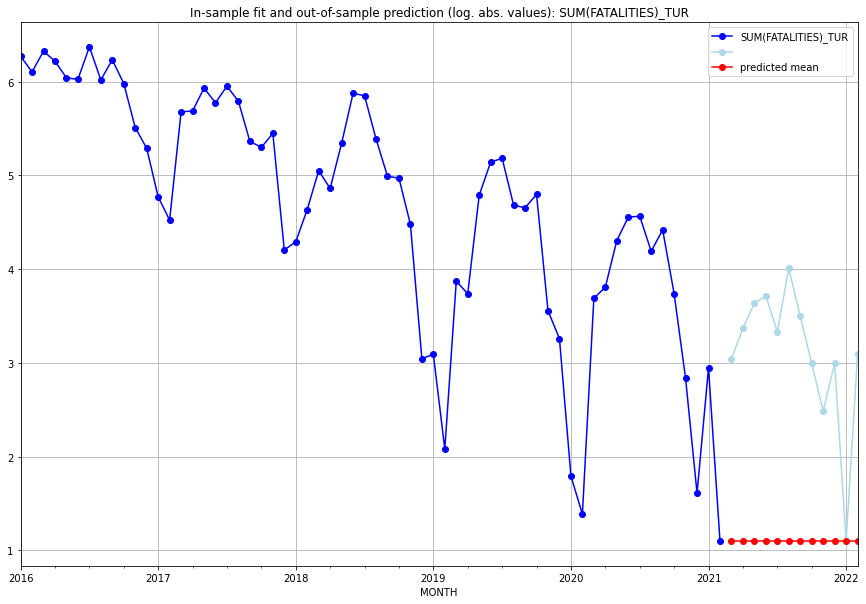

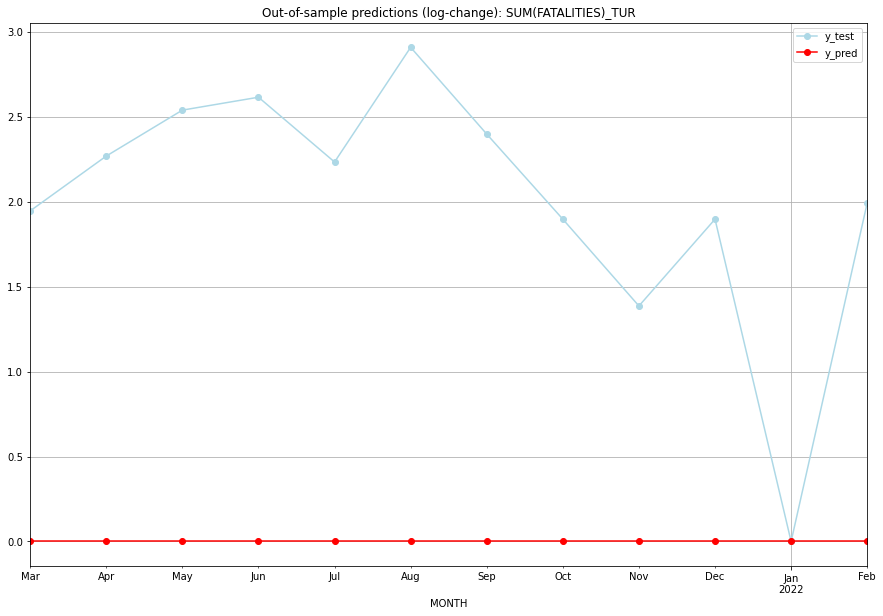

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.098612    3.044522           0.0        1.945910
1   2021-04  1.098612    3.367296           0.0        2.268684
2   2021-05  1.098612    3.637586           0.0        2.538974
3   2021-06  1.098612    3.713572           0.0        2.614960
4   2021-07  1.098612    3.332205           0.0        2.233592
5   2021-08  1.098612    4.007333           0.0        2.908721
6   2021-09  1.098612    3.496508           0.0        2.397895
7   2021-10  1.098612    2.995732           0.0        1.897120
8   2021-11  1.098612    2.484907           0.0        1.386294
9   2021-12  1.098612    2.995732           0.0        1.897120
10  2022-01  1.098612    1.098612           0.0        0.000000
11  2022-02  1.098612    3.091042           0.0        1.992430
TADDA: 2.006808352159986
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.098612    3.044522           0.0 

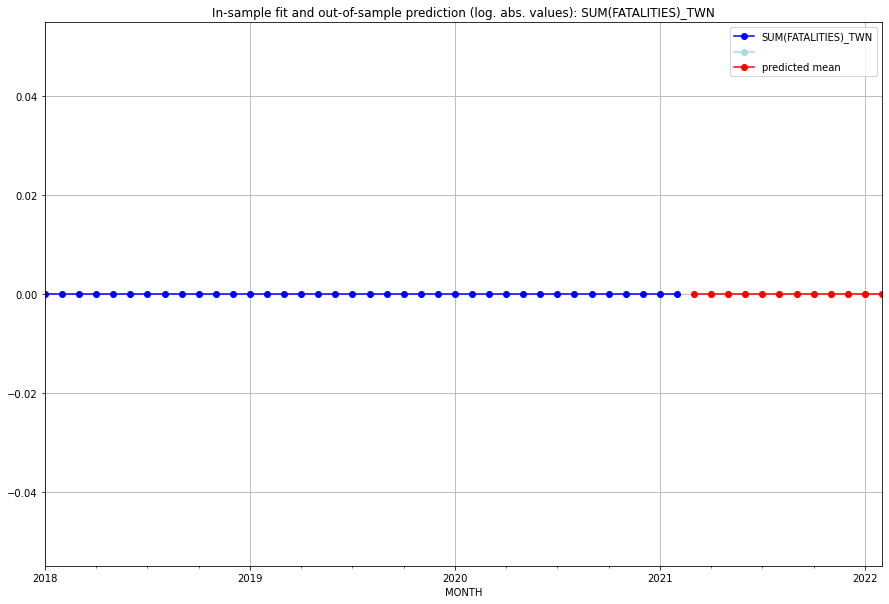

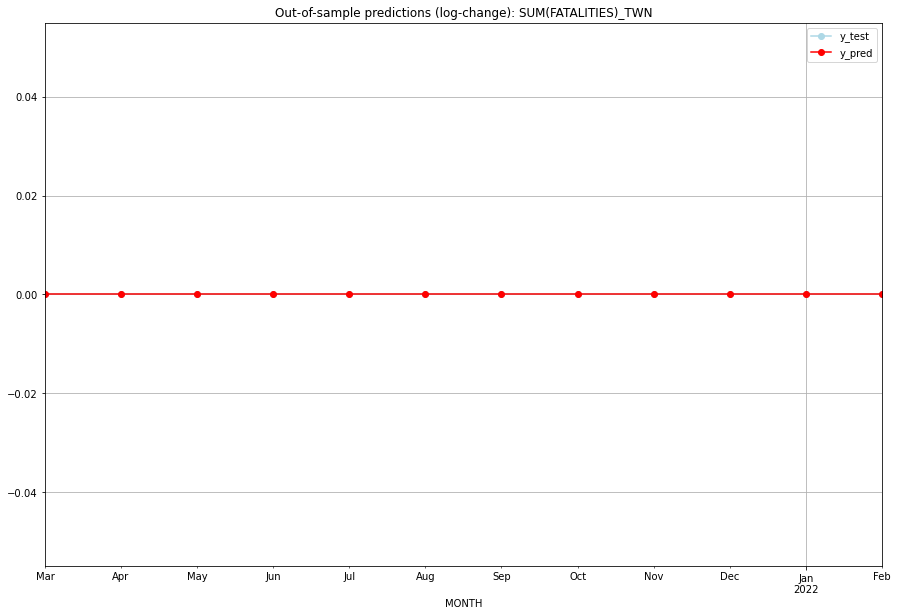

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

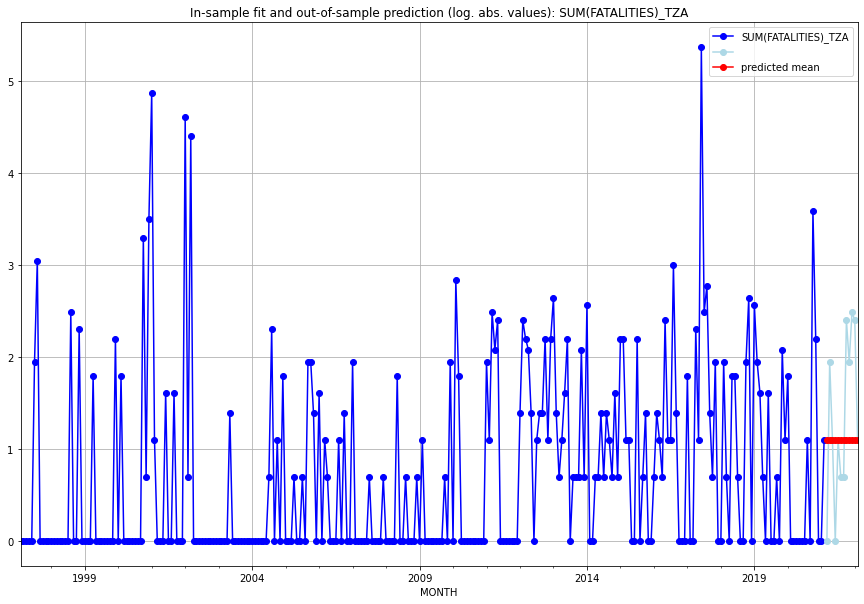

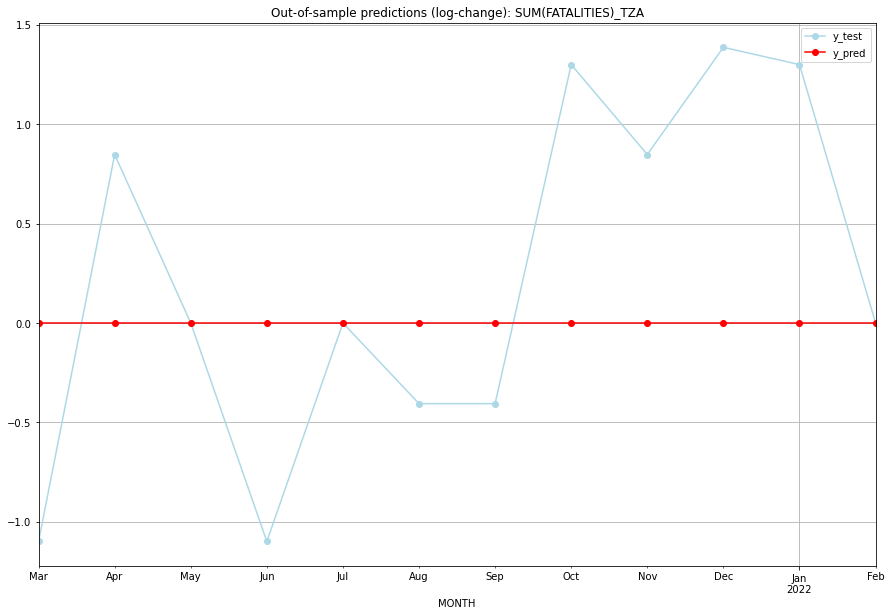

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.098612    0.000000           0.0       -1.098612
1   2021-04  1.098612    1.945910           0.0        0.847298
2   2021-05  1.098612    1.098612           0.0        0.000000
3   2021-06  1.098612    0.000000           0.0       -1.098612
4   2021-07  1.098612    1.098612           0.0        0.000000
5   2021-08  1.098612    0.693147           0.0       -0.405465
6   2021-09  1.098612    0.693147           0.0       -0.405465
7   2021-10  1.098612    2.397895           0.0        1.299283
8   2021-11  1.098612    1.945910           0.0        0.847298
9   2021-12  1.098612    2.484907           0.0        1.386294
10  2022-01  1.098612    2.397895           0.0        1.299283
11  2022-02  1.098612    1.098612           0.0        0.000000
TADDA: 0.7239675703089473
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.098612    0.000000           0.0

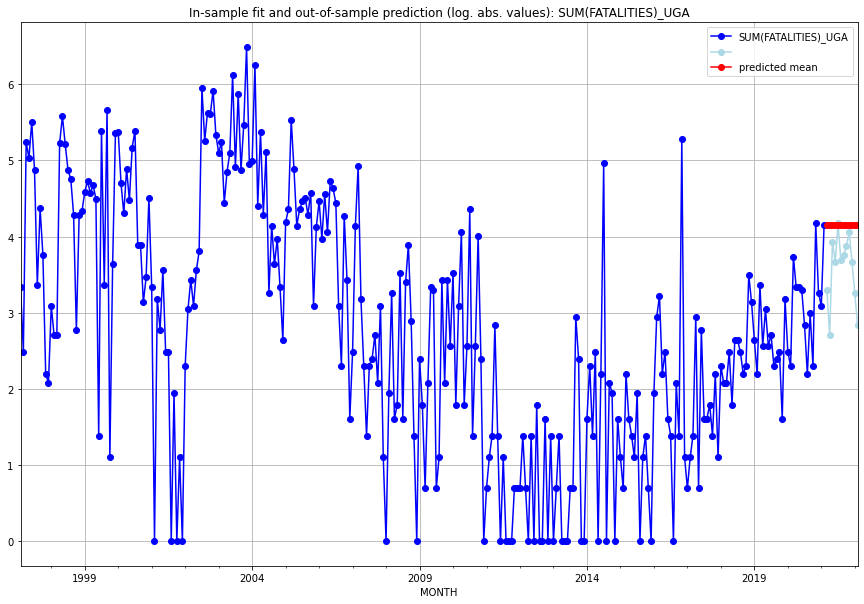

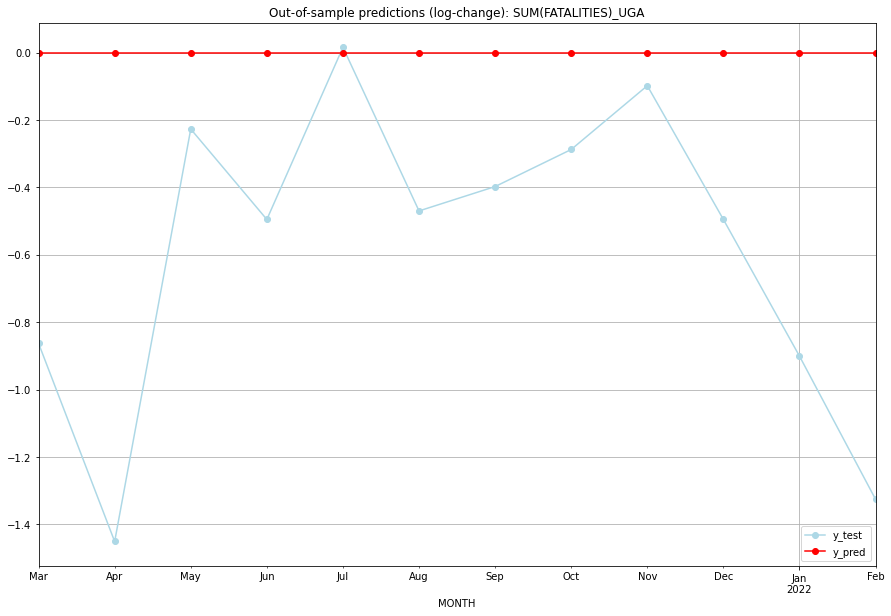

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  4.158883    3.295837           0.0       -0.863046
1   2021-04  4.158883    2.708050           0.0       -1.450833
2   2021-05  4.158883    3.931826           0.0       -0.227057
3   2021-06  4.158883    3.663562           0.0       -0.495321
4   2021-07  4.158883    4.174387           0.0        0.015504
5   2021-08  4.158883    3.688879           0.0       -0.470004
6   2021-09  4.158883    3.761200           0.0       -0.397683
7   2021-10  4.158883    3.871201           0.0       -0.287682
8   2021-11  4.158883    4.060443           0.0       -0.098440
9   2021-12  4.158883    3.663562           0.0       -0.495321
10  2022-01  4.158883    3.258097           0.0       -0.900787
11  2022-02  4.158883    2.833213           0.0       -1.325670
TADDA: 0.5856123865052247
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  4.158883    3.295837           0.0

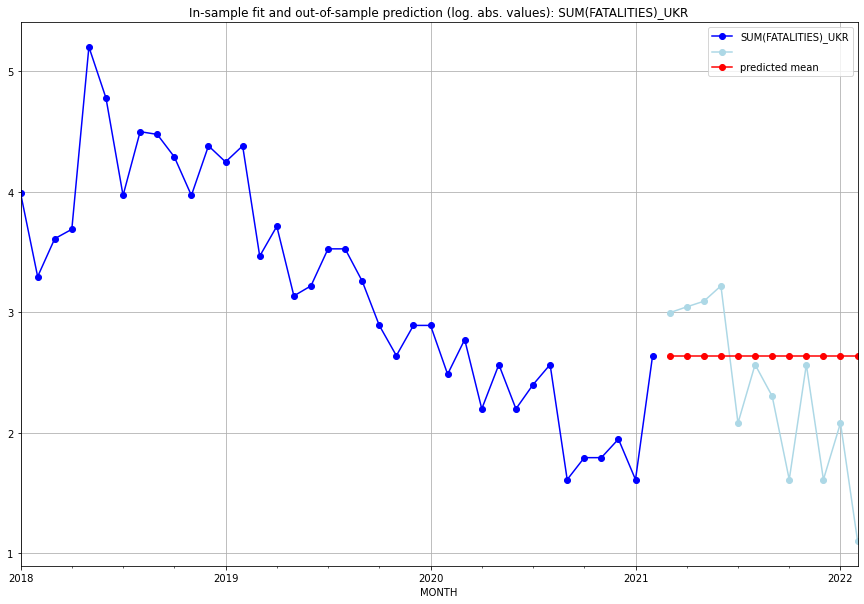

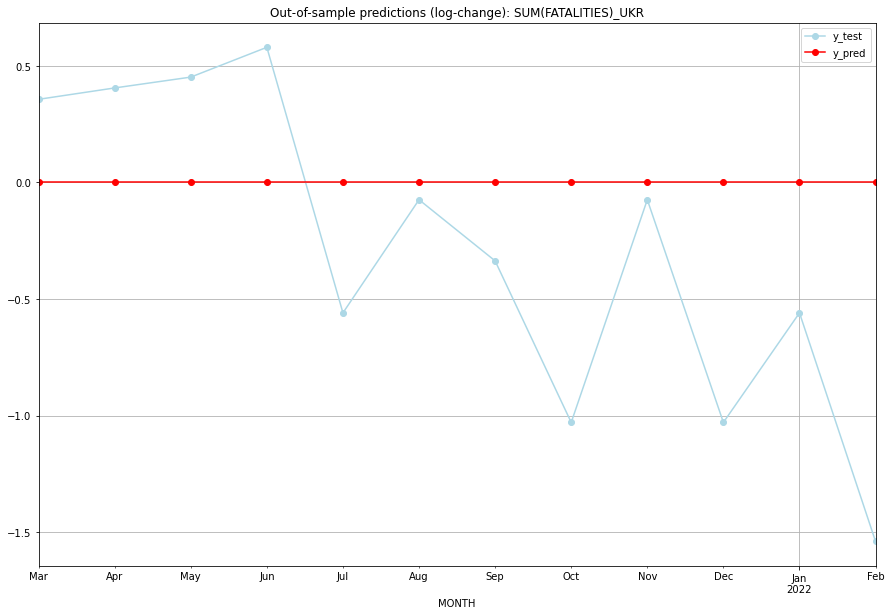

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  2.639057    2.995732           0.0        0.356675
1   2021-04  2.639057    3.044522           0.0        0.405465
2   2021-05  2.639057    3.091042           0.0        0.451985
3   2021-06  2.639057    3.218876           0.0        0.579818
4   2021-07  2.639057    2.079442           0.0       -0.559616
5   2021-08  2.639057    2.564949           0.0       -0.074108
6   2021-09  2.639057    2.302585           0.0       -0.336472
7   2021-10  2.639057    1.609438           0.0       -1.029619
8   2021-11  2.639057    2.564949           0.0       -0.074108
9   2021-12  2.639057    1.609438           0.0       -1.029619
10  2022-01  2.639057    2.079442           0.0       -0.559616
11  2022-02  2.639057    1.098612           0.0       -1.540445
TADDA: 0.5831289419293219
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  2.639057    2.995732           0.0

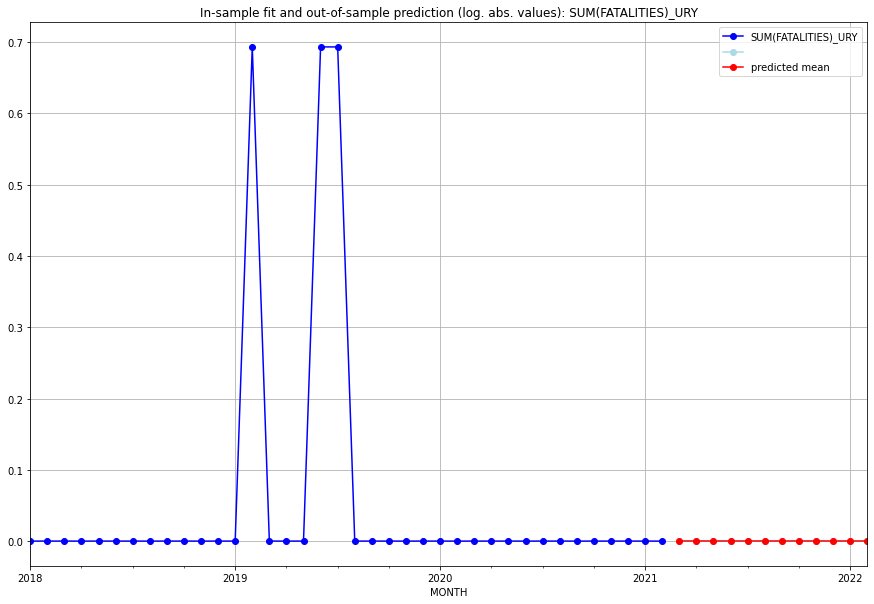

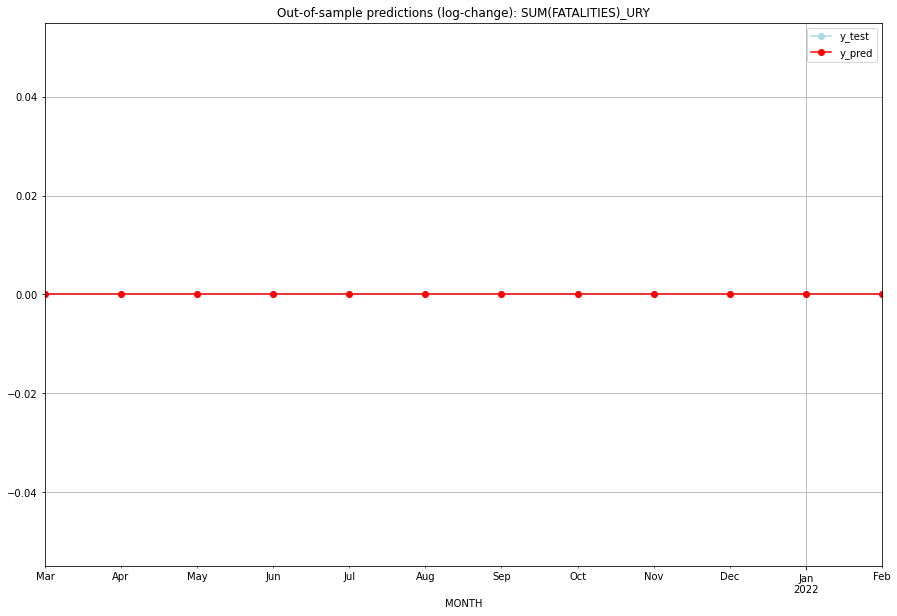

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

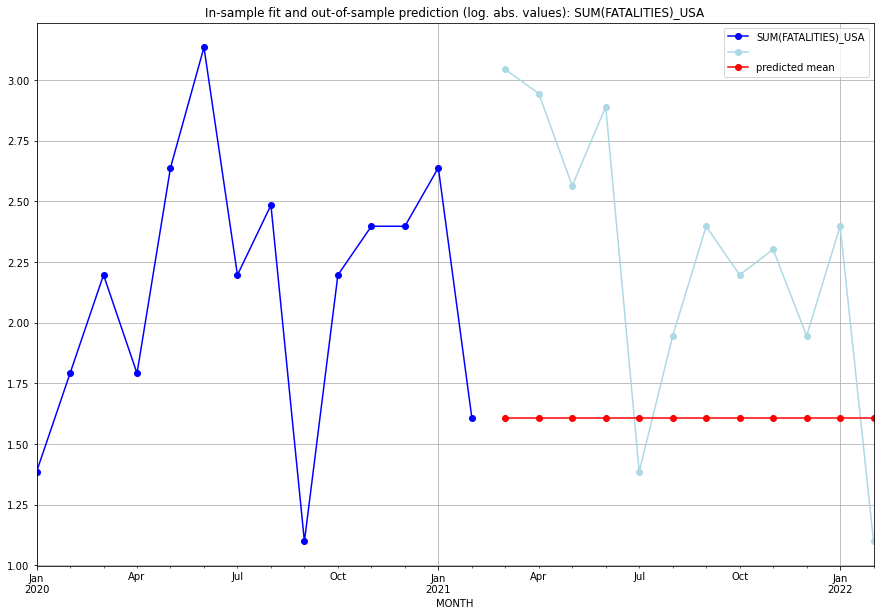

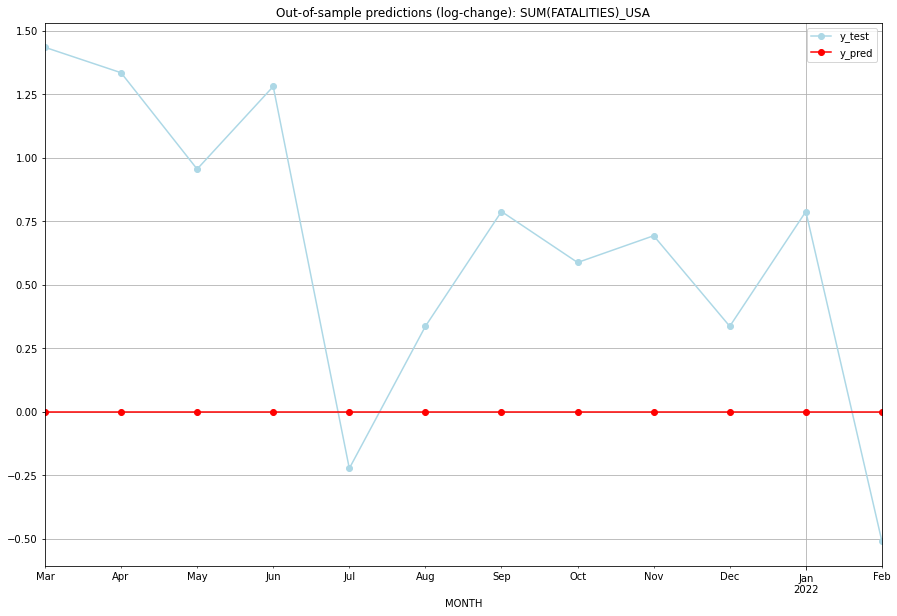

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.609438    3.044522           0.0        1.435085
1   2021-04  1.609438    2.944439           0.0        1.335001
2   2021-05  1.609438    2.564949           0.0        0.955511
3   2021-06  1.609438    2.890372           0.0        1.280934
4   2021-07  1.609438    1.386294           0.0       -0.223144
5   2021-08  1.609438    1.945910           0.0        0.336472
6   2021-09  1.609438    2.397895           0.0        0.788457
7   2021-10  1.609438    2.197225           0.0        0.587787
8   2021-11  1.609438    2.302585           0.0        0.693147
9   2021-12  1.609438    1.945910           0.0        0.336472
10  2022-01  1.609438    2.397895           0.0        0.788457
11  2022-02  1.609438    1.098612           0.0       -0.510826
TADDA: 0.772607758085366
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.609438    3.044522           0.0 

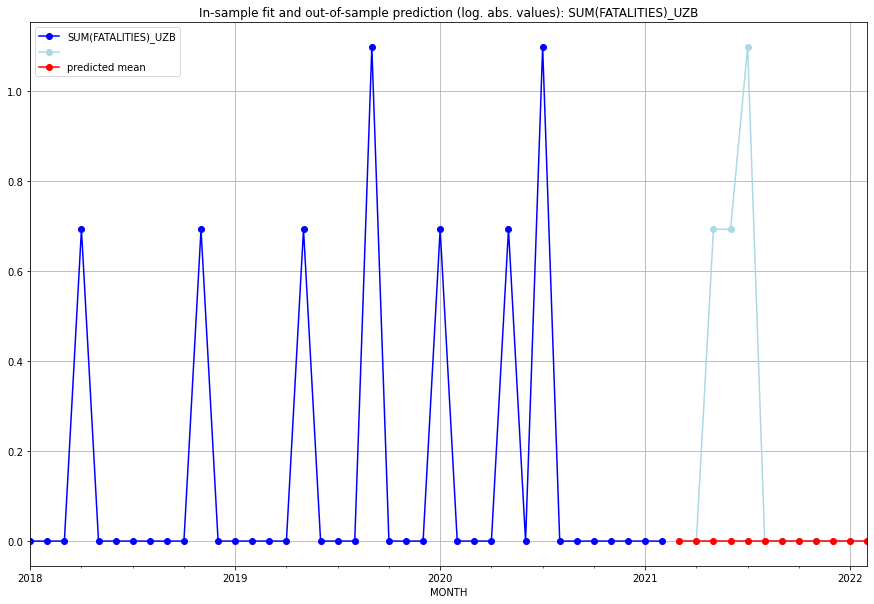

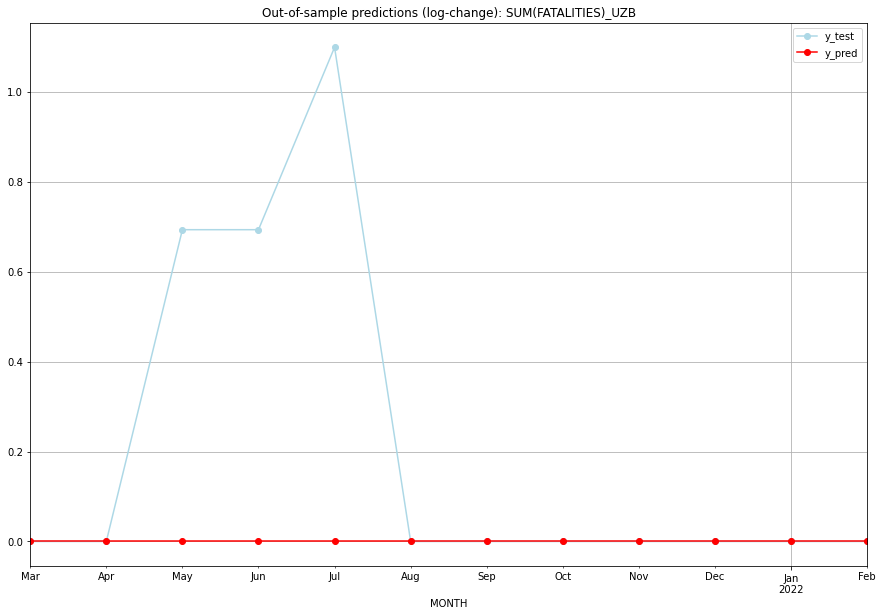

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    0.693147           0.0        0.693147
3   2021-06       0.0    0.693147           0.0        0.693147
4   2021-07       0.0    1.098612           0.0        1.098612
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.000000           0.0        0.000000
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.20707555414900003
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

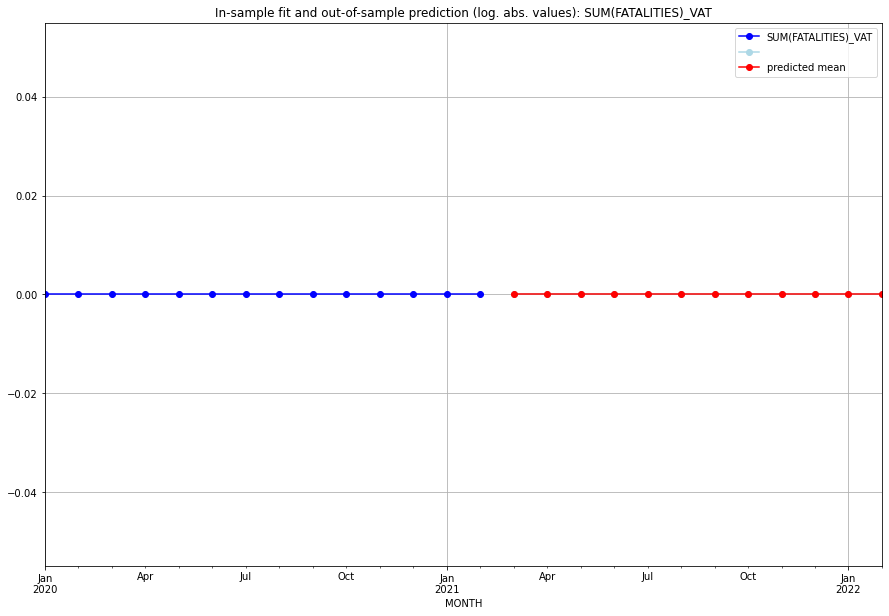

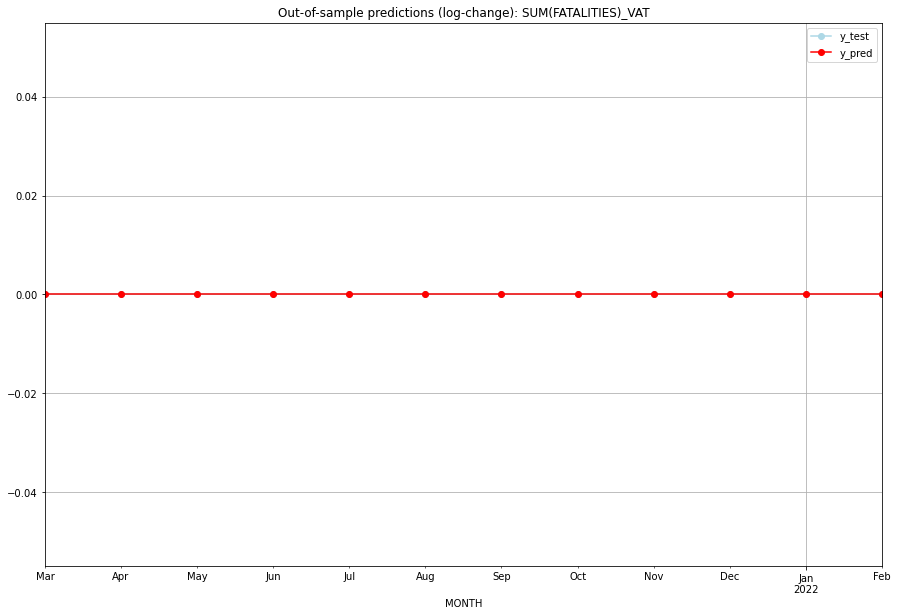

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

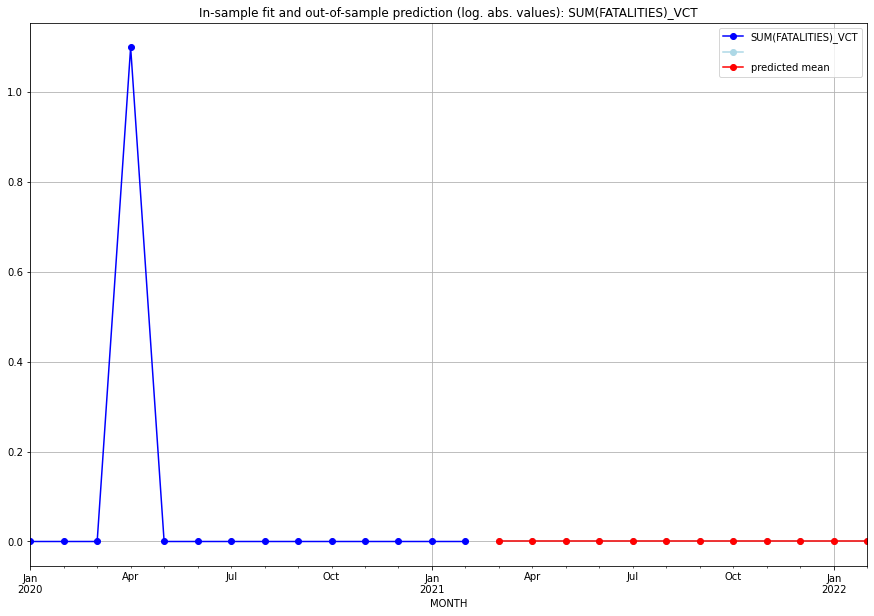

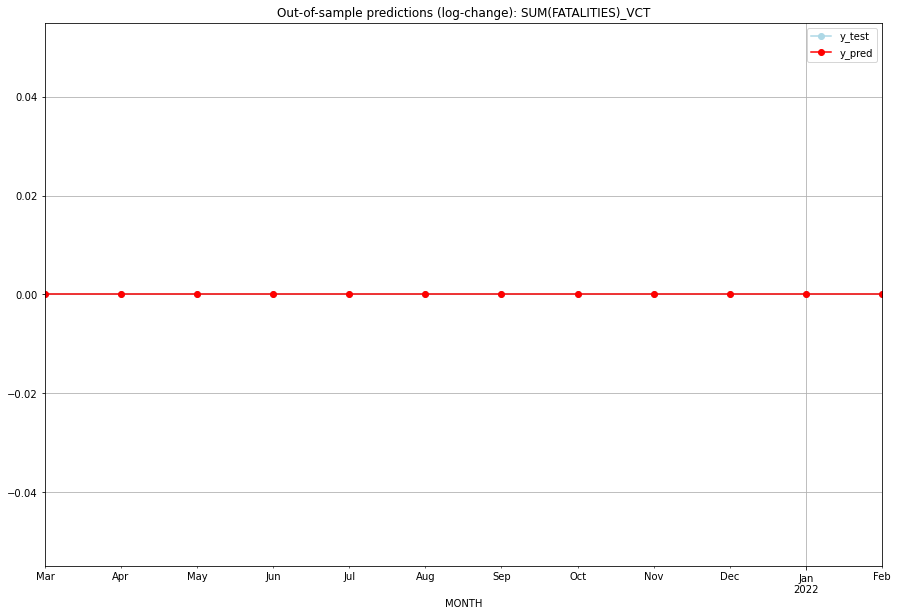

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

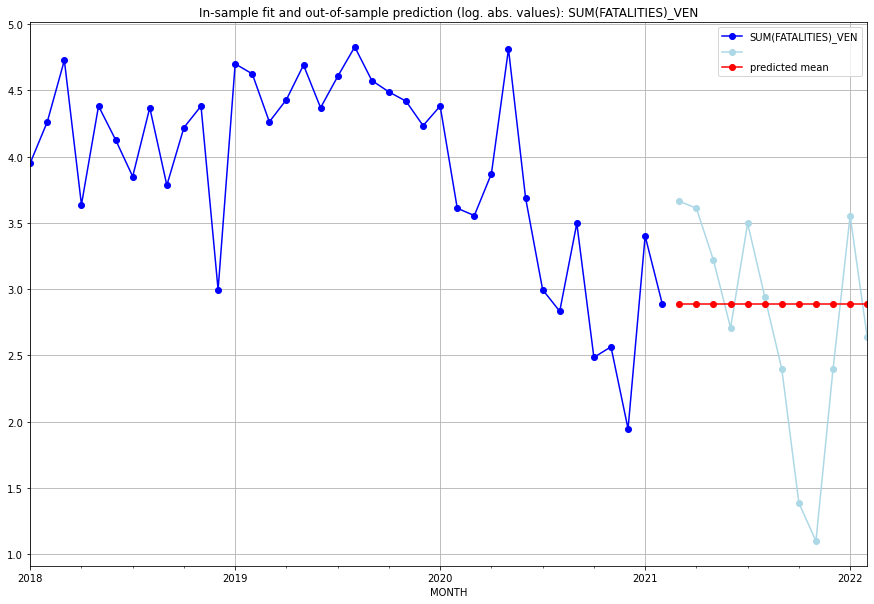

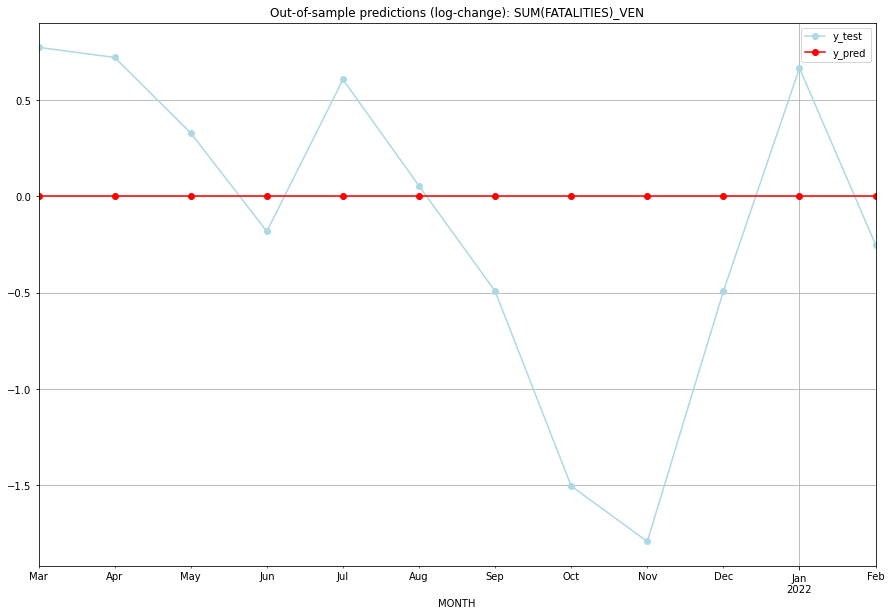

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  2.890372    3.663562           0.0        0.773190
1   2021-04  2.890372    3.610918           0.0        0.720546
2   2021-05  2.890372    3.218876           0.0        0.328504
3   2021-06  2.890372    2.708050           0.0       -0.182322
4   2021-07  2.890372    3.496508           0.0        0.606136
5   2021-08  2.890372    2.944439           0.0        0.054067
6   2021-09  2.890372    2.397895           0.0       -0.492476
7   2021-10  2.890372    1.386294           0.0       -1.504077
8   2021-11  2.890372    1.098612           0.0       -1.791759
9   2021-12  2.890372    2.397895           0.0       -0.492476
10  2022-01  2.890372    3.555348           0.0        0.664976
11  2022-02  2.890372    2.639057           0.0       -0.251314
TADDA: 0.6551537716385162
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  2.890372    3.663562           0.0

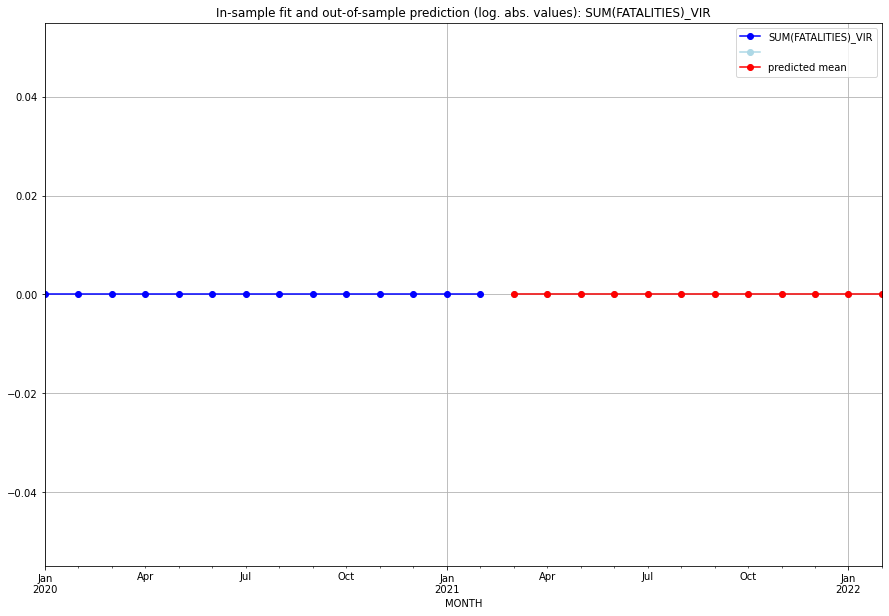

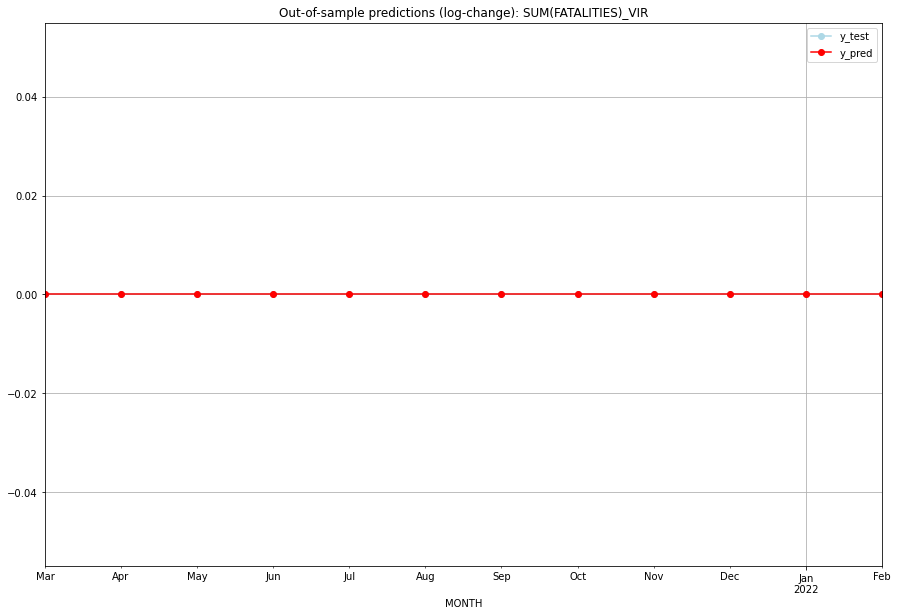

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

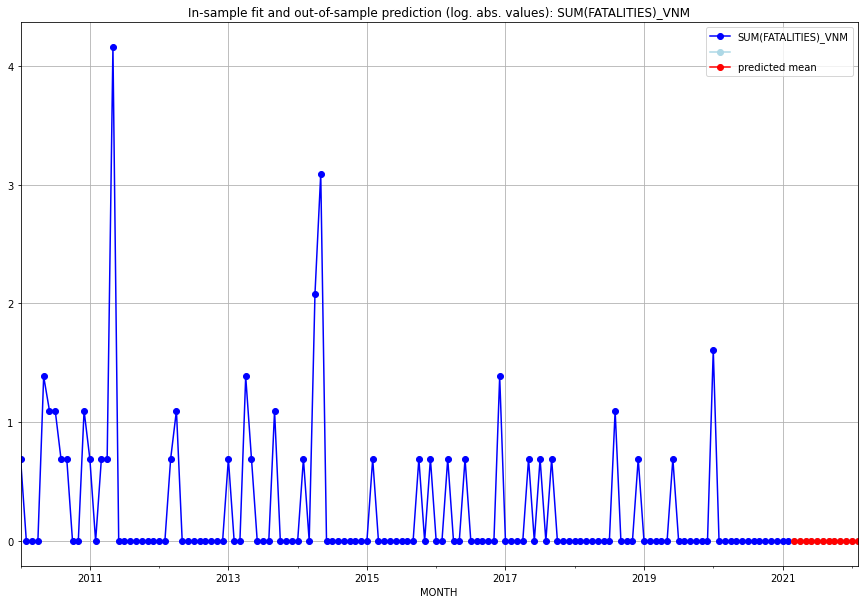

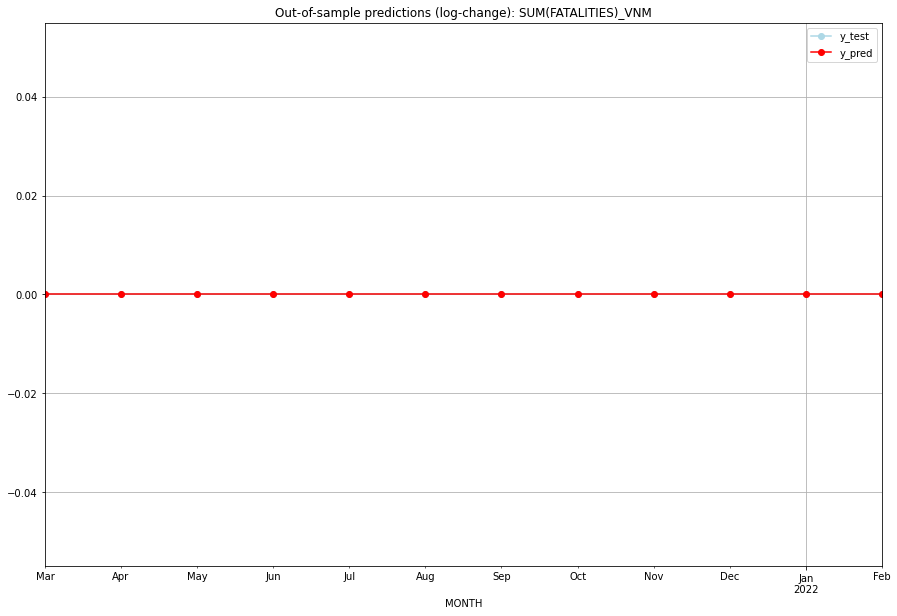

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

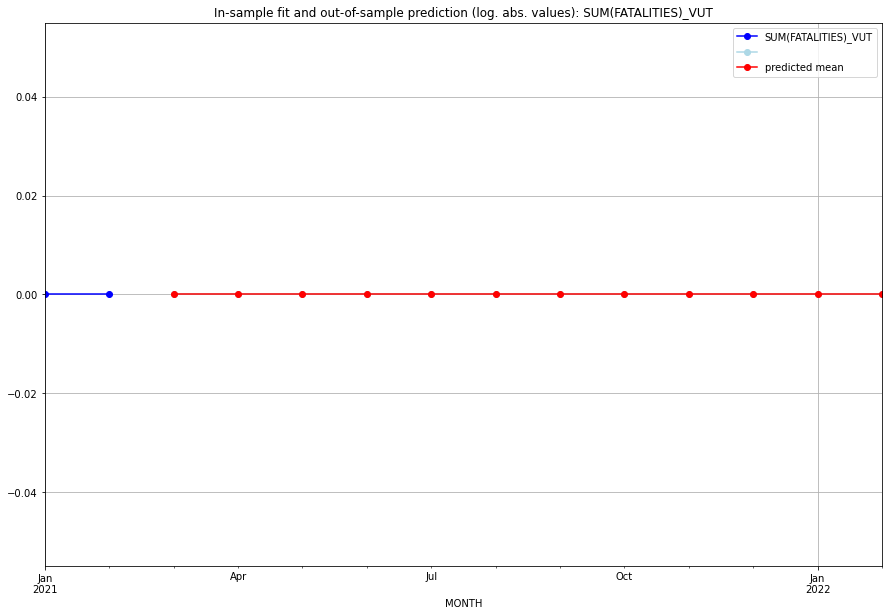

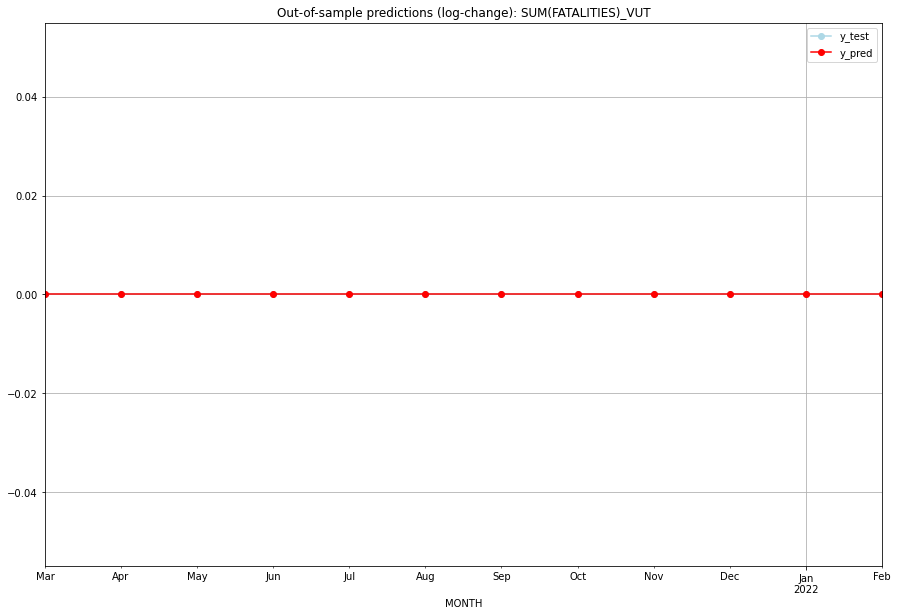

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

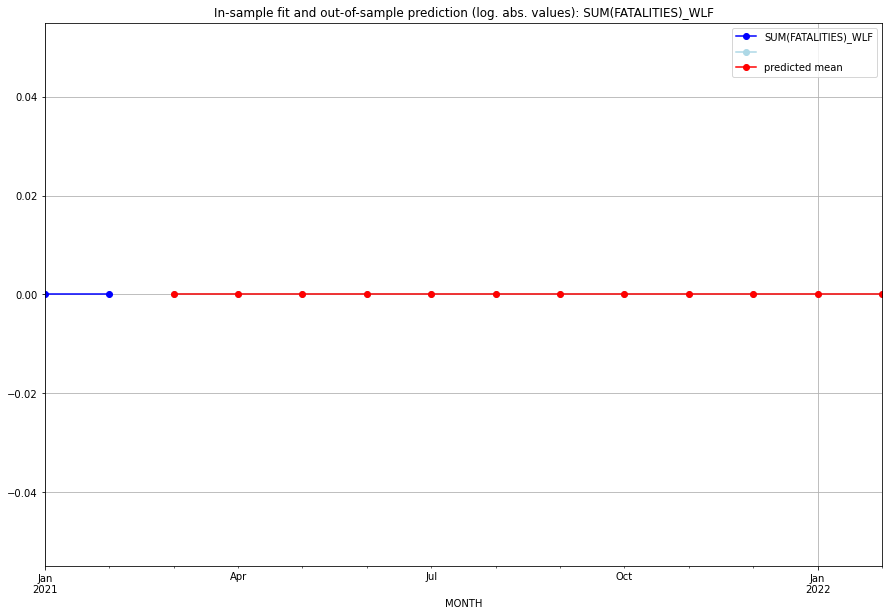

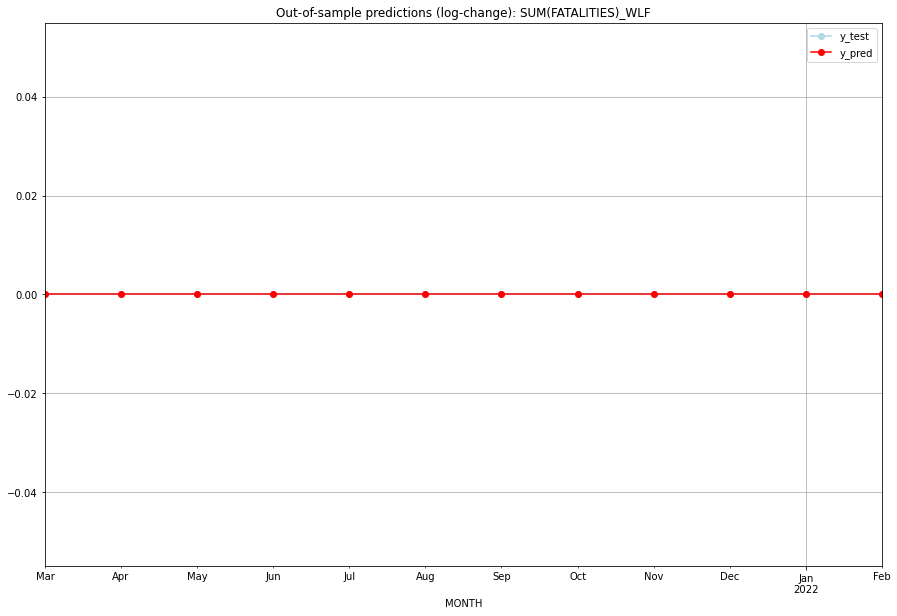

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

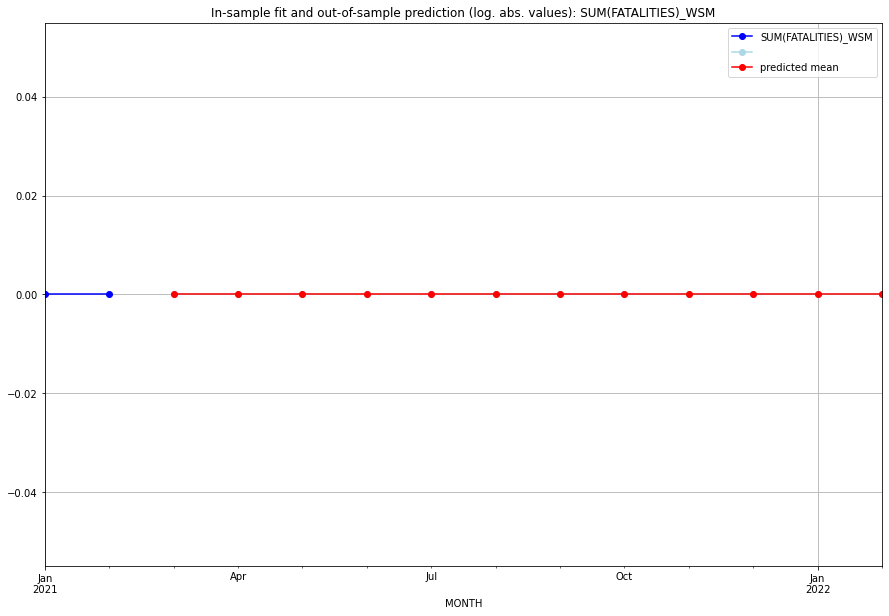

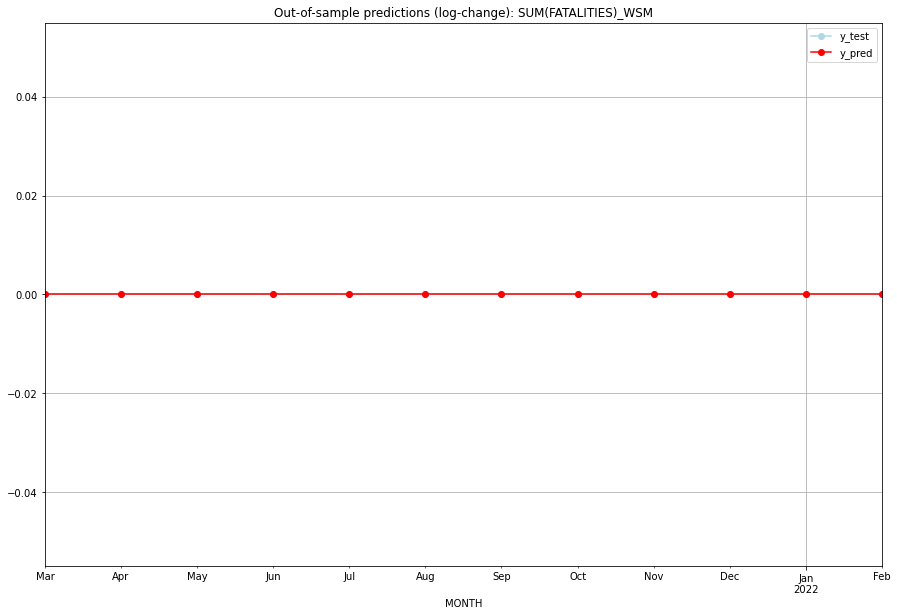

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

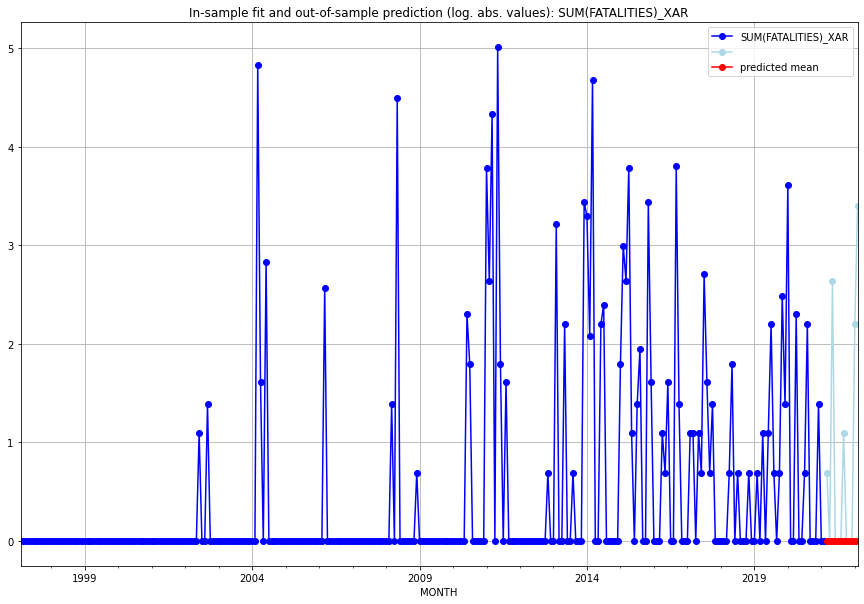

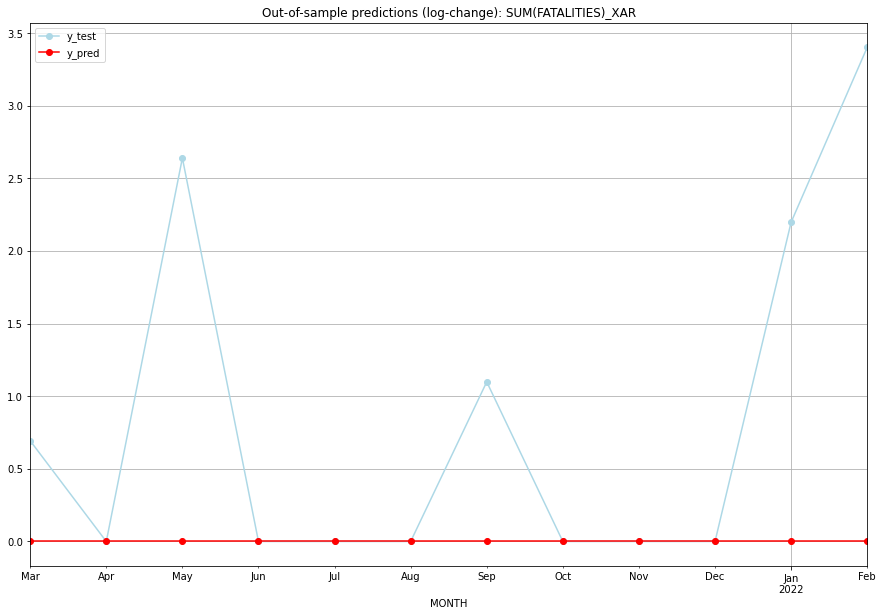

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.693147           0.0        0.693147
1   2021-04       0.0    0.000000           0.0        0.000000
2   2021-05       0.0    2.639057           0.0        2.639057
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    1.098612           0.0        1.098612
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    2.197225           0.0        2.197225
11  2022-02       0.0    3.401197           0.0        3.401197
TADDA: 0.8357698964868074
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.693147           0.0

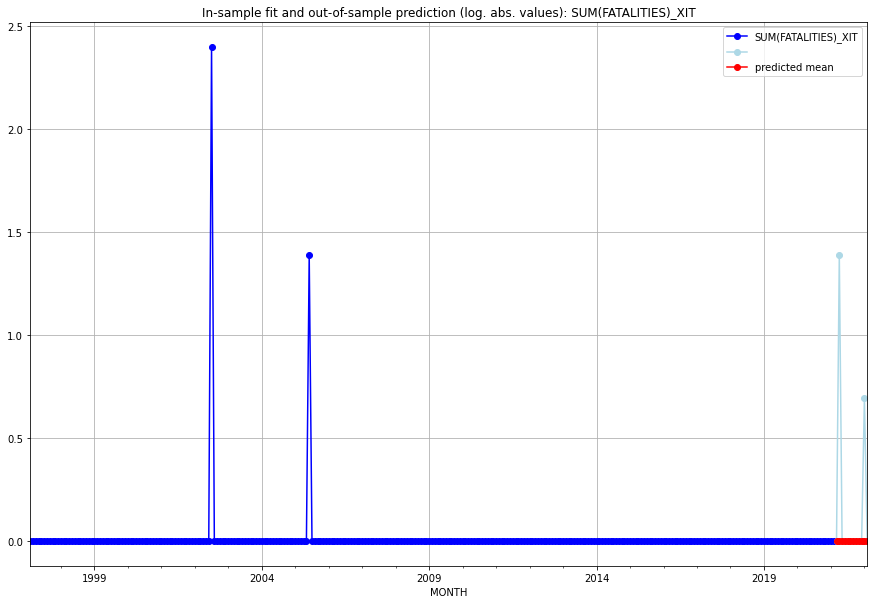

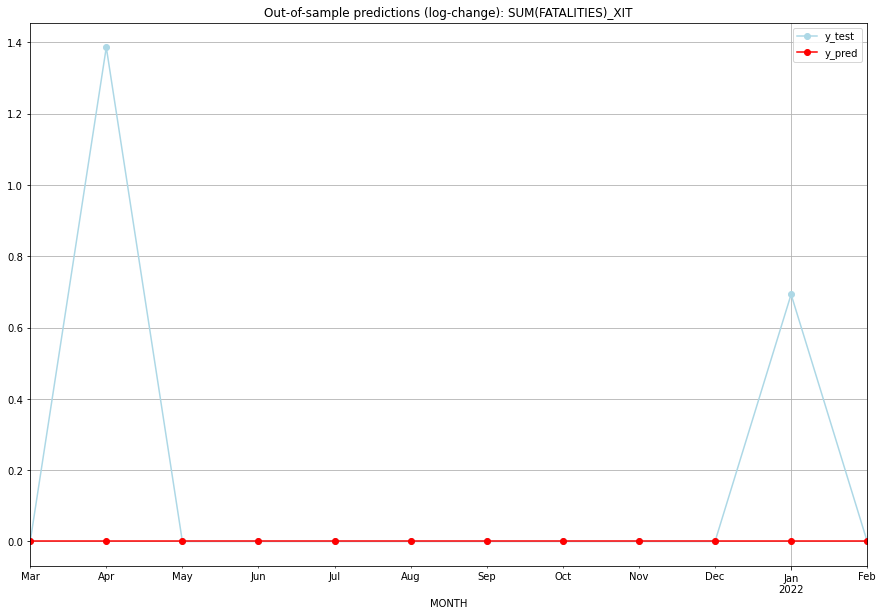

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0    0.000000           0.0        0.000000
1   2021-04       0.0    1.386294           0.0        1.386294
2   2021-05       0.0    0.000000           0.0        0.000000
3   2021-06       0.0    0.000000           0.0        0.000000
4   2021-07       0.0    0.000000           0.0        0.000000
5   2021-08       0.0    0.000000           0.0        0.000000
6   2021-09       0.0    0.000000           0.0        0.000000
7   2021-10       0.0    0.000000           0.0        0.000000
8   2021-11       0.0    0.000000           0.0        0.000000
9   2021-12       0.0    0.000000           0.0        0.000000
10  2022-01       0.0    0.693147           0.0        0.693147
11  2022-02       0.0    0.000000           0.0        0.000000
TADDA: 0.17328679513998632
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0    0.000000           0.

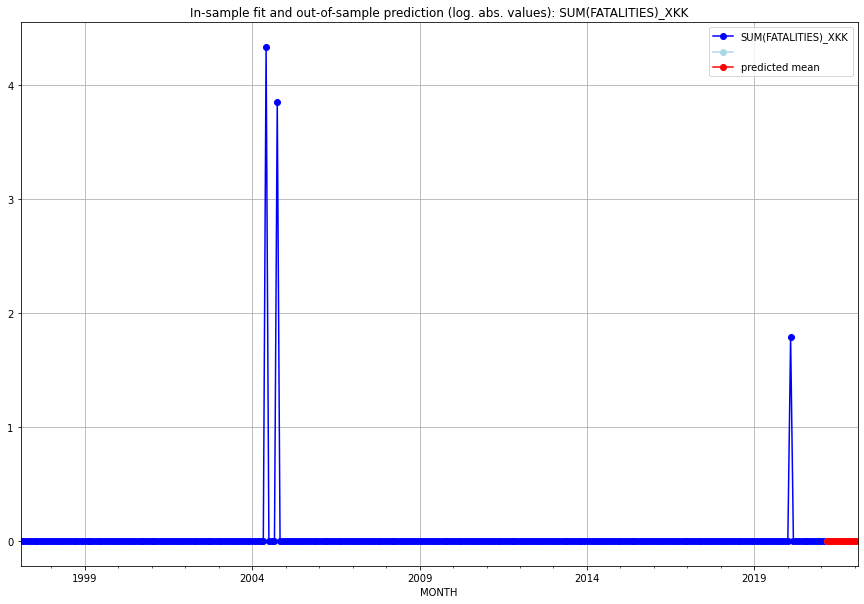

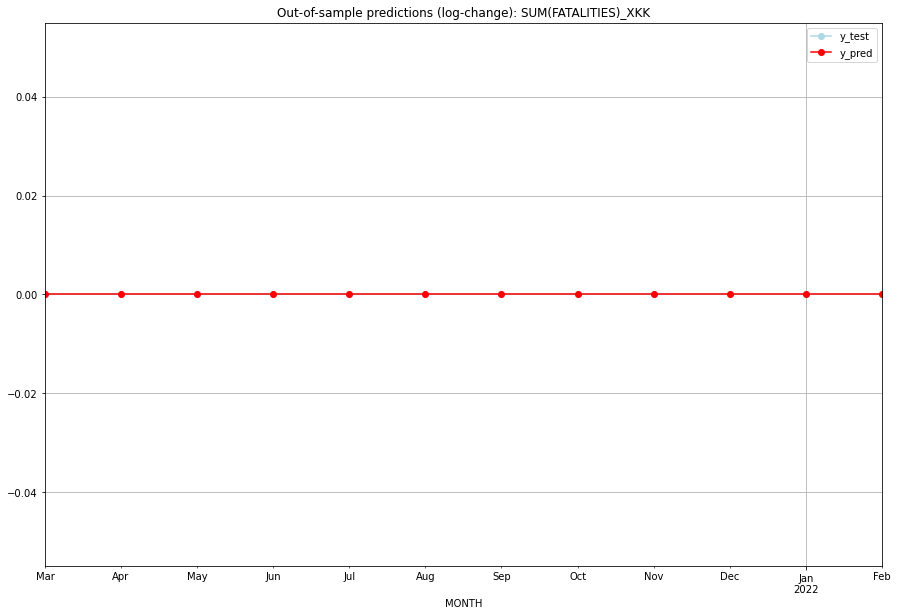

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

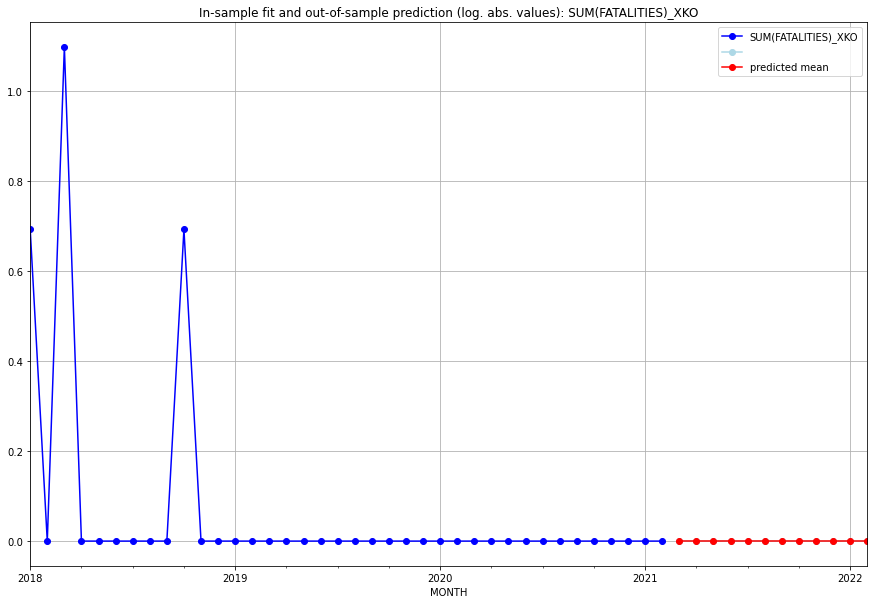

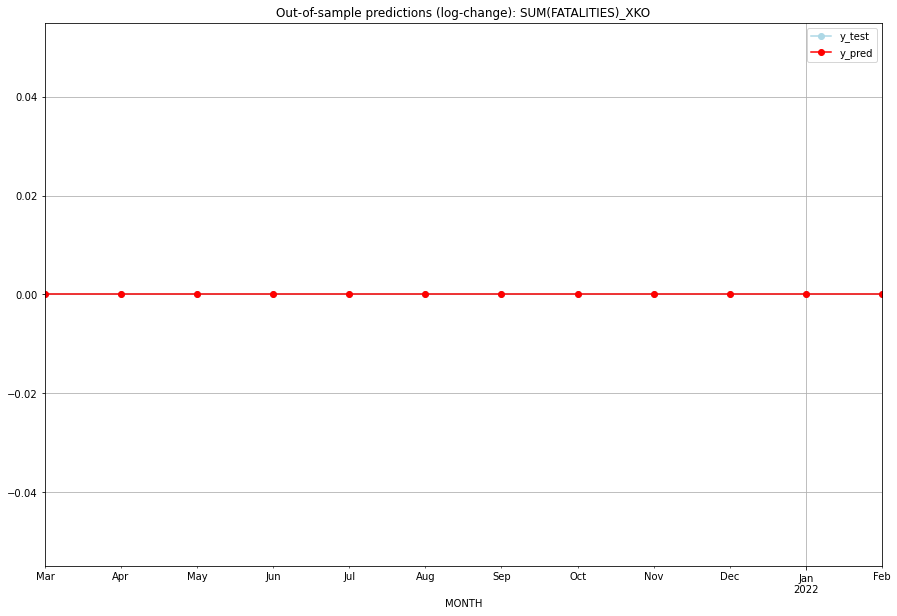

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

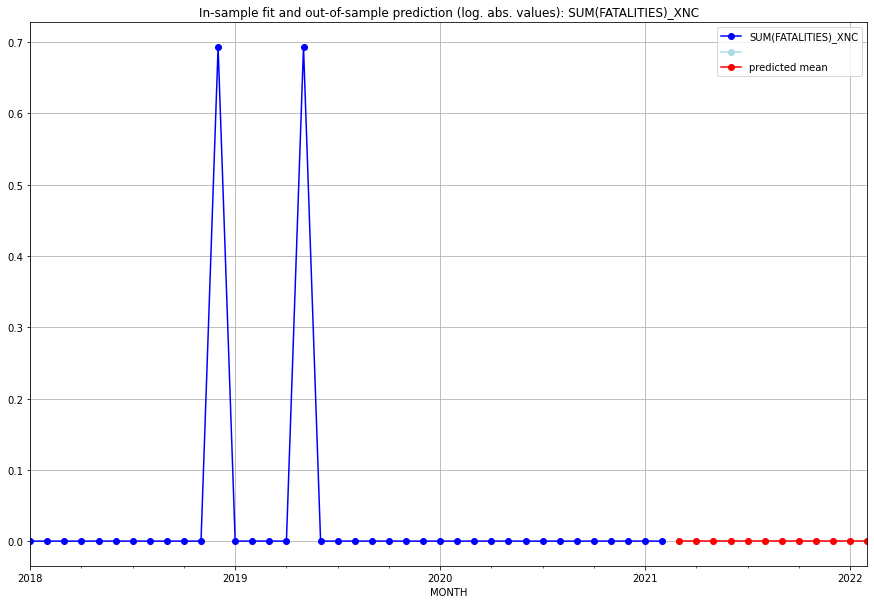

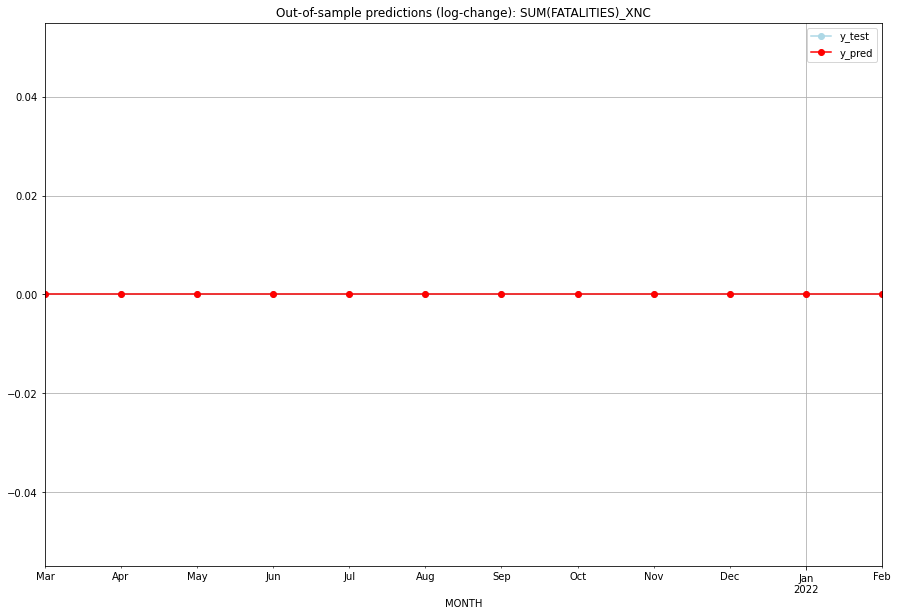

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03       0.0         0.0           0.0             0.0
1   2021-04       0.0         0.0           0.0             0.0
2   2021-05       0.0         0.0           0.0             0.0
3   2021-06       0.0         0.0           0.0             0.0
4   2021-07       0.0         0.0           0.0             0.0
5   2021-08       0.0         0.0           0.0             0.0
6   2021-09       0.0         0.0           0.0             0.0
7   2021-10       0.0         0.0           0.0             0.0
8   2021-11       0.0         0.0           0.0             0.0
9   2021-12       0.0         0.0           0.0             0.0
10  2022-01       0.0         0.0           0.0             0.0
11  2022-02       0.0         0.0           0.0             0.0
TADDA: 0.0
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01       0.0         0.0           0.0             0.

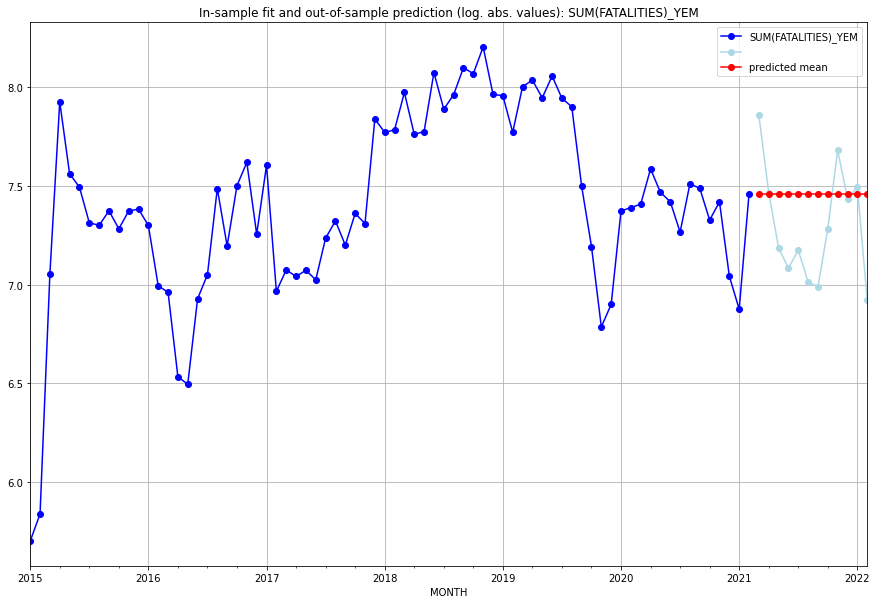

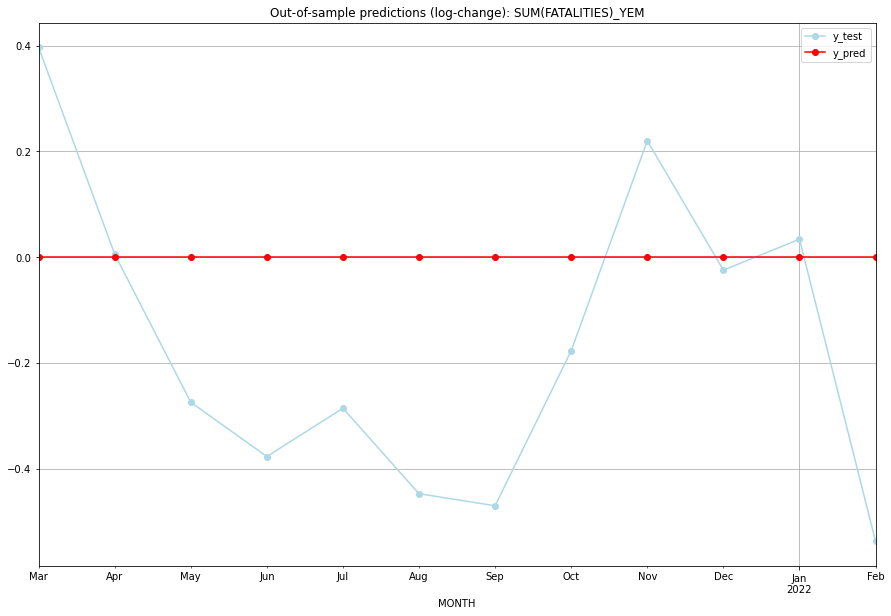

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03   7.46049    7.857481           0.0        0.396990
1   2021-04   7.46049    7.466228           0.0        0.005737
2   2021-05   7.46049    7.186144           0.0       -0.274346
3   2021-06   7.46049    7.083388           0.0       -0.377102
4   2021-07   7.46049    7.174724           0.0       -0.285766
5   2021-08   7.46049    7.013016           0.0       -0.447475
6   2021-09   7.46049    6.990257           0.0       -0.470234
7   2021-10   7.46049    7.283448           0.0       -0.177042
8   2021-11   7.46049    7.680637           0.0        0.220147
9   2021-12   7.46049    7.436028           0.0       -0.024462
10  2022-01   7.46049    7.494430           0.0        0.033940
11  2022-02   7.46049    6.922644           0.0       -0.537846
TADDA: 0.2709240433624989
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01   7.46049    7.857481           0.0

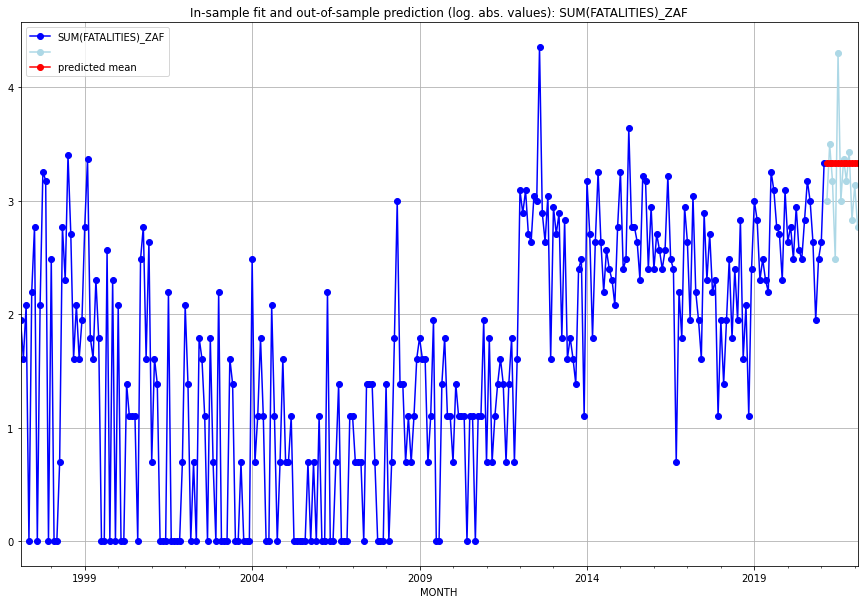

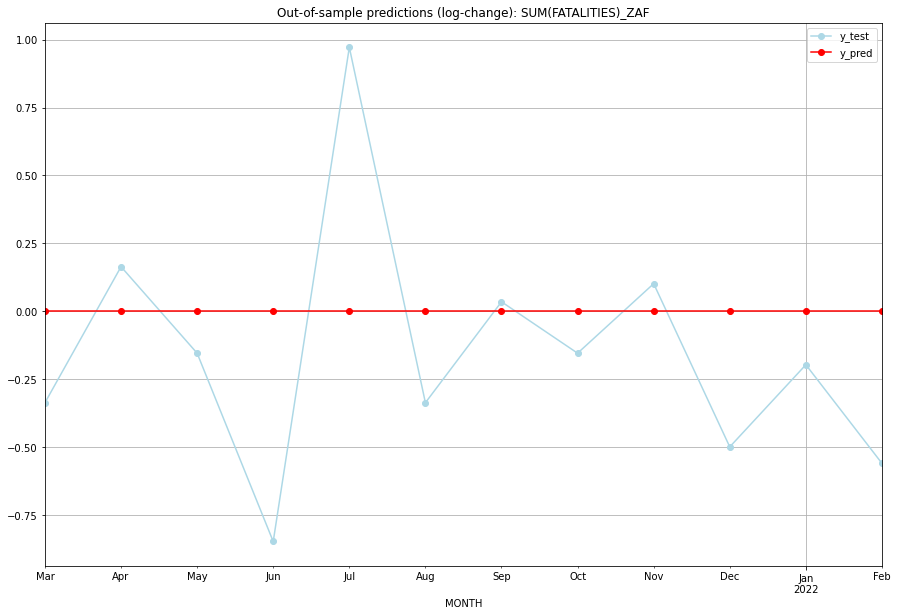

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  3.332205    2.995732           0.0       -0.336472
1   2021-04  3.332205    3.496508           0.0        0.164303
2   2021-05  3.332205    3.178054           0.0       -0.154151
3   2021-06  3.332205    2.484907           0.0       -0.847298
4   2021-07  3.332205    4.304065           0.0        0.971861
5   2021-08  3.332205    2.995732           0.0       -0.336472
6   2021-09  3.332205    3.367296           0.0        0.035091
7   2021-10  3.332205    3.178054           0.0       -0.154151
8   2021-11  3.332205    3.433987           0.0        0.101783
9   2021-12  3.332205    2.833213           0.0       -0.498991
10  2022-01  3.332205    3.135494           0.0       -0.196710
11  2022-02  3.332205    2.772589           0.0       -0.559616
TADDA: 0.36307488250217207
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  3.332205    2.995732           0.

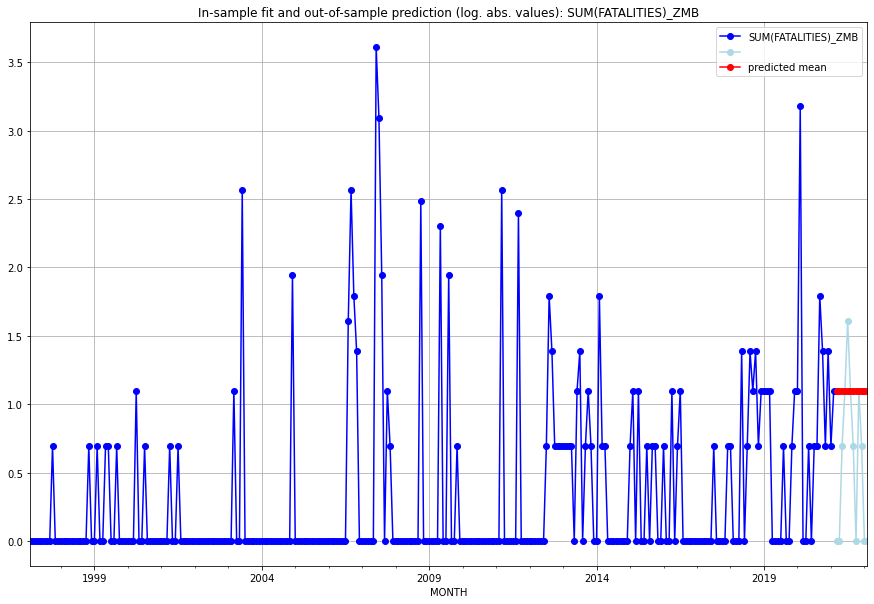

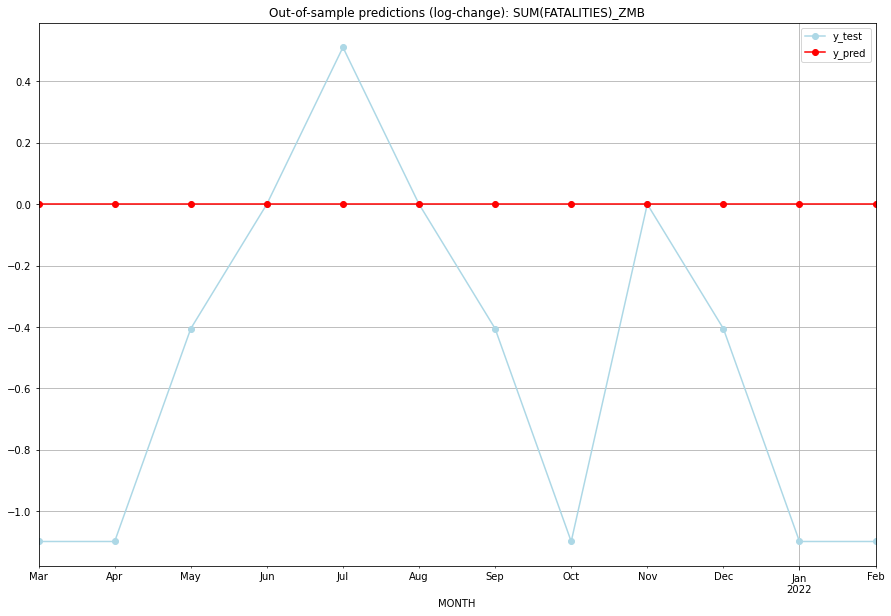

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.098612    0.000000           0.0       -1.098612
1   2021-04  1.098612    0.000000           0.0       -1.098612
2   2021-05  1.098612    0.693147           0.0       -0.405465
3   2021-06  1.098612    1.098612           0.0        0.000000
4   2021-07  1.098612    1.609438           0.0        0.510826
5   2021-08  1.098612    1.098612           0.0        0.000000
6   2021-09  1.098612    0.693147           0.0       -0.405465
7   2021-10  1.098612    0.000000           0.0       -1.098612
8   2021-11  1.098612    1.098612           0.0        0.000000
9   2021-12  1.098612    0.693147           0.0       -0.405465
10  2022-01  1.098612    0.000000           0.0       -1.098612
11  2022-02  1.098612    0.000000           0.0       -1.098612
TADDA: 0.6016901992859195
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.098612    0.000000           0.0

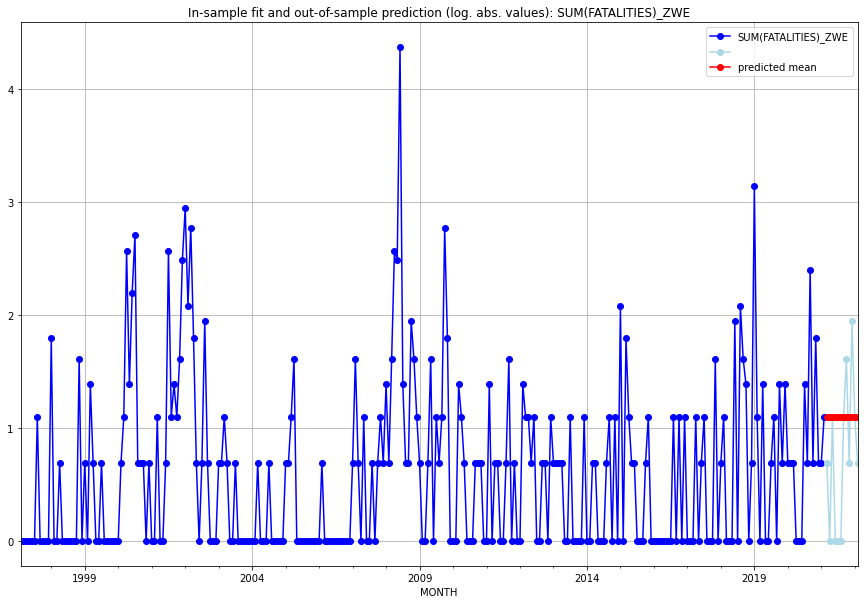

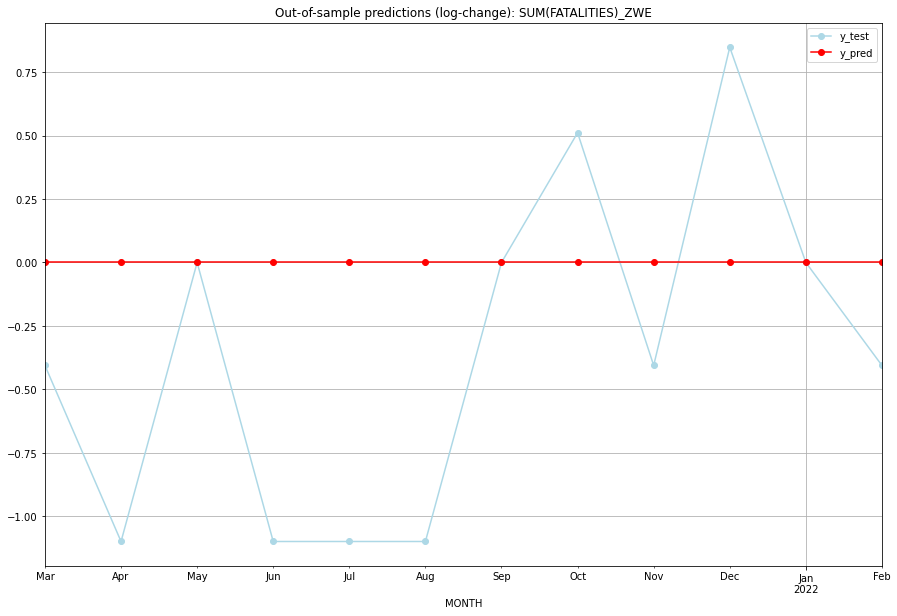

      MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL)
0   2021-03  1.098612    0.693147           0.0       -0.405465
1   2021-04  1.098612    0.000000           0.0       -1.098612
2   2021-05  1.098612    1.098612           0.0        0.000000
3   2021-06  1.098612    0.000000           0.0       -1.098612
4   2021-07  1.098612    0.000000           0.0       -1.098612
5   2021-08  1.098612    0.000000           0.0       -1.098612
6   2021-09  1.098612    1.098612           0.0        0.000000
7   2021-10  1.098612    1.609438           0.0        0.510826
8   2021-11  1.098612    0.693147           0.0       -0.405465
9   2021-12  1.098612    1.945910           0.0        0.847298
10  2022-01  1.098612    1.098612           0.0        0.000000
11  2022-02  1.098612    0.693147           0.0       -0.405465
TADDA: 0.5807473302625106
Evaluation finished.
        MONTH  FAT_PRED  FAT_ACTUAL  LC(FAT_PRED)  LC(FAT_ACTUAL) GID_0
0  2021-03-01  1.098612    0.693147           0.0

In [7]:
# warnings.simplefilter(action='ignore')

varimax_res = pd.DataFrame(columns=["MONTH", "FAT_PRED", "FAT_ACTUAL", "LC(FAT_PRED)", "LC(FAT_ACTUAL)", "GID_0", "PARAMETERS", "TIMESTAMP"])
csv_file = "../data/"+MODEL_NAME+"_PREDICTIONS.csv"

if os.path.exists(csv_file):
    existing_res = pd.read_csv("../data/"+MODEL_NAME+"_PREDICTIONS.csv")
    # print(existing_res)
    print("File exists.")
    
else:
    varimax_res.to_csv(csv_file, index=False, mode="a", header=True)
    existing_res = varimax_res

for i, g in enumerate(gid_list):
# for i, g in enumerate(["XNC"]):
    print("######## "+g+" ("+str(i+1)+"/"+str(len(gid_list))+") #########")
    # print(existing_res[existing_res["GID_0"] == g])
    print(len(existing_res[existing_res["GID_0"] == g]))
    
    
    # skip country if results already exist
    if len(existing_res[existing_res["GID_0"] == g]) > 0:
        print("Model for this country has already been fitted.")
        continue
    
    # add time series of neighboring  countries as predictor variables
    if NEIGHBORS == True:
        neighbor = gid0_neighbors[gid0_neighbors["GID_0"] == g]["NEIGHBOUR"].tolist()
    else:
        neighbor = []
    print("Neighbor countries: "+ str(neighbor))

    # measure time 
    st = time.time()

    res = varimax(target_variable = TARGET_VARIABLE,
                  target_country = g,
                  predictor_countries = neighbor,
                  n_lags_X = N_LAGS_X,
                  seasonal_periodicity = SEASONAL_PERIODICITY)

    # append country results to csv with timestamp
    res["TIMESTAMP"] = datetime.datetime.now()
    
    res.to_csv(csv_file, index=False, mode="a", header=False)

    et = time.time()
    elapsed_time = et - st
    print('Execution time:', time.strftime("%M:%S", time.gmtime(elapsed_time)))

    varimax_res = pd.concat([varimax_res, res], ignore_index=True)

    # break

In [8]:
# varimax_res.to_csv("../data/"+MODEL_NAME+"_PREDICTIONS.csv", index=False)

In [ ]:
varimax_res